# Libraries

In [ ]:
## Load basic libs
from urllib.request import urlopen
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
import io
import matplotlib.font_manager as fm
from sklearn.linear_model import LinearRegression
from decimal import Decimal
from io import StringIO
import requests
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')



#Colors

In [ ]:
# ============================================================================
# ESPRESSO CHARTS STYLE CONFIG
# ============================================================================
color_blue = '#3F5B83'
color_orange = '#DD6B20'#'#A14516'
color_green = '#4D5523'
color_sand = '#CDAF7B'
faceColor = '#F5F0E6'


#FRED API Call

In [ ]:

def fetch_fred_series(series_id, start_date="2010-01-01"):
    url = "https://api.stlouisfed.org/fred/series/observations"
    params = {
        "series_id": series_id,
        "api_key": "c1cfbb198a1651220d22ae768fde31ce",
        "file_type": "json",
        "observation_start": start_date,
    }

    data = requests.get(url, params=params).json()
    print(f"Data: {data}")
    df = pd.DataFrame(data["observations"])[["date", "value"]]
    df["date"] = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    df["series_id"] = series_id

    return df


# Indexing to 100

In [ ]:
def rebase_to_100(df, base_date="2019-01-01", value_col="value"):
    base_value = df.loc[df["date"] == base_date, value_col].iloc[0]
    df = df.copy()
    df[f"{value_col}_{str(base_date)}"] = (df[value_col] / base_value) * 100
    return df


In [ ]:
def save_chart(fig, path, dpi=200):
    """Save chart with locked dimensions. Never uses bbox_inches='tight'."""
    fig.savefig(path, dpi=dpi, bbox_inches=None, pad_inches=0, facecolor=fig.get_facecolor())


# Chart: Single Bar

In [ ]:
def eSingleBarChartNew(
    dfChart,
    colDim,
    colMeasure,
    txtTitle,
    txtSup,
    txtLabel,
    posText=None,                 # kept for API parity
    posLabel=-1,                  # parity with multi-line
    numFormat="{:.0f}",
    numDivisor=1,                 # not used here but parity-friendly
    barHeight=None,
    barColor=None,
    hideLeftSpine=False,
    offsetLabelX=0,               # extra px offset for category labels on bars
    minVal=None,
    maxVal=None,
    factorLimitX=1.0,
    aspectRatio=None,
    labelCustomOffset=None,       # dict {index: offset} for value label x positioning
    valueCustomOffset=None,       # NEW: dict {index: offset} for individual value x positioning
    title_size = 14,
    subtitle_size = 12,
    label_size = 12,

    # --- THEME (coffee) ---
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',      # align name with multi-line
    tickLabelColor='#3c3325',     # category label on bars
    valueLabelColor='#4b2e1a',    # numeric label at bar end
    faceColor='#f5f0e6',
    coffeePalette=('#9d8561','#857052','#6c5c43','#544734','#3c3325','#79664a','#d9d0c1','#0b0a07'),

    titleFontWeight='bold',
    subTitleFontWeight='medium',
    txtLabelFontWeight='medium',

    # --- Zero line (parity with multi-line) ---
    showZeroLine=False,
    zeroLineColor='#4b2e1a',
    zeroLineStyle='--',
    zeroLineWidth=1.0,

    # --- Instagram/export (match eMultiLineChartNew) ---
    instagram=True,      # square 1080×1080, tuned spacing & fonts
    px=1080,             # export dimension (ignored if instagram=False)
    dpi=200,             # 1080px / 200dpi = 5.4in

    # --- NEW: separator line between bars (by index) ---
    sepIndex=None,       # 0-based; draws line between sepIndex and sepIndex+1
    sepColor='#4b2e1a',
    sepStyle='-',
    sepWidth=1.5,
    x_title_offset=0.55
):
    # Base RC like the reference function
    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'

    # --- Figure / axes (exactly like eMultiLineChartNew) ---
    if instagram:
        figsize = (px / dpi, px / dpi)   # 1080×1080
        title_pad = 60
        suptitle_y = 0.93
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor, constrained_layout=True)
    else:
        fig, ax = plt.subplots(figsize=(8, 8), dpi=160, facecolor=faceColor)
        title_pad = 16
        suptitle_y = 0.98

    ax.set_facecolor(faceColor)

    # --- Palette defaults ---
    if barColor is None:
        barColor = coffeePalette[0]

    # --- Title + subtitle (same pattern as reference) ---
    ax.set_title(
        txtTitle, pad=title_pad, color=titleColor,
        size=title_size, fontweight=titleFontWeight,
        ha='center', va='top',
        x=x_title_offset
    )
    fig.suptitle(
        txtSup, y=suptitle_y, fontsize=subtitle_size, color=subTitleColor,
        ha='center', va='top', fontweight=subTitleFontWeight
    )

    ax.set_xlabel(
        txtLabel, color=txtLabelColor, labelpad=10,
        size=label_size, fontweight=txtLabelFontWeight, x=x_title_offset
    )

    # --- Draw bars ---
    if barHeight is None:
        barHeight = 0.8
    bars = ax.barh(
        dfChart[colDim], dfChart[colMeasure],
        color=barColor, height=barHeight, zorder=3
    )

    # --- Spines & ticks ---
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_linewidth(0)
    if hideLeftSpine:
        ax.spines['left'].set_linewidth(0)
    else:
        ax.spines['left'].set_linewidth(1)
        ax.spines['left'].set_zorder(5)

    ax.set_yticks([])
    ax.tick_params(axis='y', left=False)

    ax.set_xticks([])
    ax.tick_params(axis='x', colors=faceColor, labelsize=label_size)

    # --- X limits & headroom ---
    if minVal is None:
        minVal = float(dfChart[colMeasure].min())
    if maxVal is None:
        maxVal = float(dfChart[colMeasure].max())
    ax.set_xlim(min(minVal * factorLimitX, 0), max(maxVal * factorLimitX, 0))

    if showZeroLine:
        ax.axvline(0, color=zeroLineColor, linestyle=zeroLineStyle, linewidth=zeroLineWidth, zorder=2)

    # --- Separator line between bars ---
    if sepIndex is not None and 0 <= sepIndex < len(bars) - 1:
        y_line = bars[sepIndex].get_y() + bars[sepIndex].get_height()
        ax.axhline(y=y_line, color=sepColor, linestyle=sepStyle, linewidth=sepWidth, zorder=4)

    # --- Category labels ON the bars ---
    for idx, patch in enumerate(bars):
        category = str(dfChart[colDim].iloc[idx])
        y_center = patch.get_y() + patch.get_height() / 2
        x_start = patch.get_x()
        x_end   = x_start + patch.get_width()
        is_positive = (x_end >= x_start)

        if is_positive:
            xy = (x_start, y_center); ha = 'left'; x_offset_pts = 6 + offsetLabelX
        else:
            xy = (x_end, y_center); ha = 'right'; x_offset_pts = -6 - offsetLabelX

        ax.annotate(
            category, xy=xy, xytext=(x_offset_pts, 0), textcoords='offset points',
            ha=ha, va='center', fontsize=label_size, color=tickLabelColor, zorder=6,
            bbox=dict(boxstyle='square,pad=0.1',
                      facecolor=faceColor, edgecolor=faceColor, alpha=0.9)
        )

    # --- Value labels at bar ends with individual offsets ---
    for idx, (patch, value) in enumerate(zip(bars, dfChart[colMeasure])):
        val = value / numDivisor
        try:
            formatted = numFormat.format(val) if numFormat else str(val)
        except Exception:
            formatted = str(val)

        y_center = patch.get_y() + patch.get_height() / 2
        x_start = patch.get_x()
        x_end   = x_start + patch.get_width()
        is_positive = (x_end >= x_start)

        # Get custom offset for this specific bar (if provided)
        custom_off = (valueCustomOffset.get(idx, 0) if isinstance(valueCustomOffset, dict) else 0)

        # Also check labelCustomOffset for backward compatibility
        if labelCustomOffset and idx in labelCustomOffset:
            custom_off += labelCustomOffset[idx]

        if is_positive:
            ha = 'left'; xy = (x_end, y_center); xoff = 6 + custom_off
        else:
            ha = 'right'; xy = (x_end, y_center); xoff = -6 - custom_off

        ax.annotate(
            formatted, xy=xy, xytext=(xoff, 0), textcoords='offset points',
            ha=ha, va='center', fontsize=label_size, color=valueLabelColor, zorder=6,
            bbox=dict(boxstyle='square,pad=0',
                      facecolor=faceColor, edgecolor=faceColor, alpha=0.85)
        )

    # --- Aspect ratio ---
    if aspectRatio is not None:
        ax.set_box_aspect(aspectRatio)

    return fig, ax

#Chart: Single bar 4x5

In [ ]:
def eSingleBarChartNewInstagram(
    dfChart,
    colDim,
    colMeasure,
    txtSuptitle,    # Highest Hierarchy (Main Headline)
    txtTitle,       # Middle Hierarchy (Context/Secondary)
    txtLabel,       # Source / X-axis label
    posText=None,
    posLabel=-1,
    numFormat="{:.0f}",
    numDivisor=1,
    barHeight=None,
    barColor=None,
    hideLeftSpine=False,
    offsetLabelX=0,
    minVal=None,
    maxVal=None,
    factorLimitX=1.0,
    aspectRatio=None,
    labelCustomOffset=None,
    suptitle_size=14,
    title_size=12,
    label_size=12,

    # --- THEME (coffee) ---
    suptitleColor='#4b2e1a',
    titleColor='#4b2e1a',
    txtLabelColor='#857052',
    tickLabelColor='#3c3325',
    valueLabelColor='#4b2e1a',
    faceColor='#f5f0e6',
    coffeePalette=('#9d8561','#857052','#6c5c43','#544734','#3c3325','#79664a','#d9d0c1','#0b0a07'),

    suptitleFontWeight='normal',
    titleFontWeight='normal',
    txtLabelFontWeight='normal',

    # --- CUSTOM FONTS ---
    font='DejaVu Sans',
    suptitleFont=None,
    titleFont=None,
    suptitle_y_custom=None,
    title_pad_custom=None,

    # --- ZERO LINE ---
    showZeroLine=False,
    zeroLineColor='#4b2e1a',
    zeroLineStyle='--',
    zeroLineWidth=1.0,

    # --- INSTAGRAM 4x5 FORMAT ---
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,

    # --- EXTRAS ---
    sepIndex=None,
    sepColor='#4b2e1a',
    sepStyle='-',
    sepWidth=1.5,
    x_title_offset=0.55
):
    import matplotlib.pyplot as plt

    # Base RC
    plt.rcdefaults()
    plt.rcParams['font.family'] = font

    if suptitleFont is None: suptitleFont = font
    if titleFont is None: titleFont = font

    # --- FIGURE SETUP ---
    if instagram:
        figsize = (px_width / dpi, px_height / dpi)
        # Turn off constrained_layout to allow manual subplots_adjust
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor)

        # Pushing the plot area down to 0.72 leave the top 28% for text
        fig.subplots_adjust(top=0.85, bottom=0.1, left=0.1, right=0.8)

        suptitle_y = 0.93 if suptitle_y_custom is None else suptitle_y_custom
        title_pad = 25 if title_pad_custom is None else title_pad_custom
    else:
        fig, ax = plt.subplots(figsize=(8, 10), dpi=160, facecolor=faceColor)
        fig.subplots_adjust(top=0.82, bottom=0.12)
        suptitle_y = 0.96
        title_pad = 20

    ax.set_facecolor(faceColor)

    if barColor is None:
        barColor = coffeePalette[0]

    # --- TEXT HIERARCHY ---
    # 1. Main Headline (suptitle)
    fig.suptitle(
        txtSuptitle, y=suptitle_y, fontsize=suptitle_size, color=suptitleColor,
        ha='center', va='top', fontweight=suptitleFontWeight,
        fontfamily=suptitleFont
    )

    # 2. Contextual Title (ax.set_title)
    ax.set_title(
        txtTitle, pad=title_pad, color=titleColor,
        size=title_size, fontweight=titleFontWeight,
        ha='center', va='top',
        x=x_title_offset,
        fontfamily=titleFont
    )

    # 3. Source / X-axis Label
    ax.set_xlabel(
        txtLabel, color=txtLabelColor, labelpad=15,
        size=label_size, fontweight=txtLabelFontWeight, x=x_title_offset
    )

    # --- PLOTTING ---
    if barHeight is None:
        barHeight = 0.75

    bars = ax.barh(
        dfChart[colDim], dfChart[colMeasure],
        color=barColor, height=barHeight, zorder=3
    )

    # --- SPINES & TICKS ---
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_linewidth(0)
    if hideLeftSpine:
        ax.spines['left'].set_linewidth(0)
    else:
        ax.spines['left'].set_linewidth(1.2)
        ax.spines['left'].set_color(tickLabelColor)
        ax.spines['left'].set_zorder(5)

    ax.set_yticks([])
    ax.tick_params(axis='y', left=False)
    ax.set_xticks([])
    ax.tick_params(axis='x', colors=faceColor)

    # X limits
    if minVal is None: minVal = float(dfChart[colMeasure].min())
    if maxVal is None: maxVal = float(dfChart[colMeasure].max())
    ax.set_xlim(min(minVal * factorLimitX, 0), max(maxVal * factorLimitX, 0))

    if showZeroLine:
        ax.axvline(0, color=zeroLineColor, linestyle=zeroLineStyle, linewidth=zeroLineWidth, zorder=2)

    # --- ANNOTATIONS ---
    for idx, (patch, value) in enumerate(zip(bars, dfChart[colMeasure])):
        category = str(dfChart[colDim].iloc[idx])
        y_center = patch.get_y() + patch.get_height() / 2
        x_start = patch.get_x()
        x_end = x_start + patch.get_width()
        is_positive = (x_end >= x_start)

        ha_cat = 'left' if is_positive else 'right'
        off_cat = 8 + offsetLabelX if is_positive else -8 - offsetLabelX
        ax.annotate(
            category, xy=(x_start if is_positive else x_end, y_center),
            xytext=(off_cat, 0), textcoords='offset points',
            ha=ha_cat, va='center', fontsize=label_size, color=tickLabelColor, zorder=6,
            bbox=dict(boxstyle='square,pad=0.1', facecolor=faceColor, edgecolor='none', alpha=0.8)
        )

        val = value / numDivisor
        formatted = numFormat.format(val) if numFormat else str(val)
        custom_off = (labelCustomOffset.get(idx, 0) if isinstance(labelCustomOffset, dict) else 0)
        ha_val = 'left' if is_positive else 'right'
        off_val = 8 + custom_off if is_positive else -8 - custom_off

        ax.annotate(
            formatted, xy=(x_end, y_center), xytext=(off_val, 0),
            textcoords='offset points', ha=ha_val, va='center',
            fontsize=label_size, color=valueLabelColor, zorder=6
        )

    if aspectRatio is not None:
        ax.set_box_aspect(aspectRatio)

    return fig, ax

# Chart: Single bar animated

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

def eSingleBarChartAnimate(
    dfChart,
    colDim,
    colMeasure,
    txtTitle,
    txtSup,
    txtLabel,
    duration=4,             # seconds
    fps=24,                 # frames per second
    output_file="espresso_chart.mp4",
    **kwargs                # all original styling options are passed here
):
    """
    Espresso Charts animated horizontal bar chart.
    All parameters, fonts, spacings, and colors are identical to eSingleBarChartNew.
    Bars smoothly grow from zero to their final values.
    """

    # Copy of your base setup from eSingleBarChartNew ------------------------
    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'

    instagram = kwargs.get('instagram', True)
    px = kwargs.get('px', 1080)
    dpi = kwargs.get('dpi', 200)
    faceColor = kwargs.get('faceColor', '#f5f0e6')

    if instagram:
        figsize = (px / dpi, px / dpi)
        title_pad = 80
        suptitle_y = 0.93
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor, constrained_layout=True)
    else:
        fig, ax = plt.subplots(figsize=(8, 8), dpi=160, facecolor=faceColor)
        title_pad = 16
        suptitle_y = 0.98

    ax.set_facecolor(faceColor)

    barColor = kwargs.get('barColor', '#9d8561')
    barHeight = kwargs.get('barHeight', 0.8)
    titleColor = kwargs.get('titleColor', '#4b2e1a')
    subTitleColor = kwargs.get('subTitleColor', '#4b2e1a')
    tickLabelColor = kwargs.get('tickLabelColor', '#3c3325')
    valueLabelColor = kwargs.get('valueLabelColor', '#4b2e1a')

    title_size = kwargs.get('title_size', 14)
    subtitle_size = kwargs.get('subtitle_size', 12)
    label_size = kwargs.get('label_size', 12)
    titleFontWeight = kwargs.get('titleFontWeight', 'medium')
    subTitleFontWeight = kwargs.get('subTitleFontWeight', 'light')
    txtLabelFontWeight = kwargs.get('txtLabelFontWeight', 'light')
    txtLabelColor = kwargs.get('txtLabelColor', '#4b2e1a')

    # --- Titles ---
    fig.suptitle(
        txtSup, y=suptitle_y, fontsize=subtitle_size, color=subTitleColor,
        ha='center', va='top', fontweight=subTitleFontWeight
    )
    ax.set_title(
        txtTitle, pad=title_pad, color=titleColor,
        size=title_size, fontweight=titleFontWeight,
        ha='center', va='top'
    )
    ax.set_xlabel(
        txtLabel, color=txtLabelColor, labelpad=10,
        size=label_size, fontweight=txtLabelFontWeight
    )

    # --- Prepare data ---
    colDimVals = dfChart[colDim].tolist()
    colMeasureVals = dfChart[colMeasure].tolist()
    minVal = kwargs.get('minVal', float(dfChart[colMeasure].min()))
    maxVal = kwargs.get('maxVal', float(dfChart[colMeasure].max()))
    factorLimitX = kwargs.get('factorLimitX', 1.0)
    ax.set_xlim(min(minVal * factorLimitX, 0), max(maxVal * factorLimitX, 0))

    # --- Draw empty bars initially ---
    bars = ax.barh(colDimVals, np.zeros_like(colMeasureVals), color=barColor, height=barHeight, zorder=3)

    # --- Static layout (spines, ticks, etc.) ---
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_linewidth(0)
    if kwargs.get('hideLeftSpine', False):
        ax.spines['left'].set_linewidth(0)
    else:
        ax.spines['left'].set_linewidth(1)
        ax.spines['left'].set_zorder(5)
    ax.set_yticks([])
    ax.tick_params(axis='y', left=False)
    ax.set_xticks([])
    ax.tick_params(axis='x', colors=faceColor, labelsize=label_size)

    # --- Category labels ---
    cat_labels = []
    for idx, patch in enumerate(bars):
        category = str(dfChart[colDim].iloc[idx])
        y_center = patch.get_y() + patch.get_height() / 2
        ann = ax.annotate(
            category,
            xy=(0, y_center),
            xytext=(6, 0),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=label_size,
            color=tickLabelColor,
            zorder=6,
            bbox=dict(boxstyle='square,pad=0.1', facecolor=faceColor, edgecolor=faceColor, alpha=0.9)
        )
        cat_labels.append(ann)

    # --- Value labels ---
    val_labels = []
    for idx, value in enumerate(colMeasureVals):
        y_center = bars[idx].get_y() + bars[idx].get_height() / 2
        ann = ax.annotate(
            "", xy=(0, y_center), xytext=(6, 0), textcoords='offset points',
            ha='left', va='center', fontsize=label_size, color=valueLabelColor, zorder=6,
            bbox=dict(boxstyle='square,pad=0', facecolor=faceColor, edgecolor=faceColor, alpha=0.85)
        )
        val_labels.append(ann)

    # --- Update function for animation ---
    def update(frame):
        progress = frame / (fps * duration)
        for idx, bar in enumerate(bars):
            val = colMeasureVals[idx] * progress


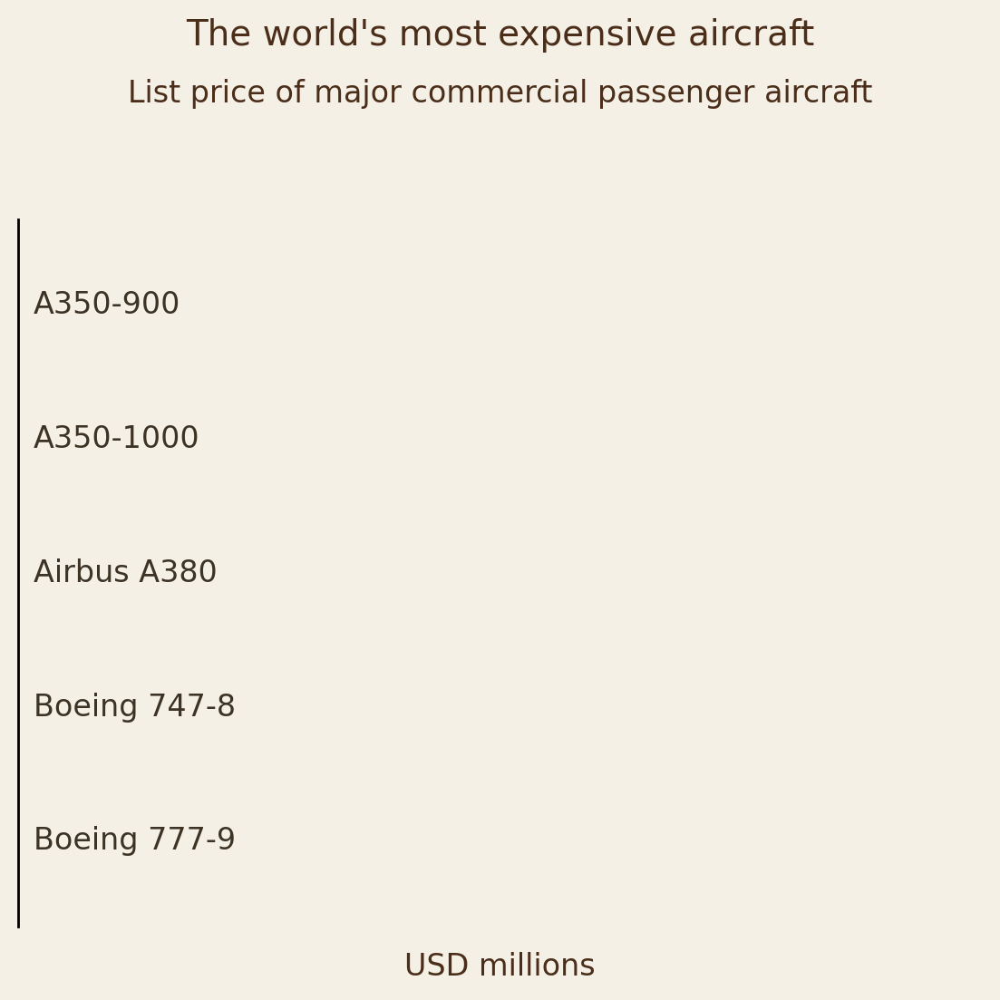

In [ ]:

df = pd.DataFrame({
    "Aircraft": ["Boeing 777-9", "Boeing 747-8", "Airbus A380", "A350-1000", "A350-900"],
    "Price": [442, 418, 412, 356, 308]
})

eSingleBarChartAnimate(
    df,
    colDim="Aircraft",
    colMeasure="Price",
    txtTitle="The world's most expensive aircraft",
    txtSup="List price of major commercial passenger aircraft",
    txtLabel="USD millions",
    output_file="espresso_aircraft_animated.mp4"
)


# Chart: Multi line

In [ ]:


def eMultiLineChartNew(
    dfChart,
    colDim,
    colMeasureList,        # list of columns for multiple lines
    txtTitle,
    txtSup,
    txtLabel,
    posText,               # list of row indices to place numeric value labels
    posLabel=-1,           # row index to place the per-line text label (default: last point)
    numFormat="{:.0f}",
    numDivisor=1,
    xTicks=None,
    xTicklabels=None,
    tickColor='#4B2E1A',
    xTickSize=10,
    aspectRatio=0.71,
    lineColors=None,       # custom line colors
    lineStyles=None,       # custom line styles per measure
    lineWidths=None,       # custom line widths per measure
    lineLabels=None,       # NEW: custom text labels per line (defaults to colMeasureList)
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    faceColor='#F7F5F2',
    titleFontWeight='bold',
    subTitleFontWeight='medium',
    txtLabelFontWeight='medium',
    showZeroLine=False,
    zeroLineColor='#857052',
    zeroLineStyle='--',
    zeroLineWidth=1.0,
    zeroLineAt=0,
    px=1080,             # export dimension
    dpi=200,             # 1080px / 200dpi = 5.4in
    title_size=14,
    subtitle_size=12,
    label_size=12,
    bottom_note_size=10,
    yLimits=None,
    title_y=1.08,          # NEW: relative y position for main title (axes coords)
    subtitle_y=1.02,        # NEW: relative y position for subtitle (axes coords)
    textOffsetY=None,
    shade_between=None,   # tuple: (measure_low, measure_high)
    shade_color='#c8b8a8',
    shade_alpha=0.25,
    shade_x=None,         # None OR (x_start, x_end)
    showYAxis=False,
    yTicks=None,              # NEW: explicit y tick values, e.g. [-0.5, 0, 0.5]
    yTickColor='#857052',
    yTickSize=10,
    yNumFormat=None,        # NEW: axis number format (defaults to numFormat)
    showLegend=False,          # NEW: show legend (default off)
    legendLoc='upper left',    # optional
    legendFontSize=10,
    legendTextColor='#857052',   # NEW: legend label color (defaults to line color or tickColor)
    legendNcol = 1
):

    """
    Multi-line chart with numeric point annotations and per-line text labels.

    Parameters
    ----------
    dfChart : pandas.DataFrame
        Data with a dimension column (x) and multiple measure columns (y).
    colDim : str
        Column name for the x-axis.
    colMeasureList : list[str]
        Column names for the lines.
    txtTitle, txtSup, txtLabel : str
        Title, subtitle (super title), and x-axis label text.
    posText : list[int]
        Row indices where numeric value labels should be drawn for each line.
    posLabel : int
        Row index where each line's text label should be drawn (default -1 = last row).
    numFormat : str
        Format string for numeric labels, e.g. "{:.0f}" or "{:.1f}x".
    numDivisor : float
        Divide measure values before formatting (e.g., 1e6 for "millions").
    xTicks, xTicklabels : list
        Optional manual ticks and (matching) tick labels for the x-axis.
    aspectRatio : float
        Axes box aspect ratio (height / width).
    lineColors, lineStyles, lineWidths, lineLabels : list
        Optional per-line styling and label overrides.
    yLimits : tuple or None
        Optional (ymin, ymax) for fixing y-axis scale. If None, auto-scaling is used.
    """

    # ---- Matplotlib defaults ----
    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'
    plt.rcParams['font.size'] = 10

    # ---- Figure / Axes ----
    figsize = (px / dpi, px / dpi)  # e.g. 1080 / 200 = 5.4 in square
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor, constrained_layout=True)
#fig.patch.set_facecolor(faceColor)
    ax.set_facecolor(faceColor)

    # ---- Defaults for colors and styles ----
    default_colors = ['#9d8561', '#857052', '#6c5c43', '#544734', '#3c3325']
    colors   = lineColors  if lineColors  is not None else default_colors
    styles   = lineStyles  if lineStyles  is not None else ['-'] * len(colMeasureList)
    widths   = lineWidths  if lineWidths  is not None else [0.9] * len(colMeasureList)
    labels   = lineLabels  if lineLabels  is not None else list(colMeasureList)

    # Safety: align list lengths
    if len(styles) < len(colMeasureList):
        styles = (styles * ((len(colMeasureList) // len(styles)) + 1))[:len(colMeasureList)]
    if len(widths) < len(colMeasureList):
        widths = (widths * ((len(colMeasureList) // len(widths)) + 1))[:len(colMeasureList)]
    if len(colors) < len(colMeasureList):
        colors = (colors * ((len(colMeasureList) // len(colors)) + 1))[:len(colMeasureList)]
    if len(labels) < len(colMeasureList):
        labels = (labels * ((len(colMeasureList) // len(labels)) + 1))[:len(colMeasureList)]

    # ---- Titles and labels ----
    # Main title (headline)
    ax.text(
        0.5, title_y,
        txtTitle,
        fontsize=title_size,
        color=titleColor,
        fontweight=titleFontWeight,
        ha='center', va='bottom',
        transform=ax.transAxes
    )

    # Subtitle
    ax.text(
        0.5, subtitle_y,
        txtSup,
        fontsize=subtitle_size,
        color=subTitleColor,
        ha='center', va='bottom',
        fontweight=subTitleFontWeight,
        transform=ax.transAxes
    )

    # Bottom note / label
    ax.set_xlabel(
        txtLabel,
        color=txtLabelColor,
        labelpad=10,
        size=bottom_note_size,
        fontweight=txtLabelFontWeight
    )


    # ---- Plot lines ----
    x = dfChart[colDim]
    for idx, colMeasure in enumerate(colMeasureList):
        ax.plot(
            x,
            dfChart[colMeasure],
            color=colors[idx],
            linestyle=styles[idx],
            linewidth=widths[idx],
            zorder=9
        )

    # ---- Aesthetics ----
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_visible(False)

    ax.spines['left'].set_visible(False)  # default


    ax.tick_params(
        axis='x',
        colors=tickColor,
        labelsize=xTickSize
    )
    fig.patch.set_facecolor(faceColor)
    fig.patch.set_edgecolor(faceColor)
    fig.patch.set_linewidth(0)
    fig.patch.set_alpha(1)

    # ---- X ticks / labels ----
    if xTicks is None:
        # default to endpoints
        try:
            xTicks = [x.iloc[0], x.iloc[-1]]
        except Exception:
            xTicks = [min(x), max(x)]

    if xTicklabels is None:
        xTicklabels = xTicks

    ax.set_xticks(xTicks)
    ax.set_xticklabels(xTicklabels)

    # ---- Y axis (optional) ----
    if showYAxis:
        if yTicks is not None:
            ax.set_yticks(yTicks)

        fmt = yNumFormat if yNumFormat is not None else numFormat

        ax.yaxis.set_major_formatter(
            plt.FuncFormatter(lambda v, _: fmt.format(v / numDivisor))
        )


        ax.tick_params(
            axis='y',
            labelleft=True,
            colors=yTickColor,
            labelsize=yTickSize,
            length=4,
            width=0.6
        )

        ax.spines['left'].set_visible(True)
        ax.spines['left'].set_linewidth(0.6)
        ax.spines['left'].set_color(yTickColor)

    else:
        ax.set_yticks([])
        ax.spines['left'].set_visible(False)

    # ---- Optional legend ----
    if showLegend:
        leg = ax.legend(
            labels,
            loc=legendLoc,
            ncol=legendNcol,
            frameon=False,
            fontsize=legendFontSize
        )

        # Optional legend text color override
        if legendTextColor is not None:
            for txt in leg.get_texts():
                txt.set_color(legendTextColor)


    # ---- Zero line ----
    if showZeroLine:
        ax.axhline(zeroLineAt, color=zeroLineColor,
                   linestyle=zeroLineStyle,
                   linewidth=zeroLineWidth, zorder=8)


    # ---- Numeric value annotations ----
    n_rows = len(dfChart)
    for pos in (posText or []):
        if pos < 0:
            pos = n_rows + pos  # allow negative indices
        if not (0 <= pos < n_rows):
            continue  # skip out-of-range safely
        for idx, colMeasure in enumerate(colMeasureList):
            raw_val = dfChart[colMeasure].iloc[pos]
            value = raw_val / numDivisor
            try:
                formatted = numFormat.format(value)
            except Exception:
                formatted = str(value)

            #ax.text(
            #    x.iloc[pos],
            #    raw_val,
            #    formatted,
            #    ha='center', va='bottom',
            #    color=colors[idx],
            #    fontsize=label_size, zorder=11,
            #    bbox=dict(boxstyle='square,pad=0.1',
            #              facecolor=faceColor, edgecolor=faceColor, alpha=0.8)
            #)
            offset_val = (
                textOffsetY[idx]
                if isinstance(textOffsetY, (list, tuple))
                else (textOffsetY or 0)
            )
            ax.text(
                x.iloc[pos],
                raw_val + offset_val,
                formatted,
                ha='center', va='bottom',
                color=colors[idx],
                fontsize=label_size, zorder=11,
                bbox=dict(boxstyle='square,pad=0.1',
                          facecolor=faceColor, edgecolor=faceColor, alpha=0.8)
            )

    # ---- Per-line text labels (Fix 2) ----
    # Draw a label for each line at row index `posLabel` (default last point).
    if posLabel < 0:
        posLabel_eff = n_rows + posLabel
    else:
        posLabel_eff = posLabel
    if 0 <= posLabel_eff < n_rows:
        for idx, colMeasure in enumerate(colMeasureList):
            x_i = x.iloc[posLabel_eff]
            y_i = dfChart[colMeasure].iloc[posLabel_eff]

            ax.text(
                x_i, y_i,
                str(labels[idx]),
                ha='left', va='center',
                color=colors[idx],
                fontsize=label_size, zorder=11,
                fontweight=txtLabelFontWeight,
                bbox=dict(boxstyle='square,pad=0.1',
                          facecolor=faceColor, edgecolor=faceColor, alpha=0.8)
            )


    # ---- Optional shaded area between two lines ----
    if shade_between is not None:
        col_low, col_high = shade_between
        y1 = dfChart[col_low]
        y2 = dfChart[col_high]

        if shade_x is None:
            ax.fill_between(
                x,
                y1,
                y2,
                color=shade_color,
                alpha=shade_alpha,
                zorder=1
            )
        else:
            x_start, x_end = shade_x
            mask = (x >= x_start) & (x <= x_end)

            ax.fill_between(
                x[mask],
                y1[mask],
                y2[mask],
                color=shade_color,
                alpha=shade_alpha,
                zorder=1
            )


    # ---- Aspect ratio ----
    ax.set_box_aspect(aspectRatio)

    #plt.subplots_adjust(top=0.5)   # default ~0.9 → lower = more space at top

    plt.show()
    plt.close()    # close current figure

    return fig, ax


# Chart: Multi-line 4x5

In [ ]:
def eMultiLineChartInstagram(
    dfChart,
    colDim,
    colMeasureList,
    txtTitle,
    txtSup,
    txtLabel,
    posText,
    posLabel=-1,
    numFormat="{:.0f}",
    numDivisor=1,
    xTicks=None,
    xTicklabels=None,
    tickColor='#4B2E1A',
    xTickSize=10,
    aspectRatio=1.0,
    lineColors=None,
    lineStyles=None,
    lineWidths=None,
    lineLabels=None,
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    faceColor='#F7F5F2',
    titleFontWeight='normal',
    titleFontFamily='DejaVu Sans',     # NEW: font family for title
    subTitleFontWeight='normal',
    subTitleFontFamily='DejaVu Sans',  # NEW: font family for subtitle
    txtLabelFontWeight='normal',
    showZeroLine=False,
    zeroLineColor='#857052',
    zeroLineStyle='--',
    zeroLineWidth=1.0,
    zeroLineAt=0,
    px=1080,
    py=1350,
    dpi=200,
    title_size=16,
    subtitle_size=13,
    label_size=12,
    bottom_note_size=10,
    yLimits=None,
    title_y=0.98,
    subtitle_y=0.94,
    textOffsetY=None,
    shade_between=None,
    shade_color='#c8b8a8',
    shade_alpha=0.25,
    shade_x=None,
    showYAxis=False,
    yTicks=None,
    yTickColor='#857052',
    yTickSize=10,
    yNumFormat=None,
    showLegend=False,
    legendLabelsCustom=None,  # NEW: separate legend labels (overrides lineLabels in legend)
    legendLoc='upper left',
    legendFontSize=10,
    legendTextColor='#857052',
    legendNcol=1,
    legendBbox=(0, 1.02),
    chart_top_margin=0.15
):
    """
    Multi-line chart formatted for Instagram portrait (1080x1350px, 4:5 ratio).
    """

    # ---- Matplotlib defaults ----
    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'
    plt.rcParams['font.size'] = 10

    # ---- Figure / Axes (Portrait format) ----
    figsize = (px / dpi, py / dpi)
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor)

    ax.set_facecolor(faceColor)

    # ---- Defaults for colors and styles ----
    default_colors = ['#9d8561', '#857052', '#6c5c43', '#544734', '#3c3325']
    colors = lineColors if lineColors is not None else default_colors
    styles = lineStyles if lineStyles is not None else ['-'] * len(colMeasureList)
    widths = lineWidths if lineWidths is not None else [0.9] * len(colMeasureList)
    labels = lineLabels if lineLabels is not None else list(colMeasureList)

    # Safety: align list lengths
    if len(styles) < len(colMeasureList):
        styles = (styles * ((len(colMeasureList) // len(styles)) + 1))[:len(colMeasureList)]
    if len(widths) < len(colMeasureList):
        widths = (widths * ((len(colMeasureList) // len(widths)) + 1))[:len(colMeasureList)]
    if len(colors) < len(colMeasureList):
        colors = (colors * ((len(colMeasureList) // len(colors)) + 1))[:len(colMeasureList)]
    if len(labels) < len(colMeasureList):
        labels = (labels * ((len(colMeasureList) // len(labels)) + 1))[:len(colMeasureList)]

    # ---- Titles and labels ----
    ax.text(
        0.5, title_y,
        txtTitle,
        fontsize=title_size,
        color=titleColor,
        fontweight=titleFontWeight,
        family=titleFontFamily,
        ha='center', va='top',
        transform=ax.transAxes
    )

    ax.text(
        0.5, subtitle_y,
        txtSup,
        fontsize=subtitle_size,
        color=subTitleColor,
        fontweight=subTitleFontWeight,
        family=subTitleFontFamily,
        ha='center', va='top',
        transform=ax.transAxes
    )

    ax.set_xlabel(
        txtLabel,
        color=txtLabelColor,
        labelpad=10,
        size=bottom_note_size,
        fontweight=txtLabelFontWeight
    )

    # ---- Plot lines ----
    x = dfChart[colDim]
    for idx, colMeasure in enumerate(colMeasureList):
        ax.plot(
            x,
            dfChart[colMeasure],
            color=colors[idx],
            linestyle=styles[idx],
            linewidth=widths[idx],
            zorder=9
        )

    # ---- Aesthetics ----
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_visible(False)
    ax.spines['left'].set_visible(False)

    ax.tick_params(
        axis='x',
        colors=tickColor,
        labelsize=xTickSize
    )
    fig.patch.set_facecolor(faceColor)
    fig.patch.set_edgecolor(faceColor)
    fig.patch.set_linewidth(0)
    fig.patch.set_alpha(1)

    # ---- X ticks / labels ----
    if xTicks is None:
        try:
            xTicks = [x.iloc[0], x.iloc[-1]]
        except Exception:
            xTicks = [min(x), max(x)]

    if xTicklabels is None:
        xTicklabels = xTicks

    ax.set_xticks(xTicks)
    ax.set_xticklabels(xTicklabels)

    # ---- Y axis (optional) ----
    if showYAxis:
        if yTicks is not None:
            ax.set_yticks(yTicks)

        fmt = yNumFormat if yNumFormat is not None else numFormat

        ax.yaxis.set_major_formatter(
            plt.FuncFormatter(lambda v, _: fmt.format(v / numDivisor))
        )

        ax.tick_params(
            axis='y',
            labelleft=True,
            colors=yTickColor,
            labelsize=yTickSize,
            length=4,
            width=0.6
        )

        ax.spines['left'].set_visible(True)
        ax.spines['left'].set_linewidth(0.6)
        ax.spines['left'].set_color(yTickColor)
    else:
        ax.set_yticks([])
        ax.spines['left'].set_visible(False)

    # ---- Optional legend ----
    if showLegend:
        # Use custom legend labels if provided, otherwise use lineLabels
        legend_labels = legendLabelsCustom if legendLabelsCustom is not None else labels

        leg = ax.legend(
            legend_labels,
            loc=legendLoc,
            bbox_to_anchor=legendBbox,
            ncol=legendNcol,
            frameon=False,
            fontsize=legendFontSize
        )

        if legendTextColor is not None:
            for txt in leg.get_texts():
                txt.set_color(legendTextColor)

    # ---- Zero line ----
    if showZeroLine:
        ax.axhline(zeroLineAt, color=zeroLineColor,
                   linestyle=zeroLineStyle,
                   linewidth=zeroLineWidth, zorder=8)

    # ---- Numeric value annotations ----
    n_rows = len(dfChart)
    for pos in (posText or []):
        if pos < 0:
            pos = n_rows + pos
        if not (0 <= pos < n_rows):
            continue
        for idx, colMeasure in enumerate(colMeasureList):
            raw_val = dfChart[colMeasure].iloc[pos]
            value = raw_val / numDivisor
            try:
                formatted = numFormat.format(value)
            except Exception:
                formatted = str(value)

            offset_val = (
                textOffsetY[idx]
                if isinstance(textOffsetY, (list, tuple))
                else (textOffsetY or 0)
            )
            ax.text(
                x.iloc[pos],
                raw_val + offset_val,
                formatted,
                ha='center', va='bottom',
                color=colors[idx],
                fontsize=label_size, zorder=11,
                bbox=dict(boxstyle='square,pad=0.1',
                          facecolor=faceColor, edgecolor=faceColor, alpha=0.8)
            )

    # ---- Per-line text labels ----
    if posLabel is not None:
        if posLabel < 0:
            posLabel_eff = n_rows + posLabel
        else:
            posLabel_eff = posLabel
        if 0 <= posLabel_eff < n_rows:
            for idx, colMeasure in enumerate(colMeasureList):
                x_i = x.iloc[posLabel_eff]
                y_i = dfChart[colMeasure].iloc[posLabel_eff]

                ax.text(
                    x_i, y_i,
                    str(labels[idx]),
                    ha='left', va='center',
                    color=colors[idx],
                    fontsize=label_size, zorder=11,
                    fontweight=txtLabelFontWeight,
                    bbox=dict(boxstyle='square,pad=0.1',
                              facecolor=faceColor, edgecolor=faceColor, alpha=0.8)
                )

    # ---- Optional shaded area ----
    if shade_between is not None:
        col_low, col_high = shade_between
        y1 = dfChart[col_low]
        y2 = dfChart[col_high]

        if shade_x is None:
            ax.fill_between(
                x, y1, y2,
                color=shade_color,
                alpha=shade_alpha,
                zorder=1
            )
        else:
            x_start, x_end = shade_x
            mask = (x >= x_start) & (x <= x_end)
            ax.fill_between(
                x[mask], y1[mask], y2[mask],
                color=shade_color,
                alpha=shade_alpha,
                zorder=1
            )

    # ---- Aspect ratio ----
    ax.set_box_aspect(aspectRatio)

    # ---- Y-axis limits ----
    if yLimits is not None:
        ax.set_ylim(yLimits)

    # REMOVED plt.show() and plt.close() so you can add text after!

    return fig, ax

# Chart: Stem

In [ ]:

def eStemChartNew(
    dfChart,
    colDim,
    colMeasureA,
    colMeasureB=None,
    colCategoryPos=None,
    txtTitle="",
    suptitle_y=0.94,
    txtSup="",
    txtLabel="",
    numFormat="{:.0f}",
    numDivisor=1,
    offset=0.1,
    xTickLabelYOffset=0,
    markerSize=4,
    lineWidth=0.8,
    titleColor="#4b2e1a",
    subTitleColor="#4b2e1a",
    axisLabelColor="#79664a",
    tickLabelColor="#3c3325",
    faceColor="#F7F5F2",
    colorA="#a58e6c",
    colorB="#573D09",
    yearLabelA=None,
    yearLabelB=None,
    label_a_offset_x=1,
    label_b_offset_x=1,
    label_a_offset_y=1,
    label_b_offset_y=1,
    instagram=True,
    px=1080,
    dpi=200,
    title_size=12,
    subtitle_size=14,
    label_size=12,
    title_pad=80,
    labelpad=10,
    aspectRatio=None,
    rotateLabels=False,
    xtick_align_ha="center",
    xtick_align_va="bottom",
    valueLabelOffsetPts=6,   # vertical offset for value labels
    xAxisLineWidth=0.8,       # thickness of x-axis line at y=0
    xAxisLineColor="#857052",
    lineFormatA = "--",
    lineFormatB = "--",
    valueLabelCustomOffset=None,  # dict {index: offset_in_points}

):


    # --- Matplotlib defaults ---
    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'

    # --- Figure setup (square for IG) ---
    if instagram:
        figsize = (px/dpi, px/dpi)
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi,
                               facecolor=faceColor, constrained_layout=True)
    else:
        fig, ax = plt.subplots(figsize=(8, 6), dpi=160, facecolor=faceColor)

    ax.set_facecolor(faceColor)

    # --- Titles ---
    fig.suptitle(txtTitle, y=suptitle_y, fontsize=title_size,
                 color=titleColor, fontweight="medium")
    ax.set_title(txtSup, pad=title_pad, fontsize=subtitle_size,
                 color=subTitleColor, fontweight="light")
    ax.set_xlabel(txtLabel, color=axisLabelColor, labelpad=labelpad,
                  size=label_size, fontweight="light")

    # --- Category positions ---
    xpos = np.arange(len(dfChart)) if colCategoryPos is None else np.asarray(dfChart[colCategoryPos])
    cats = dfChart[colDim].tolist()

    # --- Series A ---
    yA = dfChart[colMeasureA].to_numpy() / numDivisor
    markerline, stemlines, baseline = ax.stem(xpos - offset, yA,
                                              markerfmt="o", linefmt=lineFormatA, basefmt=" ")
    plt.setp(markerline, color=colorA, markersize=markerSize,
             linewidth=lineWidth, zorder=2)
    plt.setp(stemlines, color=colorA, linewidth=lineWidth, zorder=1)

    # --- Series B (optional) ---
    if colMeasureB is not None:
        yB = dfChart[colMeasureB].to_numpy() / numDivisor
        markerline, stemlines, baseline = ax.stem(xpos + offset, yB,
                                                  markerfmt="o", linefmt=lineFormatB, basefmt=" ")
        plt.setp(markerline, color=colorB, markersize=markerSize,
                 linewidth=lineWidth, zorder=2)
        plt.setp(stemlines, color=colorB, linewidth=lineWidth, zorder=1)

    # --- Spines ---
    for side in ["top", "right", "left", "bottom"]:
        ax.spines[side].set_linewidth(0)

    # --- X-axis line at y=0 ---
    ax.axhline(0, color=xAxisLineColor, linewidth=xAxisLineWidth)

    # --- Labels under stems ---
    ax.set_xticks(xpos)   # center on positions
    ax.set_xticklabels(
        cats,
        color=tickLabelColor,
        va=xtick_align_va, ha=xtick_align_ha,
        fontsize=label_size,
        rotation=90 if rotateLabels else 0,
        bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.7)
    )
    # Apply manual offsets
    for label in ax.get_xticklabels():
        x0, y0 = label.get_position()
        label.set_position((x0, y0 + xTickLabelYOffset))
    ax.tick_params(axis="x", length=0)  # removes tick marks

    # Remove y ticks completely
    ax.set_yticks([])

    # --- Labels on Series A points ---
    for i, val in enumerate(yA):
        text = numFormat.format(val)
        # Base offset: above if positive, below if negative
        base_offset = valueLabelOffsetPts if val >= 0 else -valueLabelOffsetPts
        # Add custom offset if provided
        custom_offset = 0
        if valueLabelCustomOffset and i in valueLabelCustomOffset:
            custom_offset = valueLabelCustomOffset[i]
        ax.annotate(
            text,
            xy=(xpos[i] - offset, val),
            xytext=(0, base_offset + custom_offset),
            textcoords="offset points",
            ha="center",
            va="bottom" if val >= 0 else "top",
            fontsize=label_size,
            color=colorA,
            bbox=dict(boxstyle="square,pad=0.2", facecolor="white", edgecolor="white", alpha=0.7),
            zorder=10
        )

    # --- Labels on Series B points ---
    if colMeasureB is not None:
        for i, val in enumerate(yB):
            text = numFormat.format(val)
            # Base offset: above if positive, below if negative
            base_offset = valueLabelOffsetPts if val >= 0 else -valueLabelOffsetPts
            # Add custom offset if provided
            custom_offset = 0
            if valueLabelCustomOffset and i in valueLabelCustomOffset:
                custom_offset = valueLabelCustomOffset[i]
            ax.annotate(
                text,
                xy=(xpos[i] + offset, val),
                xytext=(0, base_offset + custom_offset),
                textcoords="offset points",
                ha="center",
                va="bottom" if val >= 0 else "top",
                fontsize=label_size,
                color=colorB,
                bbox=dict(boxstyle="square,pad=0.2", facecolor="white", edgecolor="white", alpha=0.7),
                zorder=10
            )

    # --- Year labels (optional side annotations) ---
    if yearLabelA:
        ax.text(
            xpos[0] + label_a_offset_x, label_a_offset_y,
            str(yearLabelA),
            color=colorA, ha="left", va="bottom", rotation=90, fontsize=label_size,
            bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.8)
        )
    if colMeasureB is not None and yearLabelB:
        ax.text(
            xpos[0] + label_b_offset_x, label_b_offset_y,
            str(yearLabelB),
            color=colorB, ha="left", va="bottom", rotation=90, fontsize=label_size,
            bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.8)
        )

    # --- Aspect ratio ---
    if aspectRatio is not None:
        ax.set_box_aspect(aspectRatio)

    return fig, ax


# Chart: Stem 4x5

In [ ]:
def eStemChartNewInstagram(
    dfChart,
    colDim,
    colMeasureA,
    colMeasureB=None,
    colCategoryPos=None,
    txtTitle="",
    suptitle_y=0.955,  # Adjusted for 4:5 ratio
    txtSup="",
    txtLabel="",
    numFormat="{:.0f}",
    numDivisor=1,
    offset=0.1,
    xTickLabelYOffset=0,
    markerSize=4,
    lineWidth=0.8,
    titleColor="#4b2e1a",
    subTitleColor="#4b2e1a",
    axisLabelColor="#79664a",
    tickLabelColor="#3c3325",
    faceColor="#F7F5F2",
    colorA="#a58e6c",
    colorB="#573D09",
    yearLabelA=None,
    yearLabelB=None,
    label_a_offset_x=1,
    label_b_offset_x=1,
    label_a_offset_y=1,
    label_b_offset_y=1,
    instagram=True,
    px_width=1080,       # width in pixels
    px_height=1350,      # height in pixels (4:5 ratio)
    dpi=200,
    title_size=12,
    subtitle_size=14,
    label_size=12,
    title_pad=90,        # Adjusted for taller format
    labelpad=10,
    aspectRatio=None,
    rotateLabels=False,
    xtick_align_ha="center",
    xtick_align_va="bottom",
    valueLabelOffsetPts=6,
    xAxisLineWidth=0.8,
    xAxisLineColor="#857052",
    lineFormatA="--",
    lineFormatB="--",
    valueLabelCustomOffset=None,
    showLegend=False,
    legendLabels=None,  # tuple/list: (labelA, labelB)
    legendLoc='upper right',
    legendFontSize=10,
    legendFrame=False,
    legendTextColor='#3c3325',
    legendBboxToAnchor=None,  # tuple (x, y) for fine positioning
    yMin=None,  # Minimum y-axis limit
    yMax=None,  # Maximum y-axis limit
    font='DejaVu Sans',        # Base font for labels and ticks
    titleFont='DejaVu Sans',            # Font for title (defaults to font)
    subTitleFont='DejaVu Sans',
):
    # --- Matplotlib defaults ---
    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'

    # --- Figure setup for 4:5 aspect ratio ---
    if instagram:
        figsize = (px_width/dpi, px_height/dpi)  # 5.4 x 6.75 inches at 200 dpi
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi,
                               facecolor=faceColor, constrained_layout=True)
    else:
        fig, ax = plt.subplots(figsize=(8, 10), dpi=160, facecolor=faceColor)

    ax.set_facecolor(faceColor)

    # --- Titles ---
    fig.suptitle(txtTitle, y=suptitle_y, fontsize=title_size,
                 color=titleColor, fontweight="medium", fontfamily=titleFont)
    ax.set_title(txtSup, pad=title_pad, fontsize=subtitle_size,
                 color=subTitleColor, fontweight="light", fontfamily=subTitleFont)
    ax.set_xlabel(txtLabel, color=axisLabelColor, labelpad=labelpad,
                  size=label_size, fontweight="light")

    # --- Category positions ---
    xpos = np.arange(len(dfChart)) if colCategoryPos is None else np.asarray(dfChart[colCategoryPos])
    cats = dfChart[colDim].tolist()

    # --- Series A ---
    yA = dfChart[colMeasureA].to_numpy() / numDivisor
    markerline, stemlines, baseline = ax.stem(xpos - offset, yA,
                                              markerfmt="o", linefmt=lineFormatA, basefmt=" ")
    plt.setp(markerline, color=colorA, markersize=markerSize,
             linewidth=lineWidth, zorder=2)
    plt.setp(stemlines, color=colorA, linewidth=lineWidth, zorder=1)

    # --- Series B (optional) ---
    if colMeasureB is not None:
        yB = dfChart[colMeasureB].to_numpy() / numDivisor
        markerline, stemlines, baseline = ax.stem(xpos + offset, yB,
                                                  markerfmt="o", linefmt=lineFormatB, basefmt=" ")
        plt.setp(markerline, color=colorB, markersize=markerSize,
                 linewidth=lineWidth, zorder=2)
        plt.setp(stemlines, color=colorB, linewidth=lineWidth, zorder=1)

    # --- Spines ---
    for side in ["top", "right", "left", "bottom"]:
        ax.spines[side].set_linewidth(0)

    # --- X-axis line at y=0 ---
    ax.axhline(0, color=xAxisLineColor, linewidth=xAxisLineWidth)

    # --- Y-axis limits ---
    if yMin is not None or yMax is not None:
        current_min, current_max = ax.get_ylim()
        ax.set_ylim(
            yMin if yMin is not None else current_min,
            yMax if yMax is not None else current_max
        )

    # --- Labels under stems ---
    ax.set_xticks(xpos)
    ax.set_xticklabels(
        cats,
        color=tickLabelColor,
        va=xtick_align_va, ha=xtick_align_ha,
        fontsize=label_size,
        rotation=90 if rotateLabels else 0,
        bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.7)
    )
    # Apply manual offsets
    for label in ax.get_xticklabels():
        x0, y0 = label.get_position()
        label.set_position((x0, y0 + xTickLabelYOffset))
    ax.tick_params(axis="x", length=0)

    # Remove y ticks completely
    ax.set_yticks([])

    # --- Labels on Series A points ---
    for i, val in enumerate(yA):
        text = numFormat.format(val)
        base_offset = valueLabelOffsetPts if val >= 0 else -valueLabelOffsetPts
        custom_offset = 0
        if valueLabelCustomOffset and i in valueLabelCustomOffset:
            custom_offset = valueLabelCustomOffset[i]
        ax.annotate(
            text,
            xy=(xpos[i] - offset, val),
            xytext=(0, base_offset + custom_offset),
            textcoords="offset points",
            ha="center",
            va="bottom" if val >= 0 else "top",
            fontsize=label_size,
            color=colorA,
            bbox=dict(boxstyle="square,pad=0.2", facecolor="white", edgecolor="white", alpha=0.7),
            zorder=10
        )

    # --- Labels on Series B points ---
    if colMeasureB is not None:
        for i, val in enumerate(yB):
            text = numFormat.format(val)
            base_offset = valueLabelOffsetPts if val >= 0 else -valueLabelOffsetPts
            custom_offset = 0
            if valueLabelCustomOffset and i in valueLabelCustomOffset:
                custom_offset = valueLabelCustomOffset[i]
            ax.annotate(
                text,
                xy=(xpos[i] + offset, val),
                xytext=(0, base_offset + custom_offset),
                textcoords="offset points",
                ha="center",
                va="bottom" if val >= 0 else "top",
                fontsize=label_size,
                color=colorB,
                bbox=dict(boxstyle="square,pad=0.2", facecolor="white", edgecolor="white", alpha=0.7),
                zorder=10
            )

    # --- Year labels (optional side annotations) ---
    if yearLabelA:
        ax.text(
            xpos[0] + label_a_offset_x, label_a_offset_y,
            str(yearLabelA),
            color=colorA, ha="left", va="bottom", rotation=90, fontsize=label_size,
            bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.8)
        )
    if colMeasureB is not None and yearLabelB:
        ax.text(
            xpos[0] + label_b_offset_x, label_b_offset_y,
            str(yearLabelB),
            color=colorB, ha="left", va="bottom", rotation=90, fontsize=label_size,
            bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.8)
        )

    # --- Legend ---
    if showLegend:
        handles = []
        labels = []

        # Add Series A to legend
        line_a = plt.Line2D([0], [0], color=colorA, linewidth=lineWidth,
                           linestyle=lineFormatA, marker='o', markersize=markerSize)
        handles.append(line_a)
        labels.append(legendLabels[0] if legendLabels else 'Series A')

        # Add Series B to legend if it exists
        if colMeasureB is not None:
            line_b = plt.Line2D([0], [0], color=colorB, linewidth=lineWidth,
                               linestyle=lineFormatB, marker='o', markersize=markerSize)
            handles.append(line_b)
            labels.append(legendLabels[1] if legendLabels and len(legendLabels) > 1 else 'Series B')

        legend = ax.legend(handles, labels,
                          loc=legendLoc,
                          fontsize=legendFontSize,
                          frameon=legendFrame,
                          bbox_to_anchor=legendBboxToAnchor)

        # Set legend text color
        for text in legend.get_texts():
            text.set_color(legendTextColor)

    # --- Aspect ratio ---
    if aspectRatio is not None:
        ax.set_box_aspect(aspectRatio)

    return fig, ax

# Chart: Donut

In [ ]:

def eDonutChart(
    dfChart,
    colValue,
    colLabel=None,
    colInner=None,
    txtTitle="",
    txtSup="",
    txtLabel="",
    numFormat="{:.0f}%",
    numDivisor=1,
    radius_outer=0.9,
    radius_inner=0.65,
    wedge_width=0.3,
    labeldistance=1.05,
    pctdistance_outer=0.8,
    pctdistance_inner=0.75,
    show_pct=True,
    autopct_outer=True,
    autopct_inner=True,
    colors=None,
    pctColors=None,
    labelColors=None,
    centerText=None,
    centerTextColor="#4b2e1a",
    centerTextSize=12,
    centerTextWeight="normal",
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#4b2e1a',
    faceColor='#F7F5F2',
    titleFontWeight='medium',
    subTitleFontWeight='light',
    txtLabelFontWeight='light',
    title_size=14,
    subtitle_size=12,
    label_size=10,
    bottom_note_size=10,
    font='DejaVu Sans',
    figsize=(8, 8),
    dpi=200,
    px=1080,             # default Instagram square size
    instagram=True      # force square by default

):
    """
    Donut (single or double-ring) chart with coffee-style defaults.
    Titles/labels use fig.text so the donut stays square & centered.
    """

    plt.rcdefaults()
    plt.rcParams['font.family'] = font
    plt.rcParams['font.size'] = 12

    if instagram:
        figsize = (px/dpi, px/dpi)
    else:
        figsize = (8, 8)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi,
                       facecolor=faceColor, constrained_layout=True)

    # ---- Defaults for colors ----
    default_colors = ['#d9d0c1', '#79664a', '#9d8561',
                      '#857052', '#6c5c43', '#544734', '#3c3325']
    if colors is None:
        colors = default_colors

    # ---- Place titles with fig.text (outside axes) ----
    if txtTitle:
        fig.text(0.5, 0.97, txtTitle, ha="center", va="top",
                fontsize=title_size, color=titleColor, weight="bold")
    if txtSup:
        fig.text(0.5, 0.91, txtSup, ha="center", va="top",
                fontsize=subtitle_size, color=subTitleColor)
    if txtLabel:
        fig.text(0.5, 0.04, txtLabel, ha="center", va="bottom",
                fontsize=bottom_note_size, color=txtLabelColor)


    # ---- Labels ----
    labels = dfChart[colLabel].astype(str) if colLabel is not None else None

    # ---- Autopct helper ----
    def autopct_func(pct):
        try:
            return numFormat.format(pct)
        except Exception:
            return f"{pct:.0f}%"

    outer_autopct = autopct_func if (show_pct and autopct_outer) else None
    inner_autopct = autopct_func if (show_pct and autopct_inner) else None

    # ---- Outer ring ----
    wedges, texts, autotexts = ax.pie(
        dfChart[colValue] / numDivisor,
        radius=radius_outer,
        labels=labels,
        labeldistance=labeldistance,
        colors=colors,
        wedgeprops=dict(width=wedge_width),
        startangle=90,
        autopct=outer_autopct,
        pctdistance=pctdistance_outer,
        textprops={'fontsize': label_size}
    )

    if labelColors:
        for i, t in enumerate(texts):
            if i < len(labelColors):
                t.set_color(labelColors[i])
    if pctColors:
        for i, t in enumerate(autotexts):
            if i < len(pctColors):
                t.set_color(pctColors[i])

    # ---- Inner ring ----
    if colInner:
        wedges2, texts2, autotexts2 = ax.pie(
            dfChart[colInner] / numDivisor,
            radius=radius_inner,
            colors=colors,
            wedgeprops=dict(width=wedge_width),
            startangle=90,
            autopct=inner_autopct,
            pctdistance=pctdistance_inner,
            textprops={'fontsize': label_size}
        )
        if pctColors:
            for i, t in enumerate(autotexts2):
                if i < len(pctColors):
                    t.set_color(pctColors[i])

    # ---- Center text ----
    if centerText:
        ax.text(
            0, 0, centerText,
            ha="center", va="center",
            fontsize=centerTextSize,
            color=centerTextColor,
            fontweight=centerTextWeight,
            linespacing=1.2
        )

    # ---- Aesthetics ----
    for side in ['top', 'right', 'left', 'bottom']:
        ax.spines[side].set_linewidth(0)

    fig.patch.set_facecolor(faceColor)
    fig.patch.set_edgecolor(faceColor)
    fig.patch.set_linewidth(0)
    fig.patch.set_alpha(1)

    # 🔹 Force square donut
    ax.set_aspect("equal", adjustable="box")

    plt.show()
    plt.close()

    return fig, ax


# Chart: Donut 4x5

In [ ]:
def eDonutChartInstagram(
    dfChart,
    colValue,
    colLabel=None,
    colInner=None,
    txtTitle="",
    txtSup="",
    txtLabel="",
    numFormat="{:.0f}%",
    numDivisor=1,
    radius_outer=0.9,
    radius_inner=0.65,
    wedge_width=0.3,
    labeldistance=1.05,
    pctdistance_outer=0.8,
    pctdistance_inner=0.75,
    show_pct=True,
    autopct_outer=True,
    autopct_inner=True,
    colors=None,
    pctColors=None,
    labelColors=None,
    centerText=None,
    centerTextColor="#4b2e1a",
    centerTextSize=12,
    centerTextWeight="normal",
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    faceColor='#F7F5F2',
    titleFontWeight='medium',
    subTitleFontWeight='light',
    txtLabelFontWeight='light',
    title_size=14,
    subtitle_size=12,
    label_size=10,
    bottom_note_size=10,
    font='DejaVu Sans',
    titleFont='DejaVu Sans',           # New: separate font for title
    subTitleFont='DejaVu Sans',        # New: separate font for subtitle
    figsize=(8, 8),
    dpi=200,
    px=1080,
    instagram=True,
    instagram_format='4x5'    # New: '1x1' or '4x5'
):
    """
    Donut (single or double-ring) chart with coffee-style defaults.
    Titles/labels use fig.text so the donut stays square & centered.
    Supports Instagram 1x1 (square) or 4x5 (portrait) formats.
    """

    plt.rcdefaults()
    plt.rcParams['font.family'] = font
    plt.rcParams['font.size'] = 12

    # Set title and subtitle fonts if specified
    if titleFont is None:
        titleFont = font
    if subTitleFont is None:
        subTitleFont = font

    # Calculate figsize based on format
    if instagram:
        if instagram_format == '4x5':
            # Instagram portrait: 1080x1350 pixels
            figsize = (px/dpi, (px * 1.25)/dpi)
        else:
            # Instagram square: 1080x1080 pixels
            figsize = (px/dpi, px/dpi)
    else:
        figsize = (8, 8)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi,
                       facecolor=faceColor, constrained_layout=True)

    # ---- Defaults for colors ----
    default_colors = ['#d9d0c1', '#79664a', '#9d8561',
                      '#857052', '#6c5c43', '#544734', '#3c3325']
    if colors is None:
        colors = default_colors

    # ---- Place titles with fig.text (outside axes) ----
    if txtTitle:
        fig.text(0.5, 0.97, txtTitle, ha="center", va="top",
                fontsize=title_size, color=titleColor, weight=titleFontWeight,
                fontfamily=titleFont)
    if txtSup:
        fig.text(0.5, 0.91, txtSup, ha="center", va="top",
                fontsize=subtitle_size, color=subTitleColor, weight=subTitleFontWeight,
                fontfamily=subTitleFont)
    if txtLabel:
        fig.text(0.5, 0.04, txtLabel, ha="center", va="bottom",
                fontsize=bottom_note_size, color=txtLabelColor, weight=txtLabelFontWeight)

    # ---- Labels ----
    labels = dfChart[colLabel].astype(str) if colLabel is not None else None

    # ---- Autopct helper ----
    def autopct_func(pct):
        try:
            return numFormat.format(pct)
        except Exception:
            return f"{pct:.0f}%"

    outer_autopct = autopct_func if (show_pct and autopct_outer) else None
    inner_autopct = autopct_func if (show_pct and autopct_inner) else None

    # ---- Outer ring ----
    wedges, texts, autotexts = ax.pie(
        dfChart[colValue] / numDivisor,
        radius=radius_outer,
        labels=labels,
        labeldistance=labeldistance,
        colors=colors,
        wedgeprops=dict(width=wedge_width),
        startangle=90,
        autopct=outer_autopct,
        pctdistance=pctdistance_outer,
        textprops={'fontsize': label_size}
    )

    if labelColors:
        for i, t in enumerate(texts):
            if i < len(labelColors):
                t.set_color(labelColors[i])
    if pctColors:
        for i, t in enumerate(autotexts):
            if i < len(pctColors):
                t.set_color(pctColors[i])

    # ---- Inner ring ----
    if colInner:
        wedges2, texts2, autotexts2 = ax.pie(
            dfChart[colInner] / numDivisor,
            radius=radius_inner,
            colors=colors,
            wedgeprops=dict(width=wedge_width),
            startangle=90,
            autopct=inner_autopct,
            pctdistance=pctdistance_inner,
            textprops={'fontsize': label_size}
        )
        if pctColors:
            for i, t in enumerate(autotexts2):
                if i < len(pctColors):
                    t.set_color(pctColors[i])

    # ---- Center text ----
    if centerText:
        ax.text(
            0, 0, centerText,
            ha="center", va="center",
            fontsize=centerTextSize,
            color=centerTextColor,
            fontweight=centerTextWeight,
            linespacing=1.2
        )

    # ---- Aesthetics ----
    for side in ['top', 'right', 'left', 'bottom']:
        ax.spines[side].set_linewidth(0)

    fig.patch.set_facecolor(faceColor)
    fig.patch.set_edgecolor(faceColor)
    fig.patch.set_linewidth(0)
    fig.patch.set_alpha(1)

    # 🔹 Force square donut
    ax.set_aspect("equal", adjustable="box")

    plt.show()
    plt.close()

    return fig, ax

# Chart: Annotations

In [ ]:
def add_custom_annotations(ax, annotations):
    """
    Add text annotations to any matplotlib axes object

    annotations: list of dicts with keys:
        {
            'text': 'Important point!',
            'xy': (x, y),              # Position of text
            'color': '#4b2e1a',
            'fontsize': 12,
            'ha': 'center',
            'va': 'center',
            'bbox': {...},             # Optional background box
            'frame': True/False,       # Whether to show frame (default: True)
            'frame_color': '#857052',  # Frame edge color
            'frame_alpha': 0.9,        # Frame transparency
            'bg_color': 'white'        # Background color
        }
    """
    for anno in annotations:
        bbox_dict = None

        if anno.get('frame', True):  # Frame shown by default
            bbox_dict = anno.get('bbox', dict(
                boxstyle='round,pad=0.5',
                facecolor=anno.get('bg_color', 'white'),
                edgecolor=anno.get('frame_color', anno.get('color', '#857052')),
                alpha=anno.get('frame_alpha', 0.9)
            ))

        ax.text(
            anno['xy'][0],
            anno['xy'][1],
            anno['text'],
            color=anno.get('color', '#4b2e1a'),
            fontsize=anno.get('fontsize', 12),
            ha=anno.get('ha', 'center'),
            va=anno.get('va', 'center'),
            bbox=bbox_dict
        )
    return ax

# Chart: Annotation lines

In [ ]:
def add_lines(ax, lines):
    """
    Add pointing lines/arrows to any matplotlib axes object

    lines: list of dicts with keys:
        {
            'start': (x1, y1),         # Line start point
            'end': (x2, y2),           # Line end point
            'arrow': True,             # Whether to add arrowhead
            'color': '#4b2e1a',
            'linewidth': 1.5,
            'linestyle': '-'
        }
    """
    for line in lines:
        if line.get('arrow', False):
            ax.annotate(
                '',  # Empty text, just the arrow
                xy=line['end'],        # Arrow points here
                xytext=line['start'],  # Arrow starts here
                arrowprops=dict(
                    arrowstyle=line.get('arrowstyle', '->'),
                    color=line.get('color', '#4b2e1a'),
                    lw=line.get('linewidth', 1.5),
                    linestyle=line.get('linestyle', '-')
                )
            )
        else:
            ax.plot(
                [line['start'][0], line['end'][0]],
                [line['start'][1], line['end'][1]],
                color=line.get('color', '#4b2e1a'),
                linewidth=line.get('linewidth', 1.5),
                linestyle=line.get('linestyle', '-')
            )
    return ax

#Chart: Text

In [ ]:
def add_text(ax, texts):
    """
    Add text elements to any matplotlib axes object

    texts: list of dicts with keys:
        {
            'text': 'Your text here',
            'xy': (x, y),              # Position in data coordinates
            'fontsize': 12,
            'color': '#4b2e1a',
            'ha': 'left',              # horizontal alignment: 'left', 'center', 'right'
            'va': 'bottom',            # vertical alignment: 'top', 'center', 'bottom'
            'fontweight': 'normal',    # 'normal', 'bold', 'light', 'medium'
            'rotation': 0,             # rotation angle in degrees
            'alpha': 1.0,              # transparency (0-1)
            'family': 'DejaVu Sans'    # font family
        }
    """
    for txt in texts:
        ax.text(
            txt['xy'][0],
            txt['xy'][1],
            txt['text'],
            fontsize=txt.get('fontsize', 12),
            color=txt.get('color', '#4b2e1a'),
            ha=txt.get('ha', 'left'),
            va=txt.get('va', 'bottom'),
            fontweight=txt.get('fontweight', 'normal'),
            rotation=txt.get('rotation', 0),
            alpha=txt.get('alpha', 1.0),
            family=txt.get('family', 'DejaVu Sans')
        )
    return ax



# ============================================================================
# HELPER FUNCTION: add_text
# ============================================================================
def add_text(ax, texts):
    """
    Add text elements to any matplotlib axes object

    texts: list of dicts with keys:
        {
            'text': 'Your text here',
            'xy': (x, y),              # Position in data coordinates
            'fontsize': 12,
            'color': '#4b2e1a',
            'ha': 'left',              # horizontal alignment: 'left', 'center', 'right'
            'va': 'bottom',            # vertical alignment: 'top', 'center', 'bottom'
            'fontweight': 'normal',    # 'normal', 'bold', 'light', 'medium'
            'rotation': 0,             # rotation angle in degrees
            'alpha': 1.0,              # transparency (0-1)
            'family': 'DejaVu Sans'    # font family
        }
    """
    for txt in texts:
        ax.text(
            txt['xy'][0],
            txt['xy'][1],
            txt['text'],
            fontsize=txt.get('fontsize', 12),
            color=txt.get('color', '#4b2e1a'),
            ha=txt.get('ha', 'left'),
            va=txt.get('va', 'bottom'),
            fontweight=txt.get('fontweight', 'normal'),
            rotation=txt.get('rotation', 0),
            alpha=txt.get('alpha', 1.0),
            family=txt.get('family', 'DejaVu Sans'),
            linespacing=txt.get('linespacing', 1.2)
        )
    return ax


#Chart: Cover Tile

In [ ]:


# ============================================================================
# NEW FUNCTION: eCoverTileInstagram
# ============================================================================
def eCoverTileInstagram(
    txtTitle,
    txtSup,
    txtLabel="",
    # --- Title styling ---
    titleColor='#4b2e1a',
    titleFont='DejaVu Serif',
    titleFontWeight='normal',
    title_size=42,
    title_y=0.6,              # vertical position (0-1, from bottom)
    # --- Subtitle styling ---
    subTitleColor='#4b2e1a',
    subTitleFont='DejaVu Sans',
    subTitleFontWeight='normal',
    subtitle_size=18,
    subtitle_y=0.38,           # vertical position (0-1, from bottom)
    # --- Label/source styling ---
    txtLabelColor='#857052',
    txtLabelFont='DejaVu Sans',
    txtLabelFontWeight='light',
    label_size=11,
    label_y=0.06,
    # --- Layout ---
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    # --- Optional decorative line ---
    show_accent_line=True,
    accent_line_color='#3F5B83',
    accent_line_width=4,
    accent_line_y=0.48,        # position between title and subtitle
    accent_line_length=0.15,   # as fraction of width
):
    """
    Create an empty Instagram cover tile (4:5 format) with headline and subheadline.

    Perfect for carousel cover slides that grab attention before showing data.

    Parameters:
    -----------
    txtTitle : str
        Main headline text. Use \\n for line breaks.
    txtSup : str
        Subheadline/hook text. Use \\n for line breaks.
    txtLabel : str, optional
        Bottom attribution/source text.

    Returns:
    --------
    fig, ax : matplotlib figure and axes objects
    """

    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'

    # Create figure with 4:5 aspect ratio
    figsize = (px_width / dpi, px_height / dpi)
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor)
    ax.set_facecolor(faceColor)

    # Remove all axes elements
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')

    # Remove all spines
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Build text list for add_text function
    texts = []

    # Title (large, serif)
    texts.append({
        'text': txtTitle,
        'xy': (0.5, title_y),
        'fontsize': title_size,
        'color': titleColor,
        'ha': 'center',
        'va': 'center',
        'fontweight': titleFontWeight,
        'family': titleFont,
        'linespacing': 1.1
    })

    # Subtitle (smaller, sans-serif)
    texts.append({
        'text': txtSup,
        'xy': (0.5, subtitle_y),
        'fontsize': subtitle_size,
        'color': subTitleColor,
        'ha': 'center',
        'va': 'center',
        'fontweight': subTitleFontWeight,
        'family': subTitleFont,
        'linespacing': 1.3
    })

    # Label/source (bottom, small)
    if txtLabel:
        texts.append({
            'text': txtLabel,
            'xy': (0.5, label_y),
            'fontsize': label_size,
            'color': txtLabelColor,
            'ha': 'center',
            'va': 'center',
            'fontweight': txtLabelFontWeight,
            'family': txtLabelFont
        })

    # Add all text using add_text helper
    add_text(ax, texts)

    # Optional accent line between title and subtitle
    if show_accent_line:
        line_start = 0.5 - (accent_line_length / 2)
        line_end = 0.5 + (accent_line_length / 2)
        ax.plot(
            [line_start, line_end],
            [accent_line_y, accent_line_y],
            color=accent_line_color,
            linewidth=accent_line_width,
            solid_capstyle='round'
        )

    plt.tight_layout(pad=0)

    return fig, ax



# Animated charts

In [ ]:
# -*- coding: utf-8 -*-
"""
Espresso Charts — Animated Instagram Functions
================================================
Animated versions of the four core chart types for Instagram Reels / YouTube Shorts.
Each function mirrors the static version's signature and styling exactly,
then smoothly animates the data elements from zero to their final values.

Output: MP4 video file (requires ffmpeg).

Functions
---------
eSingleBarChartAnimateInstagram   — horizontal bars grow left→right
eMultiLineChartAnimateInstagram   — lines draw progressively point-by-point
eStemChartAnimateInstagram        — stems grow upward from the baseline
eDonutChartAnimateInstagram       — wedges sweep open from 0° to full
"""

#import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as mpatches
import numpy as np
#import pandas as pd


# ============================================================================
# EASING HELPERS
# ============================================================================
def _ease_out_cubic(t):
    """Smooth deceleration curve: fast start, gentle landing."""
    return 1 - (1 - t) ** 3

def _ease_out_quad(t):
    return 1 - (1 - t) ** 2

def _ease_linear(t):
    return t

_EASING = {
    'cubic': _ease_out_cubic,
    'quad': _ease_out_quad,
    'linear': _ease_linear,
}


# ============================================================================
# 1.  ANIMATED SINGLE BAR CHART  (Instagram 4×5)
# ============================================================================
def eSingleBarChartAnimateInstagram(
    dfChart,
    colDim,
    colMeasure,
    txtSuptitle,
    txtTitle,
    txtLabel,
    # --- animation ---
    duration=3,
    fps=30,
    hold_frames=30,            # extra still frames at the end
    output_file="espresso_bar_animated.mp4",
    easing='cubic',
    # --- all static params (same defaults as eSingleBarChartNewInstagram) ---
    posText=None,
    posLabel=-1,
    numFormat="{:.0f}",
    numDivisor=1,
    barHeight=None,
    barColor=None,
    hideLeftSpine=False,
    offsetLabelX=0,
    minVal=None,
    maxVal=None,
    factorLimitX=1.0,
    aspectRatio=None,
    labelCustomOffset=None,
    suptitle_size=14,
    title_size=12,
    label_size=12,
    suptitleColor='#4b2e1a',
    titleColor='#4b2e1a',
    txtLabelColor='#857052',
    tickLabelColor='#3c3325',
    valueLabelColor='#4b2e1a',
    faceColor='#f5f0e6',
    coffeePalette=('#9d8561','#857052','#6c5c43','#544734','#3c3325','#79664a','#d9d0c1','#0b0a07'),
    suptitleFontWeight='normal',
    titleFontWeight='normal',
    txtLabelFontWeight='normal',
    font='DejaVu Sans',
    suptitleFont=None,
    titleFont=None,
    suptitle_y_custom=None,
    title_pad_custom=None,
    showZeroLine=False,
    zeroLineColor='#4b2e1a',
    zeroLineStyle='--',
    zeroLineWidth=1.0,
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    sepIndex=None,
    sepColor='#4b2e1a',
    sepStyle='-',
    sepWidth=1.5,
    x_title_offset=0.55,
):
    """
    Animated horizontal bar chart for Instagram 4×5.
    Bars smoothly grow from zero to their final values.
    Returns (fig, ax) and saves an MP4.
    """
    ease_fn = _EASING.get(easing, _ease_out_cubic)

    # --- RC & fonts ---
    plt.rcdefaults()
    plt.rcParams['font.family'] = font
    if suptitleFont is None: suptitleFont = font
    if titleFont is None: titleFont = font

    # --- Figure setup ---
    if instagram:
        figsize = (px_width / dpi, px_height / dpi)
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor)
        fig.subplots_adjust(top=0.85, bottom=0.1, left=0.1, right=0.8)
        suptitle_y = 0.93 if suptitle_y_custom is None else suptitle_y_custom
        title_pad = 25 if title_pad_custom is None else title_pad_custom
    else:
        fig, ax = plt.subplots(figsize=(8, 10), dpi=160, facecolor=faceColor)
        fig.subplots_adjust(top=0.82, bottom=0.12)
        suptitle_y = 0.96
        title_pad = 20

    ax.set_facecolor(faceColor)
    if barColor is None:
        barColor = coffeePalette[0]

    # --- Titles ---
    fig.suptitle(
        txtSuptitle, y=suptitle_y, fontsize=suptitle_size, color=suptitleColor,
        ha='center', va='top', fontweight=suptitleFontWeight, fontfamily=suptitleFont
    )
    ax.set_title(
        txtTitle, pad=title_pad, color=titleColor,
        size=title_size, fontweight=titleFontWeight,
        ha='center', va='top', x=x_title_offset, fontfamily=titleFont
    )
    ax.set_xlabel(
        txtLabel, color=txtLabelColor, labelpad=15,
        size=label_size, fontweight=txtLabelFontWeight, x=x_title_offset
    )

    # --- Data ---
    dim_vals = dfChart[colDim].tolist()
    measure_vals = dfChart[colMeasure].tolist()
    n = len(dim_vals)

    if barHeight is None:
        barHeight = 0.75

    # --- X limits ---
    if minVal is None: minVal = float(dfChart[colMeasure].min())
    if maxVal is None: maxVal = float(dfChart[colMeasure].max())
    ax.set_xlim(min(minVal * factorLimitX, 0), max(maxVal * factorLimitX, 0))

    # --- Draw empty bars ---
    bars = ax.barh(dim_vals, [0]*n, color=barColor, height=barHeight, zorder=3)

    # --- Spines & ticks ---
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_linewidth(0)
    if hideLeftSpine:
        ax.spines['left'].set_linewidth(0)
    else:
        ax.spines['left'].set_linewidth(1.2)
        ax.spines['left'].set_color(tickLabelColor)
        ax.spines['left'].set_zorder(5)

    ax.set_yticks([])
    ax.tick_params(axis='y', left=False)
    ax.set_xticks([])
    ax.tick_params(axis='x', colors=faceColor)

    if showZeroLine:
        ax.axvline(0, color=zeroLineColor, linestyle=zeroLineStyle,
                   linewidth=zeroLineWidth, zorder=2)

    # --- Category labels (static, always visible) ---
    cat_anns = []
    for idx, patch in enumerate(bars):
        category = str(dim_vals[idx])
        y_center = patch.get_y() + patch.get_height() / 2
        is_positive = measure_vals[idx] >= 0
        ha_cat = 'left' if is_positive else 'right'
        off_cat = 8 + offsetLabelX if is_positive else -8 - offsetLabelX
        xy = (0, y_center)
        ann = ax.annotate(
            category, xy=xy, xytext=(off_cat, 0), textcoords='offset points',
            ha=ha_cat, va='center', fontsize=label_size, color=tickLabelColor, zorder=6,
            bbox=dict(boxstyle='square,pad=0.1', facecolor=faceColor, edgecolor='none', alpha=0.8)
        )
        cat_anns.append(ann)

    # --- Value labels (will update each frame) ---
    val_anns = []
    for idx in range(n):
        y_center = bars[idx].get_y() + bars[idx].get_height() / 2
        ann = ax.annotate(
            "", xy=(0, y_center), xytext=(8, 0), textcoords='offset points',
            ha='left', va='center', fontsize=label_size, color=valueLabelColor, zorder=6
        )
        val_anns.append(ann)

    # --- Animation ---
    total_anim_frames = int(fps * duration)
    total_frames = total_anim_frames + hold_frames

    def update(frame):
        if frame >= total_anim_frames:
            progress = 1.0
        else:
            progress = ease_fn(frame / total_anim_frames)

        for idx, bar in enumerate(bars):
            cur_val = measure_vals[idx] * progress
            bar.set_width(cur_val)

            # Update value label position and text
            y_center = bar.get_y() + bar.get_height() / 2
            x_end = bar.get_x() + bar.get_width()
            is_positive = measure_vals[idx] >= 0

            val = cur_val / numDivisor
            try:
                formatted = numFormat.format(val)
            except Exception:
                formatted = str(val)

            custom_off = (labelCustomOffset.get(idx, 0) if isinstance(labelCustomOffset, dict) else 0)
            off_val = 8 + custom_off if is_positive else -8 - custom_off

            val_anns[idx].set_text(formatted)
            val_anns[idx].xy = (x_end, y_center)

        return list(bars) + val_anns

    anim = animation.FuncAnimation(
        fig, update, frames=total_frames, interval=1000/fps, blit=False
    )

    writer = animation.FFMpegWriter(fps=fps, bitrate=2500,
                                     extra_args=['-vcodec', 'libx264', '-pix_fmt', 'yuv420p'])
    anim.save(output_file, writer=writer, dpi=dpi,
              savefig_kwargs={'facecolor': faceColor})

    print(f"✅ Saved animated bar chart → {output_file}")
    return fig, ax


# ============================================================================
# 2.  ANIMATED MULTI-LINE CHART  (Instagram 4×5)
# ============================================================================
def eMultiLineChartAnimateInstagram(
    dfChart,
    colDim,
    colMeasureList,
    txtTitle,
    txtSup,
    txtLabel,
    posText,
    # --- animation ---
    duration=3,
    fps=30,
    hold_frames=30,
    output_file="espresso_line_animated.mp4",
    easing='cubic',
    # --- all static params (same defaults as eMultiLineChartInstagram) ---
    posLabel=-1,
    numFormat="{:.0f}",
    numDivisor=1,
    xTicks=None,
    xTicklabels=None,
    tickColor='#4B2E1A',
    xTickSize=10,
    aspectRatio=1.0,
    lineColors=None,
    lineStyles=None,
    lineWidths=None,
    lineLabels=None,
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    faceColor='#F7F5F2',
    titleFontWeight='normal',
    titleFontFamily='DejaVu Sans',
    subTitleFontWeight='normal',
    subTitleFontFamily='DejaVu Sans',
    txtLabelFontWeight='normal',
    showZeroLine=False,
    zeroLineColor='#857052',
    zeroLineStyle='--',
    zeroLineWidth=1.0,
    zeroLineAt=0,
    px=1080,
    py=1350,
    dpi=200,
    title_size=16,
    subtitle_size=13,
    label_size=12,
    bottom_note_size=10,
    yLimits=None,
    title_y=0.98,
    subtitle_y=0.94,
    textOffsetY=None,
    shade_between=None,
    shade_color='#c8b8a8',
    shade_alpha=0.25,
    shade_x=None,
    showYAxis=False,
    yTicks=None,
    yTickColor='#857052',
    yTickSize=10,
    yNumFormat=None,
    showLegend=False,
    legendLabelsCustom=None,
    legendLoc='upper left',
    legendFontSize=10,
    legendTextColor='#857052',
    legendNcol=1,
    legendBbox=(0, 1.02),
    chart_top_margin=0.15,
):
    """
    Animated multi-line chart for Instagram 4×5.
    Lines draw progressively from left to right, revealing one data point
    at a time with smooth interpolation between points.
    Returns (fig, ax) and saves an MP4.
    """
    ease_fn = _EASING.get(easing, _ease_out_cubic)

    plt.rcdefaults()
    plt.rcParams['font.family'] = 'DejaVu Sans'
    plt.rcParams['font.size'] = 10

    # --- Figure ---
    figsize = (px / dpi, py / dpi)
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor)
    ax.set_facecolor(faceColor)

    # --- Defaults ---
    default_colors = ['#9d8561', '#857052', '#6c5c43', '#544734', '#3c3325']
    colors = lineColors if lineColors is not None else default_colors
    styles = lineStyles if lineStyles is not None else ['-'] * len(colMeasureList)
    widths = lineWidths if lineWidths is not None else [0.9] * len(colMeasureList)
    labels = lineLabels if lineLabels is not None else list(colMeasureList)

    # Safety: align list lengths
    for lst_name in ['styles', 'widths', 'colors', 'labels']:
        lst = locals()[lst_name]
        if len(lst) < len(colMeasureList):
            locals()[lst_name] = (lst * ((len(colMeasureList) // len(lst)) + 1))[:len(colMeasureList)]
    colors = (colors * ((len(colMeasureList) // len(colors)) + 1))[:len(colMeasureList)] if len(colors) < len(colMeasureList) else colors
    styles = (styles * ((len(colMeasureList) // len(styles)) + 1))[:len(colMeasureList)] if len(styles) < len(colMeasureList) else styles
    widths = (widths * ((len(colMeasureList) // len(widths)) + 1))[:len(colMeasureList)] if len(widths) < len(colMeasureList) else widths
    labels = (labels * ((len(colMeasureList) // len(labels)) + 1))[:len(colMeasureList)] if len(labels) < len(colMeasureList) else labels

    # --- Titles ---
    ax.text(
        0.5, title_y, txtTitle, fontsize=title_size, color=titleColor,
        fontweight=titleFontWeight, family=titleFontFamily,
        ha='center', va='top', transform=ax.transAxes
    )
    ax.text(
        0.5, subtitle_y, txtSup, fontsize=subtitle_size, color=subTitleColor,
        fontweight=subTitleFontWeight, family=subTitleFontFamily,
        ha='center', va='top', transform=ax.transAxes
    )
    ax.set_xlabel(
        txtLabel, color=txtLabelColor, labelpad=10,
        size=bottom_note_size, fontweight=txtLabelFontWeight
    )

    # --- Aesthetics ---
    for side in ['top', 'right', 'bottom']:
        ax.spines[side].set_visible(False)
    ax.spines['left'].set_visible(False)

    ax.tick_params(axis='x', colors=tickColor, labelsize=xTickSize)
    fig.patch.set_facecolor(faceColor)
    fig.patch.set_edgecolor(faceColor)
    fig.patch.set_linewidth(0)
    fig.patch.set_alpha(1)

    # --- X ticks ---
    x = dfChart[colDim]
    if xTicks is None:
        try:
            xTicks = [x.iloc[0], x.iloc[-1]]
        except Exception:
            xTicks = [min(x), max(x)]
    if xTicklabels is None:
        xTicklabels = xTicks
    ax.set_xticks(xTicks)
    ax.set_xticklabels(xTicklabels)

    # --- Y axis ---
    if showYAxis:
        if yTicks is not None:
            ax.set_yticks(yTicks)
        fmt = yNumFormat if yNumFormat is not None else numFormat
        ax.yaxis.set_major_formatter(
            plt.FuncFormatter(lambda v, _: fmt.format(v / numDivisor))
        )
        ax.tick_params(axis='y', labelleft=True, colors=yTickColor,
                       labelsize=yTickSize, length=4, width=0.6)
        ax.spines['left'].set_visible(True)
        ax.spines['left'].set_linewidth(0.6)
        ax.spines['left'].set_color(yTickColor)
    else:
        ax.set_yticks([])

    # --- Y limits ---
    if yLimits is not None:
        ax.set_ylim(yLimits)
    else:
        # Pre-compute limits from all data
        all_vals = []
        for col in colMeasureList:
            all_vals.extend(dfChart[col].tolist())
        margin = (max(all_vals) - min(all_vals)) * 0.1
        ax.set_ylim(min(all_vals) - margin, max(all_vals) + margin)

    # --- X limits ---
    x_vals = x.tolist()
    x_margin = (max(x_vals) - min(x_vals)) * 0.02
    ax.set_xlim(min(x_vals) - x_margin, max(x_vals) + x_margin)

    # --- Zero line ---
    if showZeroLine:
        ax.axhline(zeroLineAt, color=zeroLineColor,
                   linestyle=zeroLineStyle, linewidth=zeroLineWidth, zorder=8)

    # --- Aspect ratio ---
    ax.set_box_aspect(aspectRatio)

    # --- Create line objects (empty initially) ---
    line_objects = []
    for idx, colMeasure in enumerate(colMeasureList):
        line, = ax.plot([], [], color=colors[idx], linestyle=styles[idx],
                        linewidth=widths[idx], zorder=9)
        line_objects.append(line)

    # --- Dot markers at the drawing tip ---
    dot_objects = []
    for idx in range(len(colMeasureList)):
        dot, = ax.plot([], [], 'o', color=colors[idx], markersize=4, zorder=10)
        dot_objects.append(dot)

    # --- Value annotation objects for posText points ---
    n_rows = len(dfChart)
    # Pre-compute which (pos, line_idx) pairs we need
    value_targets = []
    for pos in (posText or []):
        p = pos if pos >= 0 else n_rows + pos
        if 0 <= p < n_rows:
            for idx, colMeasure in enumerate(colMeasureList):
                raw_val = dfChart[colMeasure].iloc[p]
                value = raw_val / numDivisor
                try:
                    formatted = numFormat.format(value)
                except Exception:
                    formatted = str(value)
                offset_val = (
                    textOffsetY[idx]
                    if isinstance(textOffsetY, (list, tuple))
                    else (textOffsetY or 0)
                )
                value_targets.append({
                    'pos': p, 'idx': idx, 'formatted': formatted,
                    'x': x.iloc[p], 'y': raw_val + offset_val, 'color': colors[idx]
                })

    val_text_objs = []
    for vt in value_targets:
        txt = ax.text(
            vt['x'], vt['y'], '', ha='center', va='bottom',
            color=vt['color'], fontsize=label_size, zorder=11,
            bbox=dict(boxstyle='square,pad=0.1', facecolor=faceColor,
                      edgecolor=faceColor, alpha=0.8)
        )
        txt.set_visible(False)
        val_text_objs.append(txt)

    # --- Shading (drawn statically once lines are full, controlled by visibility) ---
    shade_patch = None
    if shade_between is not None:
        col_low, col_high = shade_between
        y1 = dfChart[col_low]
        y2 = dfChart[col_high]
        if shade_x is None:
            shade_patch = ax.fill_between(x, y1, y2, color=shade_color,
                                          alpha=shade_alpha, zorder=1)
        else:
            x_start, x_end = shade_x
            mask = (x >= x_start) & (x <= x_end)
            shade_patch = ax.fill_between(x[mask], y1[mask], y2[mask],
                                          color=shade_color, alpha=shade_alpha, zorder=1)
        shade_patch.set_visible(False)

    # --- Animation ---
    total_anim_frames = int(fps * duration)
    total_frames = total_anim_frames + hold_frames
    x_arr = np.array(x.tolist(), dtype=float)

    def update(frame):
        if frame >= total_anim_frames:
            progress = 1.0
        else:
            progress = ease_fn(frame / total_anim_frames)

        # How many data points to reveal (fractional)
        n_pts = n_rows
        reveal = progress * n_pts  # e.g. 3.4 means show 3 full points + 40% to 4th

        for line_idx, colMeasure in enumerate(colMeasureList):
            y_all = dfChart[colMeasure].values.astype(float)

            full_pts = int(reveal)
            frac = reveal - full_pts

            if full_pts >= n_pts:
                # Show everything
                line_objects[line_idx].set_data(x_arr, y_all)
                dot_objects[line_idx].set_data([x_arr[-1]], [y_all[-1]])
            elif full_pts == 0:
                # Interpolate from first point
                line_objects[line_idx].set_data([x_arr[0]], [y_all[0]])
                dot_objects[line_idx].set_data([x_arr[0]], [y_all[0]])
            else:
                # Show full_pts + interpolated next point
                x_show = list(x_arr[:full_pts])
                y_show = list(y_all[:full_pts])

                if full_pts < n_pts:
                    x_interp = x_arr[full_pts - 1] + frac * (x_arr[full_pts] - x_arr[full_pts - 1])
                    y_interp = y_all[full_pts - 1] + frac * (y_all[full_pts] - y_all[full_pts - 1])
                    x_show.append(x_interp)
                    y_show.append(y_interp)

                line_objects[line_idx].set_data(x_show, y_show)
                dot_objects[line_idx].set_data([x_show[-1]], [y_show[-1]])

        # Show value annotations once their point is fully revealed
        for vt_idx, vt in enumerate(value_targets):
            if vt['pos'] < reveal - 0.5:
                val_text_objs[vt_idx].set_visible(True)
                val_text_objs[vt_idx].set_text(vt['formatted'])
            else:
                val_text_objs[vt_idx].set_visible(False)

        # Show shade once fully drawn
        if shade_patch is not None:
            shade_patch.set_visible(progress >= 0.99)

        return line_objects + dot_objects + val_text_objs

    anim = animation.FuncAnimation(
        fig, update, frames=total_frames, interval=1000/fps, blit=False
    )

    writer = animation.FFMpegWriter(fps=fps, bitrate=2500,
                                     extra_args=['-vcodec', 'libx264', '-pix_fmt', 'yuv420p'])
    anim.save(output_file, writer=writer, dpi=dpi,
              savefig_kwargs={'facecolor': faceColor})

    print(f"✅ Saved animated line chart → {output_file}")
    return fig, ax


# ============================================================================
# 3.  ANIMATED STEM CHART  (Instagram 4×5)
# ============================================================================
def eStemChartAnimateInstagram(
    dfChart,
    colDim,
    colMeasureA,
    # --- animation ---
    duration=3,
    fps=30,
    hold_frames=30,
    output_file="espresso_stem_animated.mp4",
    easing='cubic',
    # --- all static params (same defaults as eStemChartNewInstagram) ---
    colMeasureB=None,
    colCategoryPos=None,
    txtTitle="",
    suptitle_y=0.955,
    txtSup="",
    txtLabel="",
    numFormat="{:.0f}",
    numDivisor=1,
    offset=0.1,
    xTickLabelYOffset=0,
    markerSize=4,
    lineWidth=0.8,
    titleColor="#4b2e1a",
    subTitleColor="#4b2e1a",
    axisLabelColor="#79664a",
    tickLabelColor="#3c3325",
    faceColor="#F7F5F2",
    colorA="#a58e6c",
    colorB="#573D09",
    yearLabelA=None,
    yearLabelB=None,
    label_a_offset_x=1,
    label_b_offset_x=1,
    label_a_offset_y=1,
    label_b_offset_y=1,
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    title_size=12,
    subtitle_size=14,
    label_size=12,
    title_pad=90,
    labelpad=10,
    aspectRatio=None,
    rotateLabels=False,
    xtick_align_ha="center",
    xtick_align_va="bottom",
    valueLabelOffsetPts=6,
    xAxisLineWidth=0.8,
    xAxisLineColor="#857052",
    lineFormatA="--",
    lineFormatB="--",
    valueLabelCustomOffset=None,
    showLegend=False,
    legendLabels=None,
    legendLoc='upper right',
    legendFontSize=10,
    legendFrame=False,
    legendTextColor='#3c3325',
    legendBboxToAnchor=None,
    yMin=None,
    yMax=None,
    font='DejaVu Sans',
    titleFont='DejaVu Sans',
    subTitleFont='DejaVu Sans',
):
    """
    Animated stem (lollipop) chart for Instagram 4×5.
    Stems grow from the baseline (y=0) upward/downward to their final values.
    Returns (fig, ax) and saves an MP4.
    """
    ease_fn = _EASING.get(easing, _ease_out_cubic)

    plt.rcdefaults()
    plt.rcParams['font.family'] = font

    # --- Figure ---
    if instagram:
        figsize = (px_width / dpi, px_height / dpi)
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi,
                               facecolor=faceColor, constrained_layout=True)
    else:
        fig, ax = plt.subplots(figsize=(8, 10), dpi=160, facecolor=faceColor)

    ax.set_facecolor(faceColor)

    # --- Titles ---
    fig.suptitle(txtTitle, y=suptitle_y, fontsize=title_size,
                 color=titleColor, fontweight="medium", fontfamily=titleFont)
    ax.set_title(txtSup, pad=title_pad, fontsize=subtitle_size,
                 color=subTitleColor, fontweight="light", fontfamily=subTitleFont)
    ax.set_xlabel(txtLabel, color=axisLabelColor, labelpad=labelpad,
                  size=label_size, fontweight="light")

    # --- Category positions ---
    xpos = np.arange(len(dfChart)) if colCategoryPos is None else np.asarray(dfChart[colCategoryPos])
    cats = dfChart[colDim].tolist()
    n = len(dfChart)

    # --- Final values ---
    yA_final = dfChart[colMeasureA].to_numpy(dtype=float) / numDivisor
    yB_final = None
    if colMeasureB is not None:
        yB_final = dfChart[colMeasureB].to_numpy(dtype=float) / numDivisor

    # --- Spines ---
    for side in ["top", "right", "left", "bottom"]:
        ax.spines[side].set_linewidth(0)

    # --- X-axis line ---
    ax.axhline(0, color=xAxisLineColor, linewidth=xAxisLineWidth)

    # --- Y limits (pre-set so chart doesn't jump) ---
    all_vals = list(yA_final)
    if yB_final is not None:
        all_vals.extend(list(yB_final))
    data_min = min(all_vals)
    data_max = max(all_vals)
    margin = (data_max - data_min) * 0.15
    computed_ymin = data_min - margin if data_min < 0 else -margin * 0.5
    computed_ymax = data_max + margin

    ax.set_ylim(
        yMin if yMin is not None else computed_ymin,
        yMax if yMax is not None else computed_ymax
    )

    # --- X tick labels ---
    ax.set_xticks(xpos)
    ax.set_xticklabels(
        cats, color=tickLabelColor, va=xtick_align_va, ha=xtick_align_ha,
        fontsize=label_size, rotation=90 if rotateLabels else 0,
        bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.7)
    )
    for label in ax.get_xticklabels():
        x0, y0 = label.get_position()
        label.set_position((x0, y0 + xTickLabelYOffset))
    ax.tick_params(axis="x", length=0)
    ax.set_yticks([])

    # --- Create animated elements: stem lines (as vlines), markers, value labels ---
    # Series A
    stemA_lines = []
    markerA_dots = []
    labelA_texts = []
    for i in range(n):
        line, = ax.plot([xpos[i] - offset, xpos[i] - offset], [0, 0],
                        lineFormatA, color=colorA, linewidth=lineWidth, zorder=1)
        stemA_lines.append(line)
        dot, = ax.plot(xpos[i] - offset, 0, 'o', color=colorA,
                       markersize=markerSize, linewidth=lineWidth, zorder=2)
        markerA_dots.append(dot)

        base_off = valueLabelOffsetPts if yA_final[i] >= 0 else -valueLabelOffsetPts
        custom_off = 0
        if valueLabelCustomOffset and i in valueLabelCustomOffset:
            custom_off = valueLabelCustomOffset[i]

        txt = ax.annotate(
            "", xy=(xpos[i] - offset, 0),
            xytext=(0, base_off + custom_off), textcoords="offset points",
            ha="center", va="bottom" if yA_final[i] >= 0 else "top",
            fontsize=label_size, color=colorA,
            bbox=dict(boxstyle="square,pad=0.2", facecolor="white", edgecolor="white", alpha=0.7),
            zorder=10
        )
        labelA_texts.append(txt)

    # Series B
    stemB_lines = []
    markerB_dots = []
    labelB_texts = []
    if yB_final is not None:
        for i in range(n):
            line, = ax.plot([xpos[i] + offset, xpos[i] + offset], [0, 0],
                            lineFormatB, color=colorB, linewidth=lineWidth, zorder=1)
            stemB_lines.append(line)
            dot, = ax.plot(xpos[i] + offset, 0, 'o', color=colorB,
                           markersize=markerSize, linewidth=lineWidth, zorder=2)
            markerB_dots.append(dot)

            base_off = valueLabelOffsetPts if yB_final[i] >= 0 else -valueLabelOffsetPts
            custom_off = 0
            if valueLabelCustomOffset and i in valueLabelCustomOffset:
                custom_off = valueLabelCustomOffset[i]

            txt = ax.annotate(
                "", xy=(xpos[i] + offset, 0),
                xytext=(0, base_off + custom_off), textcoords="offset points",
                ha="center", va="bottom" if yB_final[i] >= 0 else "top",
                fontsize=label_size, color=colorB,
                bbox=dict(boxstyle="square,pad=0.2", facecolor="white", edgecolor="white", alpha=0.7),
                zorder=10
            )
            labelB_texts.append(txt)

    # --- Year labels (static) ---
    if yearLabelA:
        ax.text(
            xpos[0] + label_a_offset_x, label_a_offset_y, str(yearLabelA),
            color=colorA, ha="left", va="bottom", rotation=90, fontsize=label_size,
            bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.8)
        )
    if yB_final is not None and yearLabelB:
        ax.text(
            xpos[0] + label_b_offset_x, label_b_offset_y, str(yearLabelB),
            color=colorB, ha="left", va="bottom", rotation=90, fontsize=label_size,
            bbox=dict(boxstyle="square,pad=0.1", facecolor="white", edgecolor="white", alpha=0.8)
        )

    if aspectRatio is not None:
        ax.set_box_aspect(aspectRatio)

    # --- Animation ---
    total_anim_frames = int(fps * duration)
    total_frames = total_anim_frames + hold_frames

    def update(frame):
        if frame >= total_anim_frames:
            progress = 1.0
        else:
            progress = ease_fn(frame / total_anim_frames)

        for i in range(n):
            cur_a = yA_final[i] * progress
            stemA_lines[i].set_ydata([0, cur_a])
            markerA_dots[i].set_ydata([cur_a])
            labelA_texts[i].set_text(numFormat.format(cur_a))
            labelA_texts[i].xy = (xpos[i] - offset, cur_a)

            if yB_final is not None:
                cur_b = yB_final[i] * progress
                stemB_lines[i].set_ydata([0, cur_b])
                markerB_dots[i].set_ydata([cur_b])
                labelB_texts[i].set_text(numFormat.format(cur_b))
                labelB_texts[i].xy = (xpos[i] + offset, cur_b)

        return (stemA_lines + markerA_dots + labelA_texts +
                stemB_lines + markerB_dots + labelB_texts)

    anim = animation.FuncAnimation(
        fig, update, frames=total_frames, interval=1000/fps, blit=False
    )

    writer = animation.FFMpegWriter(fps=fps, bitrate=2500,
                                     extra_args=['-vcodec', 'libx264', '-pix_fmt', 'yuv420p'])
    anim.save(output_file, writer=writer, dpi=dpi,
              savefig_kwargs={'facecolor': faceColor})

    print(f"✅ Saved animated stem chart → {output_file}")
    return fig, ax


# ============================================================================
# 4.  ANIMATED DONUT CHART  (Instagram 4×5)
# ============================================================================
def eDonutChartAnimateInstagram(
    dfChart,
    colValue,
    # --- animation ---
    duration=3,
    fps=30,
    hold_frames=30,
    output_file="espresso_donut_animated.mp4",
    easing='cubic',
    # --- all static params (same defaults as eDonutChartInstagram) ---
    colLabel=None,
    colInner=None,
    txtTitle="",
    txtSup="",
    txtLabel="",
    numFormat="{:.0f}%",
    numDivisor=1,
    radius_outer=0.9,
    radius_inner=0.65,
    wedge_width=0.3,
    labeldistance=1.05,
    pctdistance_outer=0.8,
    pctdistance_inner=0.75,
    show_pct=True,
    autopct_outer=True,
    autopct_inner=True,
    colors=None,
    pctColors=None,
    labelColors=None,
    centerText=None,
    centerTextColor="#4b2e1a",
    centerTextSize=12,
    centerTextWeight="normal",
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    faceColor='#F7F5F2',
    titleFontWeight='medium',
    subTitleFontWeight='light',
    txtLabelFontWeight='light',
    title_size=14,
    subtitle_size=12,
    label_size=10,
    bottom_note_size=10,
    font='DejaVu Sans',
    titleFont='DejaVu Sans',
    subTitleFont='DejaVu Sans',
    figsize=(8, 8),
    dpi=200,
    px=1080,
    instagram=True,
    instagram_format='4x5',
):
    """
    Animated donut chart for Instagram 4×5.
    Wedges sweep open from 0° to their full angular extent.
    Returns (fig, ax) and saves an MP4.
    """
    ease_fn = _EASING.get(easing, _ease_out_cubic)

    plt.rcdefaults()
    plt.rcParams['font.family'] = font
    plt.rcParams['font.size'] = 12

    if titleFont is None: titleFont = font
    if subTitleFont is None: subTitleFont = font

    # --- Figure ---
    if instagram:
        if instagram_format == '4x5':
            figsize = (px / dpi, (px * 1.25) / dpi)
        else:
            figsize = (px / dpi, px / dpi)
    else:
        figsize = (8, 8)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=faceColor)
    ax.set_facecolor(faceColor)
    ax.set_aspect("equal", adjustable="box")

    # --- Colors ---
    default_colors = ['#d9d0c1', '#79664a', '#9d8561',
                      '#857052', '#6c5c43', '#544734', '#3c3325']
    if colors is None:
        colors = default_colors

    # --- Titles ---
    if txtTitle:
        fig.text(0.5, 0.97, txtTitle, ha="center", va="top",
                 fontsize=title_size, color=titleColor, weight=titleFontWeight,
                 fontfamily=titleFont)
    if txtSup:
        fig.text(0.5, 0.91, txtSup, ha="center", va="top",
                 fontsize=subtitle_size, color=subTitleColor, weight=subTitleFontWeight,
                 fontfamily=subTitleFont)
    if txtLabel:
        fig.text(0.5, 0.04, txtLabel, ha="center", va="bottom",
                 fontsize=bottom_note_size, color=txtLabelColor, weight=txtLabelFontWeight)

    # --- Spines ---
    for side in ['top', 'right', 'left', 'bottom']:
        ax.spines[side].set_linewidth(0)
    fig.patch.set_facecolor(faceColor)
    fig.patch.set_edgecolor(faceColor)
    fig.patch.set_linewidth(0)
    fig.patch.set_alpha(1)

    # --- Pre-compute wedge angles ---
    values = (dfChart[colValue] / numDivisor).values.astype(float)
    total = values.sum()
    fractions = values / total
    # Convert to degrees; start at 90° (top), going counter-clockwise
    angles_deg = fractions * 360.0
    start_angle = 90.0  # matplotlib pie default

    labels_data = dfChart[colLabel].astype(str).tolist() if colLabel is not None else [None] * len(values)
    n_wedges = len(values)

    # --- Center text ---
    center_txt_obj = None
    if centerText:
        center_txt_obj = ax.text(
            0, 0, centerText, ha="center", va="center",
            fontsize=centerTextSize, color=centerTextColor,
            fontweight=centerTextWeight, linespacing=1.2
        )

    # --- Autopct helper ---
    def fmt_pct(pct):
        try:
            return numFormat.format(pct)
        except Exception:
            return f"{pct:.0f}%"

    # --- Animation ---
    total_anim_frames = int(fps * duration)
    total_frames = total_anim_frames + hold_frames

    def update(frame):
        ax.clear()
        ax.set_facecolor(faceColor)
        ax.set_aspect("equal", adjustable="box")
        for side in ['top', 'right', 'left', 'bottom']:
            ax.spines[side].set_linewidth(0)
        ax.set_xticks([])
        ax.set_yticks([])

        if frame >= total_anim_frames:
            progress = 1.0
        else:
            progress = ease_fn(frame / total_anim_frames)

        sweep = progress * 360.0  # total degrees to show

        # Build wedge patches manually
        current_start = start_angle
        drawn_wedges = []
        label_positions = []

        for i in range(n_wedges):
            wedge_angle = angles_deg[i] * progress

            if wedge_angle < 0.5:
                current_start -= angles_deg[i] * progress
                continue

            wedge = mpatches.Wedge(
                center=(0, 0),
                r=radius_outer,
                theta1=current_start - wedge_angle,
                theta2=current_start,
                width=wedge_width,
                facecolor=colors[i % len(colors)],
                edgecolor=faceColor,
                linewidth=1.5,
                zorder=3
            )
            ax.add_patch(wedge)
            drawn_wedges.append(wedge)

            # Label and pct positions (mid-angle)
            mid_angle_deg = current_start - wedge_angle / 2
            mid_angle_rad = np.deg2rad(mid_angle_deg)

            # Category label
            if labels_data[i] is not None and progress > 0.5:
                lbl_r = radius_outer * labeldistance
                lbl_x = lbl_r * np.cos(mid_angle_rad)
                lbl_y = lbl_r * np.sin(mid_angle_rad)
                ha = 'left' if lbl_x >= 0 else 'right'
                lbl_color = '#4b2e1a'
                if labelColors and i < len(labelColors):
                    lbl_color = labelColors[i]
                ax.text(lbl_x, lbl_y, labels_data[i], ha=ha, va='center',
                        fontsize=label_size, color=lbl_color)

            # Percentage label
            if show_pct and autopct_outer and progress > 0.3:
                pct_r = radius_outer - wedge_width / 2
                pct_x = pct_r * np.cos(mid_angle_rad) * pctdistance_outer / 0.8
                pct_y = pct_r * np.sin(mid_angle_rad) * pctdistance_outer / 0.8
                pct_val = fractions[i] * 100
                pct_text = fmt_pct(pct_val)
                pct_color = '#4b2e1a'
                if pctColors and i < len(pctColors):
                    pct_color = pctColors[i]
                ax.text(pct_x, pct_y, pct_text, ha='center', va='center',
                        fontsize=label_size, color=pct_color)

            current_start -= wedge_angle

        # Center text
        if centerText:
            ax.text(0, 0, centerText, ha="center", va="center",
                    fontsize=centerTextSize, color=centerTextColor,
                    fontweight=centerTextWeight, linespacing=1.2)

        # Set axis limits
        lim = radius_outer * 1.4
        ax.set_xlim(-lim, lim)
        ax.set_ylim(-lim, lim)

        return drawn_wedges

    anim = animation.FuncAnimation(
        fig, update, frames=total_frames, interval=1000/fps, blit=False
    )

    writer = animation.FFMpegWriter(fps=fps, bitrate=2500,
                                     extra_args=['-vcodec', 'libx264', '-pix_fmt', 'yuv420p'])
    anim.save(output_file, writer=writer, dpi=dpi,
              savefig_kwargs={'facecolor': faceColor})

    print(f"✅ Saved animated donut chart → {output_file}")
    return fig, ax


# Regions GDP

In [ ]:

# -----------------------------
# 1. Load GDP per capita (World Bank API)
# -----------------------------
indicator = "NY.GDP.PCAP.KD"   # GDP per capita (constant 2015 US$)
url = f"https://api.worldbank.org/v2/country/all/indicator/{indicator}?format=json&per_page=20000"

r = requests.get(url)
meta = r.json()[0]   # metadata about indicator
data = r.json()[1]   # actual records



In [ ]:
# -----------------------------
# 2. Convert JSON → DataFrame
# -----------------------------
df = pd.DataFrame(data)
df["country"] = df["country"].apply(lambda x: x["value"])
df = df[["country", "countryiso3code", "date", "value"]]

# Pivot to wide format (rows=countries, cols=years)
df = df.pivot(index="country", columns="date", values="value")
df.columns = df.columns.astype(int)
df = df.sort_index(axis=1)

In [ ]:
# -----------------------------
# 3. Create tailored DataFrames for charts (flat)
# -----------------------------

# Define timeframe
start_year, end_year = 2000, 2024
comparison_years = [start_year, end_year]

# Function: time series (years = index, entities = columns)
def make_timeseries(df, entities, indexed=False):
    subset = df.loc[df.index.intersection(entities)]
    ts = subset.T.loc[start_year:end_year]        # years as index
    ts.index = ts.index.astype(int)               # ensure flat int index
    if indexed:
        ts = ts.div(ts.loc[start_year]).mul(100)
    ts = ts.reset_index().rename(columns={"index": "Year"})  # flatten
    return ts

# Function: bar chart (entities = index, years = columns)
def make_bars(df, entities, indexed=False):
    subset = df.loc[df.index.intersection(entities)]
    bar = subset[comparison_years]                # entities as index
    if indexed:
        bar = bar.div(bar[start_year], axis=0).mul(100)
    bar = bar.reset_index().rename(columns={"index": "Entity"})  # flatten
    return bar

# -----------------------------
# A) Regions
# -----------------------------
# Actual WB label: "Middle East, North Africa, Afghanistan & Pakistan"
regions_raw = ["World","East Asia & Pacific","Europe & Central Asia",
               "Latin America & Caribbean","Middle East, North Africa, Afghanistan & Pakistan",
               "South Asia","Sub-Saharan Africa","North America"]

dfRegions_ts     = make_timeseries(df, regions_raw).rename(
    columns={"Middle East, North Africa, Afghanistan & Pakistan": "Middle East & North Africa"})
dfRegions_ts_idx = make_timeseries(df, regions_raw, indexed=True).rename(
    columns={"Middle East, North Africa, Afghanistan & Pakistan": "Middle East & North Africa"})
dfRegions_bar    = make_bars(df, regions_raw).rename(
    columns={"Middle East, North Africa, Afghanistan & Pakistan": "Middle East & North Africa"})
dfRegions_bar_idx= make_bars(df, regions_raw, indexed=True).rename(
    columns={"Middle East, North Africa, Afghanistan & Pakistan": "Middle East & North Africa"})

# -----------------------------
# B) Income groups
# -----------------------------
income_groups = ["World","Low income","Lower middle income","Upper middle income","High income"]

dfIncome_ts     = make_timeseries(df, income_groups)
dfIncome_ts_idx = make_timeseries(df, income_groups, indexed=True)
dfIncome_bar    = make_bars(df, income_groups)
dfIncome_bar_idx= make_bars(df, income_groups, indexed=True)

# -----------------------------
# C) Countries - set 1 (fast growers)
# -----------------------------
countries1 = ["China","India","Bangladesh","Vietnam","Nigeria","Brazil","United States","Germany"]

dfCountries1_ts     = make_timeseries(df, countries1)
dfCountries1_ts_idx = make_timeseries(df, countries1, indexed=True)
dfCountries1_bar    = make_bars(df, countries1)
dfCountries1_bar_idx= make_bars(df, countries1, indexed=True)

# -----------------------------
# D) Countries - set 2 (regional mix)
# -----------------------------
countries2 = ["China","India", "Bangladesh","Germany","Brazil","Mexico","Nigeria","United States"]

dfCountries2_ts     = make_timeseries(df, countries2)
dfCountries2_ts_idx = make_timeseries(df, countries2, indexed=True)
dfCountries2_bar    = make_bars(df, countries2)
dfCountries2_bar_idx= make_bars(df, countries2, indexed=True)


### Regions – Accelerators vs World
### Regions – Steady & Slower Movers

In [ ]:
dfRegions_ts_idx

country,date,East Asia & Pacific,Europe & Central Asia,Latin America & Caribbean,Middle East & North Africa,North America,South Asia,Sub-Saharan Africa,World
0,2000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,2001,102.387931,102.087645,99.140424,99.621851,100.026177,102.667614,101.463249,100.678694
2,2002,106.044463,103.486715,98.030020,99.401033,100.872497,104.676569,105.085323,101.663347
3,2003,110.458294,105.098912,98.910960,101.689008,102.722248,110.614518,106.502931,103.464669
4,2004,116.088500,108.124257,103.271999,107.187414,105.629754,117.023385,110.576240,106.739987
5,2005,122.091570,110.753331,106.211296,110.193104,108.280557,124.011182,114.062178,109.664694
6,2006,129.028861,114.715906,110.480165,113.986436,110.211457,131.815305,117.700798,113.126065
7,2007,137.638610,118.613519,114.971493,117.106334,111.358458,139.726949,121.566724,116.639171
8,2008,142.659010,119.345462,117.853804,119.357669,110.495894,142.626429,124.399134,117.580021
9,2009,145.358914,113.604790,113.852858,117.867091,106.650344,151.089855,124.821996,114.585588


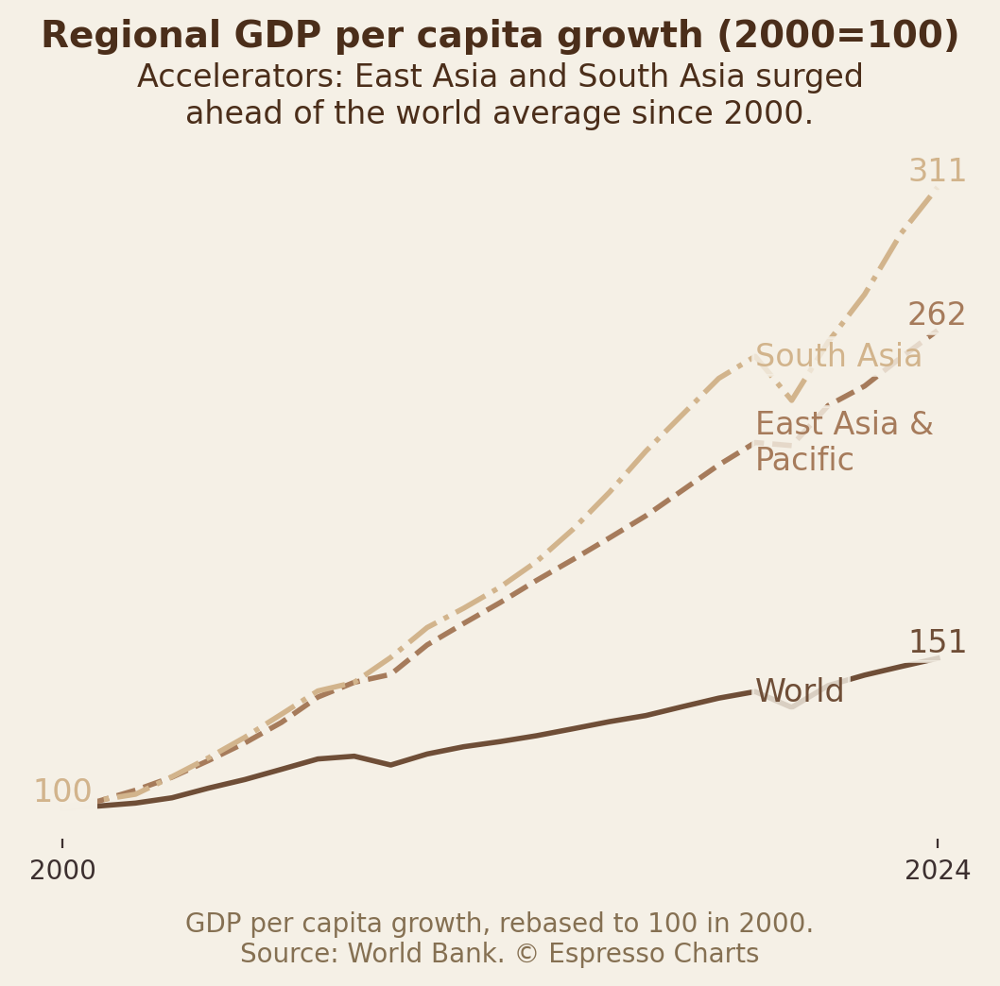

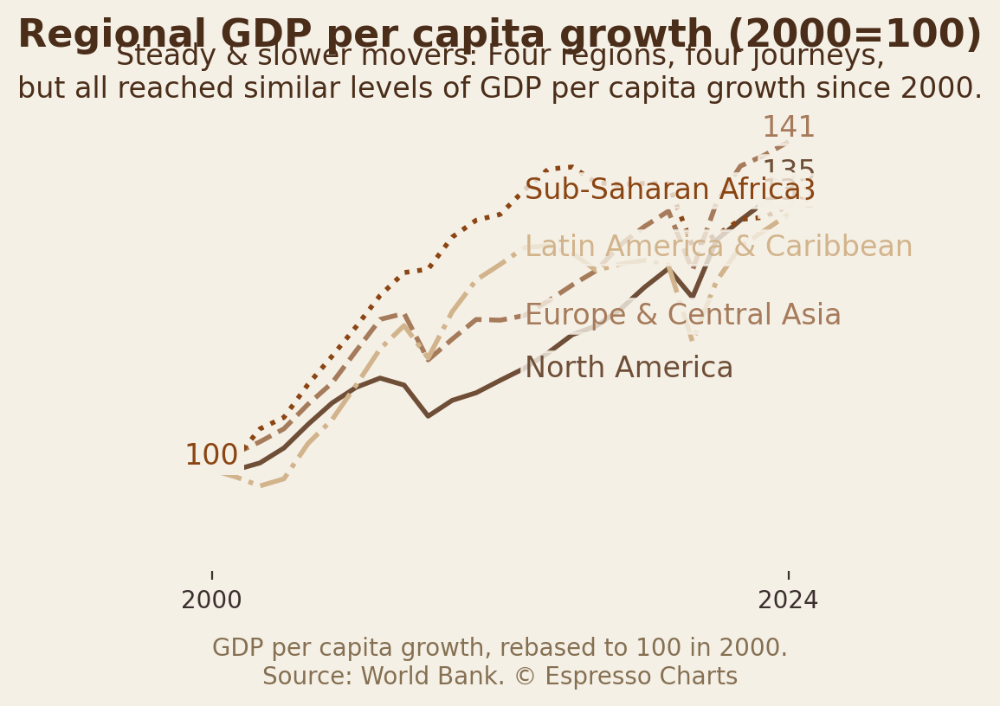

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts'>)

In [ ]:
# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=dfRegions_ts_idx,
    colDim='date',
    colMeasureList=["World","East Asia & Pacific","South Asia"],
    txtTitle="Regional GDP per capita growth (2000=100)",
    txtSup="Accelerators: East Asia and South Asia surged\nahead of the world average since 2000.",
    txtLabel="GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts",
    posText=[0, len(dfRegions_ts_idx)-1],
    posLabel=19,
    lineLabels=["World","East Asia &\nPacific","South Asia"],
    numFormat='{:,.0f}',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],  # World, East Asia, South Asia
    lineStyles=['-','--','-.'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    title_size=14,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(90, 350),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'
)



# --- Chart 2: Steady & Slower Movers ---
eMultiLineChartNew(
    dfChart=dfRegions_ts_idx,
    colDim='date',
    colMeasureList=["North America","Europe & Central Asia","Latin America & Caribbean","Sub-Saharan Africa"],
    txtTitle="Regional GDP per capita growth (2000=100)",
    txtSup="Steady & slower movers: Four regions, four journeys,\nbut all reached similar levels of GDP per capita growth since 2000.",
    txtLabel="GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts",
    posText=[0, len(dfRegions_ts_idx)-1],
    posLabel=13,
    lineLabels=["North America","Europe & Central Asia","Latin America & Caribbean","Sub-Saharan Africa"],
    numFormat='{:,.0f}',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.',':'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    title_size=16,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(90, 200),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'

)




### Regions 2000 vs 2024

In [ ]:
rename_map = {
    "East Asia & Pacific": "East Asia &\nPacific",
    "Europe & Central Asia": "Europe &\nCentral Asia",
    "Latin America & Caribbean": "LatAm",
    "Middle East, North Africa, Afghanistan & Pakistan": "MENA",
    "North America": "North\nAmerica",
    "South Asia": "South Asia",
    "Sub-Saharan Africa": "Sub-Saharan\nAfrica",
    "World": "World"
}

dfRegions_bar = dfRegions_bar.rename(columns={"country": "Region"})
dfRegions_bar["Region"] = dfRegions_bar["Region"].replace(rename_map)
dfRegions_bar

date,Region,2000,2024
0,East Asia &\nPacific,5056.473385,13252.755873
1,Europe &\nCentral Asia,18477.528540,25973.905328
2,LatAm,6742.026937,8873.035389
3,MENA,4004.848871,5466.089026
4,North\nAmerica,47364.745673,63990.595935
5,South Asia,758.133172,2355.248324
6,Sub-Saharan\nAfrica,1197.832861,1589.329825
7,World,7858.907966,11851.505172


In [ ]:
dfRegions_bar = dfRegions_bar.sort_values(by=2024, ascending=False).reset_index(drop=True)


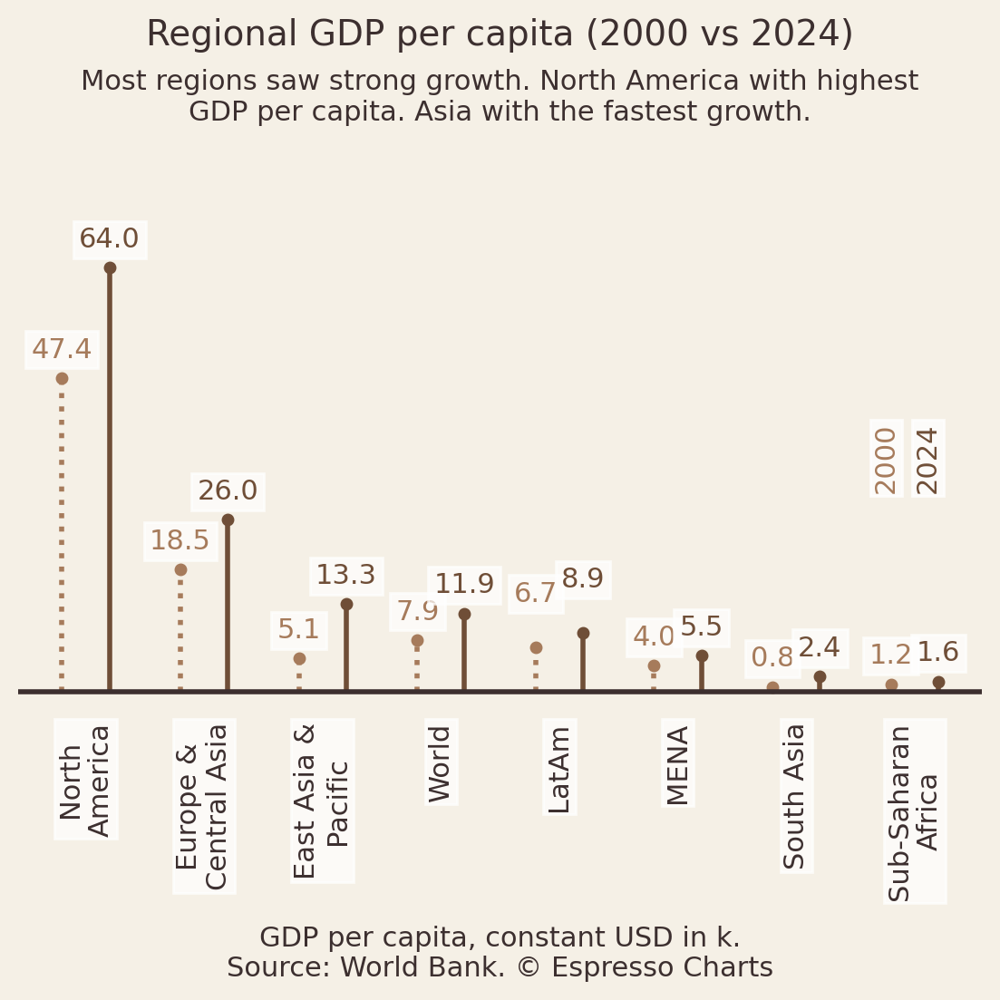

In [ ]:
fig, ax = eStemChartNew(
    dfChart=dfRegions_bar,
    colDim="Region",          # <-- region names
    colMeasureA=2000,       # <-- first comparison year
    colMeasureB=2024,       # <-- second comparison year
    txtTitle="Most regions saw strong growth. North America with highest\nGDP per capita. Asia with the fastest growth.",
    txtSup="Regional GDP per capita (2000 vs 2024)",
    txtLabel="GDP per capita, constant USD in k.\nSource: World Bank. © Espresso Charts",
    numFormat="{:,.1f}",
    numDivisor=1000,
    lineWidth=2,
    suptitle_y=0.94,
    title_pad=80,
    labelpad=10,
    titleColor="#3C2F2F",
    subTitleColor="#3C2F2F",
    axisLabelColor="#3C2F2F",
    tickLabelColor="#3C2F2F",
    faceColor="#F5F0E6",
    colorA="#A67B5B",    # bars for 2000
    colorB="#6F4E37",    # bars for 2024
    instagram=True,
    rotateLabels=True,   # regions fit better if rotated,
    xtick_align_va="top",
    xtick_align_ha="center",
    offset=0.2,
    yearLabelA=2000,
    yearLabelB=2024,
    label_a_offset_x = 6.65,
    label_b_offset_x = 7,
    label_a_offset_y = 30,
    label_b_offset_y = 30,
    xTickLabelYOffset=0,
    xAxisLineWidth=2,
    xAxisLineColor="#3C2F2F",
    lineFormatA=":",
    lineFormatB="-",
    title_size=11,
    subtitle_size=14,
    label_size=11,
    #valueLabelOffsetPts=50,
    valueLabelCustomOffset={4: 10}
)




### Income groups – Line

In [ ]:
dfIncome_ts_idx

country,date,High income,Low income,Lower middle income,Upper middle income,World
0,2000,100.000000,100.000000,100.000000,100.000000,100.000000
1,2001,101.071777,101.331676,102.274135,102.475570,100.678694
2,2002,102.204630,103.623755,104.872549,106.500303,101.663347
3,2003,104.007127,106.323459,109.055558,111.851371,103.464669
4,2004,107.077963,109.268647,114.669730,119.631765,106.739987
5,2005,109.697065,112.603368,120.175510,127.594654,109.664694
6,2006,112.574311,115.054616,126.301688,137.460538,113.126065
7,2007,115.055500,118.014602,132.616037,149.298126,116.639171
8,2008,115.047188,120.416085,136.311459,157.458926,117.580021
9,2009,110.516610,120.885711,141.980527,161.706131,114.585588


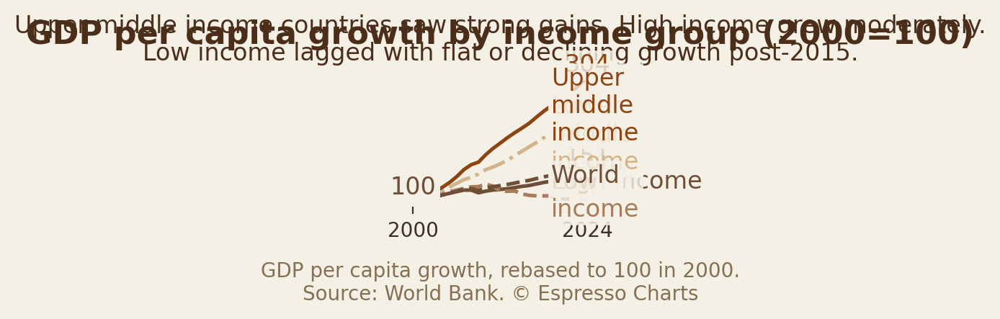

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts'>)

In [ ]:
dfIncome_bar
dfIncome_ts_idx

# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=dfIncome_ts_idx,
    colDim='date',
    colMeasureList=["High income", "Low income", "Lower middle income", "Upper middle income", "World"],
    txtTitle="GDP per capita growth by income group (2000=100)",
    txtSup="Upper middle income countries saw strong gains. High income grew moderately.\nLow income lagged with flat or declining growth post-2015.",
    txtLabel="GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts",
    posText=[0, len(dfRegions_ts_idx)-1],
    posLabel=19,
    lineLabels=["High income", "Low\nincome", "Lower\nmiddle\nincome", "Upper\nmiddle\nincome", "World"],
    numFormat='{:,.0f}',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.'],
    lineWidths=[1.8],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    title_size=16,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(90, 350),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'
)





In [ ]:
dfIncome_bar

rename_map = {
    "High income": "High\nincome",
    "Low income": "Low\nincome",
    "Lower middle income": "Lower\nmiddle\nincome",
    "Upper middle income": "Upper\nmiddle\nincome",
    "World": "World"
}

dfIncome_bar = dfIncome_bar.rename(columns={"country": "income"})
dfIncome_bar["income"] = dfIncome_bar["income"].replace(rename_map)
dfIncome_bar

date,income,2000,2024
0,High\nincome,30158.070078,41776.335945
1,Low\nincome,682.327707,663.925597
2,Lower\nmiddle\nincome,1026.703806,2425.468112
3,Upper\nmiddle\nincome,3401.758185,10332.059446
4,World,7858.907966,11851.505172


In [ ]:
dfIncome_bar = dfIncome_bar.sort_values(by=2024, ascending=False).reset_index(drop=True)
dfIncome_bar

date,income,2000,2024
0,High\nincome,30158.070078,41776.335945
1,World,7858.907966,11851.505172
2,Upper\nmiddle\nincome,3401.758185,10332.059446
3,Lower\nmiddle\nincome,1026.703806,2425.468112
4,Low\nincome,682.327707,663.925597


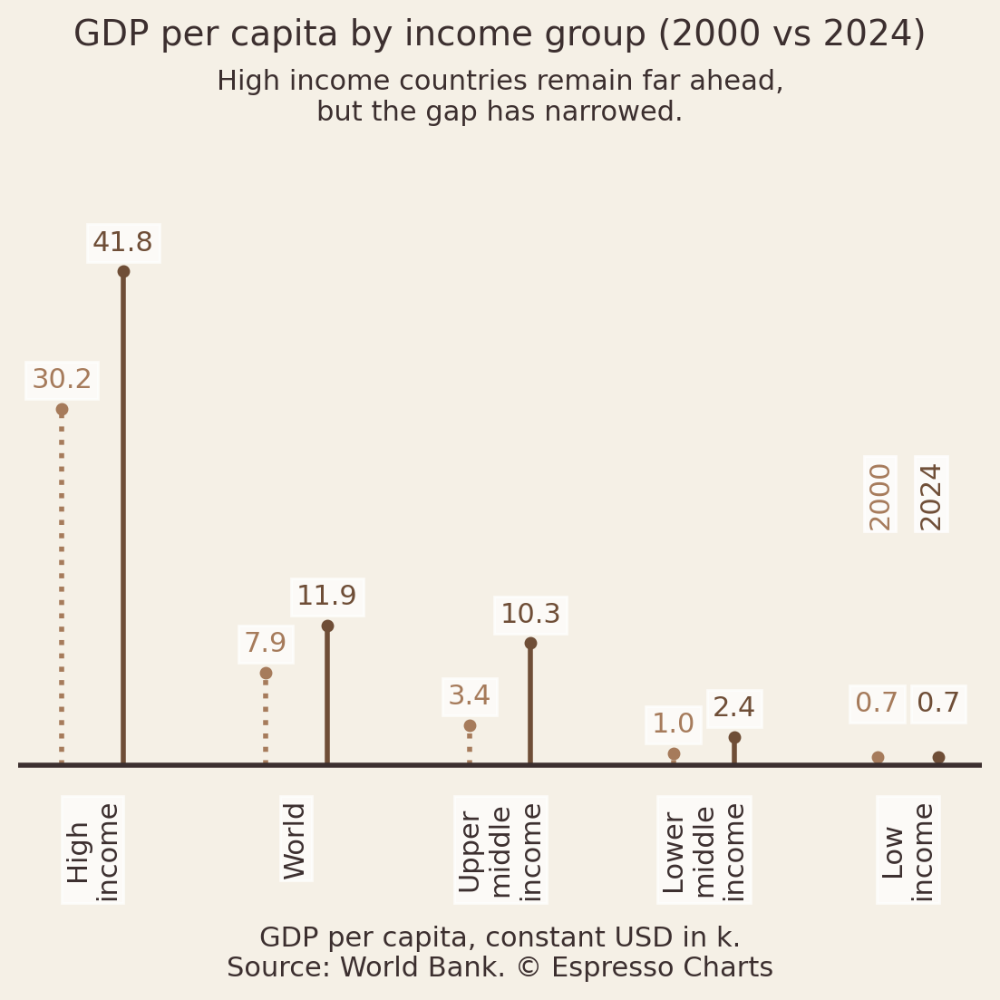

In [ ]:
fig, ax = eStemChartNew(
    dfChart=dfIncome_bar,
    colDim="income",          # <-- region names
    colMeasureA=2000,       # <-- first comparison year
    colMeasureB=2024,       # <-- second comparison year
    txtTitle="High income countries remain far ahead,\nbut the gap has narrowed.",
    txtSup="GDP per capita by income group (2000 vs 2024)",
    txtLabel="GDP per capita, constant USD in k.\nSource: World Bank. © Espresso Charts",
    numFormat="{:,.1f}",
    numDivisor=1000,
    lineWidth=2,
    suptitle_y=0.94,
    title_pad=80,
    labelpad=10,
    titleColor="#3C2F2F",
    subTitleColor="#3C2F2F",
    axisLabelColor="#3C2F2F",
    tickLabelColor="#3C2F2F",
    faceColor="#F5F0E6",
    colorA="#A67B5B",    # bars for 2000
    colorB="#6F4E37",    # bars for 2024
    instagram=True,
    rotateLabels=True,   # regions fit better if rotated,
    xtick_align_va="top",
    xtick_align_ha="center",
    offset=0.15,
    yearLabelA=2000,
    yearLabelB=2024,
    label_a_offset_x = 3.80,
    label_b_offset_x = 4.05,
    label_a_offset_y = 20,
    label_b_offset_y = 20,
    xTickLabelYOffset=0,
    xAxisLineWidth=2,
    xAxisLineColor="#3C2F2F",
    lineFormatA=":",
    lineFormatB="-",
    title_size=11,
    subtitle_size=14,
    label_size=11,
    #valueLabelOffsetPts=50,
    valueLabelCustomOffset={4: 10}
)



### Countries - line and bar

In [ ]:
dfCountries2_ts_idx

country,date,Bangladesh,Brazil,China,Germany,India,Mexico,Nigeria,United States
0,2000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,2001,103.340279,100.077001,107.528727,101.465308,102.881347,98.083703,103.079267,99.961268
2,2002,105.658057,101.860416,116.683626,101.063648,104.877971,96.454895,115.665644,100.722210
3,2003,109.066929,101.813730,127.692074,100.472571,111.176731,96.243225,120.787706,102.651929
4,2004,113.229313,106.468342,139.796312,101.662218,117.958473,98.323101,128.355386,105.619710
5,2005,119.118724,108.680018,154.900812,102.620671,125.244802,99.056015,132.888689,108.296231
6,2006,125.599294,111.796440,173.562149,106.708984,133.240026,102.419736,137.102494,110.243612
7,2007,133.026235,117.387906,197.089134,109.938842,141.303180,103.086272,142.144036,111.388320
8,2008,139.625096,122.191673,215.043456,111.126089,143.584003,102.550337,147.591833,110.465035
9,2009,145.308905,120.949810,234.096095,105.230943,152.649050,94.699932,155.070581,106.679584


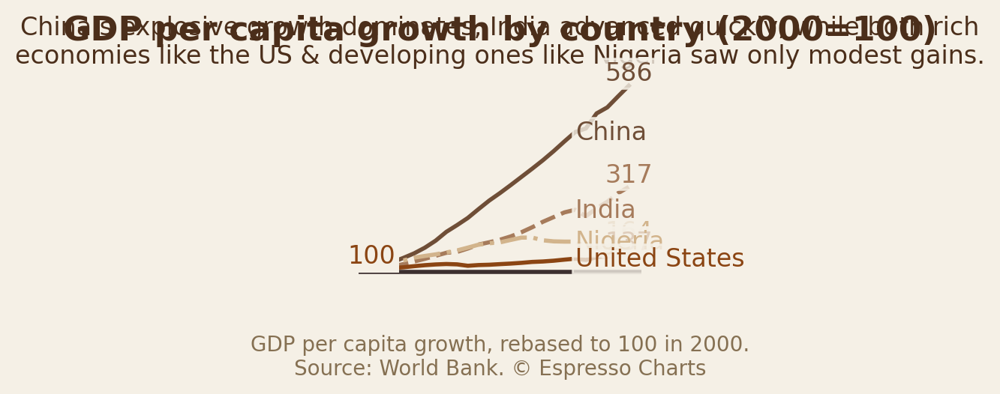

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts'>)

In [ ]:


# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=dfCountries2_ts_idx,
    colDim='date',
    colMeasureList=["China", "India", "Nigeria", "United States"],
    txtTitle="GDP per capita growth by country (2000=100)",
    txtSup="China’s explosive growth dominates, India advanced quickly, while both rich\neconomies like the US & developing ones like Nigeria saw only modest gains.",
    txtLabel="GDP per capita growth, rebased to 100 in 2000.\nSource: World Bank. © Espresso Charts",
    posText=[0, len(dfRegions_ts_idx)-1],
    posLabel=19,
    lineLabels=["China", "India", "Nigeria", "United States"],
    numFormat='{:,.0f}',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#3C2F2F',
    zeroLineStyle='-',
    zeroLineWidth=2,
    zeroLineAt=90,
    title_size=16,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(90, 700),   # y-axis starts at 80, top auto
    tickColor='#F5F0E6'
)



In [ ]:

dfCountries2_bar = dfCountries2_bar.sort_values(by=2024, ascending=False).reset_index(drop=True)

dfCountries2_bar



date,country,2000,2024
0,United States,48379.755171,66356.170675
1,Germany,35104.130847,44027.763155
2,China,2237.442985,13121.676991
3,Mexico,9581.969702,10316.461190
4,Brazil,6817.783456,9566.744086
5,India,756.704110,2396.949992
6,Nigeria,1421.679880,2324.648812
7,Bangladesh,620.560473,1941.278744


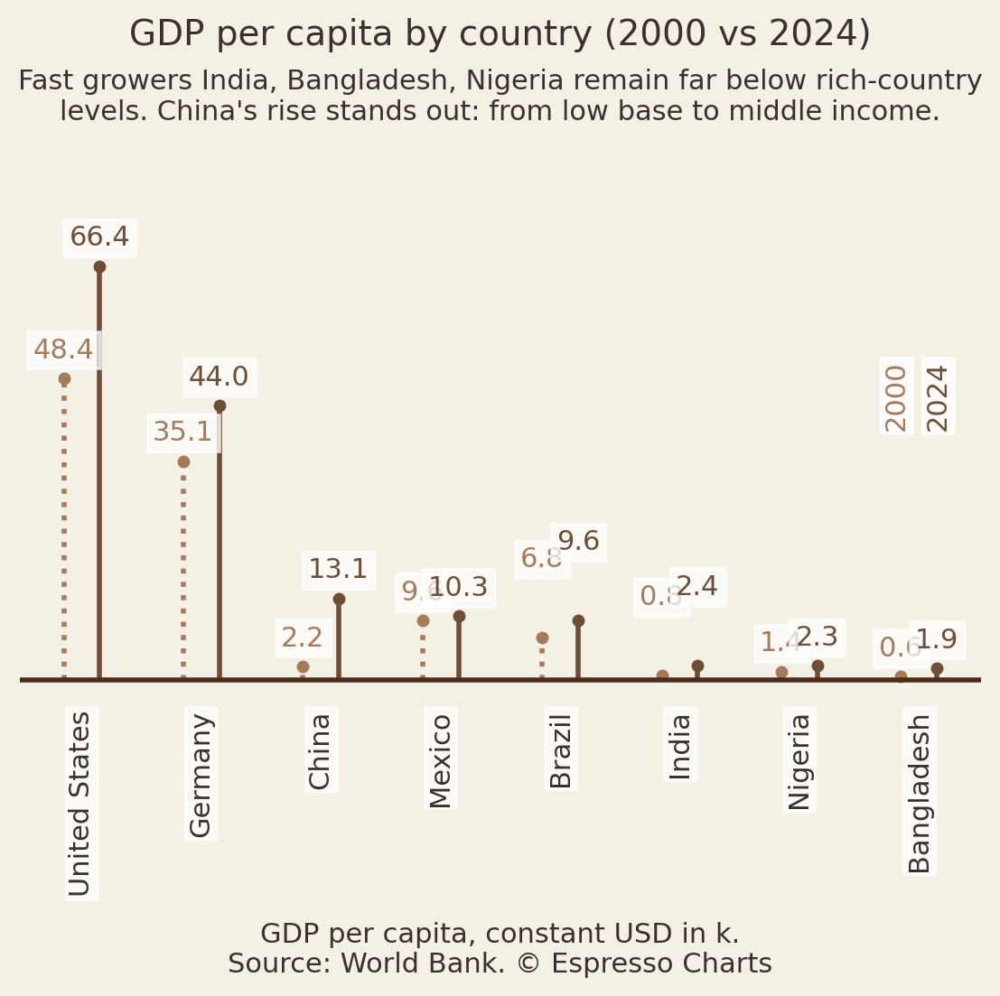

In [ ]:
fig, ax = eStemChartNew(
    dfChart=dfCountries2_bar,
    colDim="country",          # <-- region names
    colMeasureA=2000,       # <-- first comparison year
    colMeasureB=2024,       # <-- second comparison year
    txtTitle="Fast growers India, Bangladesh, Nigeria remain far below rich-country\nlevels. China's rise stands out: from low base to middle income.",
    txtSup="GDP per capita by country (2000 vs 2024)",
    txtLabel="GDP per capita, constant USD in k.\nSource: World Bank. © Espresso Charts",
    numFormat="{:,.1f}",
    numDivisor=1000,
    lineWidth=2,
    suptitle_y=0.94,
    title_pad=80,
    labelpad=10,
    titleColor="#3C2F2F",
    subTitleColor="#3C2F2F",
    axisLabelColor="#3C2F2F",
    tickLabelColor="#3C2F2F",
    faceColor="#F5F0E6",
    colorA="#A67B5B",    # bars for 2000 #6F4E37, #A67B5B,
    colorB="#6F4E37",    # bars for 2024
    instagram=True,
    rotateLabels=True,   # regions fit better if rotated,
    xtick_align_va="top",
    xtick_align_ha="center",
    offset=0.15,
    yearLabelA=2000,
    yearLabelB=2024,
    label_a_offset_x = 6.7,
    label_b_offset_x = 7.05,
    label_a_offset_y = 40,
    label_b_offset_y = 40,
    xTickLabelYOffset=0,
    xAxisLineWidth=2,
    xAxisLineColor="#4b2e1a",
    lineFormatA=":",
    lineFormatB="-",
    title_size=11,
    subtitle_size=14,
    label_size=11,
    #valueLabelOffsetPts=50,
    valueLabelCustomOffset={4: 20, 5: 20}
)


Here’s the coffee-inspired palette I used when generating the mock-up charts earlier ☕️:

Coffee Brown: #6F4E37

Latte Cream: #F5F0E6

Espresso Dark: #3C2F2F

Mocha: #A67B5B

Cappuccino: #D2B48C

Accent (Rich Brown): #8B4513

👉 Typically:

Backgrounds → #F5F0E6 (Latte Cream)

Axes/labels → #3C2F2F (Espresso Dark)

Lines/bars → variations of #6F4E37, #A67B5B, #D2B48C, #8B4513

GDP per capita surged in East & South Asia since 2000, while Sub-Saharan Africa lagged.
Source: World Bank

GDP per capita rose everywhere, but levels differ: North America on top, East Asia tripled, South Asia grew from very low levels.
Source: World Bank

GDP per capita in upper middle income countries more than tripled; low income stalled after 2015.
Source: World Bank

GDP per capita in upper middle income jumped from $3.4k to $10k; low income barely moved.
Source: World Bank

GDP per capita in China grew nearly 6× since 2000; India also rose fast, others lagged.
Source: World Bank

GDP per capita in China rose from $2.2k to $13k; India and Bangladesh grew but remain far behind.
Source: World Bank


# Product series

In [ ]:

csv = """Category,Sales 2024,Share
Powdered &\\nLiquid\\nBeverages,24598,26.93
Water,3180,3.48
Milk\\nProducts &\\nIce\\nCream,10397,11.38
Nutrition &\\nHealth\\nScience,15137,16.57
Prepared\\nDishes &\\nCooking\\nAids,10711,11.72
Confect-\\nionery,8449,9.25
PetCare,18882,20.67
"""

dfProductsNestle = pd.read_csv(StringIO(csv))

# 🔹 Fix labels
dfProductsNestle['Category'] = dfProductsNestle['Category'].str.replace(r'\\n', '\n', regex=True)
dfProductsNestle=dfProductsNestle.sort_values(by='Share', ascending=True)
dfProductsNestle

,Category,Sales 2024,Share
1,Water,3180,3.48
5,Confect-\nionery,8449,9.25
2,Milk\nProducts &\nIce\nCream,10397,11.38
4,Prepared\nDishes &\nCooking\nAids,10711,11.72
3,Nutrition &\nHealth\nScience,15137,16.57
6,PetCare,18882,20.67
0,Powdered &\nLiquid\nBeverages,24598,26.93


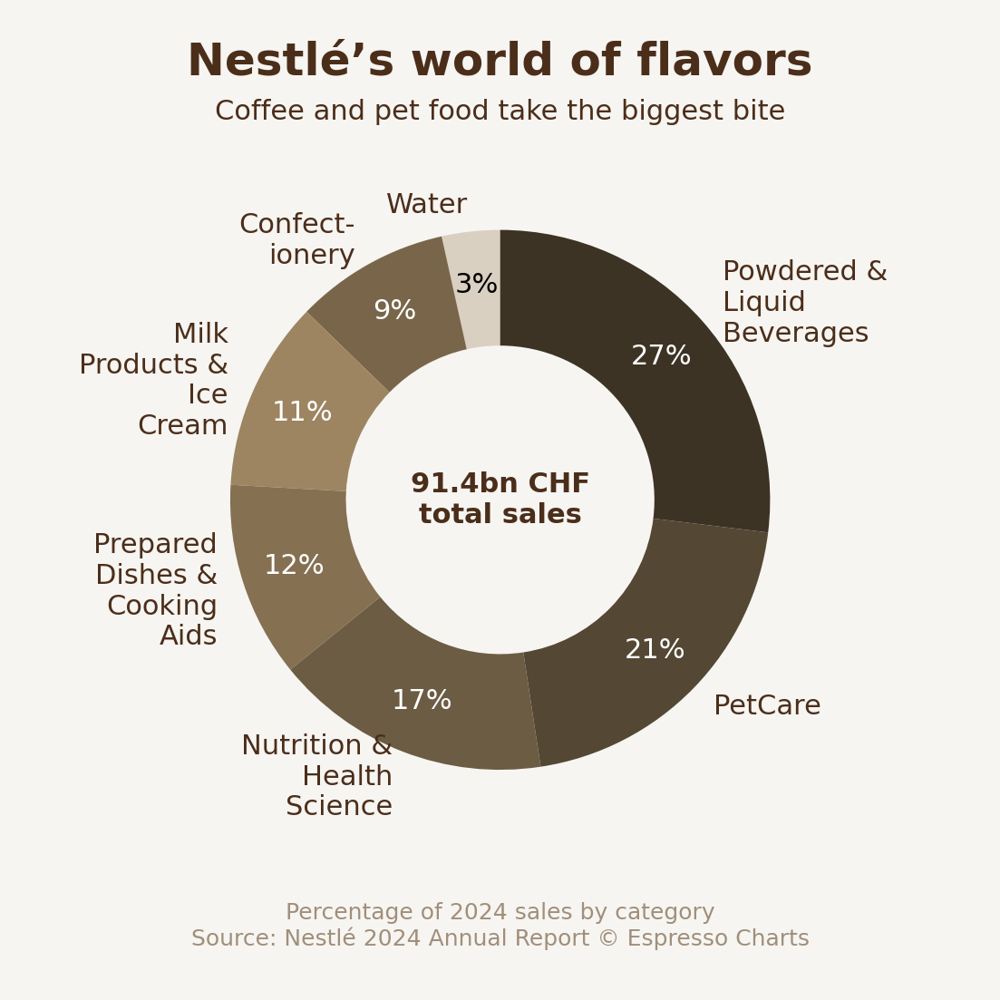

(<Figure size 1080x1080 with 1 Axes>, <Axes: >)

In [ ]:
eDonutChart(
    dfProductsNestle,
    colValue="Share",
    colLabel="Category",
    txtTitle="Nestlé’s world of flavors",
    txtSup="Coffee and pet food take the biggest bite",
    txtLabel="Percentage of 2024 sales by category\nSource: Nestlé 2024 Annual Report © Espresso Charts",
    txtLabelColor="#a08f7a",
    instagram=True,      # 🔹 ensures square canvas
    px=1080,             # 🔹 Instagram standard size
    dpi=200,             # resolution
    radius_outer=0.7,    # size of donut
    wedge_width=0.3,     # thickness of ring
    labeldistance=1.1,
    pctColors=["#000000", "#ffffff", "#ffffff", "#ffffff", "#ffffff", "#ffffff", "#ffffff"],
    labelColors=["#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a"],
    centerText="91.4bn CHF\ntotal sales",  # text in the hole
    centerTextSize=11,
    centerTextColor="#4b2e1a",
    centerTextWeight="bold",
    title_size=18,
    subtitle_size=11,
    label_size=11,
    bottom_note_size=9,
)

#79664a → mid warm brown, lighter than title color but still earthy

#9d8c75 → a softer beige-brown, less contrast

#b3a693 → light taupe, blends with background

#a08f7a → warm stone-like tone
#Coffee Brown: #6F4E37
#Latte Cream: #F5F0E6
#Espresso Dark: #3C2F2F
#Mocha: #A67B5B
#Cappuccino: #D2B48C
#Accent (Rich Brown): #8B4513

#Backgrounds → #F5F0E6 (Latte Cream)
#Axes/labels → #3C2F2F (Espresso Dark)
#Lines/bars → variations of #6F4E37, #A67B5B, #D2B48C, #8B4513

Nestlé isn’t just about chocolate - here’s how the company's product mix stacks up:

Powdered & Liquid Beverages 26.9%
Top brands: Nescafé, Nespresso, Starbucks RTD

PetCare 20.7%
Top brands: Purina ONE, Felix, Pro Plan

Nutrition & Health Science 16.6%
Top brands: Boost, Garden of Life, Vital Proteins

Prepared Dishes & Cooking Aids 11.7%
Top brands: Maggi, Stouffer’s, Hot Pockets

Milk Products & Ice Cream 11.4%
Top brands: Nido, Häagen-Dazs, Mövenpick

Confectionery 9.2%
Top brands: KitKat, Smarties, Aero

Water 3.5%
Top brands: Perrier, San Pellegrino, Pure Life


## Unilever

In [ ]:

dfProductsUnilever = pd.read_csv(io.StringIO('''
Category,Sales_EUR_bn,Share
Beauty &\\nWellbeing,13.2,0.2171052632
Personal\\nCare,13.6,0.2236842105
Home\\nCare,12.3,0.2023026316
Foods,13.4,0.2203947368
Ice\\nCream,8.3,0.1365131579
'''))

dfProductsUnilever = pd.read_csv(io.StringIO('''
Category,Sales_EUR_bn,Share
"Beauty &\\nWellbeing\\n(Sunsilk, TRESemmé, ...)",13.2,0.2171052632
"Personal Care\\n(Dove, Rexona, ...)",13.6,0.2236842105
"Home Care\\n(Persil,\\nDomestos)",12.3,0.2023026316
"Foods\\n(Hellmann’s,\\nKnorr)",13.4,0.2203947368
"Ice Cream\\n(Magnum,\\nBen & Jerry’s, ...)",8.3,0.1365131579
'''))



# 🔹 Fix labels
dfProductsUnilever['Category'] = dfProductsUnilever['Category'].str.replace(r'\\n', '\n', regex=True)
dfProductsUnilever=dfProductsUnilever.sort_values(by='Share', ascending=True)
dfProductsUnilever


,Category,Sales_EUR_bn,Share
4,"Ice Cream\n(Magnum,\nBen & Jerry’s, ...)",8.3,0.136513
2,"Home Care\n(Persil,\nDomestos)",12.3,0.202303
0,"Beauty &\nWellbeing\n(Sunsilk, TRESemmé, ...)",13.2,0.217105
3,"Foods\n(Hellmann’s,\nKnorr)",13.4,0.220395
1,"Personal Care\n(Dove, Rexona, ...)",13.6,0.223684


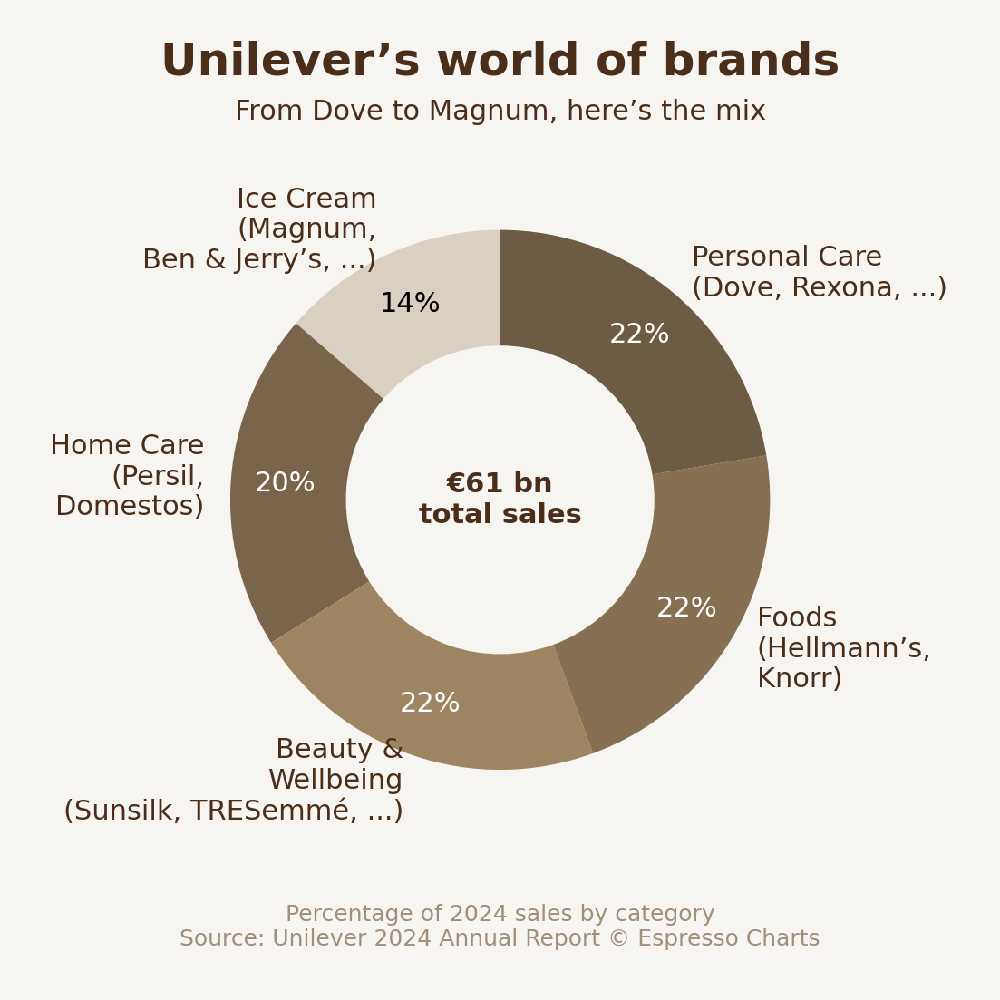

(<Figure size 1080x1080 with 1 Axes>, <Axes: >)

In [ ]:
eDonutChart(
    dfProductsUnilever,
    colValue="Share",
    colLabel="Category",
    txtTitle="Unilever’s world of brands",
    txtSup="From Dove to Magnum, here’s the mix",
    txtLabel="Percentage of 2024 sales by category\nSource: Unilever 2024 Annual Report © Espresso Charts",
    txtLabelColor="#a08f7a",
    instagram=True,      # 🔹 ensures square canvas
    px=1080,             # 🔹 Instagram standard size
    dpi=200,             # resolution
    radius_outer=0.7,    # size of donut
    wedge_width=0.3,     # thickness of ring
    labeldistance=1.1,
    pctColors=["#000000", "#ffffff", "#ffffff", "#ffffff", "#ffffff", "#ffffff", "#ffffff"],
    labelColors=["#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a"],
    centerText="€61 bn\ntotal sales",  # text in the hole
    centerTextSize=11,
    centerTextColor="#4b2e1a",
    centerTextWeight="bold",
    title_size=18,
    subtitle_size=11,
    label_size=11,
    bottom_note_size=9,
)


## P&G

In [ ]:
csv='''
Segment,Share,Net_sales_USD_bn
Fabric &\\nHome\\nCare,36,30.348
"Baby,\\nFeminine &\\nFamily\\nCare",24,20.232
Beauty,18,15.174
Health\\nCare,14,11.802
Grooming,8,6.744
'''

dfProductsPG = pd.read_csv(StringIO(csv))

# 🔹 Fix labels
dfProductsPG['Segment'] = dfProductsPG['Segment'].str.replace(r'\\n', '\n', regex=True)
dfProductsPG=dfProductsPG.sort_values(by='Share', ascending=True)
dfProductsPG


,Segment,Share,Net_sales_USD_bn
4,Grooming,8,6.744
3,Health\nCare,14,11.802
2,Beauty,18,15.174
1,"Baby,\nFeminine &\nFamily\nCare",24,20.232
0,Fabric &\nHome\nCare,36,30.348


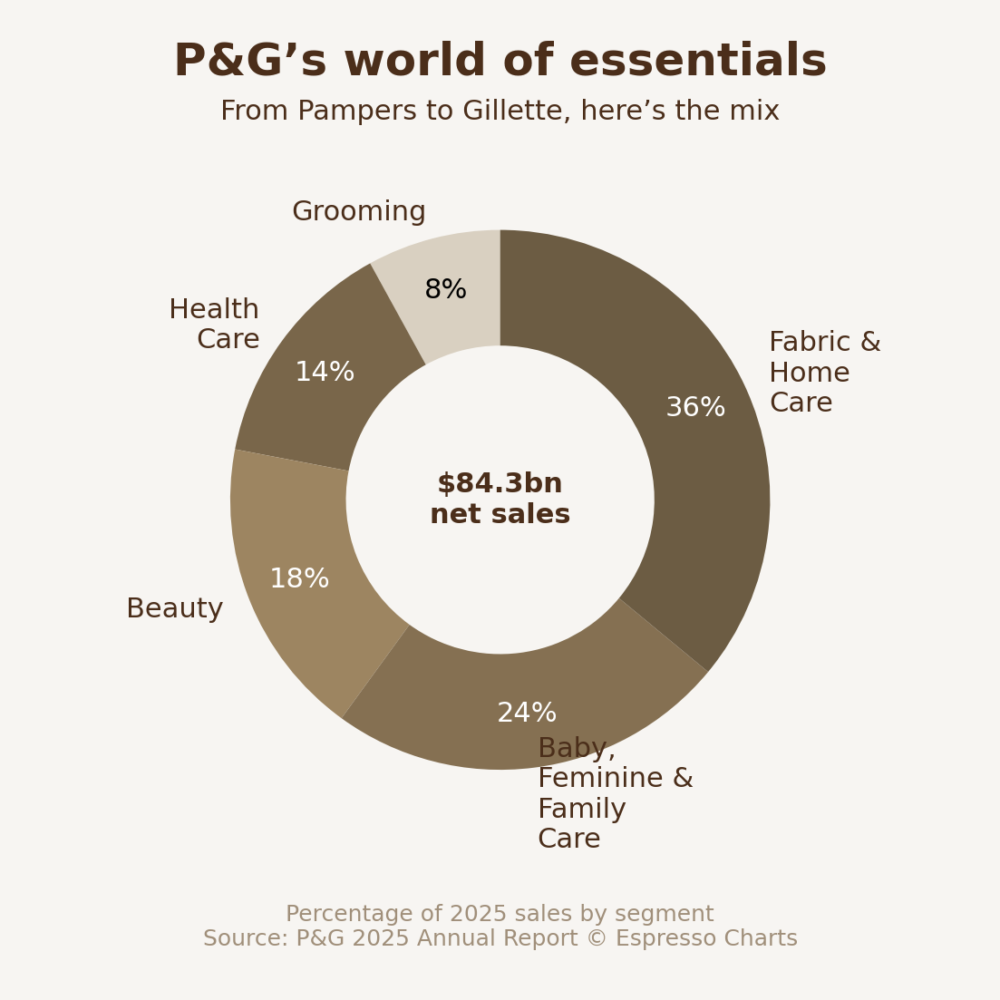

(<Figure size 1080x1080 with 1 Axes>, <Axes: >)

In [ ]:
eDonutChart(
    dfProductsPG,
    colValue="Share",
    colLabel="Segment",
    txtTitle = "P&G’s world of essentials",
    txtSup = "From Pampers to Gillette, here’s the mix",
    txtLabel="Percentage of 2025 sales by segment\nSource: P&G 2025 Annual Report © Espresso Charts",
    txtLabelColor="#a08f7a",
    instagram=True,      # 🔹 ensures square canvas
    px=1080,             # 🔹 Instagram standard size
    dpi=200,             # resolution
    radius_outer=0.7,    # size of donut
    wedge_width=0.3,     # thickness of ring
    labeldistance=1.1,
    pctColors=["#000000", "#ffffff", "#ffffff", "#ffffff", "#ffffff", "#ffffff", "#ffffff"],
    labelColors=["#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a", "#4b2e1a"],
    centerText="$84.3bn\nnet sales",  # text in the hole
    centerTextSize=11,
    centerTextColor="#4b2e1a",
    centerTextWeight="bold",
    title_size=18,
    subtitle_size=11,
    label_size=11,
    bottom_note_size=9,
)


# Aviation statistics

## Longest non stop commercial flight

In [ ]:

dfLongestNonStop = pd.DataFrame({
    'Route': [
        'New York → Singapore · A350-900 · 18h50',
        'Newark → Singapore · A350-900 · 18h45',
        'Doha → Auckland · A350-1000 · 17h35',
        'Perth → London · B787-9 · 17h25',
        'Dallas → Melbourne · B787-9 · 17h20'
    ],
    'Distance_km': [15349, 15344, 14535, 14499, 14472]
})


dfLongestNonStop = dfLongestNonStop.sort_values(by="Distance_km", ascending=True).reset_index(drop=True)

dfLongestNonStop

,Route,Distance_km
0,Dallas → Melbourne · B787-9 · 17h20,14472
1,Perth → London · B787-9 · 17h25,14499
2,Doha → Auckland · A350-1000 · 17h35,14535
3,Newark → Singapore · A350-900 · 18h45,15344
4,New York → Singapore · A350-900 · 18h50,15349


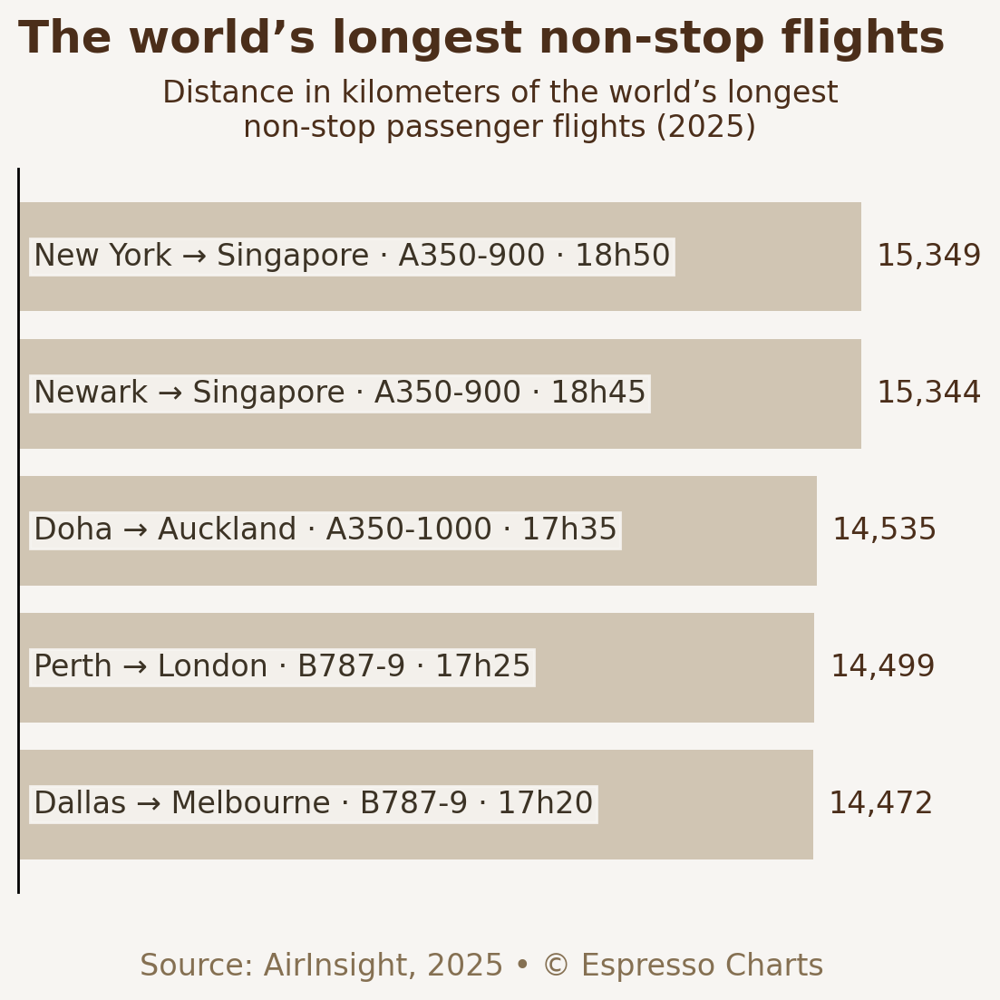

In [ ]:
fig, ax = eSingleBarChartNew(
    dfChart=dfLongestNonStop,
    colDim="Route",
    colMeasure="Distance_km",
    txtTitle="The world’s longest non-stop flights",
    txtSup="Distance in kilometers of the world’s longest\nnon-stop passenger flights (2025)",
    txtLabel="\nSource: AirInsight, 2025 • © Espresso Charts",
    numFormat="{:,.0f}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F7F5F2',
    title_size=18,
    subtitle_size=12,
    label_size=12
)

#    titleColor="#3C2F2F",
#    subTitleColor="#3C2F2F",
#    axisLabelColor="#3C2F2F",
#    tickLabelColor="#3C2F2F",
#    faceColor="#F5F0E6",
#    colorA="#A67B5B",    # bars for 2000 #6F4E37, #A67B5B,
#    colorB="#6F4E37",    # bars for 2024

## Most expensive passenger aircraft (2025)

In [ ]:
dfMostExpensivePlanes = pd.DataFrame({
    'Aircraft': [
        'Boeing 777-9',
        'Boeing 747-8',
        'Airbus A380',
        'Airbus A350-1000',
        'Airbus A350-900'
    ],
    'ListPrice_USD_million': [442, 418, 412, 356, 308]
})
dfMostExpensivePlanes = dfMostExpensivePlanes.sort_values(by="ListPrice_USD_million", ascending=True).reset_index(drop=True)


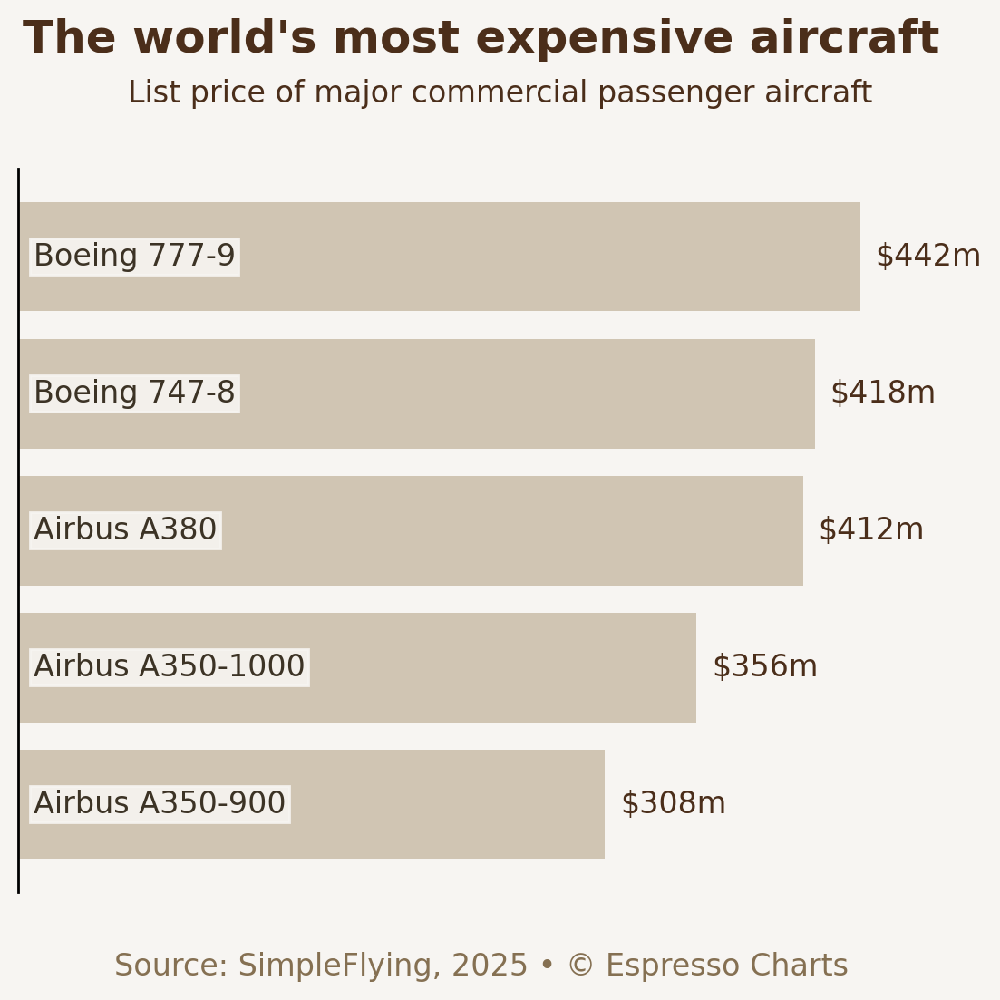

In [ ]:
fig, ax = eSingleBarChartNew(
    dfChart=dfMostExpensivePlanes,
    colDim="Aircraft",
    colMeasure="ListPrice_USD_million",
    txtTitle="The world's most expensive aircraft",
    txtSup="List price of major commercial passenger aircraft",
    txtLabel="\nSource: SimpleFlying, 2025 • © Espresso Charts",
    numFormat="${:,.0f}m",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F7F5F2',
    title_size=18,
    subtitle_size=12,
    label_size=12
)

## Fastest Passenger Aircraft (Active Commercial Jets)

In [ ]:
dfFastestPlanes = pd.DataFrame({
    'Aircraft': [
        'Boeing 747-8',
        'Boeing 787 Dreamliner',
        'Boeing 777-300ER',
        'Airbus A380',
        'Boeing 747-400'
    ],
    'TopSpeed_kmh': [1136, 1111, 1095, 1020, 1010]
})

dfFastestPlanes = dfFastestPlanes.sort_values(by="TopSpeed_kmh", ascending=True).reset_index(drop=True)


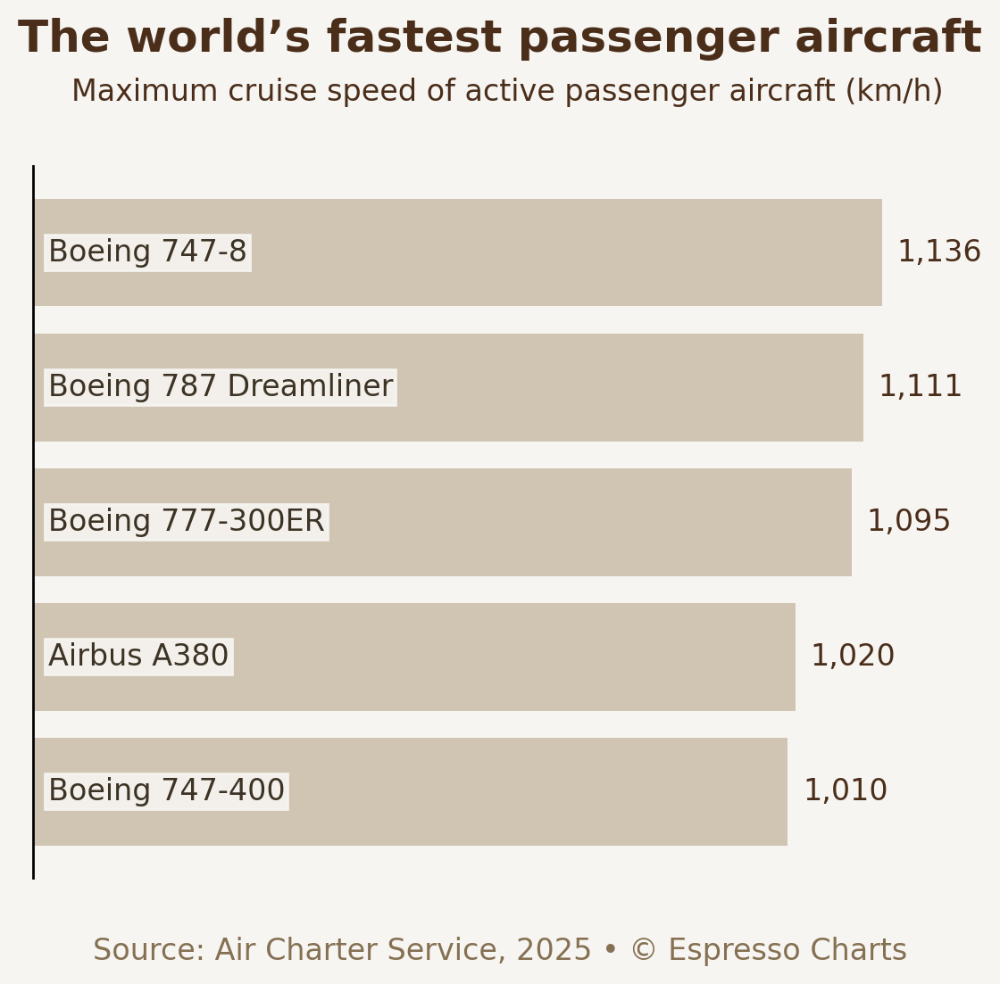

In [ ]:
fig, ax = eSingleBarChartNew(
    dfChart=dfFastestPlanes,
    colDim="Aircraft",
    colMeasure="TopSpeed_kmh",
    txtTitle="The world’s fastest passenger aircraft",
    txtSup="Maximum cruise speed of active passenger aircraft (km/h)",
    txtLabel="\nSource: Air Charter Service, 2025 • © Espresso Charts",
    numFormat="{:,.0f}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F7F5F2',
    title_size=18,
    subtitle_size=12,
    label_size=12
)

## Longest Serving

In [ ]:
dfLongestServing = pd.DataFrame({
    'Aircraft': [
        'YV3471 · Boeing 737-200 · Venezolana (Venezuela)',
        'C-GNLK · Boeing 737-200 · Nolinor Aviation (Canada)',
        'C-GMAI · Boeing 737-200 · Air Inuit (Canada)',
        'N902DE · MD-88 · Delta Air Lines (USA)',
        '9G-AGL · Boeing 737-200 · Africa World Airl.'
    ],
    'Age_years': [46.8, 50.9, 44.0, 35.0, 41.0]
})

dfLongestServing = dfLongestServing.sort_values(by="Age_years", ascending=True).reset_index(drop=True)


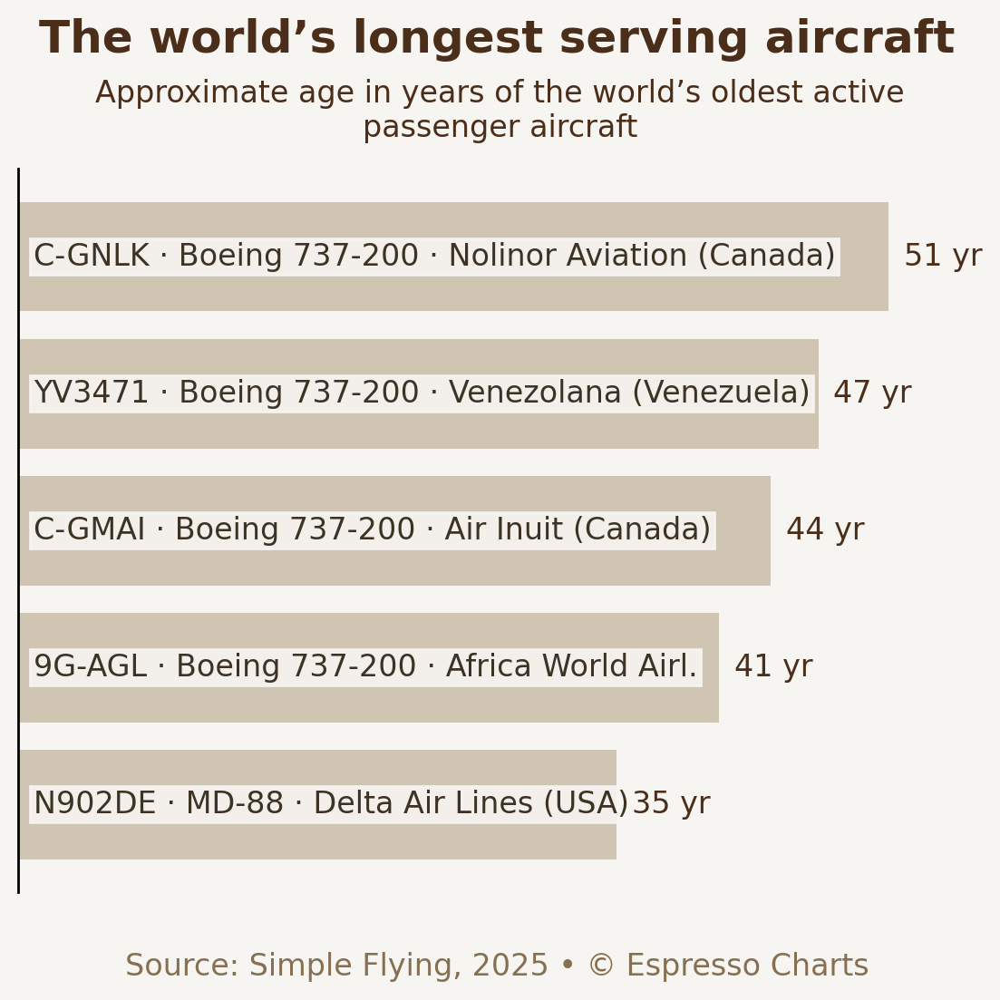

In [ ]:


fig, ax = eSingleBarChartNew(
    dfChart=dfLongestServing,
    colDim="Aircraft",
    colMeasure="Age_years",
    txtTitle="The world’s longest serving aircraft",
    txtSup="Approximate age in years of the world’s oldest active\npassenger aircraft",
    txtLabel="\nSource: Simple Flying, 2025 • © Espresso Charts",
    numFormat="{:,.0f} yr",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F7F5F2',
    title_size=18,
    subtitle_size=12,
    label_size=12
)

# CPI Statistics


In [ ]:

# --- U.S. CPI 12-Month Change (September 2025) ---

df_cpi_sep2025 = pd.DataFrame({
    'Category': [
        'All items','Food','Food at home','Cereals and bakery products',
        'Meats, poultry, fish, and eggs','Dairy and related products',
        'Fruits and vegetables','Nonalcoholic beverages and beverage materials',
        'Other food at home','Food away from home','Full service meals and snacks',
        'Limited service meals and snacks','Energy','Energy commodities','Fuel oil',
        'Gasoline (all types)','Energy services','Electricity','Natural gas (piped)',
        'All items less food and energy','Commodities less food and energy commodities',
        'Apparel','New vehicles','Used cars and trucks','Medical care commodities',
        'Alcoholic beverages','Tobacco and smoking products','Services less energy services',
        'Shelter','Rent of primary residence','Owners\' equivalent rent of residences',
        'Medical care services','Physicians\' services','Hospital services',
        'Transportation services','Motor vehicle maintenance and repair',
        'Motor vehicle insurance','Airline fare'
    ],
    'YoY_Change_pct': [
        3.0,3.1,2.7,1.6,5.2,0.7,1.3,5.3,1.9,3.7,4.2,3.2,2.8,-0.4,4.1,-0.5,6.4,
        5.1,11.7,3.0,1.5,-0.1,0.8,5.1,0.7,2.0,6.9,3.5,3.6,3.4,3.8,3.9,2.4,5.5,
        2.5,7.7,3.1,3.2
    ]
})




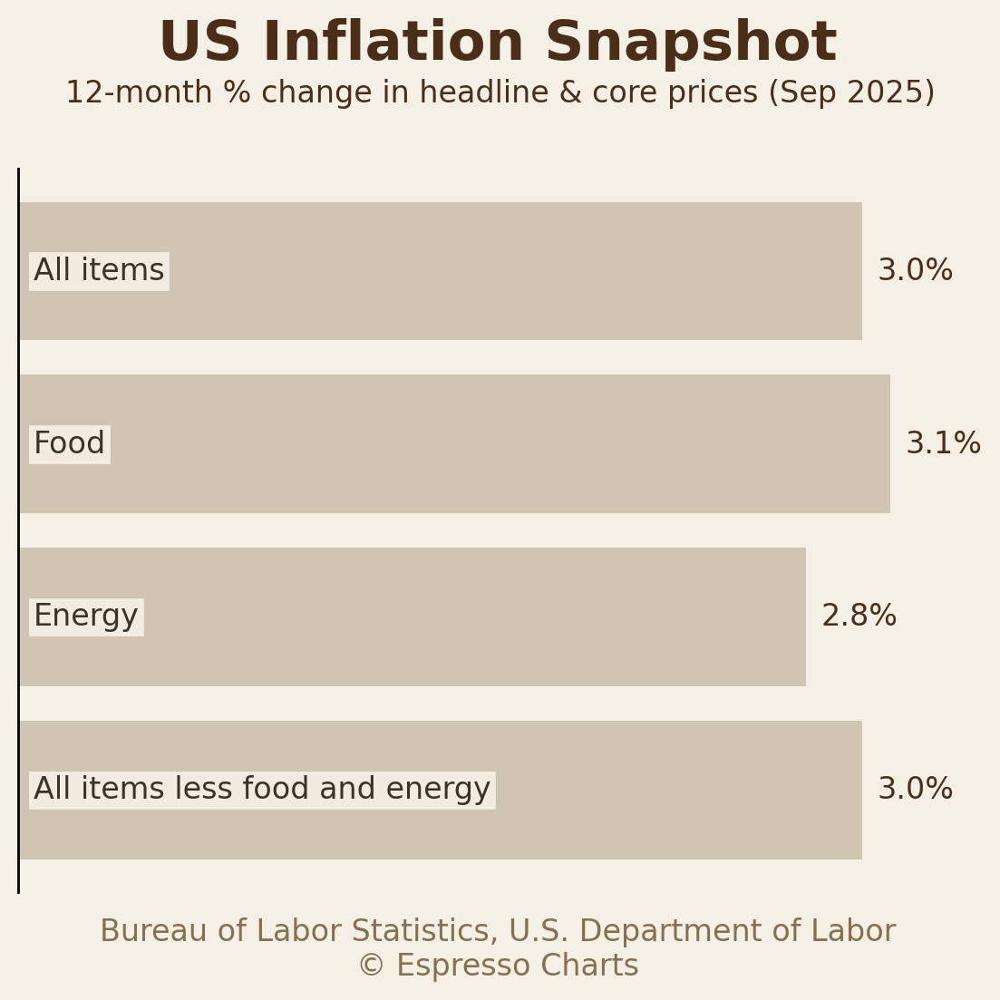

In [ ]:
df_cpi_sep2025_1 = df_cpi_sep2025[
    df_cpi_sep2025['Category'].isin([
        'All items',
        'Food',
        'Energy',
        'All items less food and energy'
    ])
].reset_index(drop=True)

df_cpi_sep2025_1['YoY_Change_pct'] = (df_cpi_sep2025_1['YoY_Change_pct'] / 100)

# Define the new desired order
order = [
    'All items less food and energy',
    'Energy',
    'Food',
    'All items'
]

# Reorder the dataframe based on that order
df_cpi_sep2025_1 = df_cpi_sep2025_1.set_index('Category').loc[order].reset_index()

df_cpi_sep2025_1


fig, ax = eSingleBarChartNew(
    dfChart=df_cpi_sep2025_1,
    colDim="Category",
    colMeasure="YoY_Change_pct",
    txtTitle="US Inflation Snapshot",
    txtSup="12-month % change in headline & core prices (Sep 2025)",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    numFormat="{:,.1%}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12)

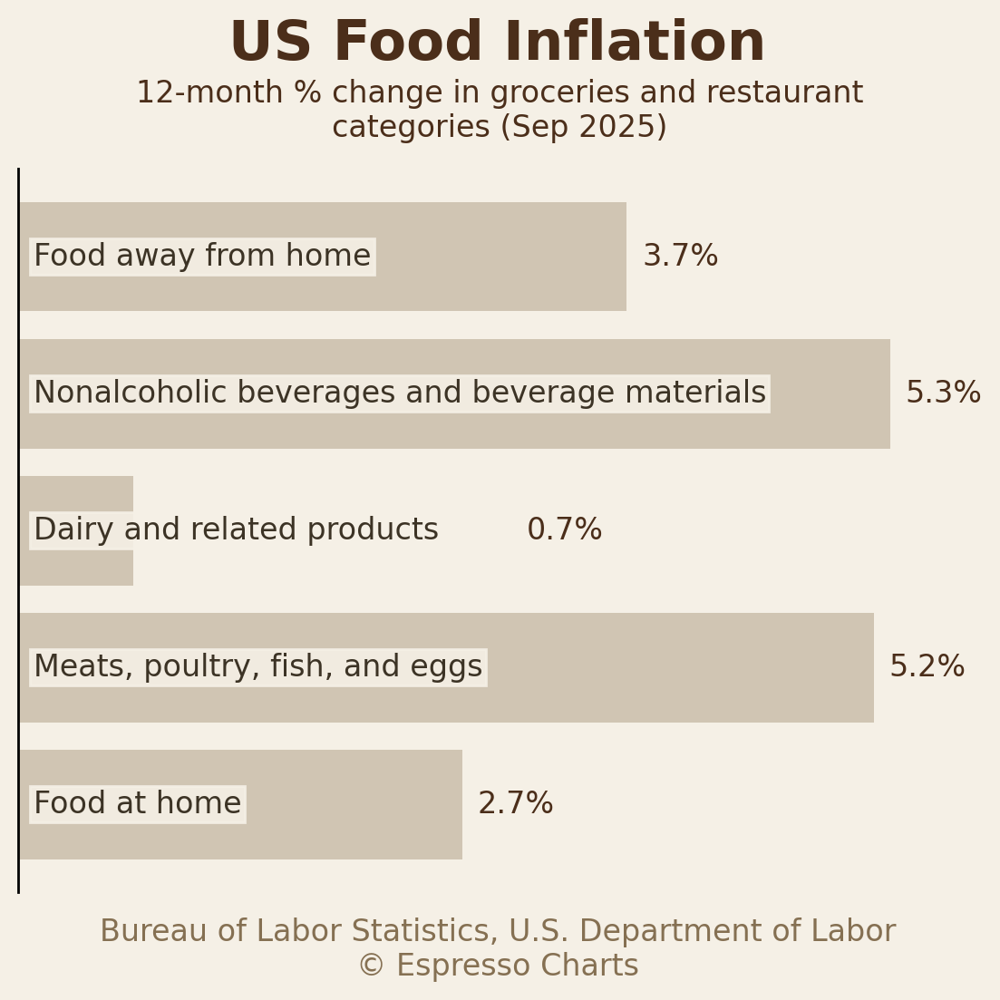

In [ ]:
df_cpi_sep2025_2 = df_cpi_sep2025[
    df_cpi_sep2025['Category'].isin([
        'Food at home',
        'Meats, poultry, fish, and eggs',
        'Dairy and related products',
        'Nonalcoholic beverages and beverage materials',
        'Food away from home'
    ])
].reset_index(drop=True)

df_cpi_sep2025_2['YoY_Change_pct'] = (df_cpi_sep2025_2['YoY_Change_pct'] / 100)

# Define the new desired order
#order = [
#    'All items less food and energy',
#    'Energy',
#    'Food',
#    'All items'
#]

# Reorder the dataframe based on that order
df_cpi_sep2025_1 = df_cpi_sep2025_1.set_index('Category').loc[order].reset_index()

df_cpi_sep2025_1


fig, ax = eSingleBarChartNew(
    dfChart=df_cpi_sep2025_2,
    colDim="Category",
    colMeasure="YoY_Change_pct",
    txtTitle="US Food Inflation",
    txtSup="12-month % change in groceries and restaurant\ncategories (Sep 2025)",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    numFormat="{:,.1%}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={2:150}

)

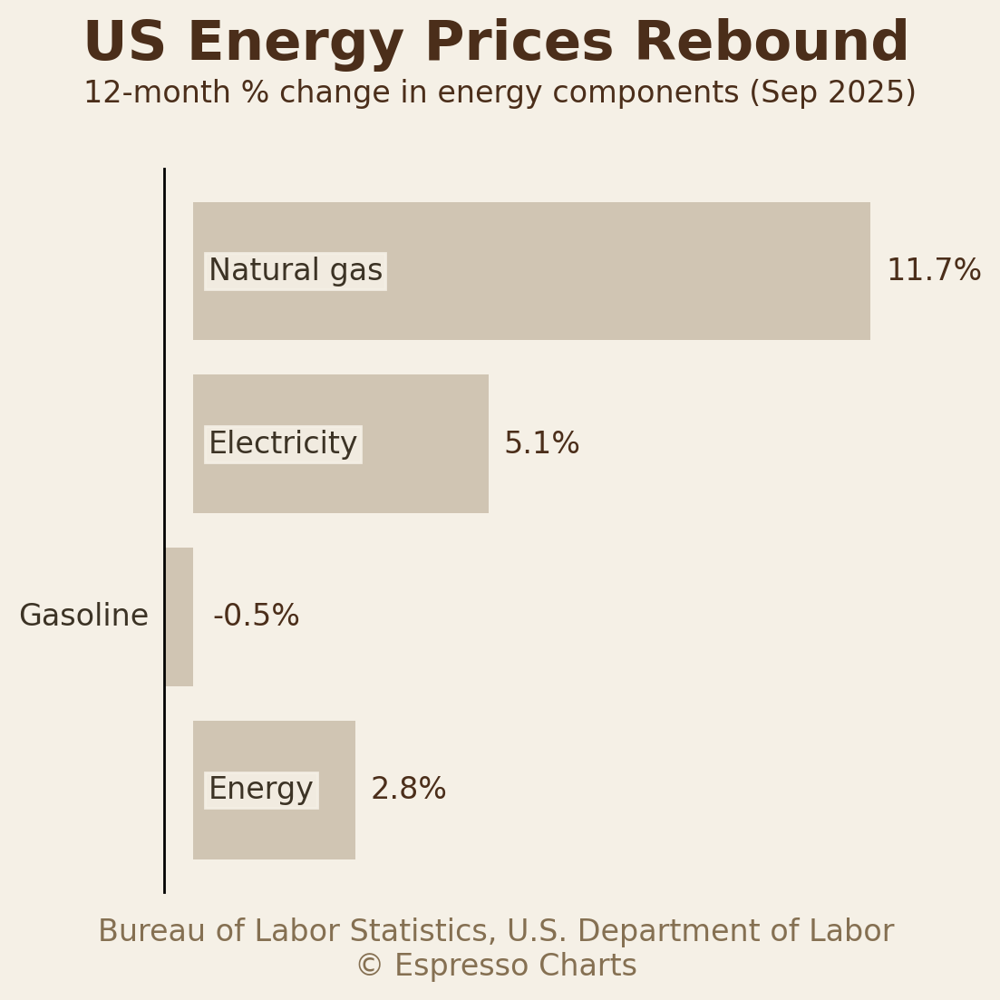

In [ ]:
df_cpi_sep2025_3 = df_cpi_sep2025[
    df_cpi_sep2025['Category'].isin([
        'Energy',
        'Gasoline (all types)',
        'Electricity',
        'Natural gas (piped)'
    ])
].reset_index(drop=True)

df_cpi_sep2025_3['Category'] = df_cpi_sep2025_3['Category'].replace('Natural gas (piped)', 'Natural gas')
df_cpi_sep2025_3['Category'] = df_cpi_sep2025_3['Category'].replace('Gasoline (all types)', 'Gasoline')




df_cpi_sep2025_3['YoY_Change_pct'] = (df_cpi_sep2025_3['YoY_Change_pct'] / 100)


fig, ax = eSingleBarChartNew(
    dfChart=df_cpi_sep2025_3,
    colDim="Category",
    colMeasure="YoY_Change_pct",
    txtTitle="US Energy Prices Rebound",
    txtSup="12-month % change in energy components (Sep 2025)",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    numFormat="{:,.1%}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={1:-60},
    x_title_offset=0.47
)

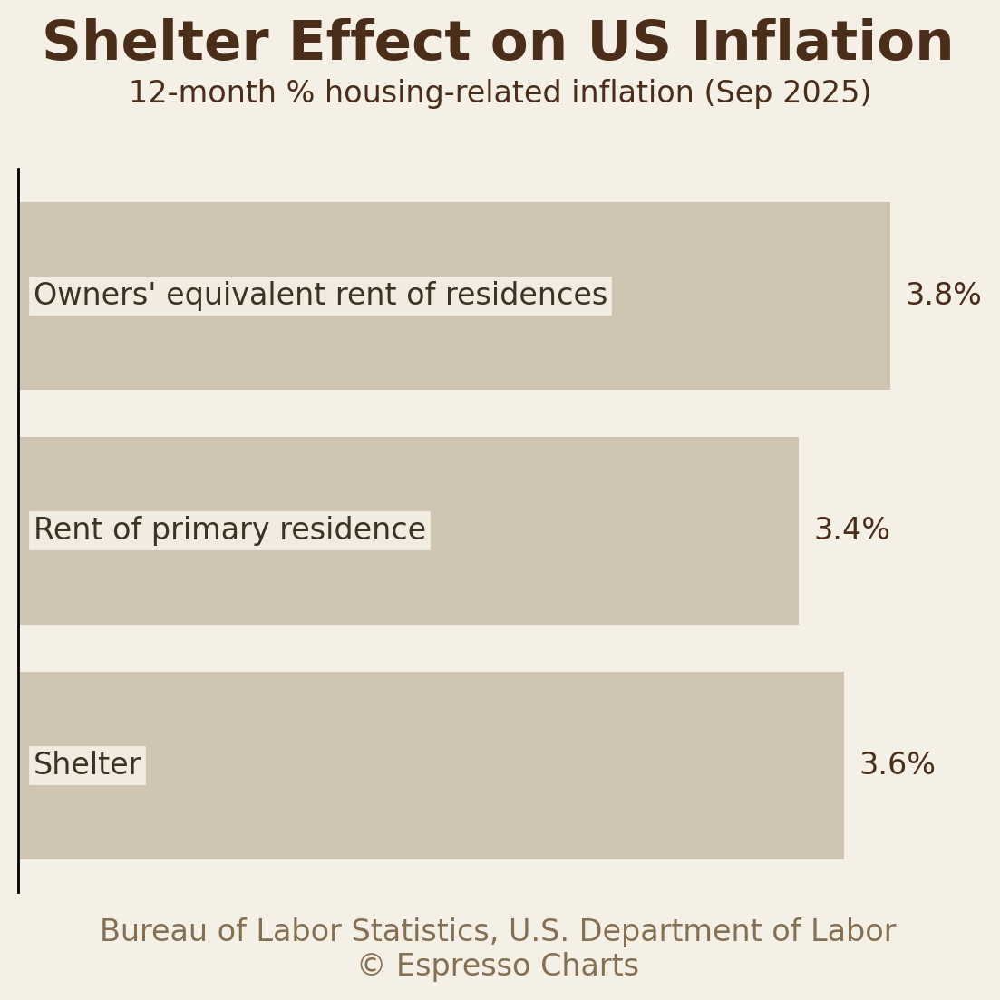

In [ ]:
df_cpi_sep2025_4 = df_cpi_sep2025[
    df_cpi_sep2025['Category'].isin([
        'Shelter',
        'Rent of primary residence',
        "Owners' equivalent rent of residences"
    ])
].reset_index(drop=True)


df_cpi_sep2025_4['YoY_Change_pct'] = (df_cpi_sep2025_4['YoY_Change_pct'] / 100)


fig, ax = eSingleBarChartNew(
    dfChart=df_cpi_sep2025_4,
    colDim="Category",
    colMeasure="YoY_Change_pct",
    txtTitle="Shelter Effect on US Inflation",
    txtSup="12-month % housing-related inflation (Sep 2025)",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    numFormat="{:,.1%}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12
)

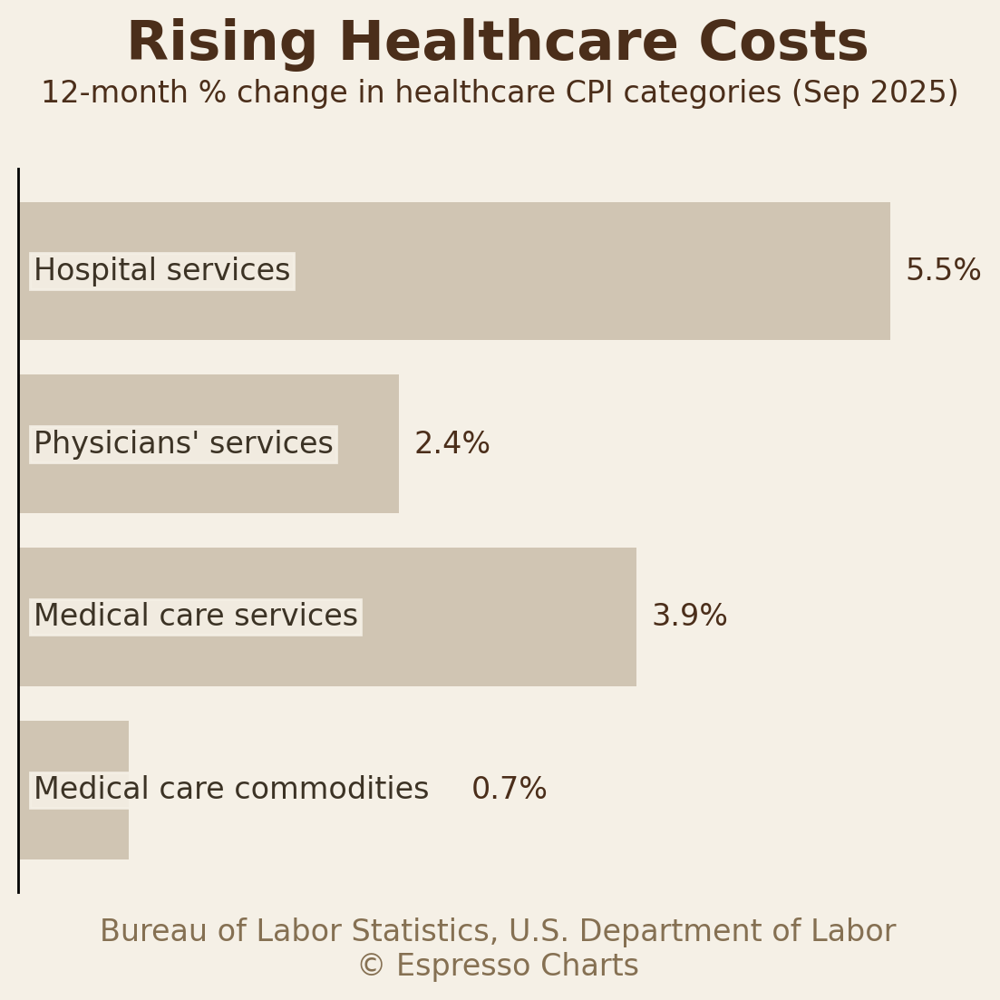

In [ ]:
df_cpi_sep2025_5 = df_cpi_sep2025[
    df_cpi_sep2025['Category'].isin([
        'Medical care commodities',
        'Medical care services',
        "Physicians' services",
        "Hospital services"
    ])
].reset_index(drop=True)



df_cpi_sep2025_5['YoY_Change_pct'] = (df_cpi_sep2025_5['YoY_Change_pct'] / 100)


fig, ax = eSingleBarChartNew(
    dfChart=df_cpi_sep2025_5,
    colDim="Category",
    colMeasure="YoY_Change_pct",
    txtTitle="Rising Healthcare Costs",
    txtSup="12-month % change in healthcare CPI categories (Sep 2025)",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    numFormat="{:,.1%}",
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={0:130}
)

In [ ]:


df_cpi_longterm = pd.read_csv(io.StringIO('''
Month,All items,Food,Energy,Core,Shelter,Medical care services
Jan 2015,-0.1,3.2,-19.6,1.6,2.9,2.3
Feb 2015,0,3,-18.8,1.7,3,1.8
Mar 2015,-0.1,2.3,-18.3,1.8,3,1.9
Apr 2015,-0.2,2,-19.4,1.8,3,2.6
May 2015,0,1.6,-16.3,1.7,2.9,2.5
Jun 2015,0.1,1.8,-15,1.8,3,2.3
Jul 2015,0.2,1.6,-14.8,1.8,3.1,2.3
Aug 2015,0.2,1.6,-15,1.8,3.1,2.2
Sep 2015,0,1.6,-18.4,1.9,3.2,2.4
Oct 2015,0.2,1.6,-17.1,1.9,3.2,3
Nov 2015,0.5,1.3,-14.7,2,3.2,3.1
Dec 2015,0.7,0.8,-12.6,2.1,3.2,2.9
Jan 2016,1.4,0.8,-6.5,2.2,3.2,3.3
Feb 2016,1,0.9,-12.5,2.3,3.3,3.9
Mar 2016,0.9,0.8,-12.6,2.2,3.2,3.6
Apr 2016,1.1,0.9,-8.9,2.1,3.2,3.1
May 2016,1,0.7,-10.1,2.2,3.4,3.5
Jun 2016,1,0.3,-9.4,2.2,3.5,3.8
Jul 2016,0.8,0.2,-10.9,2.2,3.3,4.1
Aug 2016,1.1,0,-9.2,2.3,3.4,5.1
Sep 2016,1.5,-0.3,-2.9,2.2,3.4,4.8
Oct 2016,1.6,-0.4,0.1,2.1,3.5,4.1
Nov 2016,1.7,-0.4,1.1,2.1,3.6,3.9
Dec 2016,2.1,-0.2,5.4,2.2,3.6,3.9
Jan 2017,2.5,-0.2,10.8,2.3,3.5,3.6
Feb 2017,2.7,0,15.2,2.2,3.5,3.4
Mar 2017,2.4,0.5,10.9,2,3.5,3.4
Apr 2017,2.2,0.5,9.3,1.9,3.5,3.1
May 2017,1.9,0.9,5.4,1.7,3.3,2.5
Jun 2017,1.6,0.9,2.3,1.7,3.3,2.5
Jul 2017,1.7,1.1,3.4,1.7,3.2,2.3
Aug 2017,1.9,1.1,6.4,1.7,3.3,1.6
Sep 2017,2.2,1.2,10.1,1.7,3.2,1.7
Oct 2017,2,1.3,6.4,1.8,3.2,1.9
Nov 2017,2.2,1.4,9.4,1.7,3.2,1.6
Dec 2017,2.1,1.6,6.9,1.8,3.2,1.6
Jan 2018,2.1,1.7,5.5,1.8,3.2,2
Feb 2018,2.2,1.4,7.7,1.8,3.1,1.8
Mar 2018,2.4,1.3,7,2.1,3.3,2.1
Apr 2018,2.5,1.4,7.9,2.1,3.4,2.2
May 2018,2.8,1.2,11.7,2.2,3.5,2.3
Jun 2018,2.9,1.4,12,2.3,3.4,2.5
Jul 2018,2.9,1.4,12.1,2.4,3.5,2.3
Aug 2018,2.7,1.4,10.2,2.2,3.4,1.9
Sep 2018,2.3,1.4,4.8,2.2,3.3,2
Oct 2018,2.5,1.2,8.9,2.1,3.2,1.9
Nov 2018,2.2,1.4,3.1,2.2,3.2,2.4
Dec 2018,1.9,1.6,-0.3,2.2,3.2,2.6
Jan 2019,1.6,1.6,-4.8,2.2,3.2,2.4
Feb 2019,1.5,2,-5,2.1,3.4,2.4
Mar 2019,1.9,2.1,-0.4,2,3.4,2.3
Apr 2019,2,1.8,1.7,2.1,3.4,2.3
May 2019,1.8,2,-0.5,2,3.3,2.8
Jun 2019,1.6,1.9,-3.4,2.1,3.5,2.8
Jul 2019,1.8,1.8,-2,2.2,3.5,3.3
Aug 2019,1.7,1.7,-4.4,2.4,3.4,4.3
Sep 2019,1.7,1.8,-4.8,2.4,3.5,4.4
Oct 2019,1.8,2.1,-4.2,2.3,3.3,5.1
Nov 2019,2.1,2,-0.6,2.3,3.3,5.1
Dec 2019,2.3,1.8,3.4,2.3,3.2,5.1
Jan 2020,2.5,1.8,6.2,2.3,3.3,5.1
Feb 2020,2.3,1.8,2.8,2.4,3.3,5.3
Mar 2020,1.5,1.9,-5.7,2.1,3,5.5
Apr 2020,0.3,3.5,-17.7,1.4,2.6,5.8
May 2020,0.1,4,-18.9,1.2,2.5,5.9
Jun 2020,0.6,4.5,-12.6,1.2,2.4,6
Jul 2020,1,4.1,-11.2,1.6,2.3,5.9
Aug 2020,1.3,4.1,-9,1.7,2.3,5.3
Sep 2020,1.4,3.9,-7.7,1.7,2,4.9
Oct 2020,1.2,3.9,-9.2,1.6,2,3.7
Nov 2020,1.2,3.7,-9.4,1.6,1.9,3.2
Dec 2020,1.4,3.9,-7,1.6,1.8,2.8
Jan 2021,1.4,3.8,-3.6,1.4,1.6,2.9
Feb 2021,1.7,3.6,2.4,1.3,1.5,3
Mar 2021,2.6,3.5,13.2,1.6,1.7,2.7
Apr 2021,4.2,2.4,25.1,3,2.1,2.2
May 2021,5,2.2,28.5,3.8,2.2,1.5
Jun 2021,5.4,2.4,24.5,4.5,2.6,1
Jul 2021,5.4,3.4,23.8,4.3,2.8,0.8
Aug 2021,5.3,3.7,25,4,2.8,1
Sep 2021,5.4,4.6,24.8,4,3.2,0.9
Oct 2021,6.2,5.3,30,4.6,3.5,1.7
Nov 2021,6.8,6.1,33.3,4.9,3.8,2.1
Dec 2021,7,6.3,29.3,5.5,4.1,2.5
Jan 2022,7.5,7,27,6,4.4,2.7
Feb 2022,7.9,7.9,25.6,6.4,4.7,2.4
Mar 2022,8.5,8.8,32,6.5,5,2.9
Apr 2022,8.3,9.4,30.3,6.2,5.1,3.5
May 2022,8.6,10.1,34.6,6,5.5,4
Jun 2022,9.1,10.4,41.6,5.9,5.6,4.8
Jul 2022,8.5,10.9,32.9,5.9,5.7,5.1
Aug 2022,8.3,11.4,23.8,6.3,6.2,5.6
Sep 2022,8.2,11.2,19.8,6.6,6.6,6.5
Oct 2022,7.7,10.9,17.6,6.3,6.9,5.4
Nov 2022,7.1,10.6,13.1,6,7.1,4.4
Dec 2022,6.5,10.4,7.3,5.7,7.5,4.1
Jan 2023,6.4,10.1,8.7,5.6,7.9,3
Feb 2023,6,9.5,5.2,5.5,8.1,2.1
Mar 2023,5,8.5,-6.4,5.6,8.2,1
Apr 2023,4.9,7.7,-5.1,5.5,8.1,0.4
May 2023,4,6.7,-11.7,5.3,8,-0.1
Jun 2023,3,5.7,-16.7,4.8,7.8,-0.8
Jul 2023,3.2,4.9,-12.5,4.7,7.7,-1.5
Aug 2023,3.7,4.3,-3.6,4.3,7.3,-2.1
Sep 2023,3.7,3.7,-0.5,4.1,7.2,-2.6
Oct 2023,3.2,3.3,-4.5,4,6.7,-2
Nov 2023,3.1,2.9,-5.4,4,6.5,-0.9
Dec 2023,3.4,2.7,-2,3.9,6.2,-0.5
Jan 2024,3.1,2.6,-4.6,3.9,6,0.6
Feb 2024,3.2,2.2,-1.9,3.8,5.7,1.1
Mar 2024,3.5,2.2,2.1,3.8,5.7,2.1
Apr 2024,3.4,2.2,2.6,3.6,5.5,2.7
May 2024,3.3,2.1,3.7,3.4,5.4,3.1
Jun 2024,3,2.2,1,3.3,5.2,3.3
Jul 2024,2.9,2.2,1.1,3.2,5.1,3.3
Aug 2024,2.5,2.1,-4,3.2,5.2,3.2
Sep 2024,2.4,2.3,-6.8,3.3,4.9,3.6
Oct 2024,2.6,2.1,-4.9,3.3,4.9,3.8
Nov 2024,2.7,2.4,-3.2,3.3,4.7,3.7
Dec 2024,2.9,2.5,-0.5,3.2,4.6,3.4
Jan 2025,3,2.5,1,3.3,4.4,2.7
Feb 2025,2.8,2.6,-0.2,3.1,4.2,3
Mar 2025,2.4,3,-3.3,2.8,4,3
Apr 2025,2.3,2.8,-3.7,2.8,4,3.1
May 2025,2.4,2.9,-3.5,2.8,3.9,3
Jun 2025,2.7,3,-0.8,2.9,3.8,3.4
Jul 2025,2.7,2.9,-1.6,3.1,3.7,4.3
Aug 2025,2.9,3.2,0.2,3.1,3.6,4.2
'''))


df_cpi_longterm



,Month,All items,Food,Energy,Core,Shelter,Medical care services
0,Jan 2015,-0.1,3.2,-19.6,1.6,2.9,2.3
1,Feb 2015,0.0,3.0,-18.8,1.7,3.0,1.8
2,Mar 2015,-0.1,2.3,-18.3,1.8,3.0,1.9
3,Apr 2015,-0.2,2.0,-19.4,1.8,3.0,2.6
4,May 2015,0.0,1.6,-16.3,1.7,2.9,2.5
...,...,...,...,...,...,...,...
123,Apr 2025,2.3,2.8,-3.7,2.8,4.0,3.1
124,May 2025,2.4,2.9,-3.5,2.8,3.9,3.0
125,Jun 2025,2.7,3.0,-0.8,2.9,3.8,3.4
126,Jul 2025,2.7,2.9,-1.6,3.1,3.7,4.3


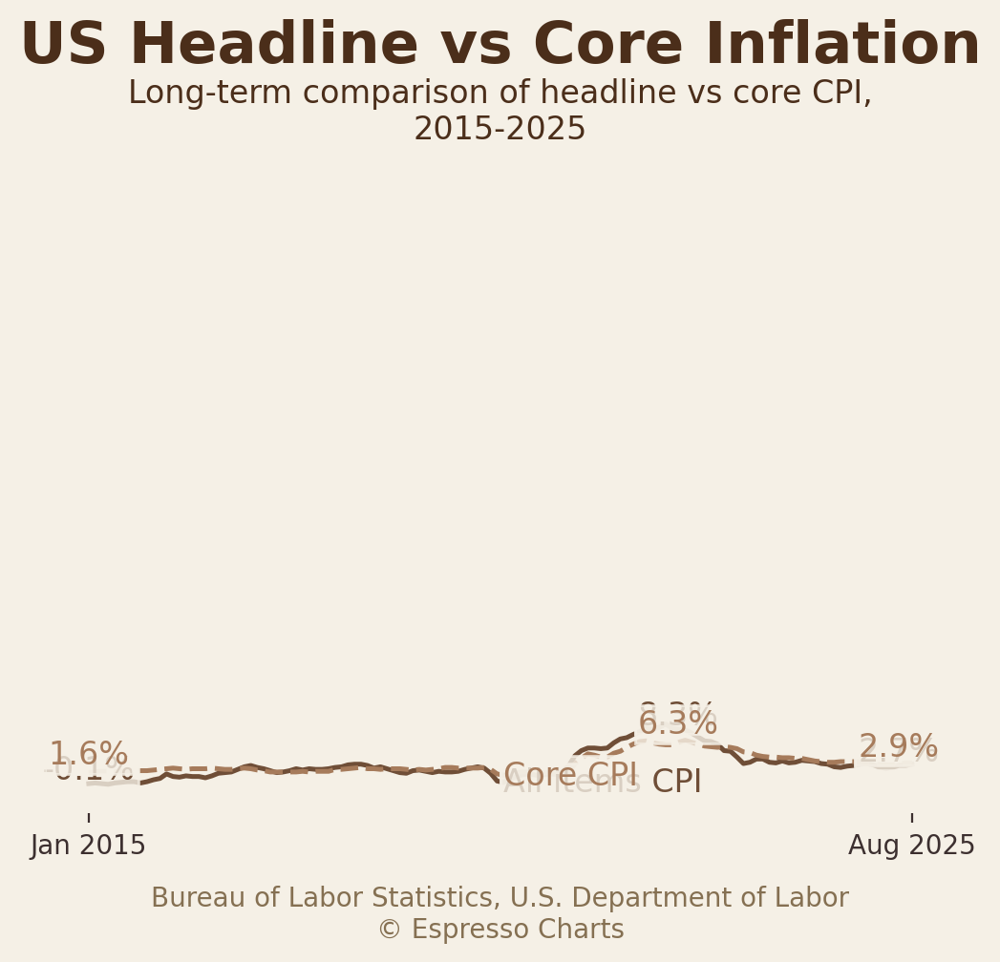

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts'>)

In [ ]:
dfIncome_bar
dfIncome_ts_idx

# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=df_cpi_longterm,
    colDim='Month',
    colMeasureList=["All items", "Core"],
    txtTitle="US Headline vs Core Inflation",
    txtSup="Long-term comparison of headline vs core CPI,\n2015-2025",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    posText=[0, 91, 125],
    textOffsetY=[-0.3, 0.3],
    posLabel=64,
    lineLabels=["All items CPI", "Core CPI"],
    numFormat='{:,.1f}%',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B'],
    #lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineStyles=['-','--'],
    lineWidths=[1.8],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    title_size=22,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(-1, 10),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'
)





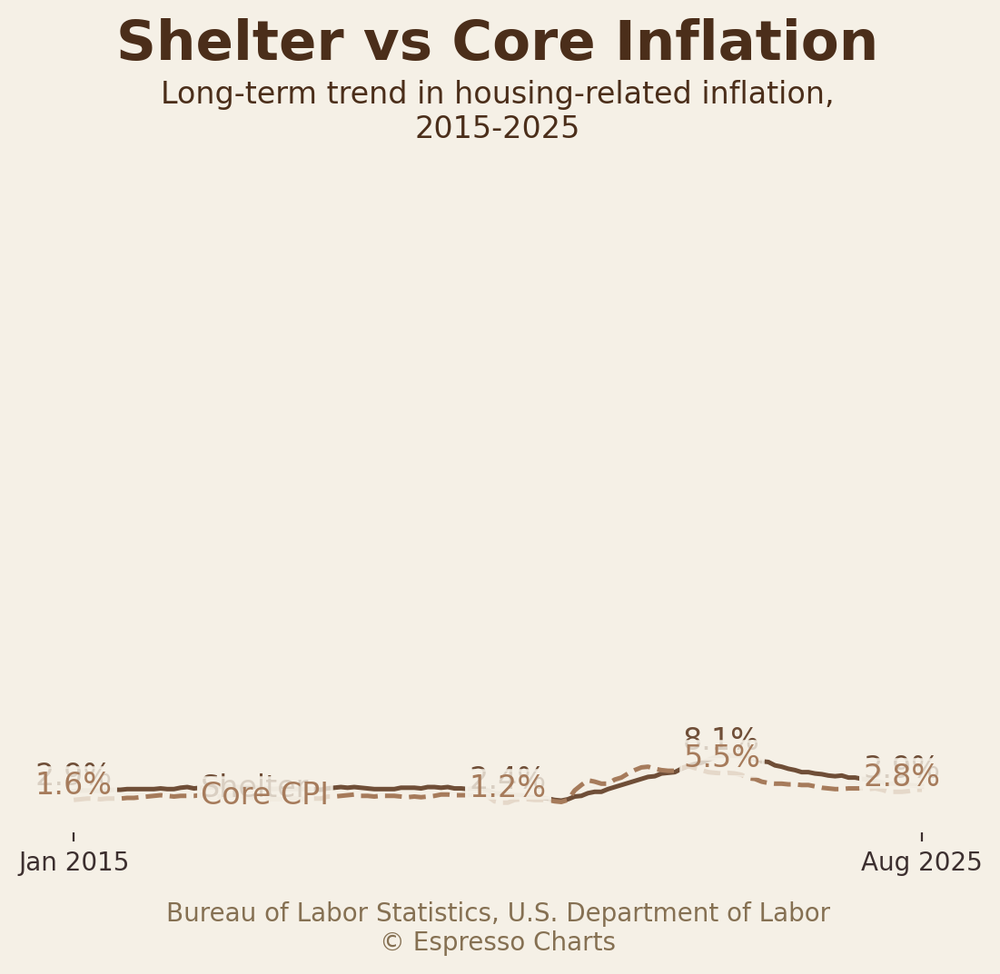

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts'>)

In [ ]:
dfIncome_bar
dfIncome_ts_idx

# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=df_cpi_longterm,
    colDim='Month',
    colMeasureList=["Shelter", "Core"],
    txtTitle="Shelter vs Core Inflation",
    txtSup="Long-term trend in housing-related inflation,\n2015-2025",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    posText=[0, 65, 97, 124],
    posLabel=19,
    lineLabels=["Shelter", "Core CPI"],
    numFormat='{:,.1f}%',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B',  '#D2B48C', '#8B4513'],
    lineStyles=['-', '--', ':', '--'],
    lineWidths=[1.8],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    title_size=22,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(1,10),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'
)





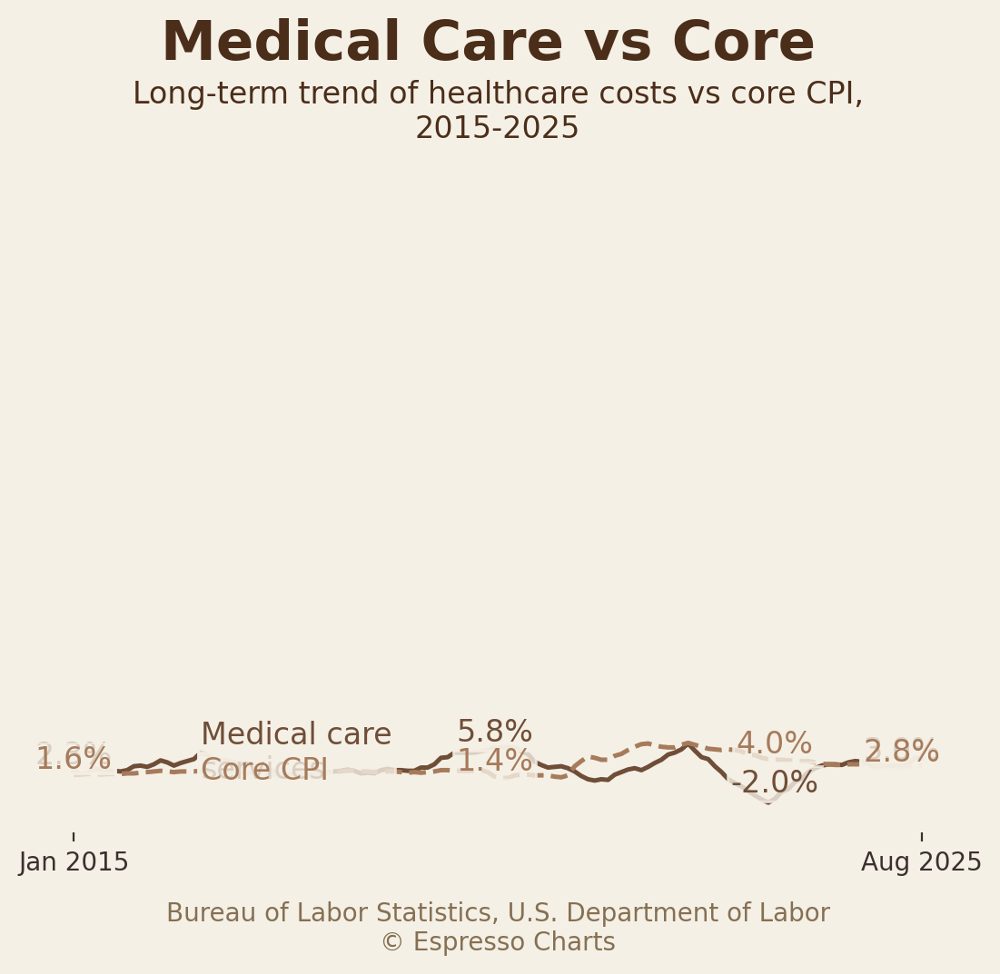

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts'>)

In [ ]:
eMultiLineChartNew(
    dfChart=df_cpi_longterm,
    colDim='Month',
    colMeasureList=["Medical care services", "Core"],
    txtTitle="Medical Care vs Core ",
    txtSup="Long-term trend of healthcare costs vs core CPI,\n2015-2025",
    txtLabel="Bureau of Labor Statistics, U.S. Department of Labor\n© Espresso Charts",
    posText=[0, 63, 105, 124],
    posLabel=19,
    lineLabels=["Medical care\nservices", "Core CPI"],
    numFormat='{:,.1f}%',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B',  '#D2B48C', '#8B4513'],
    lineStyles=['-', '--', ':', '--'],
    lineWidths=[1.8],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    title_size=22,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    yLimits=(-3,10),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'
)


# Confectionary

In [ ]:
df_us_candy_imports_world_2024 = pd.read_csv(io.StringIO('''
Year,Cocoa & Cocoa Products
1967,"184,334"
1968,"184,518"
1969,"227,018"
1970,"278,991"
1971,"249,168"
1972,"237,864"
1973,"311,969"
1974,"468,949"
1975,"466,590"
1976,"595,639"
1977,"969,161"
1978,"1,380,584"
1979,"1,203,293"
1980,"920,871"
1981,"915,773"
1982,"705,111"
1983,"839,926"
1984,"1,133,580"
1985,"1,350,241"
1986,"1,209,797"
1987,"1,300,191"
1988,"1,091,434"
1989,"976,627"
1990,"1,071,800"
1991,"1,080,240"
1992,"1,063,252"
1993,"1,045,130"
1994,"1,012,798"
1995,"1,105,074"
1996,"1,399,538"
1997,"1,470,826"
1998,"1,665,520"
1999,"1,522,393"
2000,"1,404,276"
2001,"1,532,387"
2002,"1,747,782"
2003,"2,418,934"
2004,"2,456,225"
2005,"2,708,565"
2006,"2,620,489"
2007,"2,625,793"
2008,"3,249,689"
2009,"3,434,358"
2010,"4,243,396"
2011,"4,629,628"
2012,"4,044,607"
2013,"4,097,027"
2014,"4,673,909"
2015,"4,815,632"
2016,"5,020,958"
2017,"4,918,933"
2018,"4,644,454"
2019,"4,837,768"
2020,"4,948,838"
2021,"5,566,672"
2022,"6,006,967"
2023,"6,077,225"
2024,"7,985,057"
'''))

#divide by 1000
df_us_candy_imports_world_2024['Cocoa & Cocoa Products'] =  df_us_candy_imports_world_2024['Cocoa & Cocoa Products'].astype(str).str.replace(',','').astype(int)/1000000
#df_us_candy_imports_world_2024


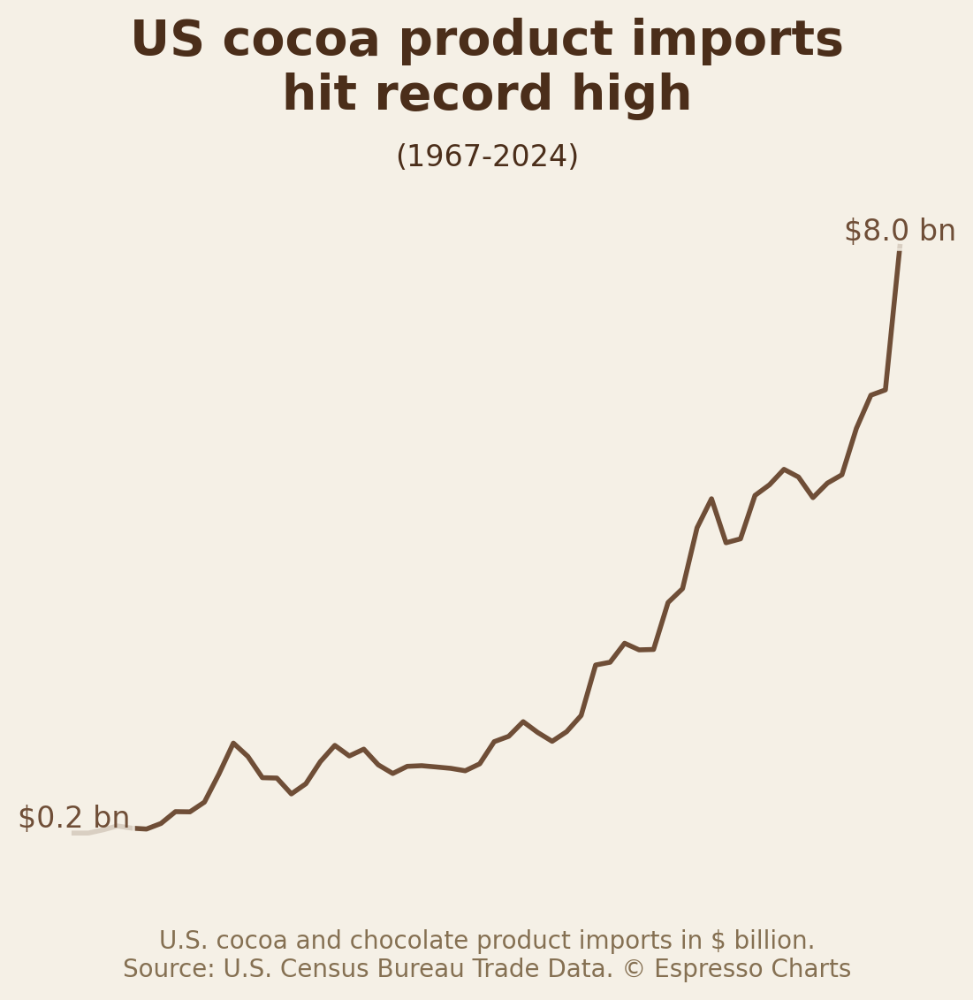

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='U.S. cocoa and chocolate product imports in $ billion.\nSource: U.S. Census Bureau Trade Data. © Espresso Charts'>)

In [ ]:


# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=df_us_candy_imports_world_2024,
    colDim='Year',
    colMeasureList=["Cocoa & Cocoa Products"],
    txtTitle="US cocoa product imports\nhit record high",
    txtSup="(1967-2024)",
    txtLabel="U.S. cocoa and chocolate product imports in $ billion.\nSource: U.S. Census Bureau Trade Data. © Espresso Charts",
    posText=[0, len(df_us_candy_imports_world_2024)-1],
    posLabel=0,
    lineLabels=[""],
    numFormat='${:,.1f} bn',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#3C2F2F',
    zeroLineStyle='-',
    zeroLineWidth=0,
    zeroLineAt=0,
    title_size=20,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.07,      # keep subtitle closer
    #yLimits=(0, 9),   # y-axis starts at 80, top auto
    tickColor='#F5F0E6'
)



In [ ]:

df_cocoa_price = pd.DataFrame({
    "Year": [
        1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
        2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
        2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
        2020, 2021, 2022, 2023, 2024
    ],
    "Cocoa_Price_USD_per_Metric_Ton": [
        1268.00, 1192.61, 1099.42, 1111.27, 1395.68, 1432.54, 1455.25, 1618.74, 1676.00, 1135.05,
        903.91, 1088.38, 1779.04, 1752.50, 1551.00, 1538.14, 1590.54, 1954.39, 2576.99, 2890.88,
        3130.60, 2978.49, 2393.44, 2439.09, 3062.77, 3135.17, 2891.26, 2029.34, 2293.74, 2340.82,
        2369.96, 2425.52, 2369.40, 3258.04, 7390.56
    ]
})


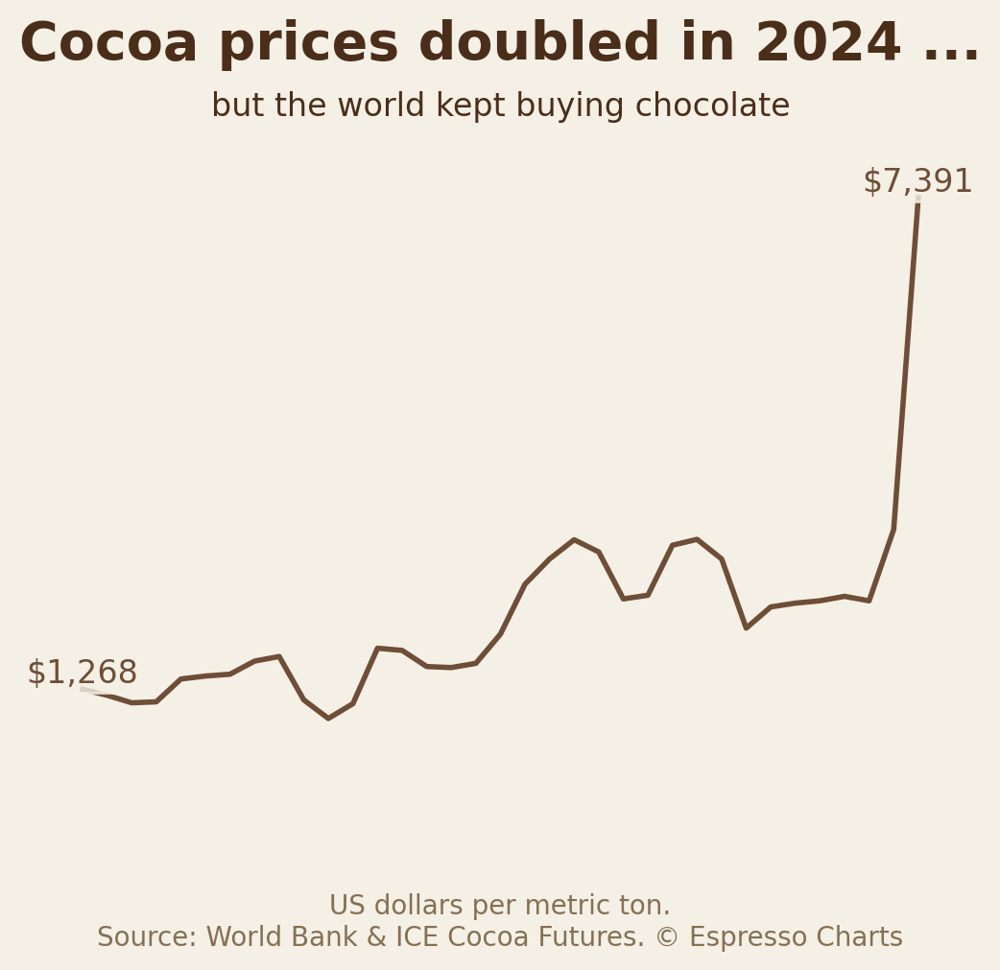

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='US dollars per metric ton.\nSource: World Bank & ICE Cocoa Futures. © Espresso Charts'>)

In [ ]:


# --- Chart 1: Accelerators vs World ---
eMultiLineChartNew(
    dfChart=df_cocoa_price,
    colDim='Year',
    colMeasureList=["Cocoa_Price_USD_per_Metric_Ton"],
    txtTitle="Cocoa prices doubled in 2024 ...",
    txtSup="but the world kept buying chocolate",
    txtLabel="US dollars per metric ton.\nSource: World Bank & ICE Cocoa Futures. © Espresso Charts",
    posText=[0, len(df_cocoa_price)-1],
    posLabel=0,
    lineLabels=[""],
    numFormat='${:,.0f}',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#3C2F2F',
    zeroLineStyle='-',
    zeroLineWidth=0,
    zeroLineAt=0,
    title_size=20,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.07,      # keep subtitle closer
    #yLimits=(0, 9),   # y-axis starts at 80, top auto
    tickColor='#F5F0E6'
)



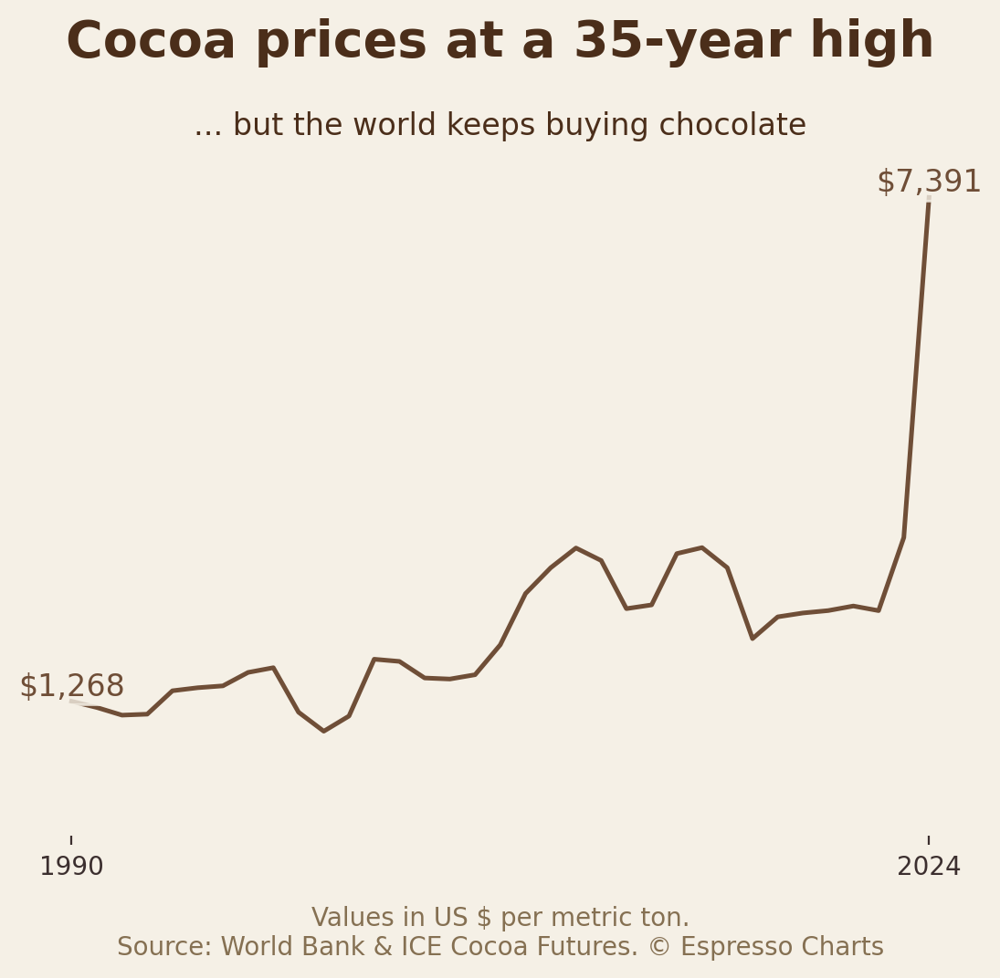

(<Figure size 1080x1080 with 1 Axes>,
 <Axes: xlabel='Values in US $ per metric ton.\nSource: World Bank & ICE Cocoa Futures. © Espresso Charts'>)

In [ ]:
eMultiLineChartNew(
    dfChart=df_cocoa_price,
    colDim='Year',
    colMeasureList=["Cocoa_Price_USD_per_Metric_Ton"],
    txtTitle="Cocoa prices at a 35-year high",
    txtSup="... but the world keeps buying chocolate",
    txtLabel="Values in US $ per metric ton.\nSource: World Bank & ICE Cocoa Futures. © Espresso Charts",
    posText=[0, len(df_cocoa_price)-1],
    #posLabel=19,
    lineLabels=[""],
    numFormat='${:,.0f}',
    numDivisor=1,
    lineColors=['#6F4E37', '#A67B5B',  '#D2B48C', '#8B4513'],
    lineStyles=['-', '--', ':', '--'],
    lineWidths=[1.8],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    title_size=20,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    #yLimits=(-3,10),   # y-axis starts at 80, top auto
    tickColor='#3C2F2F'
)


# Christmas Spending

In [ ]:

df_christmas_spending = pd.read_csv(io.StringIO('''
Country,spending_bn_eur
UK,103.9
Germany,85.24
France,71.65
Italy,43.04
Spain,30.6
Netherlands,15.13
Belgium,11.18
'''))

df_christmas_spending = df_christmas_spending.sort_values(by='spending_bn_eur', ascending=True)


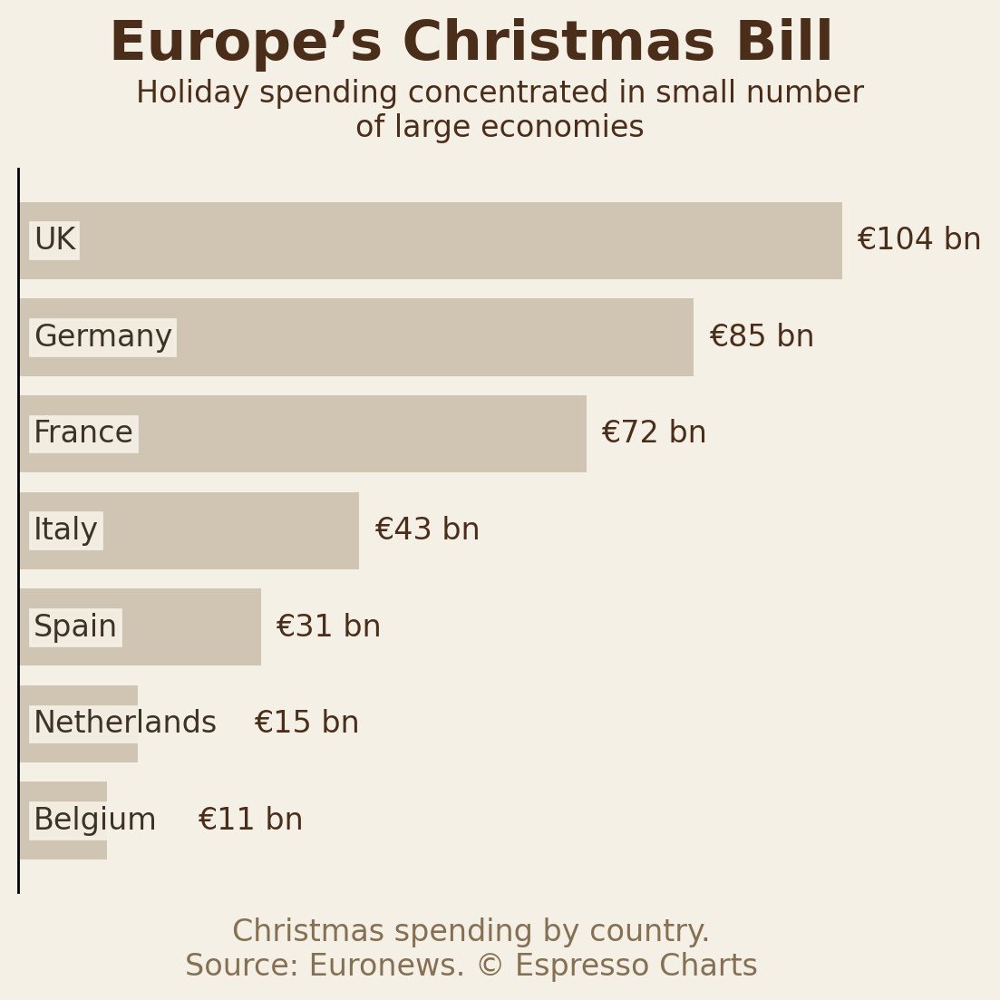

In [ ]:

fig, ax = eSingleBarChartNew(
    dfChart=df_christmas_spending,
    colDim="Country",
    colMeasure="spending_bn_eur",
    txtTitle="Europe’s Christmas Bill",
    txtSup="Holiday spending concentrated in small number\nof large economies",
    txtLabel="Christmas spending by country.\nSource: Euronews. © Espresso Charts",
    numFormat='€{:,.0f} bn',
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={0:30, 1:40}
)

# New years resolution

In [ ]:

df_new_years_resolution = pd.read_csv(io.StringIO('''
Category,Percent of people making this resolution
Physical fitness,39.0
Financial,38.0
Social/relationships,25.0
Diet,25.0
Spiritual,23.0
Traveling,20.0
Hobbies/Skill-based,19.0
Organization/Decluttering,15.0
Professional/Career ambitions,14.0
Giving/Volunteering,11.0
'''))

df_new_years_resolution = df_new_years_resolution.sort_values(by='Percent of people making this resolution', ascending=True)



In [ ]:
df_new_years_resolution

,Category,Percent of people making this resolution
9,Giving/Volunteering,11.0
8,Professional/Career ambitions,14.0
7,Organization/Decluttering,15.0
6,Hobbies/Skill-based,19.0
5,Traveling,20.0
4,Spiritual,23.0
2,Social/relationships,25.0
3,Diet,25.0
1,Financial,38.0
0,Physical fitness,39.0


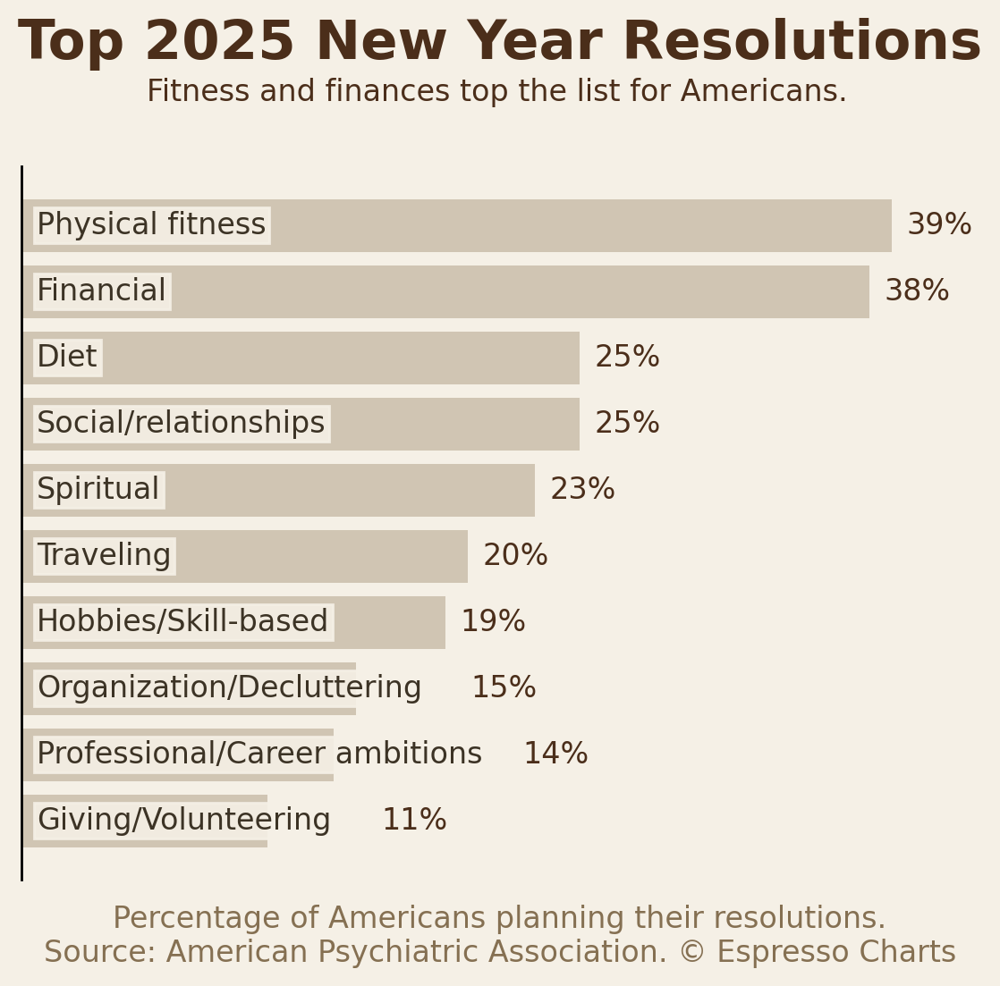

In [ ]:

fig, ax = eSingleBarChartNew(
    dfChart=df_new_years_resolution,
    colDim="Category",
    colMeasure="Percent of people making this resolution",
    txtTitle="Top 2025 New Year Resolutions",
    txtSup="Fitness and finances top the list for Americans.",
    txtLabel="Percentage of Americans planning their resolutions.\nSource: American Psychiatric Association. © Espresso Charts",
    numFormat='{:,.0f}%',
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={0:40, 1:70, 2:40}
)

In [ ]:
df_mental_health_resolution = pd.read_csv(io.StringIO('''
Mental Health Resolution,Percent of people planning
Exercise more,63
Meditation,44
Spend more time in nature,46
Focus on spirituality,37
See a therapist,31
Take a social media break,30
Journaling,29
See a psychiatrist,21
Use a mental health app,20
'''))

df_mental_health_resolution = df_mental_health_resolution.sort_values(by='Percent of people planning', ascending=True)


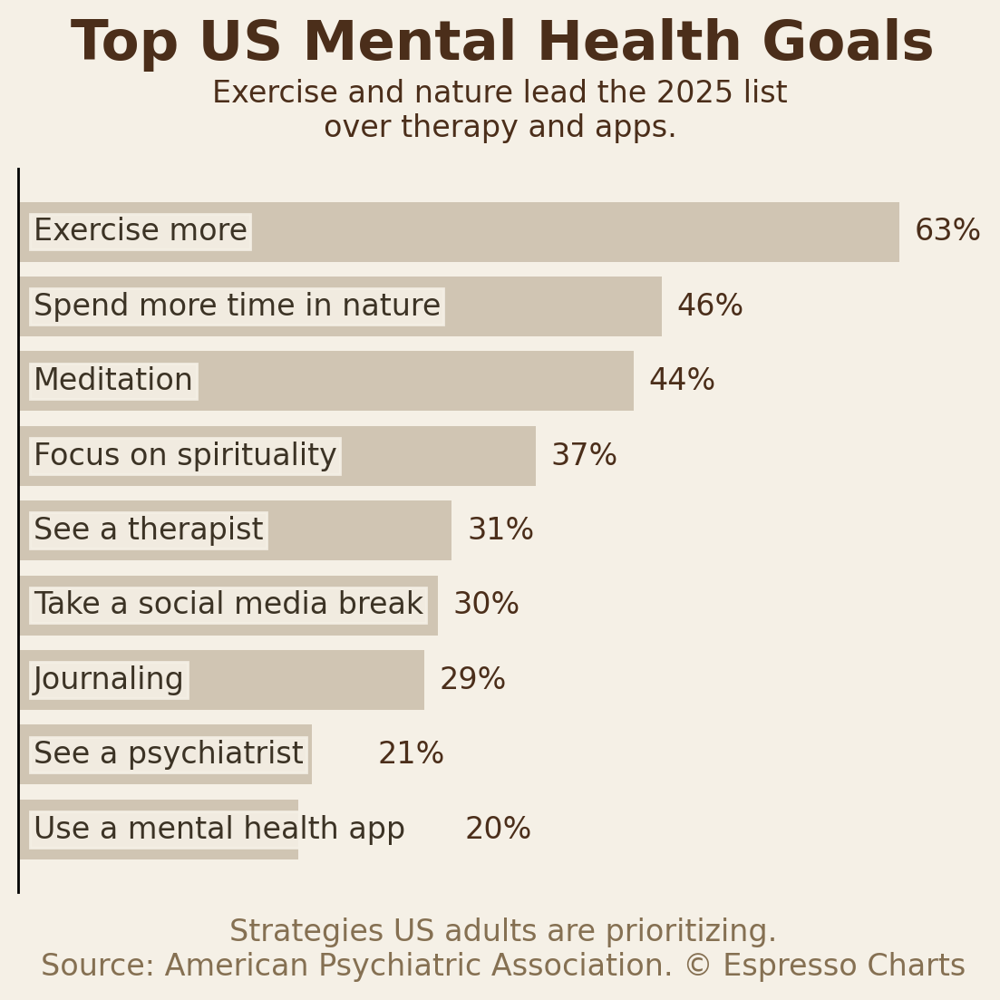

In [ ]:

fig, ax = eSingleBarChartNew(
    dfChart=df_mental_health_resolution,
    colDim="Mental Health Resolution",
    colMeasure="Percent of people planning",
    txtTitle="Top US Mental Health Goals",
    txtSup="Exercise and nature lead the 2025 list\nover therapy and apps.",
    txtLabel="Strategies US adults are prioritizing.\nSource: American Psychiatric Association. © Espresso Charts",
    numFormat='{:,.0f}%',
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={0:60, 1:20}
)

In [ ]:
df_mental_health_anxiety_points = pd.read_csv(io.StringIO('''
Issue,Percent very or somewhat anxious
Personal finances,58
Uncertainty of the next year,52
Physical health,45
Mental health,40
Relationships with friends and family,32
Keeping New Year's resolutions,29
Job security,29
Romantic relationships,26
Traveling,22
'''))

df_mental_health_anxiety_points = df_mental_health_anxiety_points.sort_values(by='Percent very or somewhat anxious', ascending=True)


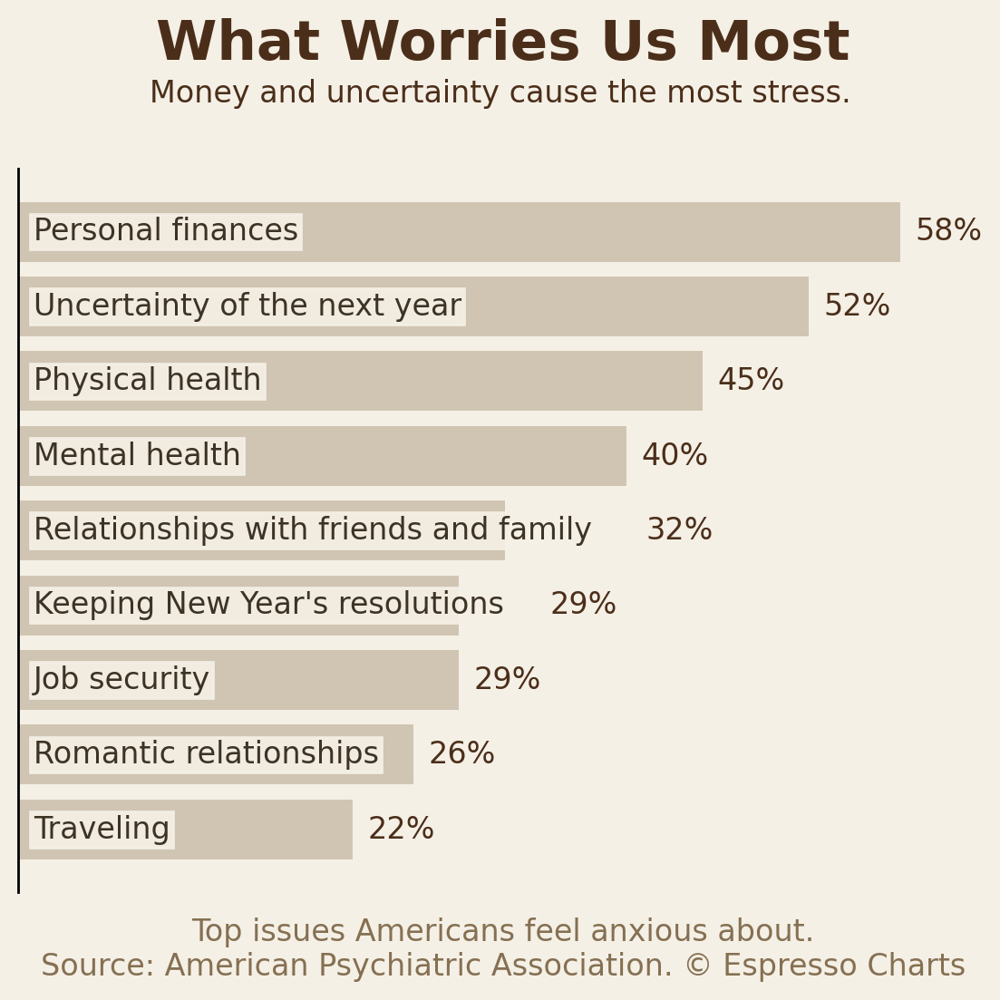

In [ ]:

fig, ax = eSingleBarChartNew(
    dfChart=df_mental_health_anxiety_points,
    colDim="Issue",
    colMeasure="Percent very or somewhat anxious",
    txtTitle="What Worries Us Most",
    txtSup="Money and uncertainty cause the most stress.",
    txtLabel="Top issues Americans feel anxious about.\nSource: American Psychiatric Association. © Espresso Charts",
    numFormat='{:,.0f}%',
    instagram=True,
    px=1080,
    dpi=200,
    barColor='#d0c5b3', # '#3a6b04', #(#3a6b04 = lightgreen) #'#274902',
    valueLabelColor='#4b2e1a',
    faceColor='#F5F0E6',
    title_size=22,
    subtitle_size=12,
    label_size=12,
    labelCustomOffset={3:30, 4:50}
)

# 2026 01 10 - CPI vs

In [ ]:
#Series A: Farm Prices

#Series B: Grocery Prices


df_cpi_farm = fetch_fred_series(
    series_id="WPU01",
    start_date="2019-01-01"
)


df_cpi_all = fetch_fred_series(
    series_id="CUSR0000SAF11",
    start_date="2019-01-01"
)

# --- Rebase df_cpi_farm to Jan-2019 = 100
base_farm = df_cpi_farm.loc[df_cpi_farm["date"] == "2019-01-01", "value"].iloc[0]
df_cpi_farm["farm"] = (df_cpi_farm["value"] / base_farm) * 100

# --- Rebase df_cpi_all to Jan-2019 = 100
base_all = df_cpi_all.loc[df_cpi_all["date"] == "2019-01-01", "value"].iloc[0]
df_cpi_all["grocery"] = (df_cpi_all["value"] / base_all) * 100


df_cpi_merged = (
    df_cpi_farm
        .merge(
            df_cpi_all[["date", "grocery"]],
            on="date",
            how="inner"
        )
)

df_cpi_merged["date_label"] = df_cpi_merged["date"].dt.strftime("%b %Y")

df_cpi_merged["cpi_farm_mom_pct"]  = df_cpi_merged["farm"].pct_change()
df_cpi_merged["cpi_grocery_mom_pct"] = df_cpi_merged["grocery"].pct_change()

df_cpi_merged

Data: {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'observation_start': '2019-01-01', 'observation_end': '9999-12-31', 'units': 'lin', 'output_type': 1, 'file_type': 'json', 'order_by': 'observation_date', 'sort_order': 'asc', 'count': 84, 'offset': 0, 'limit': 100000, 'observations': [{'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '2019-01-01', 'value': '161.7'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '2019-02-01', 'value': '160.6'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '2019-03-01', 'value': '160.4'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '2019-04-01', 'value': '162.9'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '2019-05-01', 'value': '161.5'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '2019-06-01', 'value': '165.8'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': 

,date,value,series_id,farm,grocery,date_label,cpi_farm_mom_pct,cpi_grocery_mom_pct
0,2019-01-01,161.700,WPU01,100.000000,100.000000,Jan 2019,NaN,NaN
1,2019-02-01,160.600,WPU01,99.319728,100.219388,Feb 2019,-0.006803,0.002194
2,2019-03-01,160.400,WPU01,99.196042,100.372960,Mar 2019,-0.001245,0.001532
3,2019-04-01,162.900,WPU01,100.742115,99.850154,Apr 2019,0.015586,-0.005209
4,2019-05-01,161.500,WPU01,99.876314,100.025250,May 2019,-0.008594,0.001754
...,...,...,...,...,...,...,...,...
79,2025-08-01,236.718,WPU01,146.393321,130.244928,Aug 2025,-0.015275,0.005150
80,2025-09-01,233.138,WPU01,144.179344,130.614576,Sep 2025,-0.015123,0.002838
81,2025-10-01,233.393,WPU01,144.337044,NaN,Oct 2025,0.001094,0.000000
82,2025-11-01,233.436,WPU01,144.363636,130.391049,Nov 2025,0.000184,-0.001711


Y-axis range: 83.01122448979594 to 166.9683673469388


<Axes: xlabel='BLS: PPI Farm Products & CPI Food at Home · Jan 2019 = 100\n© Espresso Charts'>

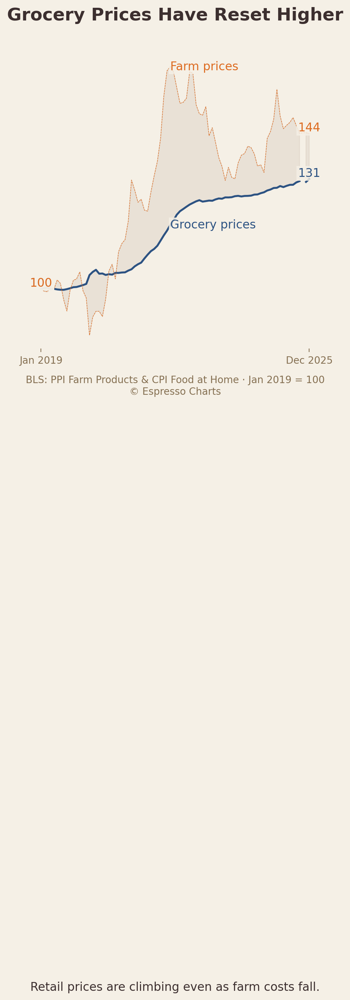

In [ ]:
fig, ax = eMultiLineChartInstagram(
    dfChart=df_cpi_merged,
    colDim='date_label',
    colMeasureList=["grocery", "farm"],
    txtTitle=" ",#"Grocery Prices Have Reset Higher",
    txtSup=" ", #"Retail prices are climbing even as farm costs fall.",
    txtLabel="BLS: PPI Farm Products & CPI Food at Home · Jan 2019 = 100\n© Espresso Charts",
    posText=[0,len(df_cpi_merged)-1],
    posLabel=40,
    lineLabels=["Grocery prices", "Farm prices"],
    numFormat='{:,.0f}',
    numDivisor=1,
    #lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineColors=['#2C5282', '#DD6B20', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.',':'],
    lineWidths=[2, 0.5],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=1,
    zeroLineAt=90,
    xTickSize=10,
    tickColor='#857052',
    title_size=18,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    #yLimits=(90, 200),   # y-axis starts at 80, top auto
    shade_between=("grocery", "farm"),   # tuple: (measure_low, measure_high)
    shade_color='#c8b8a8',
    shade_alpha=0.25,
    #shade_x=("Jan 2019", "Jan 2023")               # None OR (x_start, x_end)

)

# Get center of x-axis
x_center = (ax.get_xlim()[0] + ax.get_xlim()[1]) / 2

# Get the actual y-axis range
y_min, y_max = ax.get_ylim()
print(f"Y-axis range: {y_min} to {y_max}")

# Position text above the plot area
texts = [
    {
        'text': 'Grocery Prices Have Reset Higher',
        'xy': (x_center, y_max *1.05),  # 5 units above the top
        'fontsize': 18,
        'color': '#3C2F2F',
        'ha': 'center',
        'va': 'bottom',
        'fontweight': 'bold'
    },
    {
        'text': 'Retail prices are climbing even as farm costs fall.',
        'xy': (x_center, -100),  # 2 units above the top
        'fontsize': 12,
        'color': '#3C2F2F',
        'ha': 'center',
        'va': 'bottom'
    }
]
add_text(ax, texts)



(<Figure size 1080x1350 with 1 Axes>,
 <Axes: xlabel='BLS: PPI Farm Products & CPI Food at Home (MoM % Change)\n© Espresso Charts'>)

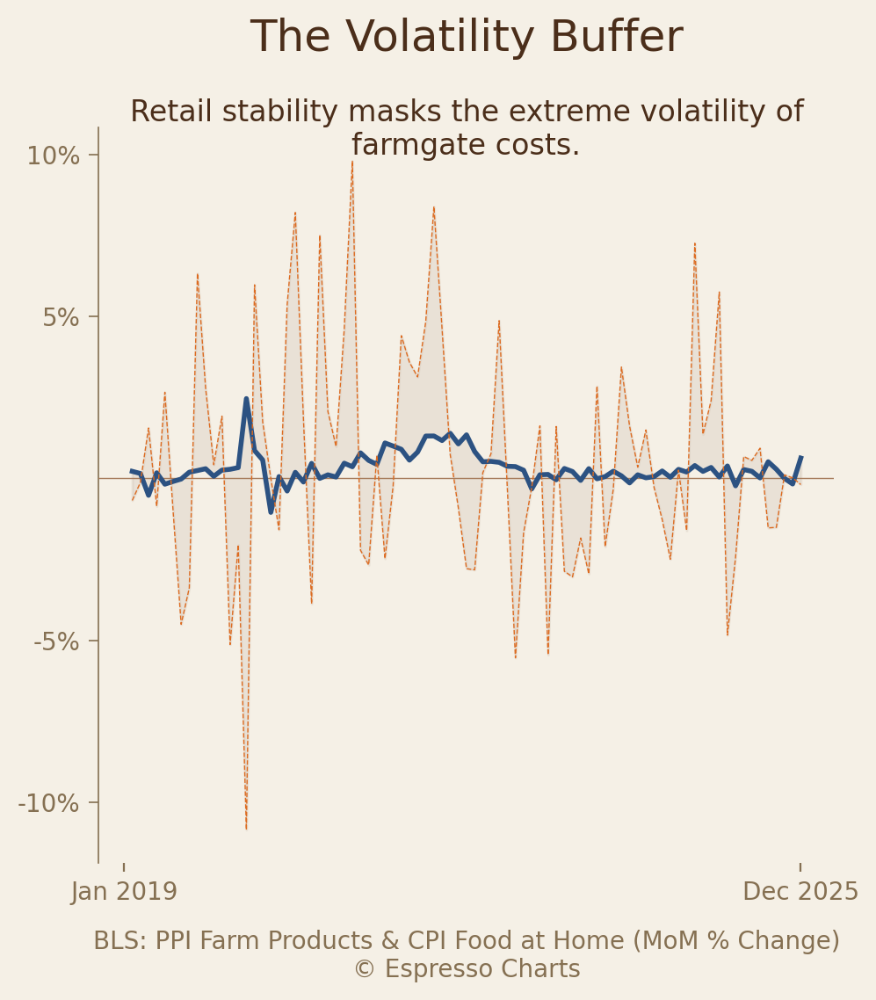

In [ ]:
eMultiLineChartInstagram(
    dfChart=df_cpi_merged,
    colDim='date_label',
    colMeasureList=["cpi_grocery_mom_pct", "cpi_farm_mom_pct"],
    txtTitle="The Volatility Buffer",
    txtSup="Retail stability masks the extreme volatility of\nfarmgate costs.",
    txtLabel="BLS: PPI Farm Products & CPI Food at Home (MoM % Change)\n© Espresso Charts",
    posText=[],
    posLabel=0,
    lineLabels=["Grocery prices month-on-month % change", "Farm prices month-on-month % change"],
    numFormat='{:,.1%}',
    numDivisor=1,
    #lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineColors=['#2C5282', '#DD6B20', '#D2B48C', '#8B4513'],
    lineStyles=['-','--','-.',':'],
    lineWidths=[2,0.5],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#A67B5B',
    zeroLineStyle='-',
    zeroLineWidth=0.5,
    #zeroLineAt=90,
    title_size=18,
    subtitle_size=12,
    label_size=10,
    title_y=1.15,        # push headline up
    subtitle_y=1.04,      # keep subtitle closer
    #yLimits=(-1, 1),   # y-axis starts at 80, top auto
    xTickSize=10,
    tickColor='#857052',
    shade_between=("cpi_grocery_mom_pct", "cpi_farm_mom_pct"),   # tuple: (measure_low, measure_high)
    shade_color='#c8b8a8',
    shade_alpha=0.25,
    #shade_x=("Jan 2019", "Jan 2023")               # None OR (x_start, x_end)
    showYAxis=True,          # show y-axis ticks & spine
    yTickColor='#857052',
    yTickSize=10,
    yTicks=[-0.1, -0.05, 0.05, 0.1],
    yNumFormat='{:.0%}',
    showLegend=False,          # NEW: show legend (default off)
    legendLoc='lower right',    # optional
    legendFontSize=10,
    legendTextColor='#857052',
    legendNcol = 1

)


II. SECTION 1 — INSTAGRAM POST
HEADLINE Retailers Are The Economy’s Shock Absorbers

SUBHEAD Grocery prices filter out farm volatility at a permanent cost.

CHART NOTES (for designer)

Use the 2019 Indexed Line Chart.

Clearly mark the 2022 peak where Farm Prices (PPI) hit ~160 while Grocery (CPI) was only ~120.

Caption the current gap as "The Captured Spread."

FOOTNOTE Bureau of Labor Statistics · Jan 2019 = 100 · EspressoCharts

CAPTION (INSTAGRAM) Retailers function as a smoothing filter for the raw economy. When farm prices spiked 60% in 2022, your grocery bill only rose 20%. The supply chain absorbed the shock, protecting the consumer from the extreme volatility of the commodity market.

However, this protection comes with a long-term trade-off. Now that farm prices have retreated, retail prices are not following them down. Instead, they have plateaued. Retailers are currently recouping the margins they sacrificed during the spike.

The result is a "smoothed" price level that only moves in one direction. We traded volatility for a permanent, higher floor.

Does the stability of the price matter more to you than the absolute cost?

#espressocharts #economics #inflation #groceryprices #cpi #supplychain #dataviz #macro

III. SECTION 2 — SUBSTACK POST
TITLE Retail Prices are the Great Smoothing Filter

DECK Grocery stores protect consumers from market volatility, then keep the difference.

OPENING PARAGRAPH The relationship between what a farmer earns and what a consumer pays is not a direct link; it is a dampened signal. Retailers act as a structural buffer, filtering the high-frequency "noise" of commodity markets to provide the price stability that household budgets require.

SECTION: What the data shows Our first chart illustrates this smoothing function. In 2022, the Producer Price Index for farm products hit a massive 163% of its 2019 baseline. Had grocery stores passed this through directly, the social and economic disruption would have been catastrophic. Instead, retail prices rose steadily, peaking significantly lower.

The second chart reveals the cost of this service. By looking at monthly percentage changes, we see that farm prices are frequently deflationary—they often drop month-over-month. Retail prices, however, almost never retreat. They are "sticky" on the downside. The retail sector absorbs the spikes, but it also captures the dips to rebuild the margins lost during the shock.

SECTION: Why this matters This "lag and dampen" effect means that consumers rarely feel the full pain of a commodity spike, but they also rarely see the relief of a commodity crash. Stability is a service provided by the supply chain, and currently, that service is being paid for through the "captured spread" between falling input costs and flat retail prices.

For the macro outlook, this suggests that waiting for "food deflation" is a mistake. The retail system is designed to prevent it.

SECTION: What to watch next Observe the gap between these two lines. As the "wedge" narrows, the pressure for further retail price hikes diminishes—but the incentive for price cuts remains near zero.

CLOSING LINE Stability is a product, and you are paying for it.

IV. SECTION 3 — AUTHORITATIVE SOURCES
Bureau of Labor Statistics Consumer Price Index (CPI): Food at Home https://fred.stlouisfed.org/series/CUSR0000SAF11 Monthly retail price data for urban consumers.

Bureau of Labor Statistics Producer Price Index (PPI): Farm Products https://fred.stlouisfed.org/series/WPU01 Monthly producer-side data for raw agricultural goods.

#Australian Open

In [ ]:


# Data simulation for the "Age of Dominance" story
data_ages = {
    'Year': range(2006, 2027),
    'Avg_Age_Top5': [
        23.8, 24.2, 24.6, 25.0, 25.4, # 2006-2010 (Young Big 3 rising)
        26.8, 27.5, 28.0, 29.2, 30.1, # 2011-2015 (Prime Big 3)
        31.0, 31.5, 32.2, 32.8, 31.5, # 2016-2020 (Aging dominance)
        30.0, 29.5, 29.8, 28.5, 27.0, # 2021-2025 (Transition begins)
        26.2                          # 2026 (The "New Big Three" effect)
    ],
    'Era_Label': [
        'Big Three Rising', 'Big Three Rising', 'Big Three Rising', 'Big Three Rising', 'Big Three Rising',
        'Big Three Prime', 'Big Three Prime', 'Big Three Prime', 'Big Three Prime', 'Big Three Prime',
        'Big Three Dominance', 'Big Three Dominance', 'Big Three Dominance', 'Big Three Dominance', 'Big Three Dominance',
        'Transition', 'Transition', 'Transition', 'Transition', 'Transition',
        'New Gen Takeover'
    ]
}

df_ages = pd.DataFrame(data_ages)
# tranform Year to string
df_ages['Year'] = df_ages['Year'].astype(str)

print("--- Chart 1 Data: Historical Ages ---")
print(df_ages.tail())

# Data simulation for the "Passing the Torch" points trend
dates = pd.date_range(start='2025-01-01', periods=13, freq='M')


data_points = {
    'Date': dates,
    # Alcaraz: Consistent rise to #1
    'Alcaraz_Points': [9000, 9200, 9300, 9500, 9700, 9800, 10200, 10400, 10600, 10700, 10900, 11200, 11500],
    # Sinner: Consistent rise to #2
    'Sinner_Points': [8500, 8600, 8700, 8900, 9000, 9100, 9500, 9800, 10000, 10100, 10300, 10500, 10800],
    # Zverev: Strong finish to grab #3
    'Zverev_Points': [6100, 6400, 6700, 6400, 6600, 7500, 7200, 7300, 6800, 7200, 7800, 8000, 7500],
    # Djokovic: Gradual decline/stagnation to #4
    'Djokovic_Points': [10600, 10300, 10100, 10200, 9900, 9600, 8900, 8400, 8000, 7700, 7500, 7300, 7100]
}

df_points = pd.DataFrame(data_points)
# 2. Convert 'Date' column to string format (YYYY-MM-DD)
df_points['Date'] = df_points['Date'].dt.strftime('%Y-%m-%d')

print("\n--- Chart 2 Data: Rolling Points ---")
print(df_points.head())

--- Chart 1 Data: Historical Ages ---
    Year  Avg_Age_Top5         Era_Label
16  2022          29.5        Transition
17  2023          29.8        Transition
18  2024          28.5        Transition
19  2025          27.0        Transition
20  2026          26.2  New Gen Takeover

--- Chart 2 Data: Rolling Points ---
         Date  Alcaraz_Points  Sinner_Points  Zverev_Points  Djokovic_Points
0  2025-01-31            9000           8500           6100            10600
1  2025-02-28            9200           8600           6400            10300
2  2025-03-31            9300           8700           6700            10100
3  2025-04-30            9500           8900           6400            10200
4  2025-05-31            9700           9000           6600             9900


In [ ]:
#df_points
df_ages

,Year,Avg_Age_Top5,Era_Label
0,2006,23.8,Big Three Rising
1,2007,24.2,Big Three Rising
2,2008,24.6,Big Three Rising
3,2009,25.0,Big Three Rising
4,2010,25.4,Big Three Rising
5,2011,26.8,Big Three Prime
6,2012,27.5,Big Three Prime
7,2013,28.0,Big Three Prime
8,2014,29.2,Big Three Prime
9,2015,30.1,Big Three Prime


(<Figure size 1080x1350 with 1 Axes>,
 <Axes: xlabel='Source: ATP Tour & Jeff Sackmann Tennis Data.\nNote: Ages calculated as of tournament start date.'>)

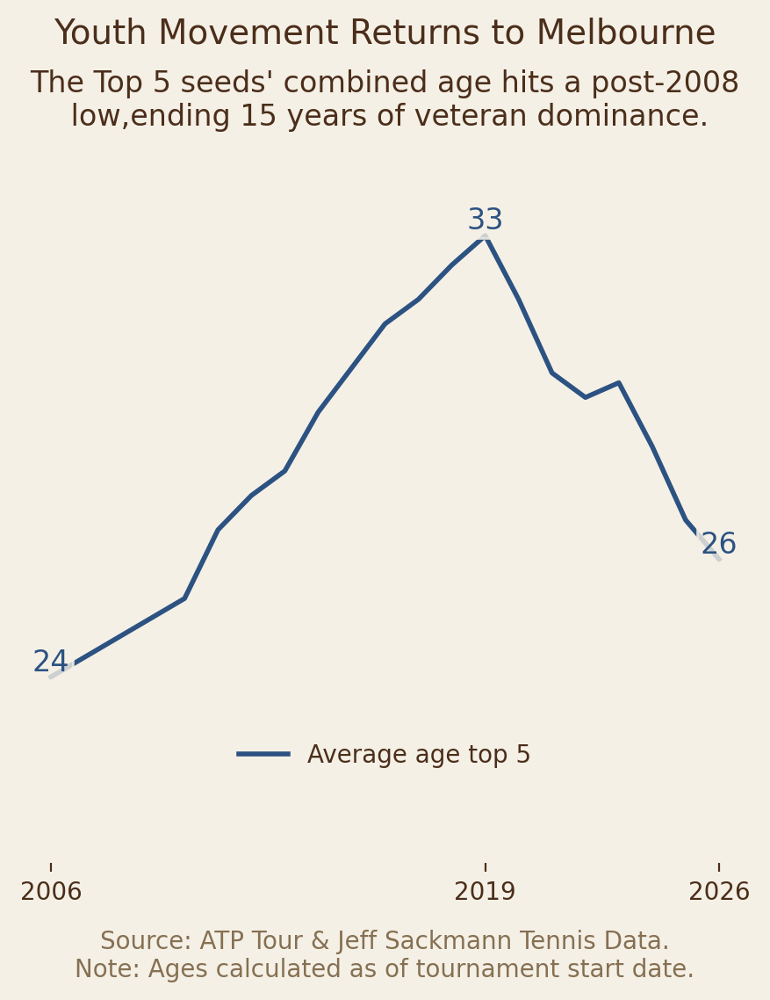

In [ ]:


eMultiLineChartInstagram(
    dfChart=df_ages,
    colDim='Year',
    colMeasureList=["Avg_Age_Top5"],
    txtTitle="Youth Movement Returns to Melbourne",
    txtSup="The Top 5 seeds' combined age hits a post-2008\n low,ending 15 years of veteran dominance.",
    txtLabel="Source: ATP Tour & Jeff Sackmann Tennis Data.\nNote: Ages calculated as of tournament start date.",
    #chart_top_margin=-0.1,
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    posText=[0, 13, 20],
    posLabel=50,
    lineLabels=["Average age top 5"],
    numFormat='{:,.0f}',
    numDivisor=1,
    #lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineColors=['#2C5282', '#DD6B20', '#D2B48C', '#8B4513'],
    #lineColors=['#2C5282', '#DD6B20', '', '#8B4513'],
    lineStyles=['-','-', '-', '-'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=0,
    zeroLineAt=90,
    xTickSize=10,
    tickColor='#4B2E1A',
    title_size=14,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.08,      # keep subtitle closer
    showLegend=True,
    legendLoc='lower center',
    legendFontSize=10,
    legendTextColor='#4b2e1a',
    legendNcol=1,
    xTicklabels=['2006', '2019', '2026'],           # 3 tick positions
    xTicks=['2006', '2019', '2026'],  # 3 corresponding labels
    legendBbox=(0.5, 0.1),      # Move legend way up
    yLimits=(20, 35)   # y-axis starts at 80, top auto
    #shade_between=("grocery", "farm"),   # tuple: (measure_low, measure_high)
    #shade_color='#c8b8a8',
    #shade_alpha=0.25,
    #shade_x=("Jan 2019", "Jan 2023")               # None OR (x_start, x_end)

)


(<Figure size 1080x1350 with 1 Axes>,
 <Axes: xlabel='Source: ATP Tour Official Rankings (Rolling 52-Week)\nData: Jan 2025 – Jan 2026 © Espresso Charts'>)

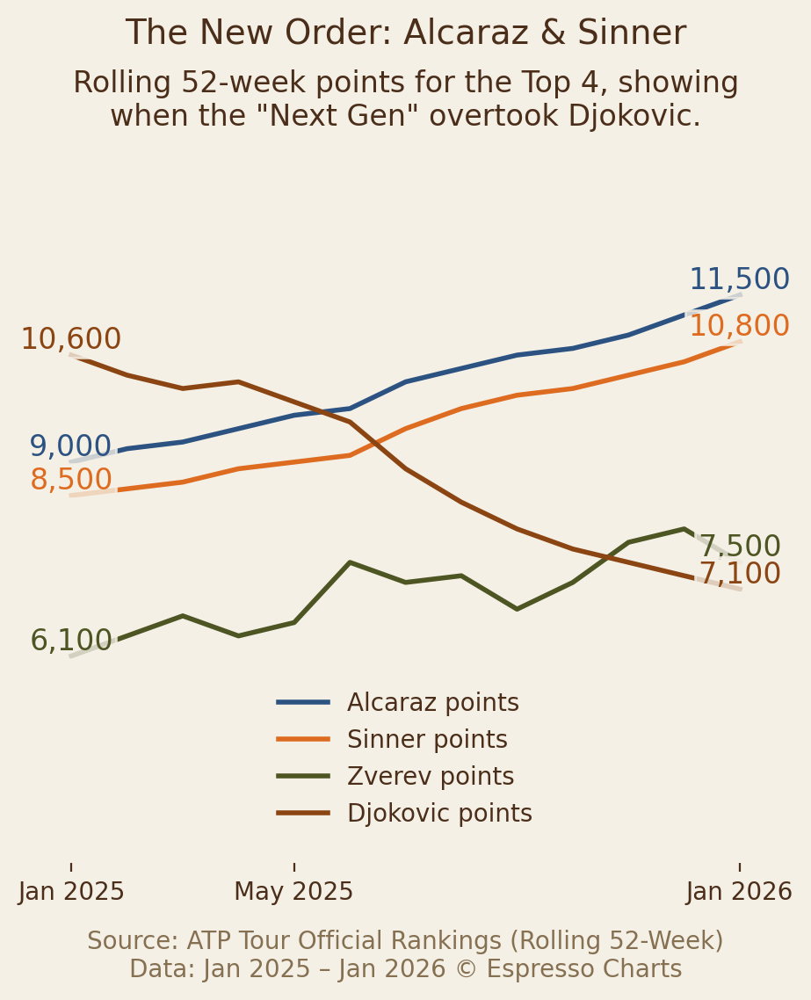

In [ ]:


eMultiLineChartInstagram(
    dfChart=df_points,
    colDim='Date',
    colMeasureList=["Alcaraz_Points", "Sinner_Points", "Zverev_Points", "Djokovic_Points"],
    txtTitle="The New Order: Alcaraz & Sinner",
    txtSup='Rolling 52-week points for the Top 4, showing\nwhen the "Next Gen" overtook Djokovic.',
    txtLabel="Source: ATP Tour Official Rankings (Rolling 52-Week)\nData: Jan 2025 – Jan 2026 © Espresso Charts",
    #chart_top_margin=-0.1,
    titleColor='#4b2e1a',
    subTitleColor='#4b2e1a',
    txtLabelColor='#857052',
    posText=[0, len(df_points)-1],
    posLabel=40,
    lineLabels=["Alcaraz points", "Sinner points", "Zverev points", "Djokovic points"],
    numFormat='{:,.0f}',
    numDivisor=1,
    #lineColors=['#6F4E37', '#A67B5B', '#D2B48C', '#8B4513'],
    lineColors=['#2C5282', '#DD6B20', '#4D5523', '#8B4513'],
    #lineColors=['#2C5282', '#DD6B20', '', '#8B4513'],
    lineStyles=['-'],
    lineWidths=[2],
    showZeroLine=True,
    faceColor='#F5F0E6',
    zeroLineColor='#F5F0E6',
    zeroLineStyle='-',
    zeroLineWidth=0,
    zeroLineAt=90,
    xTickSize=10,
    tickColor='#4B2E1A',
    title_size=14,
    subtitle_size=12,
    label_size=12,
    title_y=1.15,        # push headline up
    subtitle_y=1.08,      # keep subtitle closer
    showLegend=True,
    legendLoc='lower center',
    legendFontSize=10,
    legendTextColor='#4b2e1a',
    legendNcol=1,
    xTicklabels=['Jan 2025', 'May 2025', 'Jan 2026'],           # 3 tick positions
    xTicks=['2025-01-31', '2025-05-31', '2026-01-31'],  # 3 corresponding labels
    legendBbox=(0.5, 0.02),      # Move legend way up
    yLimits=(3000, 14000)   # y-axis starts at 80, top auto
    #shade_between=("grocery", "farm"),   # tuple: (measure_low, measure_high)
    #shade_color='#c8b8a8',
    #shade_alpha=0.25,
    #shade_x=("Jan 2019", "Jan 2023")               # None OR (x_start, x_end)

)


#The hidden engine

In [ ]:

# Data representing Monthly % Change for US Retail Sales
# "Control Group" = Core Sales (excl. food, autos, building materials, gas)
# "Headline" = Total Retail Sales (often noisier)
# Timeline: Dec 2024 - Nov 2025 (The "Current" period in this scenario)

data = {
    'Month': [
        'Dec 24', 'Jan 25', 'Feb 25', 'Mar 25', 'Apr 25', 'May 25',
        'Jun 25', 'Jul 25', 'Aug 25', 'Sep 25', 'Oct 25', 'Nov 25'
    ],
    'Control_Group_Pct_Change': [
        0.4, 0.3, -0.1, 0.2, 0.3, 0.1,
        0.4, 0.3, 0.2, 0.5, 0.1, 0.8
    ],
    'Headline_Sales_Pct_Change': [
        0.6, -0.2, 0.1, 0.4, 0.0, -0.3,
        0.2, 0.5, 0.1, 0.7, -0.1, 0.3
    ]
}

df_retail = pd.DataFrame(data)

# Display the DataFrame
print(df_retail)

     Month  Control_Group_Pct_Change  Headline_Sales_Pct_Change
0   Dec 24                       0.4                        0.6
1   Jan 25                       0.3                       -0.2
2   Feb 25                      -0.1                        0.1
3   Mar 25                       0.2                        0.4
4   Apr 25                       0.3                        0.0
5   May 25                       0.1                       -0.3
6   Jun 25                       0.4                        0.2
7   Jul 25                       0.3                        0.5
8   Aug 25                       0.2                        0.1
9   Sep 25                       0.5                        0.7
10  Oct 25                       0.1                       -0.1
11  Nov 25                       0.8                        0.3


<Axes: title={'center': ' '}, xlabel='Source: U.S. Census Bureau (MARTS).\n© Espresso Charts'>

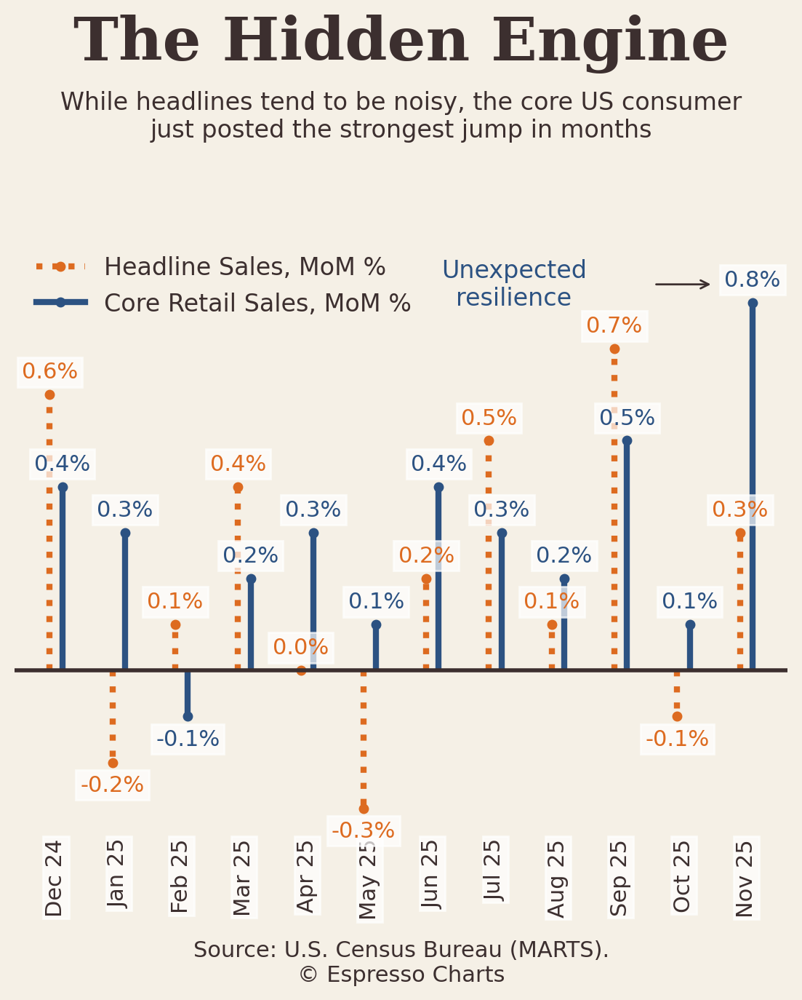

In [ ]:
fig, ax = eStemChartNewInstagram(
    dfChart=df_retail,
    colDim="Month",          # <-- region names
    colMeasureA="Headline_Sales_Pct_Change",       # <-- first comparison year
    colMeasureB="Control_Group_Pct_Change",       # <-- second comparison year
    txtTitle=" ",
    txtSup=" ",
    txtLabel="Source: U.S. Census Bureau (MARTS).\n© Espresso Charts",
    numFormat="{:,.1%}",
    numDivisor=100,
    offset=0.1,
    lineWidth=3,
    suptitle_y=0.94,
    title_pad=10,
    labelpad=10,
    titleColor="#3C2F2F",
    subTitleColor="#3C2F2F",
    axisLabelColor="#3C2F2F",
    tickLabelColor="#3C2F2F",
    faceColor="#F5F0E6",
    colorA="#DD6B20",    # bars for 2000
    colorB="#2C5282",    # bars for 2024
    instagram=True,
    rotateLabels=True,   # regions fit better if rotated,
    xtick_align_va="top",
    xtick_align_ha="center",
    #yearLabelA=2000,
    #yearLabelB=2024,
    #label_a_offset_x = 6.65,
    #label_b_offset_x = 7,
    #label_a_offset_y = 30,
    #label_b_offset_y = 30,
    xTickLabelYOffset=0,
    xAxisLineWidth=2,
    xAxisLineColor="#3C2F2F",
    lineFormatA=":",
    lineFormatB="-",
    title_size=13,
    subtitle_size=24,
    label_size=11,
    #valueLabelOffsetPts=50,
    #valueLabelCustomOffset={4: 10}
    showLegend=True,
    legendLabels=('Headline Sales, MoM %', 'Core Retail Sales, MoM %'),
    legendLoc='best',  # or 'upper right', 'lower left', 'best', etc.
    legendFontSize=12,
    legendFrame=False,  # No frame (default)
    legendTextColor='#3C2F2F',  # Custom color
    yMin=-0.0035,  # Set minimum y value
    yMax=0.0095,   # Set maximum y value

)


annotations = [
#    {
#        'text': 'With frame (default)',
#        'xy': (9, 0.007),
#        'color': '#DD6B20'
#    },
#    {
#        'text': 'No frame',
#        'xy': (7, 0.007),
#        'color': '#2C5282',
#        'frame': False
#    },
#    {
#        'text': 'Custom frame',
#        'xy': (5, 0.007),
#        'color': '#000000',
#        'frame_color': '#DD6B20',
#        'bg_color': '#F5F0E6',
#        'frame_alpha': 0.7
#    }
    {
        'text': 'Unexpected\nresilience',
        'xy': (7.3, 0.0084),
        'color': '#2C5282',
        'frame_color': '#DD6B20',
        'bg_color': '#F5F0E6',
        'frame_alpha': 0
    }
]
add_custom_annotations(ax, annotations)

# Add a pointing line
lines = [
    {
        'start': (9.5, 0.0084),
        'end': (10.5, 0.0084),
        'arrow': True,
        'color': '#3C2F2F',
        'linewidth': 1
    }
]
add_lines(ax, lines)


# Get center of x-axis
x_center = (ax.get_xlim()[0] + ax.get_xlim()[1]) / 2

texts = [
    {
        'text': 'The Hidden Engine',
        'xy': (x_center, 0.013),
        'fontsize': 30,
        'color': '#3C2F2F',
        'ha': 'center',           # CENTER ALIGNED
        'va': 'bottom',
        'fontweight': 'bold',
        'family': 'serif'
    },
    {
        'text': 'While headlines tend to be noisy, the core US consumer\njust posted the strongest jump in months',
        'xy': (x_center, 0.0115),
        'fontsize': 12,
        'color': '#3C2F2F',
        'ha': 'center',           # CENTER ALIGNED
        'va': 'bottom'
    }
]
add_text(ax, texts)


In [ ]:
import matplotlib.font_manager as fm

font_paths = fm.findSystemFonts()
font_names = [fm.FontProperties(fname=font_path).get_name() for font_path in font_paths]

# Display only a subset to avoid overwhelming output
print("Available Fonts (first 50):")
for i, font_name in enumerate(sorted(set(font_names))):
    if i >= 50:
        break
    print(f"- {font_name}")

if len(font_names) > 50:
    print(f"\n... and {len(font_names) - 50} more fonts. Provide a specific font name if you want to check if it's available.")

Available Fonts (first 50):
- Humor Sans
- Liberation Mono
- Liberation Sans
- Liberation Sans Narrow
- Liberation Serif


#macron glasses

In [ ]:


# ==========================================
# 1. SETUP DATA
# ==========================================

# --- Dataset 1: The Viral Spike (Intraday) ---
times_jan20 = pd.date_range(start='2026-01-20 09:00', end='2026-01-20 17:30', freq='30min')
prices_jan20 = [1.53, 1.52, 1.53, 1.52, 1.51, 1.51, 1.50, 1.50, 1.51, 1.50, 1.50, 1.49, 1.50, 1.50, 1.51, 1.50, 1.50, 1.50]

times_jan21 = pd.date_range(start='2026-01-21 09:00', end='2026-01-21 17:30', freq='30min')
prices_jan21 = [1.57, 1.62, 1.68, 1.75, 1.72, 1.68, 1.65, 1.64, 1.63, 1.62, 1.61, 1.62, 1.63, 1.62, 1.61, 1.60, 1.59, 1.58]

df_spike = pd.DataFrame({
    'Time': times_jan20.append(times_jan21),
    'Price': prices_jan20 + prices_jan21
})

# --- Dataset 2: The Decoupling (Comparison) ---
data_decoupling = {
    'Time': ['Jan 20 09:00', 'Jan 20 13:00', 'Jan 20 17:00',
             'Jan 21 09:00', 'Jan 21 11:00', 'Jan 21 14:00', 'Jan 21 17:30'],
    'iVision_Tech_Idx': [100.0, 99.8, 99.5, 104.5, 108.2, 106.0, 105.1],
    'LVMH_Idx':        [100.0, 99.1, 97.8, 98.2,  98.5,  98.9,  99.2]
}
df_compare = pd.DataFrame(data_decoupling)




In [ ]:
df_spike

,Time,Price
0,2026-01-20 09:00:00,1.53
1,2026-01-20 09:30:00,1.52
2,2026-01-20 10:00:00,1.53
3,2026-01-20 10:30:00,1.52
4,2026-01-20 11:00:00,1.51
5,2026-01-20 11:30:00,1.51
6,2026-01-20 12:00:00,1.50
7,2026-01-20 12:30:00,1.50
8,2026-01-20 13:00:00,1.51
9,2026-01-20 13:30:00,1.50


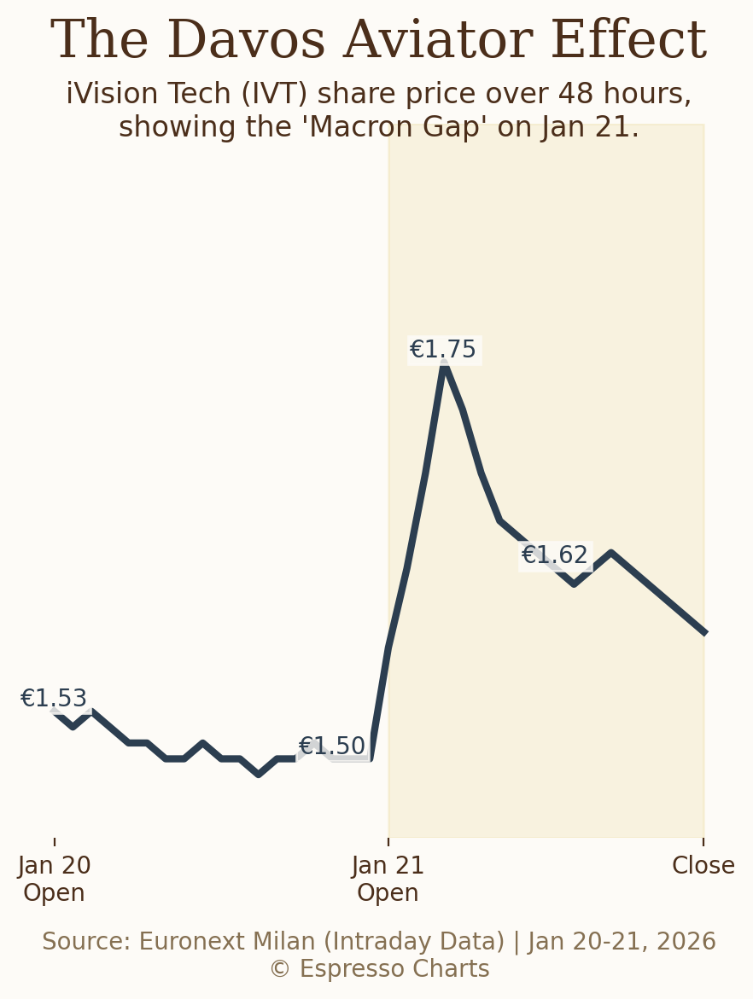

In [ ]:
# 1. Create a linear index to remove the "Night Gap"
# This makes Day 1 (0-18) and Day 2 (18-36) visually equal width
df_spike = df_spike.reset_index(drop=True)
df_spike['Chart_Index'] = df_spike.index

# 2. Adjusted Function Call
fig, ax = eMultiLineChartInstagram(
    dfChart=df_spike,
    colDim='Chart_Index',  # Use Index instead of Time
    colMeasureList=['Price'],
    txtTitle="The Davos Aviator Effect",
    txtSup="iVision Tech (IVT) share price over 48 hours,\nshowing the 'Macron Gap' on Jan 21.",
    txtLabel="Source: Euronext Milan (Intraday Data) | Jan 20-21, 2026\n© Espresso Charts",

    # Fonts
    titleFontFamily='DejaVu Serif',     # NEW: font family for title
    subTitleFontWeight='medium',
    subTitleFontFamily='DejaVu Sans',  # NEW: font family for subtitle
    txtLabelFontWeight='medium',


    # LEGEND FIX: Use a List [], not a string in parentheses ()
    # Note: Using 'lineLabels' which maps to the plot legend handles
    lineLabels=[""],
    posText=[0, 15, 21, 27],           # Label endpoints of both lines


    # Formatting
    numFormat='€{:.2f}',

    # AXIS FIX: Map ticks to the integer index (0 = Start, 18 = Day 2 Start, 35 = End)
    xTicks=[0, 18, 35],
    xTicklabels=['Jan 20\nOpen', 'Jan 21\nOpen', 'Close'],

    # Aesthetics
    faceColor='#FDFBF7',
    lineColors=['#2C3E50'],
    lineWidths=[3],
    lineStyles=['-'],

    # Limits & Layout
    yLimits=(1.45, 1.90),
    title_size=22,
    subtitle_size=12,
    label_size=10,

    # Legend Styling
    showLegend=False,
    legendLoc='lower right',
    legendFontSize=12,
    legendTextColor='#3C2F2F',
    legendBbox=(0.95, 0.15), # Adjusted to sit nicely in the bottom right

    # Layout Adjustment
    title_y=1.15,
    subtitle_y=1.06
)

# Highlight the "Gap" Area (Manually added since we changed x-axis to index)
# Index 18 is where Day 2 starts
ax.axvspan(18, 35, color='#D4AC0D', alpha=0.1, zorder=0)

plt.show()

(<Figure size 1080x1350 with 1 Axes>,
 <Axes: xlabel='Source: Market Data (IVN.MI vs MC.PA), Jan 20-21, 2026\n© Espresso Charts'>)

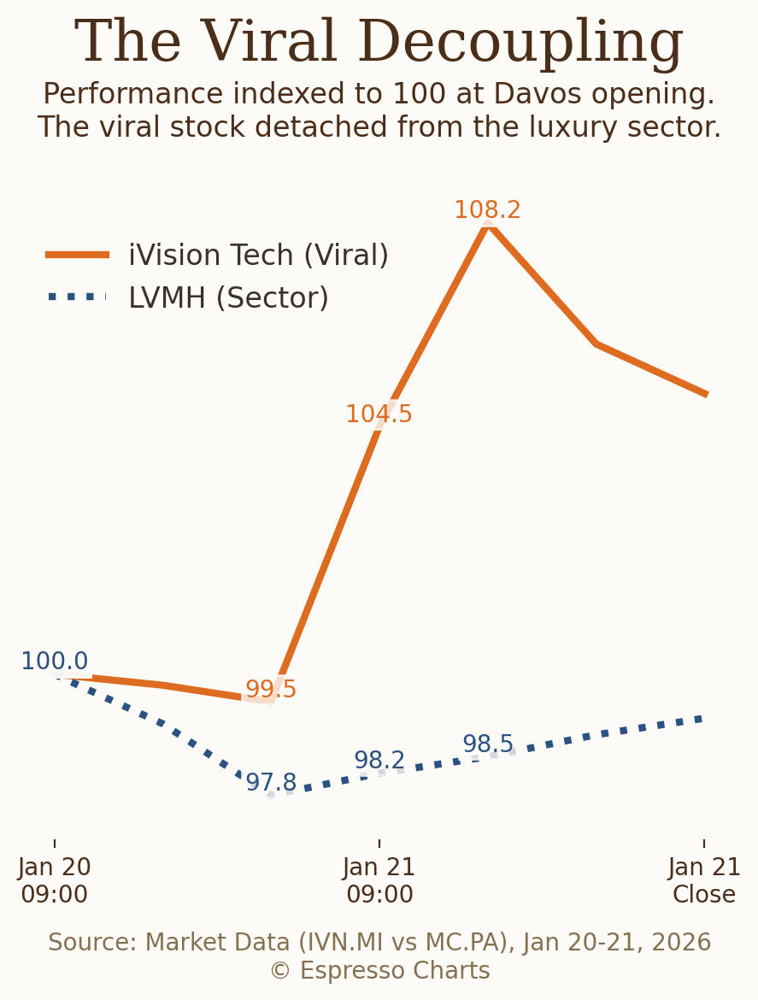

In [ ]:

# --- CHART 2: The Viral Decoupling ---
# Highlights: Two lines (Gold vs Grey), contrasting the viral stock vs the sector.

eMultiLineChartInstagram(
    dfChart=df_compare,
    colDim='Time',
    colMeasureList=['iVision_Tech_Idx', 'LVMH_Idx'],
    txtTitle="The Viral Decoupling",
    txtSup="Performance indexed to 100 at Davos opening.\nThe viral stock detached from the luxury sector.",
    txtLabel="Source: Market Data (IVN.MI vs MC.PA), Jan 20-21, 2026\n© Espresso Charts",
    titleFontFamily='DejaVu Serif',     # NEW: font family for title
    subTitleFontWeight='medium',
    subTitleFontFamily='DejaVu Sans',  # NEW: font family for subtitle
    txtLabelFontWeight='medium',

    # Text/Labels
    lineLabels=['', ''],
    posText=[0, 2, 3, 4],           # Label endpoints of both lines
    posLabel=0,               # Label lines at the end

    # Formatting
    numFormat='{:.1f}',
    xTicks=[0, 3, 6],         # Index positions for ticks
    xTicklabels=['Jan 20\n09:00', 'Jan 21\n09:00', 'Jan 21\nClose'],

    # Aesthetics (The "Decoupling" visual)
    faceColor='#FDFBF7',
    lineColors=['#DD6B20', '#2C5282'], # Gold for the Hero, Grey for the Sector
    lineStyles=['-', ':'],            # Solid for Hero, Dashed for Sector
    lineWidths=[3, 3],
    title_size=24,
    subtitle_size=12,
    label_size=10,
    title_y=1.15,        # push headline up
    subtitle_y=1.06,      # keep subtitle closer
    # Layout
    showLegend=True,
    legendLabelsCustom=('iVision Tech (Viral)', 'LVMH (Sector)'),
    legendLoc='lower right',  # or 'upper right', 'lower left', 'best', etc.
    legendFontSize=12,
    legendTextColor='#3C2F2F',  # Custom color
    legendBbox=(0.55, 0.7),  # x=0.02 (slightly from left), y=0.98 (near top of plot)
    yLimits=(97, 110),   # y-axis starts at 80, top auto


)



# Stop destroying video games

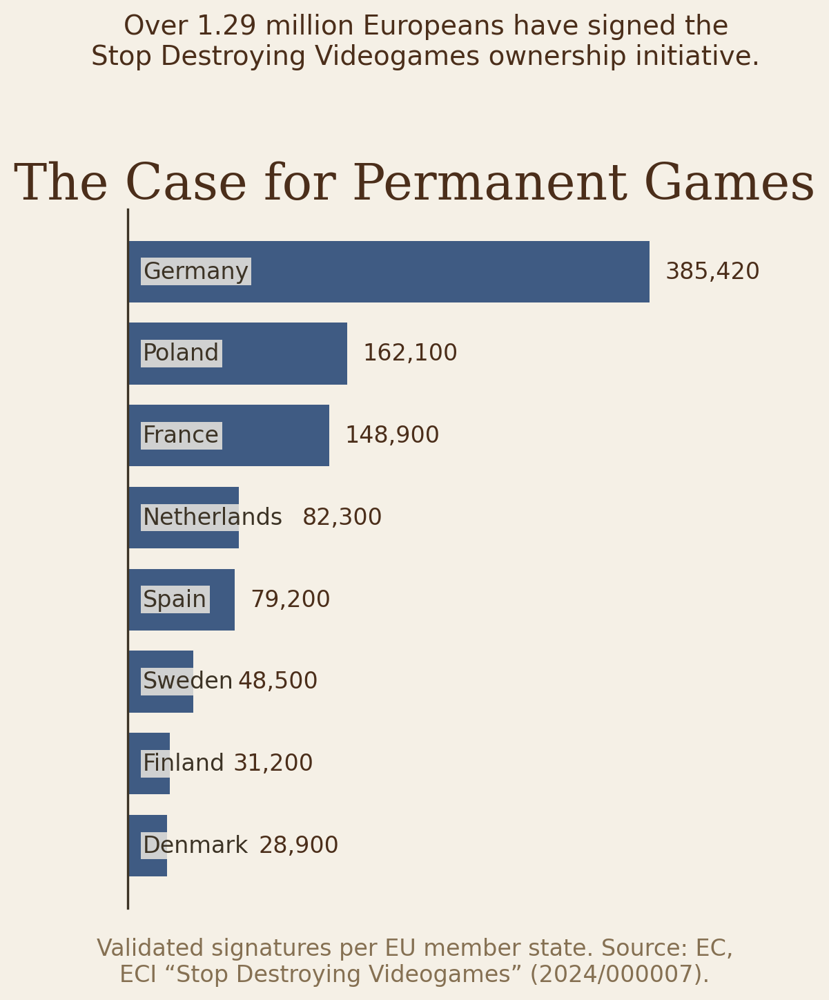

In [ ]:

# --- DATASET ---
# Validated signatures and legal thresholds for the "Stop Destroying Videogames" ECI
data_videogames = {
    'Country': ['Germany', 'Poland', 'France', 'Netherlands', 'Spain', 'Sweden', 'Finland', 'Denmark'],
    'Signatures': [385420, 162100, 148900, 82300, 79200, 48500, 31200, 28900],
    'Threshold': [72000, 37000, 56000, 21000, 41000, 15000, 9000, 10000]
}

df_games = pd.DataFrame(data_videogames)
df_games['Pct_of_Threshold'] = (df_games['Signatures'] / df_games['Threshold']) * 100
df_games_volume = df_games.sort_values(by='Signatures', ascending=True)
df_games_intensity = df_games.sort_values(by='Pct_of_Threshold', ascending=True)

# --- COLORS (Consistent Palette) ---
color_blue = '#3F5B83'
color_orange = '#A14516'
color_green = '#4D5523'
color_sand = '#CDAF7B'

# --- CHART 1: Instagram/Substack (Bar Chart - Volume) ---
fig1, ax1 = eSingleBarChartNewInstagram(
    dfChart=df_games_volume,
    colDim="Country",
    colMeasure="Signatures",
    txtTitle="The Case for Permanent Games",
    txtSuptitle="Over 1.29 million Europeans have signed the\nStop Destroying Videogames ownership initiative.",
    txtLabel="Validated signatures per EU member state. Source: EC,\nECI “Stop Destroying Videogames” (2024/000007).",
    numFormat="{:,.0f}",
    barColor=color_blue,
    faceColor='#F5F0E6',
    instagram=True,
    title_pad_custom=0,
    suptitle_y_custom=1.06,
    titleFontWeight='medium',
    title_size=26,
    offsetLabelX=0,
    labelCustomOffset={0:40, 1: 25, 2:15, 4:25 },
    titleFont='DejaVu Serif',            # Font for title (defaults to font)
    suptitleFont='DejaVu Sans'
    )


<Axes: title={'center': 'Validated signatures in many countries support\npermanent ownership of digital games.'}, xlabel='% of legal threshold reached.\nSource: EC, Stop Destroying Videogames (ECI 2024/000007).'>

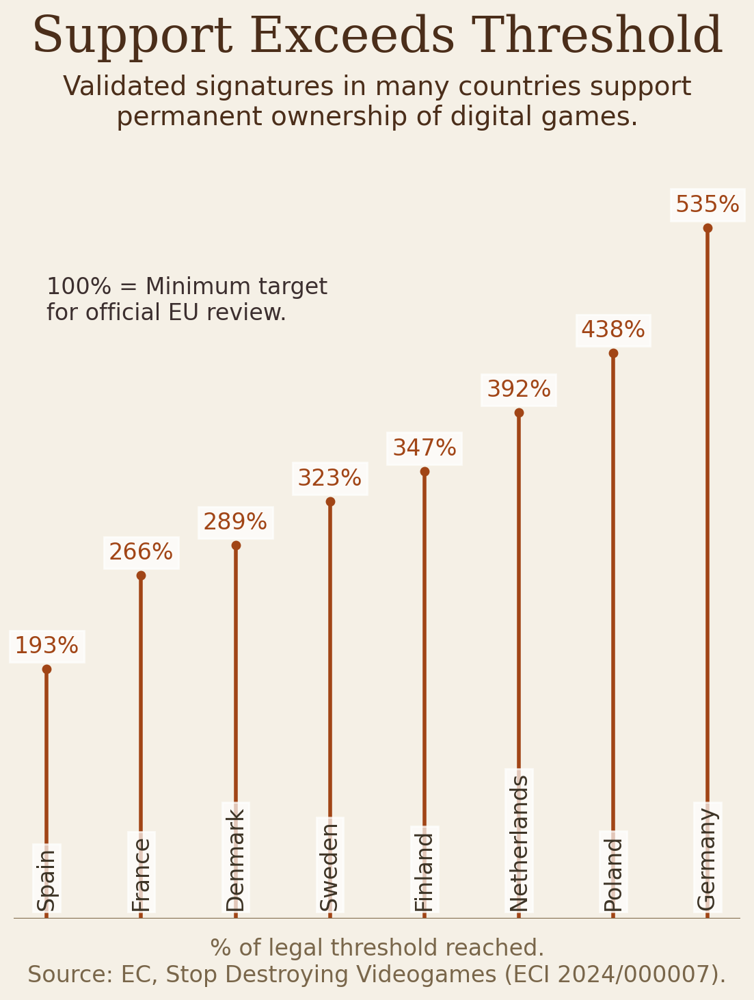

In [ ]:

# --- CHART 2: Substack (Stem Chart - Intensity) ---
fig2, ax2 = eStemChartNewInstagram(
    dfChart=df_games_intensity,
    colDim="Country",
    colMeasureA="Pct_of_Threshold",
    txtTitle="Support Exceeds Threshold",
    txtSup="Validated signatures in many countries support\npermanent ownership of digital games.",
    txtLabel="% of legal threshold reached.\nSource: EC, Stop Destroying Videogames (ECI 2024/000007).",
    numFormat="{:.0f}%",
    colorA=color_orange,
    faceColor='#F5F0E6',
    instagram=True,
    rotateLabels=True,
    yMin=0,
    yMax=600,
    #title_pad=200,        # Adjusted for taller format
    #labelpad=100,
    suptitle_y=1.06,
    title_pad=10,
    labelpad=10,
    title_size=26,
    subtitle_size=14,
    label_size=12,
    titleFont='DejaVu Serif',            # Font for title (defaults to font)
    subTitleFont='DejaVu Sans',
    offset=0,
    xTickLabelYOffset=0.02,
    markerSize=4,
    lineWidth=2,
    lineFormatA="-"
)

x_center = (ax2.get_xlim()[0] + ax2.get_xlim()[1]) / 2

texts = [
    {
        'text': '100% = Minimum target\nfor official EU review.',
        'xy': (0, 460),
        'fontsize': 12,
        'color': '#3C2F2F',
        'ha': 'left',           # CENTER ALIGNED
        'va': 'bottom'
    }
]
add_text(ax2, texts)


# Human margin

In [ ]:
# --- COLORS (Your Suggested Palette) ---
color_blue = '#3F5B83'
color_orange = '#A14516'
color_green = '#4D5523'
color_sand = '#CDAF7B'

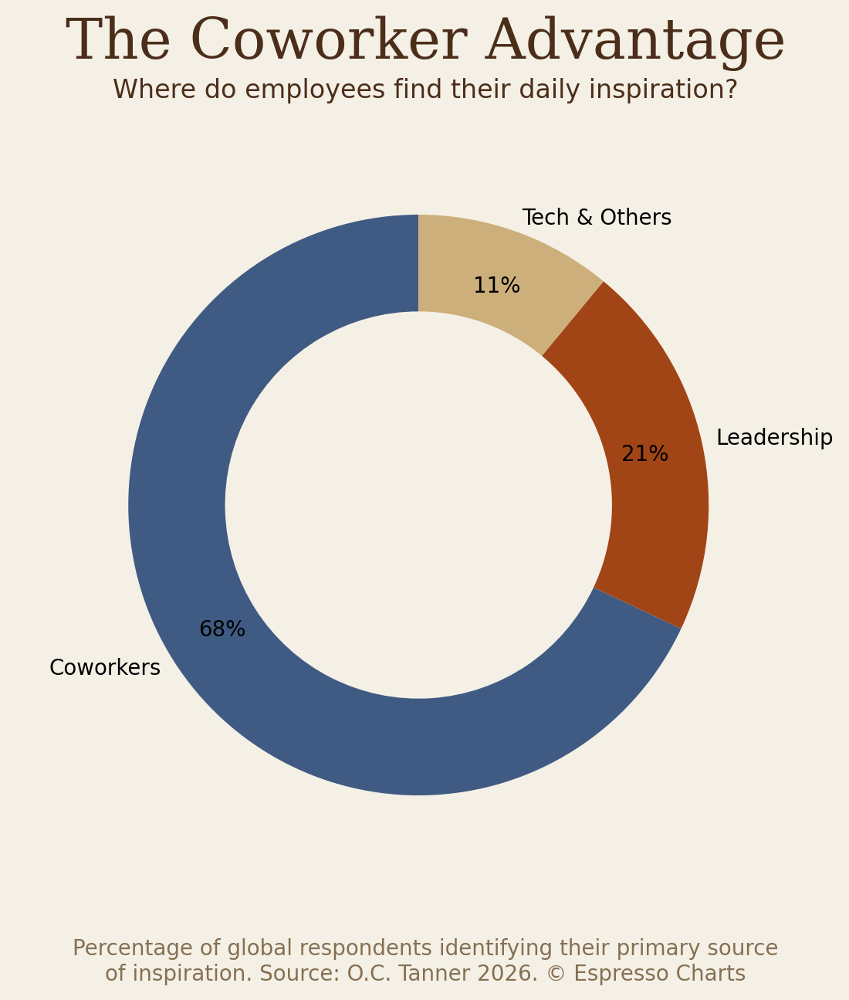

In [ ]:


# --- DATASET 1: Inspiration Sources (Donut Chart) ---
# Data based on O.C. Tanner 2026 findings
data_inspiration = {
    'Source': ['Coworkers', 'Leadership', 'Tech & Others'],
    'Value': [68, 21, 11]
}
df_inspire = pd.DataFrame(data_inspiration)

# --- DATASET 2: The Recognition Dividend (Bar Chart) ---
# Impact of human-centric recognition on organizational health
data_dividend = {
    'Metric': ['Burnout Reduction', 'Retention Increase', 'Productivity\nGain'],
    'Impact': [80, 51, 20]
}
df_dividend = pd.DataFrame(data_dividend).sort_values(by='Impact', ascending=True)

# --- FUNCTION CALL: Instagram (Donut Chart) ---
# Highlight: The primary pulse of inspiration comes from peers.
fig1, ax1 = eDonutChartInstagram(
    dfChart=df_inspire,
    colValue="Value",
    colLabel="Source",
    txtTitle="The Coworker Advantage",
    txtSup="Where do employees find their daily inspiration?",
    txtLabel="Percentage of global respondents identifying their primary source\nof inspiration. Source: O.C. Tanner 2026. © Espresso Charts",
    numFormat="{:.0f}%",
    faceColor='#F5F0E6', # Latte Cream
    title_size=26,
    instagram=True,
    colors=[color_blue, color_orange, color_sand],
    titleFont="DejaVu Serif"

)



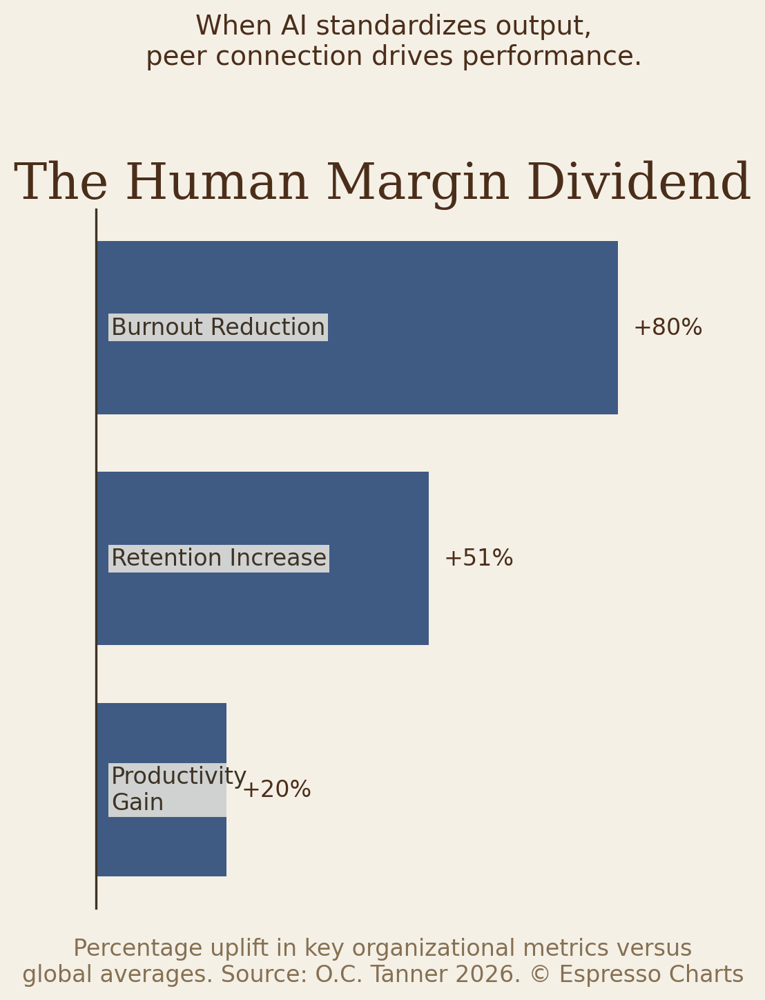

In [ ]:
# --- FUNCTION CALL: Substack (Single Bar Chart) ---
# Highlight: The massive impact of 'Human Connectivity' on the bottom line.
fig2, ax2 = eSingleBarChartNewInstagram(
    dfChart=df_dividend,
    colDim="Metric",
    colMeasure="Impact",
    txtTitle="The Human Margin Dividend",
    txtSuptitle="When AI standardizes output,\npeer connection drives performance.",
    txtLabel="Percentage uplift in key organizational metrics versus\nglobal averages. Source: O.C. Tanner 2026. © Espresso Charts",
    numFormat="+{:.0f}%",
    barColor=color_blue,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    title_size=26,
    #subtitle_size=12,
    titleFontWeight='medium',
    suptitleFontWeight='medium',
    txtLabelFontWeight='medium',
    font='DejaVu Sans',        # Base font for labels and ticks
    titleFont='DejaVu Serif',            # Font for title (defaults to font)
    suptitleFont='DejaVu Sans',         # Font for subtitle (defaults to font)
#    title_pad_custom=150,     # Custom padding for subtitle (overrides default)
    suptitle_y_custom =1.06)

# 2026 02 01 Super Bowl

ESPRESSO CHARTS DATA STORY

## TREND
**Title:** The $10 Million Second
**Hook:** Super Bowl LX ads now cost $333,333 per second—more than most Americans earn in 5 years.
**Description:** As Super Bowl LX approaches on February 8, 2026, NBC has
sold premium ad slots for a record $10 million per 30 seconds. Since 1967,
ad costs have grown 235x, from $42,500 to $10 million—making the Big Game
advertising's most expensive 30 seconds on Earth.

## DATA SOURCE
- **Dataset:** NBC Universal / Industry Reports
- **URL:** Various (CNBC, Variety, AdAge)
- **Description:** Super Bowl ad pricing from broadcast networks and industry trackers
- **Time range:** 1967-2026

## CHARTS

### Chart 1: Multi-Line Time Series (Ad Cost Growth)
- Function: `eMultiLineChartNew`
- txtTitle: "The $10 Million Second"
- txtSup: "Super Bowl ad costs have grown 235x since 1967."
- Key insight: Exponential growth, especially post-2015

### Chart 2: Horizontal Bar Chart (Event Comparison)
- Function: `eSingleBarChartNew

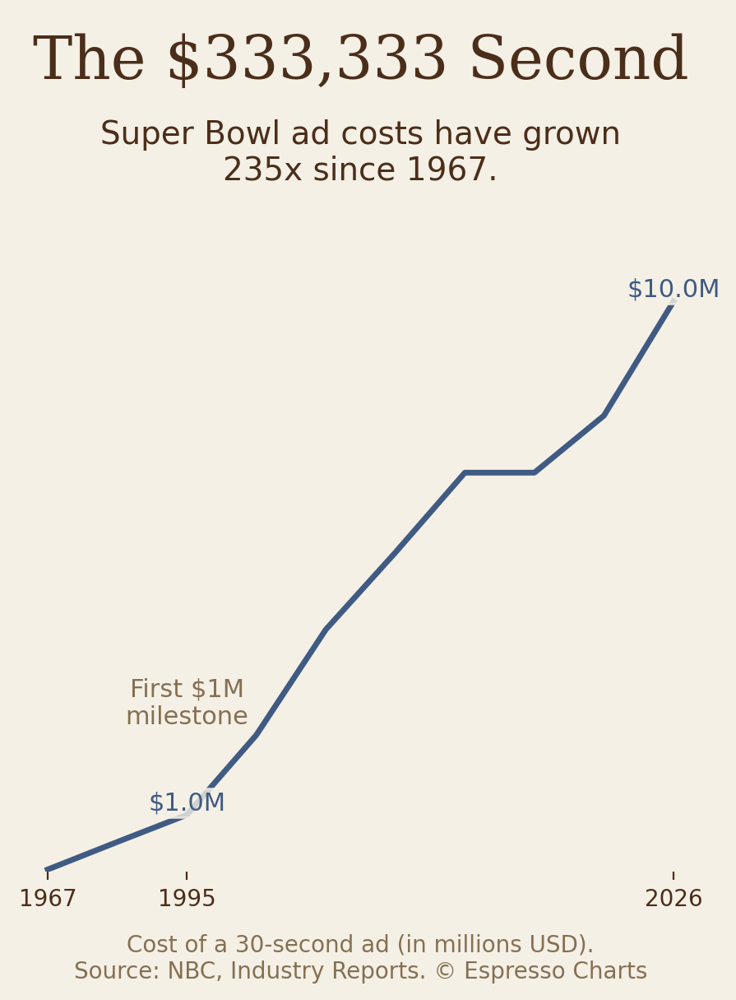

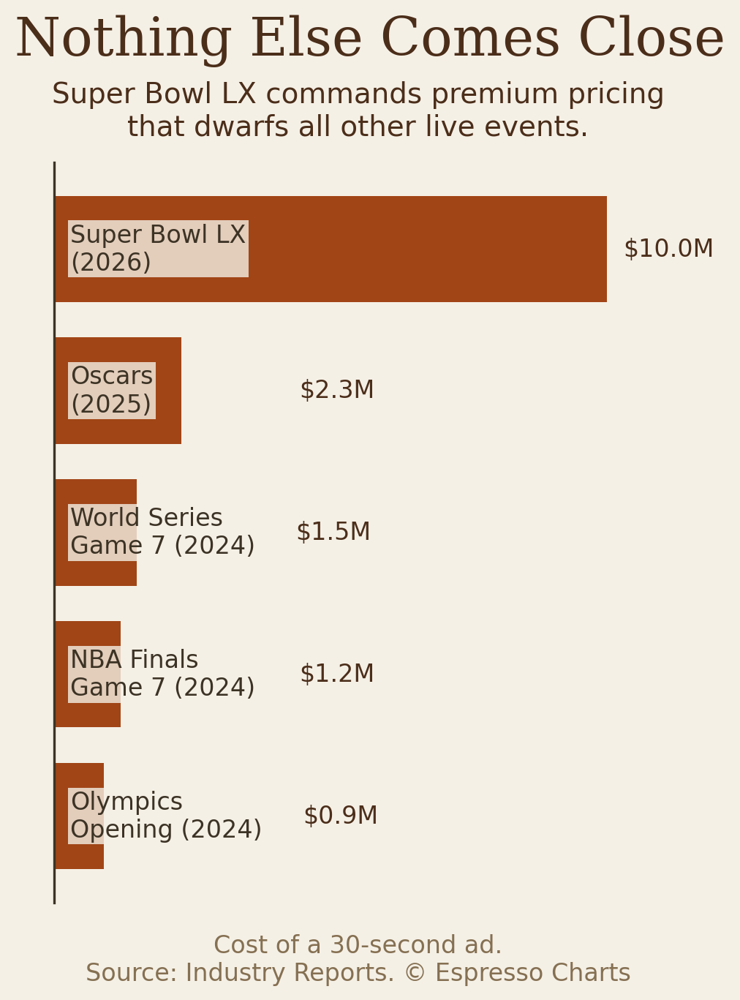

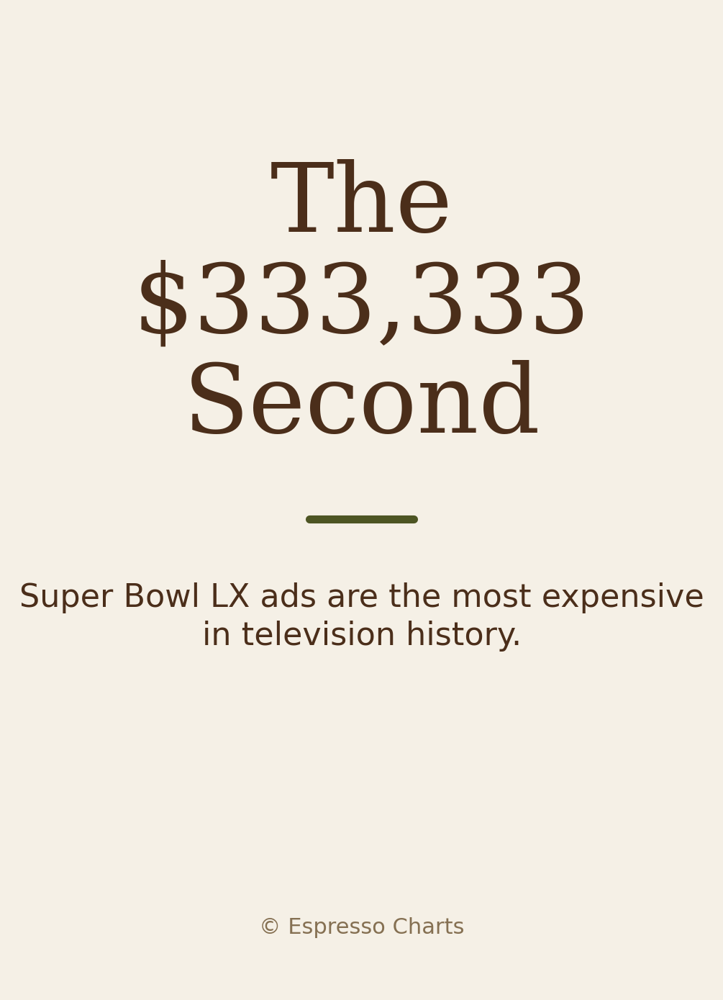

In [ ]:


# ============================================================================
# DATA: Super Bowl Ad Costs Over Time
# ============================================================================

# Historical Super Bowl ad costs (30-second spot in millions USD)
data_timeline = {
    'Year': ['1967', '1985', '1995', '2005', '2015', '2020', '2023', '2024', '2025', '2026'],
    'Cost_M': [0.0425, 0.525, 1.0, 2.4, 4.25, 5.6, 7.0, 7.0, 8.0, 10.0]
}
df_timeline = pd.DataFrame(data_timeline)

# Super Bowl LX breakdown - where the money goes
data_breakdown = {
    'Category': ['Airtime (30s)', 'Production', 'Celebrity Talent', 'Media Amplification'],
    'Cost_M': [8.0, 3.0, 2.5, 3.0]
}
df_breakdown = pd.DataFrame(data_breakdown)

# Comparison with other events (cost per 30 seconds in millions)
data_comparison = {
    'Event': ['Super Bowl LX\n(2026)', 'Oscars\n(2025)', 'World Series\nGame 7 (2024)', 'NBA Finals\nGame 7 (2024)', 'Olympics\nOpening (2024)'],
    'Cost_M': [10.0, 2.3, 1.5, 1.2, 0.9]
}
df_comparison = pd.DataFrame(data_comparison).sort_values(by='Cost_M', ascending=True)

print("=" * 60)
print("ESPRESSO CHARTS DATA STORY")
print("=" * 60)
print("\n## TREND")
print("**Title:** The $10 Million Second")
print("**Hook:** Super Bowl LX ads now cost $333,333 per second—more than most Americans earn in 5 years.")
print("**Description:** As Super Bowl LX approaches on February 8, 2026, NBC has")
print("sold premium ad slots for a record $10 million per 30 seconds. Since 1967,")
print("ad costs have grown 235x, from $42,500 to $10 million—making the Big Game")
print("advertising's most expensive 30 seconds on Earth.")

print("\n## DATA SOURCE")
print("- **Dataset:** NBC Universal / Industry Reports")
print("- **URL:** Various (CNBC, Variety, AdAge)")
print("- **Description:** Super Bowl ad pricing from broadcast networks and industry trackers")
print("- **Time range:** 1967-2026")

print("\n## CHARTS")
print("\n### Chart 1: Multi-Line Time Series (Ad Cost Growth)")
print("- Function: `eMultiLineChartNew`")
print("- txtTitle: \"The $10 Million Second\"")
print("- txtSup: \"Super Bowl ad costs have grown 235x since 1967.\"")
print("- Key insight: Exponential growth, especially post-2015")

print("\n### Chart 2: Horizontal Bar Chart (Event Comparison)")
print("- Function: `eSingleBarChartNewInstagram`")
print("- txtTitle: \"Nothing Else Comes Close\"")
print("- txtSup: \"Super Bowl LX commands premium pricing.\"")
print("- Key insight: Super Bowl costs 4x more than the Oscars")

# ============================================================================
# GENERATE CHARTS
# ============================================================================

# --- CHART 1: Ad Cost Growth Timeline ---
# --- CHART 1: Ad Cost Growth Timeline ---
fig1, ax1 = eMultiLineChartInstagram(
    dfChart=df_timeline,
    colDim="Year",
    colMeasureList=["Cost_M"],                    # LIST, not single column
    txtTitle="The $333,333 Second",
    txtSup="Super Bowl ad costs have grown\n235x since 1967.",
    txtLabel="Cost of a 30-second ad (in millions USD).\nSource: NBC, Industry Reports. © Espresso Charts",
    posText=[2, -1],                                  # REQUIRED: positions for value annotations
    posLabel=None,                                 # Don't show line labels (single line)
    numFormat="${:.1f}M",
    lineColors=[color_blue],                       # LIST of colors
    lineWidths=[2.5],                              # LIST of widths
    faceColor=faceColor,
    title_size=26,
    subtitle_size=14,
    label_size=11,
    title_y=0.98,
    subtitle_y=0.88,
    titleFontFamily='DejaVu Serif',               # Not 'titleFont'
    subTitleFontFamily='DejaVu Sans',             # Not 'subTitleFont'
    yLimits=(0, 15),                              # Tuple, not yMin/yMax
    xTicks=[0, 2, len(df_timeline)-1],               # First and last index
    xTicklabels=['1967', '1995', '2026'],                 # Custom labels
    showYAxis=False,                               # Show Y axis
    yTicks=[0, 2, 4, 6, 8, 10],
    px=1080,
    py=1350,                                       # 4:5 format
    aspectRatio=None,                # <-- ADD THIS (disables forced square axes)

)

# Add milestone annotations
texts = [
#    {
#        'text': '$10M',
#        'xy': (9, 10.5),
#        'fontsize': 14,
#        'color': color_blue,
#        'ha': 'center',
#        'va': 'bottom',
#        'fontweight': 'bold'
#    },
    {
        'text': 'First $1M\nmilestone',
        'xy': (2, 2.5),
        'fontsize': 11,
        'color': '#857052',
        'ha': 'center',
        'va': 'bottom'
    }
]
add_text(ax1, texts)


# --- CHART 2: Event Comparison Bar Chart ---
# --- CHART 2: Event Comparison Bar Chart ---
fig2, ax2 = eSingleBarChartNewInstagram(
    dfChart=df_comparison,
    colDim="Event",
    colMeasure="Cost_M",

    # Hierarchy: Suptitle is the "Eyebrow", Title is the "Headline"
    txtSuptitle="Nothing Else Comes Close",
    txtTitle="Super Bowl LX commands premium pricing\nthat dwarfs all other live events.",
    txtLabel="Cost of a 30-second ad.\nSource: Industry Reports. © Espresso Charts",

    numFormat="${:.1f}M",
    barColor=color_orange,
    faceColor=faceColor,

    instagram=True,
    px_width=1080,
    px_height=1350,

    # Sizing
    suptitle_size=26,
    title_size=14,
    label_size=12,

    # Vertical Fixes
    # We set suptitle very high and keep the title pad modest to maintain the gap
    #suptitle_y_custom=0.85,
    #title_pad_custom=40,
    suptitle_y_custom=1,   # Very top of the 1350px height
    title_pad_custom=40,      # Sits comfortably above the bars

    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',

    labelCustomOffset={0: 90, 1: 80, 2: 70, 3: 50},
    x_title_offset=0.55
)

# ============================================================================
# INSTAGRAM POST CONTENT
# ============================================================================
print("\n" + "=" * 60)
print("INSTAGRAM POST")
print("=" * 60)

instagram_caption = """
🏈 THE $10 MILLION SECOND 💰

Super Bowl LX is one week away—and brands are paying more than ever to reach you.

NBC just sold premium 30-second ad slots for $10 MILLION each.

That's $333,333 per second.

More than most Americans earn in 5 years... for half a minute of your attention.

📈 The numbers are staggering:
• 1967: $42,500 for 30 seconds
• 1995: First million-dollar milestone
• 2026: $10 million (a 235x increase)

Why do brands still pay? Because nothing else compares.

The Super Bowl delivers 127+ million simultaneous viewers—the last true mass media moment in a fragmented world.

The Oscars? $2.3M.
World Series Game 7? $1.5M.
Super Bowl? 4x the price and sold out 5 months early.

🎯 The Big Game isn't just football. It's the advertising industry's annual moment of truth.

Swipe for the data breakdown →

#SuperBowl #SuperBowlLX #DataVisualization #EspressoCharts #Advertising #Marketing #NFL #BusinessOfSports #MediaTrends #DataJournalism #Infographic #MarketingStrategy #BrandStrategy #TVAdvertising #MadMen #AdTech #SuperBowlAds #BigGame #Football #SportsMarketing
"""

print(instagram_caption)

# ============================================================================
# SUBSTACK POST CONTENT
# ============================================================================
print("\n" + "=" * 60)
print("SUBSTACK POST")
print("=" * 60)

substack_post = """
# The $10 Million Second: Why Brands Still Pay Record Prices for Super Bowl Ads

**Super Bowl LX ads now cost $333,333 per second—more than most Americans earn in 5 years. Here's why advertisers keep writing the checks.**

---

On February 8, 2026, approximately 130 million Americans will tune in to watch the Seattle Seahawks face the New England Patriots in Super Bowl LX. Most will be watching for the football. A surprising number will be there for something else entirely: the commercials.

This year, NBC sold premium 30-second ad slots for a record $10 million apiece. The average spot went for $8 million—up from $7.5 million last year. All inventory sold out by September 2025, the earliest sellout in Super Bowl history.

## The 235x Multiplier

When Super Bowl I aired in 1967, a 30-second spot cost $42,500. Adjusted for inflation, that's about $400,000 in today's money. But advertisers aren't paying $400,000. They're paying $10 million—a 235x increase in nominal terms and roughly 25x in real terms.

The growth hasn't been linear. From 1967 to 1995, it took 28 years to reach the first million-dollar milestone. Since then, prices have accelerated sharply, driven by consolidation in media, the fragmentation of TV audiences elsewhere, and the Super Bowl's unique position as appointment viewing.

## Why the Price Still Makes Sense

On paper, $10 million for 30 seconds sounds irrational. Digital CPMs are lower. Linear TV viewership is declining. But the Super Bowl operates on different logic.

**Reach:** Last year's game drew 127.7 million viewers across TV and streaming—the largest audience in Super Bowl history. No other single event delivers that scale.

**Attention:** Roughly 42% of viewers say they tune in specifically for the commercials. The ads aren't interruptions; they're content.

**Cultural moment:** A successful Super Bowl ad enters the cultural conversation. It gets replayed on morning shows, dissected on social media, and remembered for years. Budweiser's Clydesdales are making their 48th Super Bowl appearance this year.

## The Real Cost

The $8-10 million figure is just the airtime. Factor in production, celebrity talent, and media amplification, and the total investment runs $12-23 million or more.

Hims, the telehealth company running its first Super Bowl ad this year, told Inc. that their total spend hit $16 million after nearly a year of planning.

## Nothing Else Comes Close

Compare the Super Bowl to other premium advertising moments:

- **Super Bowl LX (2026):** $10M / 30 seconds
- **Oscars (2025):** $2.3M
- **World Series Game 7 (2024):** $1.5M
- **NBA Finals Game 7 (2024):** $1.2M
- **Olympics Opening Ceremony (2024):** $0.9M

The Super Bowl commands a 4x premium over the Oscars and nearly 10x over the Olympics opening. That's the pricing power of scarcity and scale combined.

## The Streaming Shift

Perhaps the most interesting development this year: streaming viewership nearly matched traditional broadcast during Super Bowl LIX, accounting for 43.5% of total viewers. Industry analysts predict Super Bowl LX could become the first where streaming exceeds broadcast—a seismic shift.

For advertisers, this offers new opportunities: enhanced targeting, measurable engagement, and extended shelf life through on-demand replays. The 30-second spot isn't just a TV buy anymore—it's a multi-platform campaign anchor.

## The Bottom Line

Is a Super Bowl ad worth $10 million? The answer depends on what you're buying.

For pure reach metrics, it's expensive but not irrational. For cultural relevance, it may be irreplaceable. For brand-building at scale, it remains advertising's most efficient 30 seconds.

In a media landscape fractured by streaming, social feeds, and infinite content, the Super Bowl persists as the last true mass-media moment. That scarcity, more than anything, is what commands the premium.

And as long as 130 million people keep showing up, advertisers will keep writing the checks.

---

*Data sources: NBC Universal, CNBC, Variety, AdAge, Front Office Sports. Analysis by Espresso Charts.*

**Tags:** super bowl, advertising, marketing, media trends, data journalism, sports business, TV advertising
"""




# --- Example 1: Super Bowl Ad Costs ---
fig1, ax1 = eCoverTileInstagram(
    txtTitle="The\n$333,333\nSecond",
    txtSup="Super Bowl LX ads are the most expensive\nin television history.",
    txtLabel="© Espresso Charts",
    title_size=48,
    subtitle_size=16,
    accent_line_color=color_green,
    px_width=1080,
    px_height=1350,
    title_y=0.7
)




print(substack_post)

print("\n" + "=" * 60)
print("CHARTS GENERATED SUCCESSFULLY")
print("=" * 60)


#2026 02 01 Grammy post

<Axes: title={'center': 'Kendrick Lamar now holds the all-time record with\n27 Grammy wins, 2 ahead of Jay-Z.'}, xlabel='Career Grammy wins as of Feb 2, 2026.\nSource: Grammy.com. © Espresso Charts'>

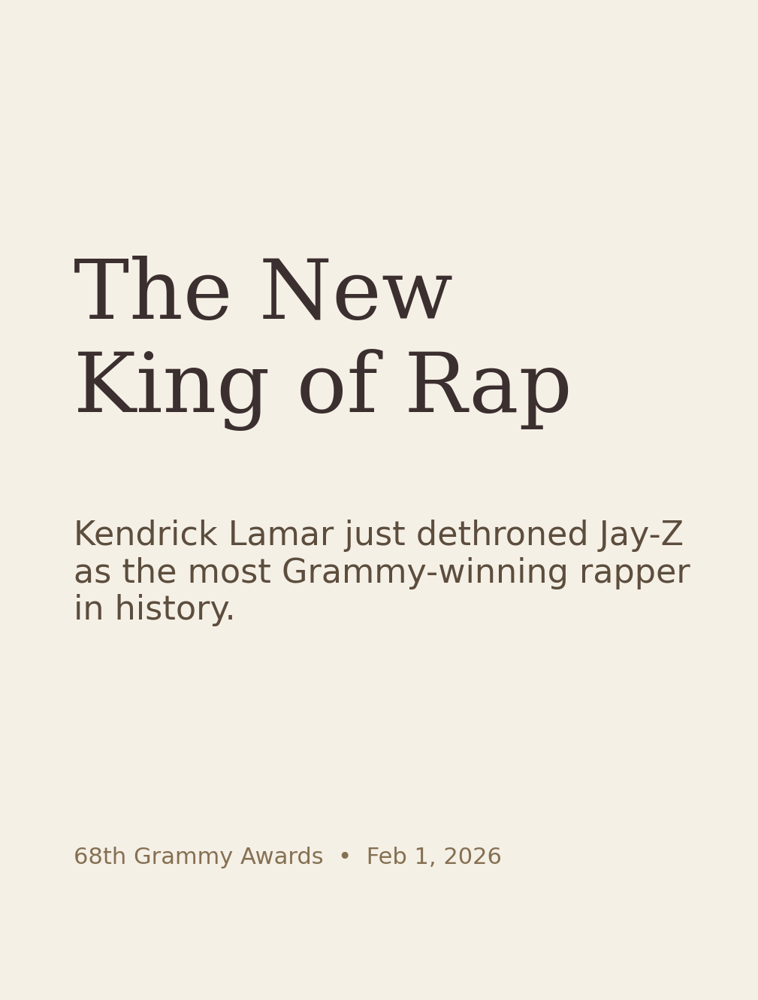

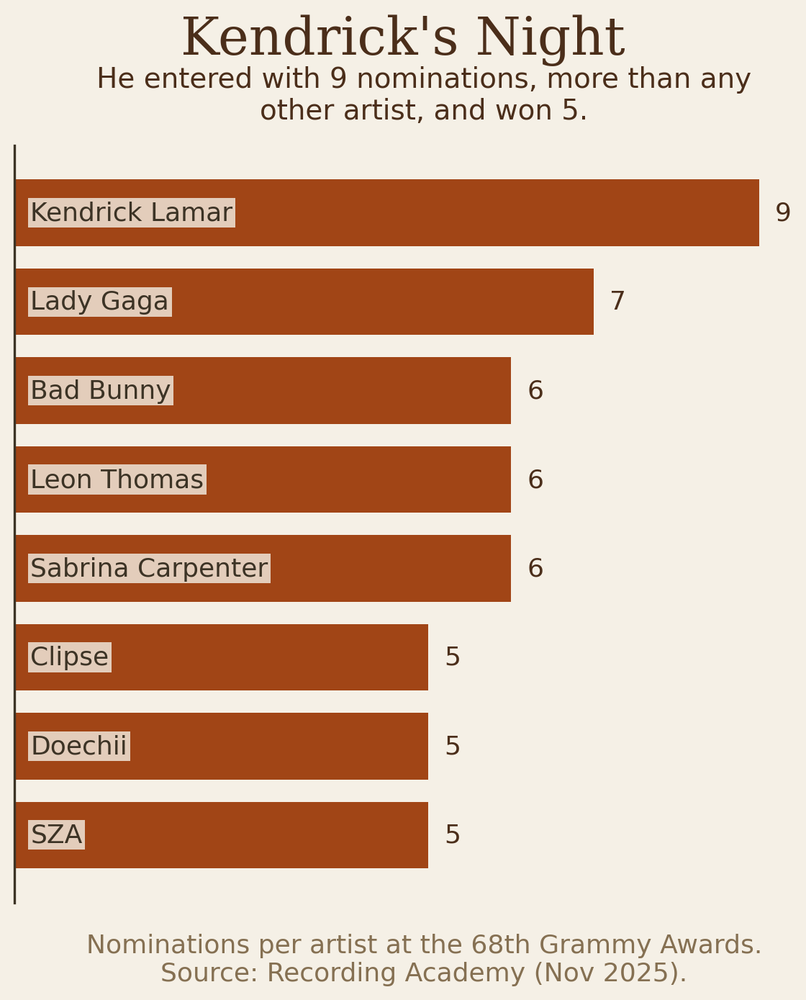

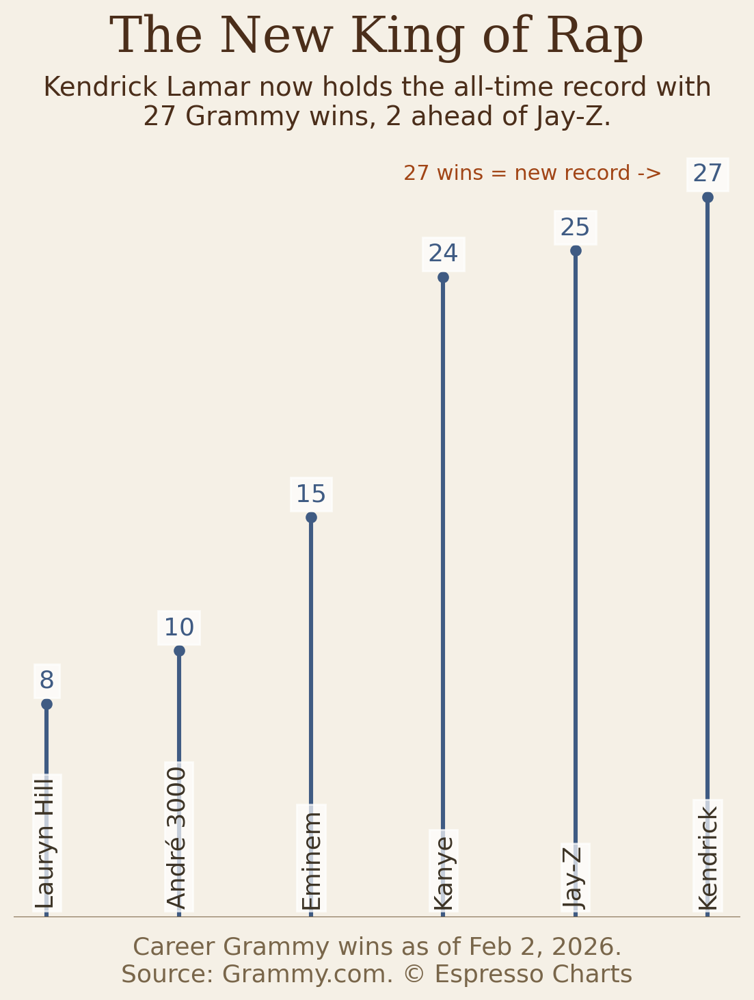

In [ ]:
# =============================================================================
# ESPRESSO CHARTS — Grammy Edition (POST-CEREMONY)
# Data Story: Kendrick Lamar Breaks the Record | Feb 2, 2026
# =============================================================================
#
# RESULT
#   Title:  The New King of Rap
#   Hook:   Kendrick Lamar just became the most Grammy-winning rapper in
#           history — dethroning Jay-Z with 27 total awards.
#
# WHAT HAPPENED
#   - Kendrick Lamar won 5 Grammys at the 68th Grammy Awards (Feb 1, 2026)
#   - His 26th win (Best Rap Album) broke Jay-Z's record of 25
#   - His 27th win (Record of the Year) extended the new record
#   - Bad Bunny made history: first all-Spanish-language Album of the Year
#   - Kendrick swept all 4 rap categories + Record of the Year
#
# DATA SOURCES
#   [1] Recording Academy — 2026 Grammy Results
#       https://www.grammy.com/news/2026-grammys-nominations-full-winners-nominees-list
#   [2] Grammy.com — All-Time Rap Grammy Wins (Updated Feb 2, 2026)
#       https://www.grammy.com/news/rappers-who-have-the-most-grammy-wins
# =============================================================================

import pandas as pd

# --- PALETTE ---
color_blue  = '#3F5B83'
color_orange = '#A14516'
color_green = '#4D5523'
color_sand  = '#CDAF7B'

# =============================================================================
# SLIDE 1 — COVER
# =============================================================================

fig_cover, ax_cover = plt.subplots(figsize=(1080/200, 1350/200), dpi=200, facecolor='#F5F0E6')
ax_cover.set_facecolor('#F5F0E6')
ax_cover.set_xlim(0, 10)
ax_cover.set_ylim(0, 12.5)
ax_cover.axis('off')

cover_texts = [
    {
        'text': 'The New\nKing of Rap',
        'xy': (0.8, 9.4),
        'fontsize': 40,
        'color': '#3C2F2F',
        'ha': 'left',
        'va': 'top',
        'fontweight': 'normal',
        'family': 'DejaVu Serif'
    },
    {
        'text': 'Kendrick Lamar just dethroned Jay-Z\nas the most Grammy-winning rapper\nin history.',
        'xy': (0.8, 6.0),
        'fontsize': 16,
        'color': '#5C4D3D',
        'ha': 'left',
        'va': 'top',
        'fontweight': 'light',
        'family': 'DejaVu Sans'
    },
    {
        'text': '68th Grammy Awards  •  Feb 1, 2026',
        'xy': (0.8, 1.5),
        'fontsize': 11,
        'color': '#857052',
        'ha': 'left',
        'va': 'bottom',
        'fontweight': 'light',
        'family': 'DejaVu Sans'
    }
]
add_text(ax_cover, cover_texts)
plt.tight_layout()

# =============================================================================
# SLIDE 2 — NOMINATION LEADERS (Horizontal Bar)
# Context: Shows how Kendrick entered the night with a commanding lead.
# =============================================================================

data_nominations = {
    'Artist': ['SZA', 'Doechii', 'Clipse',
               'Sabrina Carpenter', 'Leon Thomas', 'Bad Bunny',
               'Lady Gaga', 'Kendrick Lamar'],
    'Nominations': [5, 5, 5, 6, 6, 6, 7, 9]
}
df_noms = pd.DataFrame(data_nominations)

fig1, ax1 = eSingleBarChartNewInstagram(
    dfChart=df_noms,
    colDim='Artist',
    colMeasure='Nominations',
    txtSuptitle="Kendrick's Night",
    txtTitle="He entered with 9 nominations, more than any\nother artist, and won 5.",
    txtLabel="Nominations per artist at the 68th Grammy Awards.\nSource: Recording Academy (Nov 2025).",
    numFormat="{:.0f}",
    barColor=color_orange,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    suptitle_size=26,
    title_size=14,
    label_size=13,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    suptitleFontWeight='normal',
    suptitle_y_custom=1,
    title_pad_custom=40,
    sepIndex=6,
    sepColor='#A14516',
    sepStyle='--',
    sepWidth=1.2,
    x_title_offset=0.55
)

# Disable constrained_layout and manually set exact size
fig1.set_constrained_layout(False)
fig1.set_size_inches(1080/200, 1350/200, forward=True)
plt.tight_layout(pad=0)

# =============================================================================
# SLIDE 3 — THE RAP CROWN (Stem Chart) — UPDATED WITH NEW RECORD
# Key Update: Kendrick now sits ALONE at the top with 27 wins.
# =============================================================================

data_rap_kings = {
    'Rapper': ['Lauryn Hill', 'André 3000', 'Eminem',
               'Kanye', 'Jay-Z', 'Kendrick'],
    'Wins': [8, 10, 15, 24, 25, 27]
}
df_rap = pd.DataFrame(data_rap_kings)

fig2, ax2 = eStemChartNewInstagram(
    dfChart=df_rap,
    colDim='Rapper',
    colMeasureA='Wins',
    txtTitle="The New King of Rap",
    txtSup="Kendrick Lamar now holds the all-time record with\n27 Grammy wins, 2 ahead of Jay-Z.",
    txtLabel="Career Grammy wins as of Feb 2, 2026.\nSource: Grammy.com. © Espresso Charts",
    numFormat="{:.0f}",
    colorA=color_blue,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    rotateLabels=True,
    yMin=0,
    yMax=29,
    suptitle_y=1.06,
    title_pad=10,
    labelpad=10,
    title_size=26,
    subtitle_size=14,
    label_size=13,
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    offset=0,
    xTickLabelYOffset=0.02,
    markerSize=5,
    lineWidth=2.2,
    lineFormatA="-"
)

# Force exact dimensions (constrained_layout can drift)
fig2.set_size_inches(1080/200, 1350/200)


# --- TEXT CALLOUT: new record ---
texts = [
    {
        'text': '27 wins = new record ->',
        'xy': (2.7, 28.25),
        'fontsize': 11,
        'color': '#A14516',
        'ha': 'left',
        'va': 'top',
        'fontweight': 'medium',
        'family': 'DejaVu Sans'
    }
]
add_text(ax2, texts)


# 2026 02 06 Market Caps

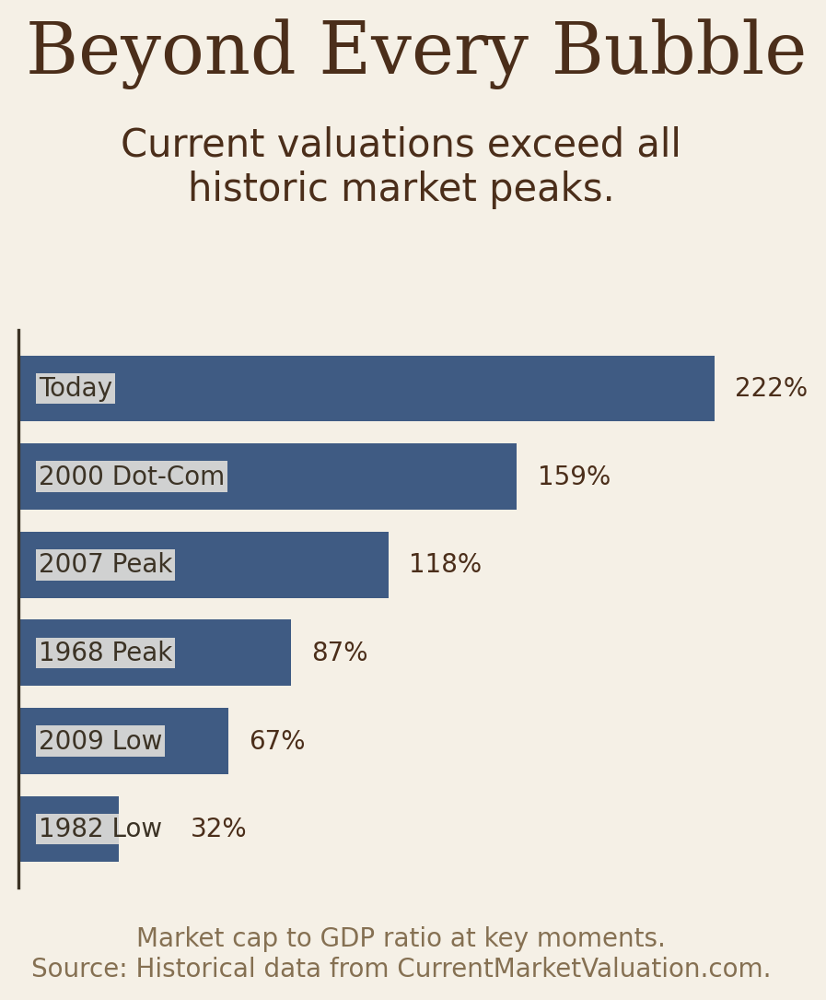

In [ ]:
# ============================================================================
# ESPRESSO CHARTS: When Markets Hit 220%
# Educational story about the Buffett Indicator using Apple's milestone as hook
# ============================================================================

# ============================================================================
# CHART 2: Bubble Peaks Comparison (Bar Chart)
# ============================================================================

# --- DATA ---
data_peaks = {
    'Period': ['1982 Low', '2009 Low', '1968 Peak', '2007 Peak', '2000 Dot-Com', 'Today'],
    'Ratio': [32, 67, 87, 118, 159, 222]
}
df_peaks = pd.DataFrame(data_peaks).sort_values(by='Ratio', ascending=True)

# --- CHART CALL ---
fig2, ax2 = eSingleBarChartNewInstagram(
    dfChart=df_peaks,
    colDim="Period",
    colMeasure="Ratio",
    txtSuptitle="Beyond Every Bubble",
    txtTitle="Current valuations exceed all\nhistoric market peaks.",
    txtLabel="Market cap to GDP ratio at key moments.\nSource: Historical data from CurrentMarketValuation.com.",
    numFormat="{:.0f}%",
    barColor=color_blue,
    faceColor='#F5F0E6',
    aspectRatio=0.8,
    suptitle_size=28,
    title_size=15,
    label_size=10,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    suptitle_y_custom=0.95,   # Very top of the 1350px height
    title_pad_custom=80,      # Sits comfortably above the bars
    x_title_offset=0.55,
    labelCustomOffset={0: 20}

)



Data: {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'observation_start': '1975-01-01', 'observation_end': '9999-12-31', 'units': 'lin', 'output_type': 1, 'file_type': 'json', 'order_by': 'observation_date', 'sort_order': 'asc', 'count': 46, 'offset': 0, 'limit': 100000, 'observations': [{'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '1975-01-01', 'value': '41.7709'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '1976-01-01', 'value': '47.1386'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '1977-01-01', 'value': '40.0724'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '1978-01-01', 'value': '36.6543'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '1979-01-01', 'value': '37.8175'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-20', 'date': '1980-01-01', 'value': '47.5902'}, {'realtime_start': '2026-02-20', 'realtime_end': '2026-02-2

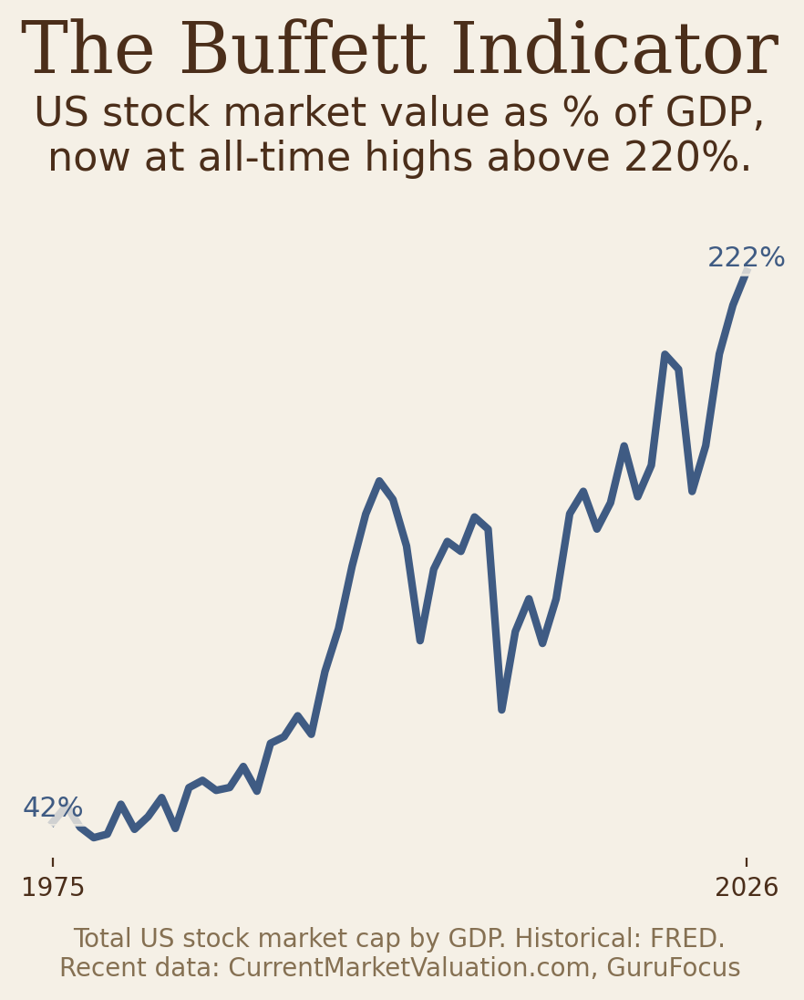

In [ ]:
# ============================================================================
# CHART 1: The Buffett Indicator Over Time
# ============================================================================

# --- FETCH DATA FROM FRED (historical through 2020) ---
df_buffett = fetch_fred_series('DDDM01USA156NWDB', start_date='1975-01-01')
df_buffett = df_buffett.rename(columns={'value': 'market_cap_pct_gdp'})
df_buffett['year'] = df_buffett['date'].dt.year
df_annual = df_buffett.groupby('year')['market_cap_pct_gdp'].last().reset_index()

# --- ADD RECENT DATA POINTS MANUALLY (2021-2026) ---
# Source: CurrentMarketValuation.com, GuruFocus, MacroMicro
recent_data = pd.DataFrame({
    'year': [2021, 2022, 2023, 2024, 2025, 2026],
    'market_cap_pct_gdp': [190, 150, 165, 195, 211, 222]  # Approximate annual values
})

# Combine historical FRED data with recent manual data
df_annual = pd.concat([df_annual, recent_data], ignore_index=True)
df_annual = df_annual.drop_duplicates(subset=['year'], keep='last').sort_values('year')

# --- CHART CALL ---
fig1, ax1 = eMultiLineChartInstagram(
    dfChart=df_annual,
    colDim="year",
    colMeasureList=["market_cap_pct_gdp"],
    txtTitle="The Buffett Indicator",
    txtSup="US stock market value as % of GDP,\nnow at all-time highs above 220%.",
    txtLabel="Total US stock market cap by GDP. Historical: FRED.\nRecent data: CurrentMarketValuation.com, GuruFocus",
    posText=[0, -1],
    posLabel=None,
    numFormat="{:.0f}%",
    px=1080,
    py=1350,
    dpi=200,
    faceColor='#F5F0E6',
    lineColors=[color_blue],
    title_size=28,
    subtitle_size=16,
    label_size=11,
    lineWidths=[3],
    titleFontFamily='DejaVu Serif',
    subTitleFontFamily='DejaVu Sans',
    yLimits=(30, 280),
    title_y=1.1,      # Move title UP (higher value = further up)
    subtitle_y=1,   # Move subtitle UP
)


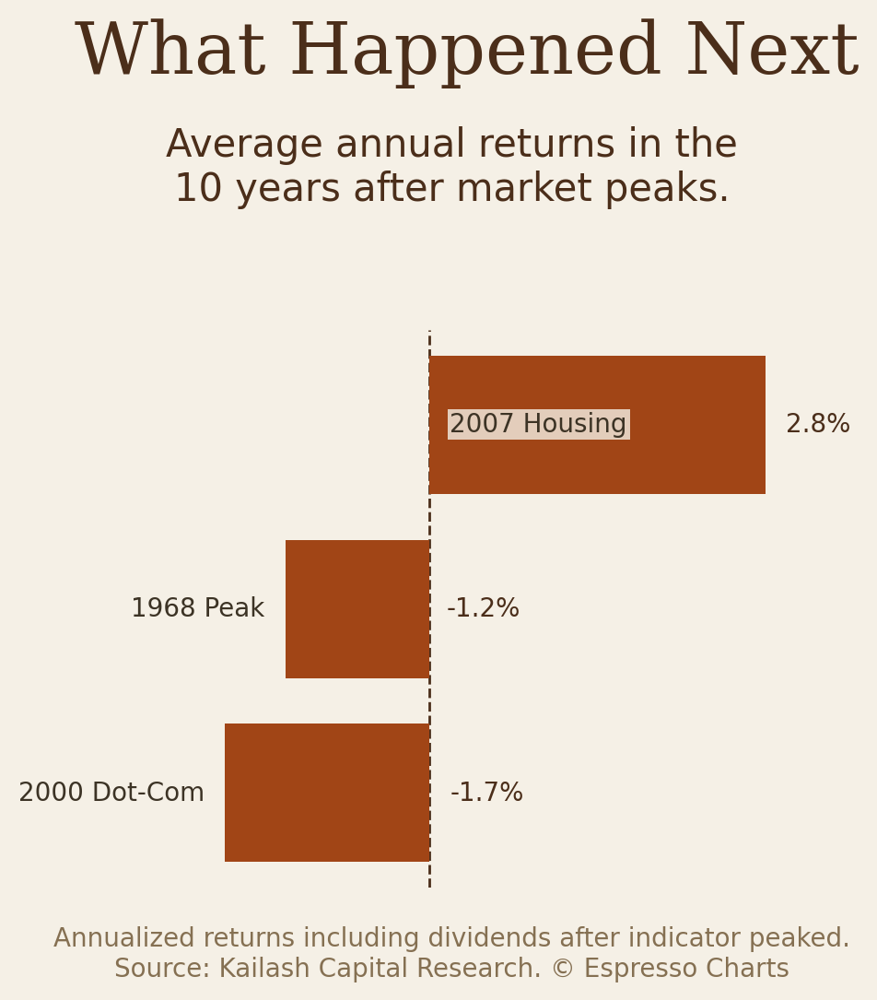

In [ ]:
# ============================================================================
# CHART 3: What Happened Next (Bar Chart showing returns after peaks)
# ============================================================================

# --- DATA ---
data_returns = {
    'Bubble': ['1968 Peak', '2000 Dot-Com', '2007 Housing'],
    'Returns_10yr': [-1.2, -1.7, 2.8]
}
df_returns = pd.DataFrame(data_returns).sort_values(by='Returns_10yr', ascending=True)

# --- CHART CALL ---
fig3, ax3 = eSingleBarChartNewInstagram(
    dfChart=df_returns,
    colDim="Bubble",
    colMeasure="Returns_10yr",
    txtSuptitle="What Happened Next",
    txtTitle="Average annual returns in the\n10 years after market peaks.",
    txtLabel="Annualized returns including dividends after indicator peaked.\nSource: Kailash Capital Research. © Espresso Charts",
    numFormat="{:.1f}%",
    barColor=color_orange,
    faceColor='#F5F0E6',
    aspectRatio=0.8,
    suptitle_size=28,
    suptitle_y_custom=0.95,
    title_pad_custom=80,
    title_size=15,
    label_size=10,
    showZeroLine=True,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    labelCustomOffset={0:-125, 1:-100},
    hideLeftSpine=True,
    minVal=-3
)

#2026 02 10 Health / Obesity

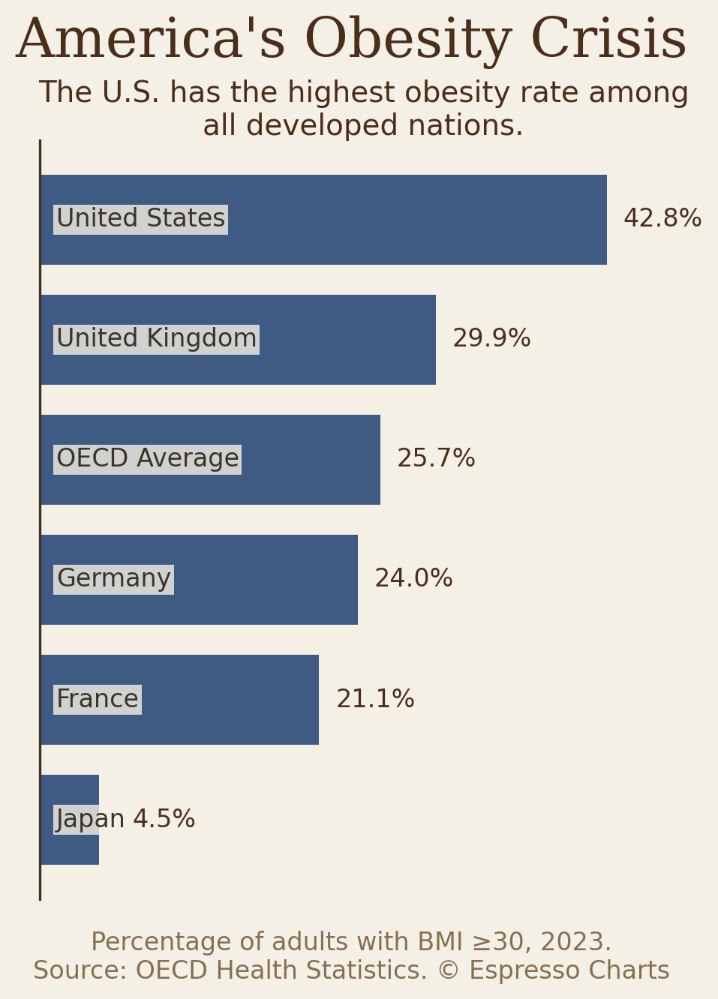

In [ ]:


data_obesity_comparison = {
    'Country': ['United States', 'United Kingdom', 'Germany', 'France', 'Japan', 'OECD Average'],
    'Obesity_Rate': [42.8, 29.9, 24.0, 21.1, 4.5, 25.7]
}
df_obesity = pd.DataFrame(data_obesity_comparison).sort_values(by='Obesity_Rate', ascending=True)

# --- CHART CALL ---
fig1, ax1 = eSingleBarChartNewInstagram(
    dfChart=df_obesity,
    colDim="Country",
    colMeasure="Obesity_Rate",
    txtTitle="America's Obesity Crisis",
    txtSuptitle="The U.S. has the highest obesity rate among\nall developed nations.",
    txtLabel="Percentage of adults with BMI ≥30, 2023.\nSource: OECD Health Statistics. © Espresso Charts",
    numFormat="{:.1f}%",
    barColor=color_blue,
    faceColor='#F5F0E6',
    instagram=True,
    dpi=200,
    aspectRatio=None,
    px_width=1080,
    px_height=1350,
    title_size=26,
    suptitle_y_custom=0.91,
    title_pad_custom=60,
    titleFont='DejaVu Serif',
    suptitleFont='DejaVu Sans',
    labelCustomOffset={0:8}
)
save_chart(fig1, "obesity_chart.png", dpi=200)

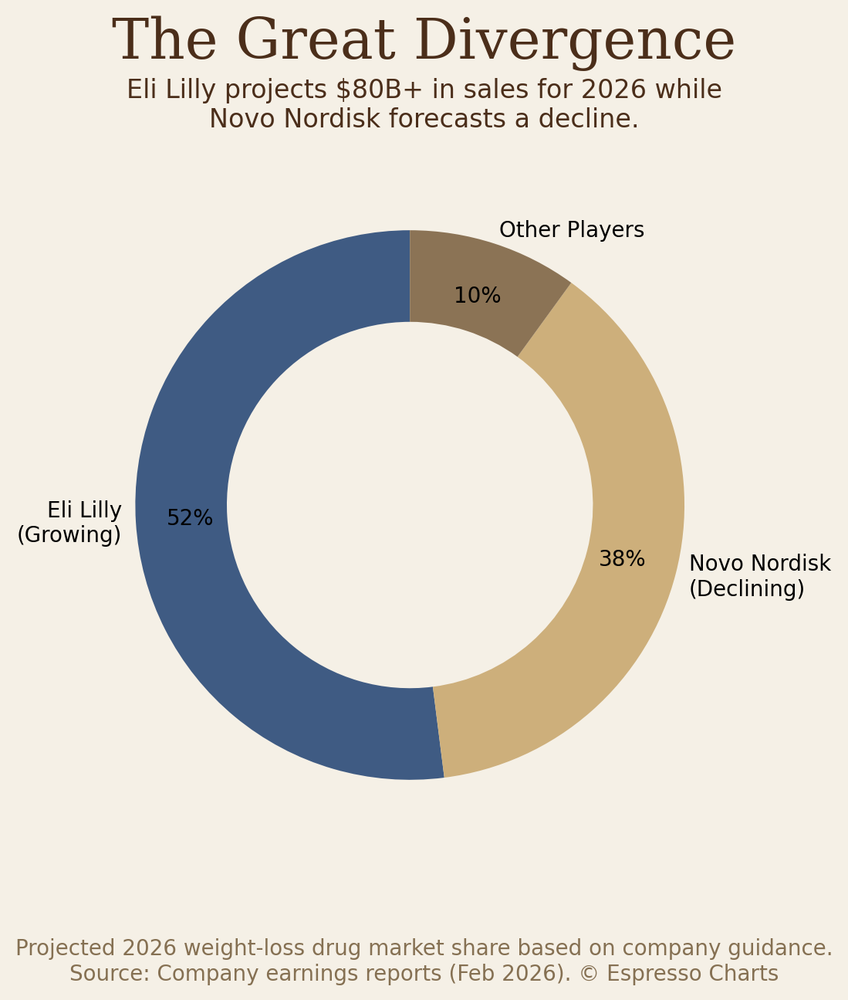

In [ ]:
# --- DATA ---
# Simplified market share projection based on 2026 revenue guidance
data_market_2026 = {
    'Company': ['Eli Lilly\n(Growing)', 'Novo Nordisk\n(Declining)', 'Other Players'],
    'Market_Share': [52, 38, 10]
}
df_market = pd.DataFrame(data_market_2026)

# --- CHART CALL ---
fig2, ax2 = eDonutChartInstagram(
    dfChart=df_market,
    colValue="Market_Share",
    colLabel="Company",
    txtTitle="The Great Divergence",
    txtSup="Eli Lilly projects $80B+ in sales for 2026 while\nNovo Nordisk forecasts a decline.",
    txtLabel="Projected 2026 weight-loss drug market share based on company guidance.\nSource: Company earnings reports (Feb 2026). © Espresso Charts",
    numFormat="{:.0f}%",
    faceColor='#F5F0E6',
    title_size=26,
    instagram=True,
    px=1080,
    dpi=200,
    colors=[color_blue, color_sand, '#8B7355'],
    titleFont="DejaVu Serif"
)
save_chart(fig2, "divergence.png", dpi=200)

#2026 02 14 Valentines Day

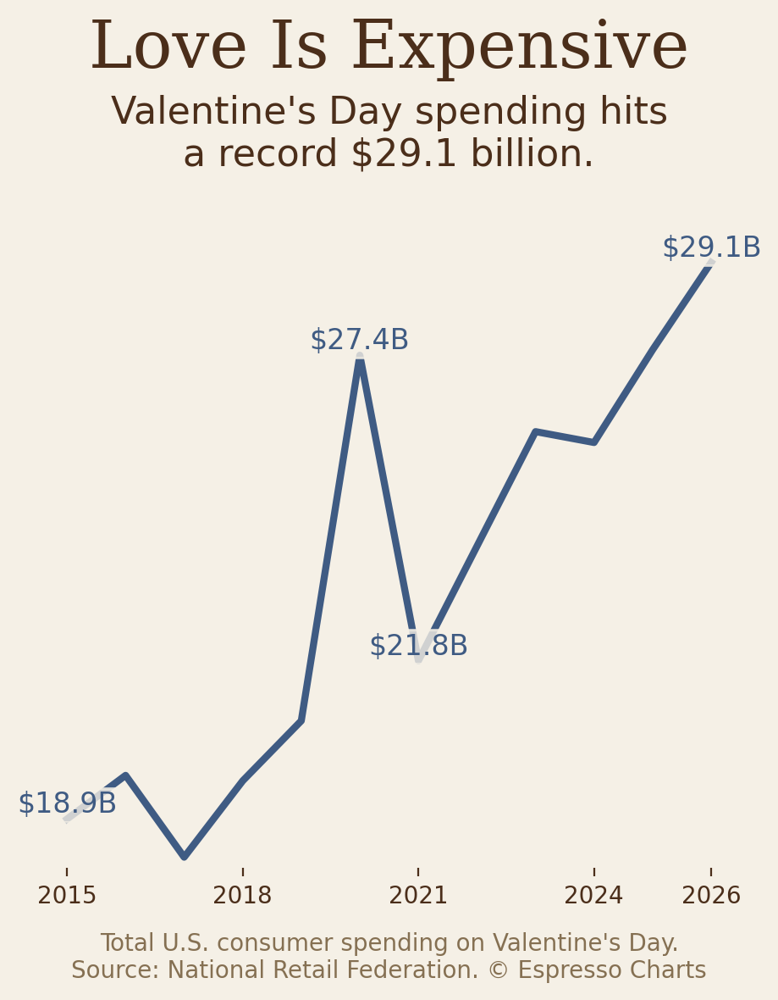

In [ ]:
# --- DATA: Valentine's Day Total Spending (2015-2026) ---
data_vday_spending = {
    'Year': [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026],
    'Spending': [18.9, 19.7, 18.2, 19.6, 20.7, 27.4, 21.8, 23.9, 26.0, 25.8, 27.5, 29.1]
}
df_vday = pd.DataFrame(data_vday_spending)

# --- CHART 1: Line Chart ---
fig1, ax1 = eMultiLineChartInstagram(
    dfChart=df_vday,
    colDim="Year",
    colMeasureList=["Spending"],
    txtTitle="Love Is Expensive",
    txtSup="Valentine's Day spending hits\na record $29.1 billion.",
    txtLabel="Total U.S. consumer spending on Valentine's Day.\nSource: National Retail Federation. © Espresso Charts",
    posText=[0, 5, 6, 11],
    posLabel=None,
    numFormat="${:.1f}B",
    lineColors=[color_blue],
    lineWidths=[3],
    xTicks=[2015, 2018, 2021, 2024, 2026],
    xTicklabels=['2015', '2018', '2021', '2024', '2026'],
    faceColor='#F5F0E6',
    px=1080,
    py=1350,
    dpi=200,
    title_size=28,
    subtitle_size=16,
    titleFontFamily='DejaVu Serif',
    subTitleFontFamily='DejaVu Sans',
    yTicks=[18, 22, 26, 30],
    yNumFormat="${:.0f}B",
    yLimits=(18, 31),
    title_y=1.2,      # Move title UP (higher value = further up)
    subtitle_y=1.09,   # Move subtitle UP
)

save_chart(fig1, "valentines1.png", dpi=200)


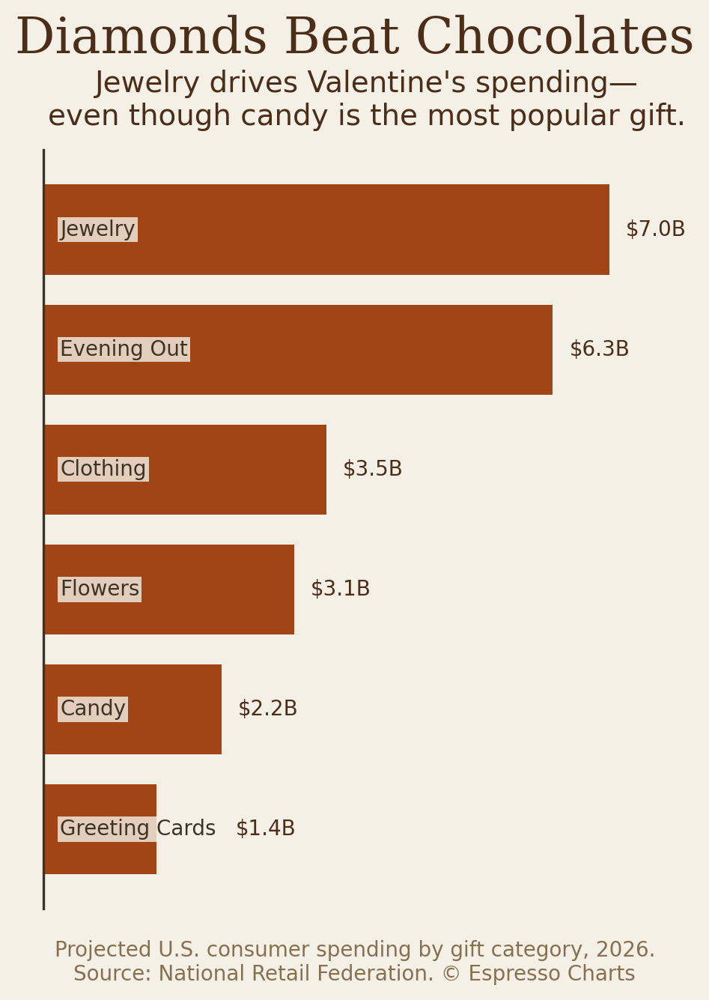

In [ ]:
# --- DATA: Valentine's Day Spending by Category 2026 ---
data_categories = {
    'Category': ['Candy', 'Greeting Cards', 'Flowers', 'Clothing', 'Evening Out', 'Jewelry'],
    'Spending': [2.2, 1.4, 3.1, 3.5, 6.3, 7.0]
}
df_categories = pd.DataFrame(data_categories).sort_values(by='Spending', ascending=True)

# --- CHART 2: Horizontal Bar Chart ---
fig2, ax2 = eSingleBarChartNewInstagram(
    dfChart=df_categories,
    colDim="Category",
    colMeasure="Spending",
    txtTitle="Diamonds Beat Chocolates",
    txtSuptitle="Jewelry drives Valentine's spending—\neven though candy is the most popular gift.",
    txtLabel="Projected U.S. consumer spending by gift category, 2026.\nSource: National Retail Federation. © Espresso Charts",
    numFormat="${:.1f}B",
    barColor=color_orange,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    aspectRatio=None,
    title_size=24,
    titleFont='DejaVu Serif',
    suptitleFont='DejaVu Sans',
    title_pad_custom=65,
    suptitle_y_custom=0.93,
    label_size=10,
    labelCustomOffset={0: 30}
)

save_chart(fig2, "valentines2.png", dpi=200)

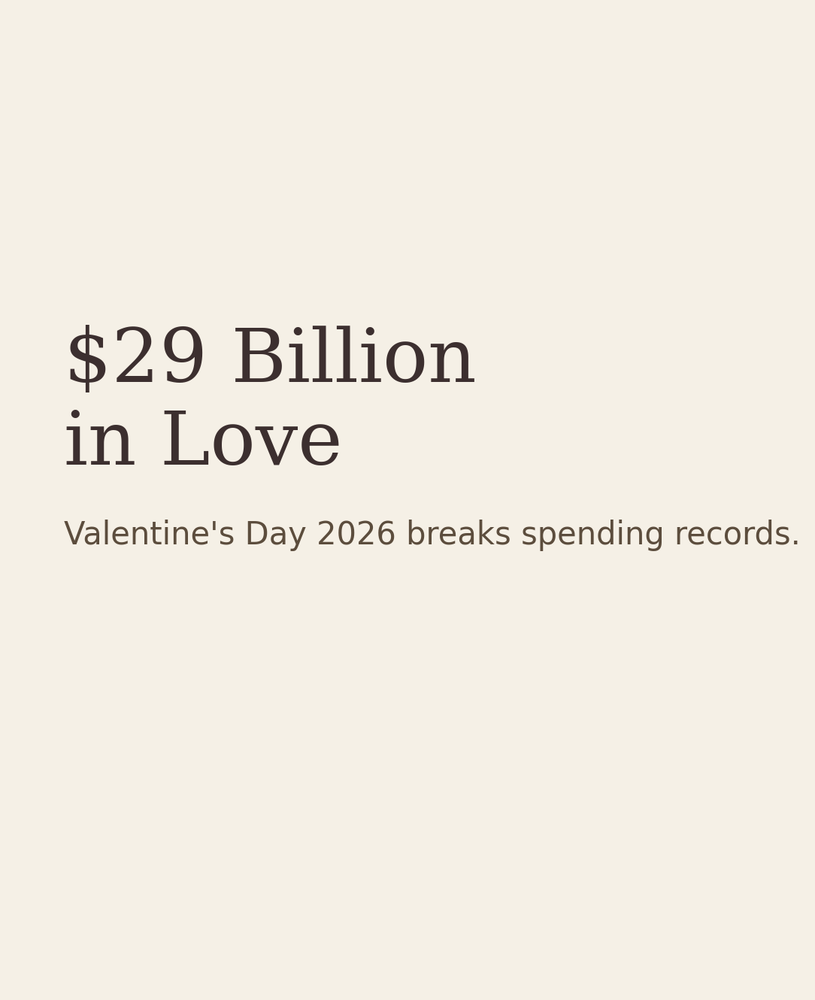

In [ ]:
# --- COVER SLIDE ---
fig_cover, ax_cover = plt.subplots(figsize=(1080/200, 1350/200), dpi=200, facecolor='#F5F0E6')
ax_cover.set_facecolor('#F5F0E6')
ax_cover.set_xlim(0, 10)
ax_cover.set_ylim(0, 12.5)
ax_cover.axis('off')

cover_texts = [
    {
        'text': '$29 Billion\nin Love',
        'xy': (0.8, 8.5),
        'fontsize': 36,
        'color': '#3C2F2F',
        'ha': 'left',
        'va': 'top',
        'fontweight': 'medium',
        'family': 'DejaVu Serif'
    },
    {
        'text': "Valentine's Day 2026 breaks spending records.",
        'xy': (0.8, 6),
        'fontsize': 15,
        'color': '#5C4D3D',
        'ha': 'left',
        'va': 'top',
        'fontweight': 'light',
        'family': 'DejaVu Sans'
    }
]
add_text(ax_cover, cover_texts)
plt.tight_layout()
save_chart(fig_cover, "valentines0.png", dpi=200)

# 2025 02 21 Clean energy

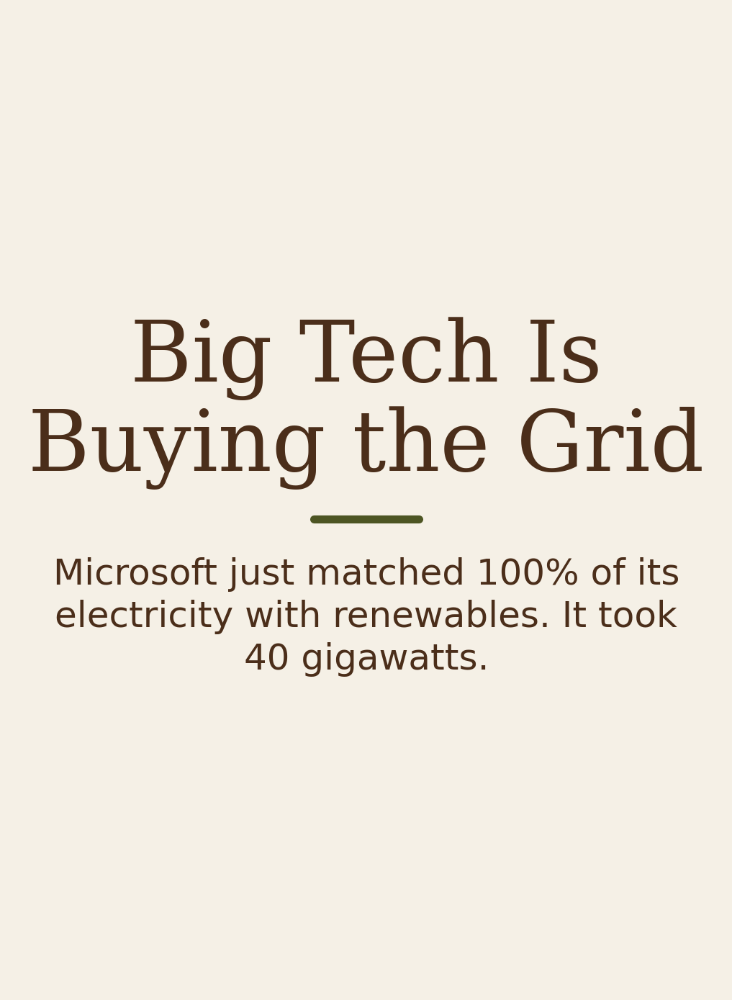

In [ ]:
# ============================================================
# ESPRESSO CHARTS — Big Tech Is Buying the Grid
# Paste directly into the Espresso Charts Colab notebook.
# Only data prep & function calls. No function definitions.
# ============================================================

import pandas as pd

# --- COVER SLIDE (using eCoverTileInstagram) ---
fig_cover, ax_cover = eCoverTileInstagram(
    txtTitle="Big Tech Is\nBuying the Grid",
    txtSup="Microsoft just matched 100% of its\nelectricity with renewables. It took\n40 gigawatts.",
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    title_size=42,
    subtitle_size=18,
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    accent_line_color=color_green,
)
save_chart(fig_cover, "bigtech_energy_cover.png", dpi=200)







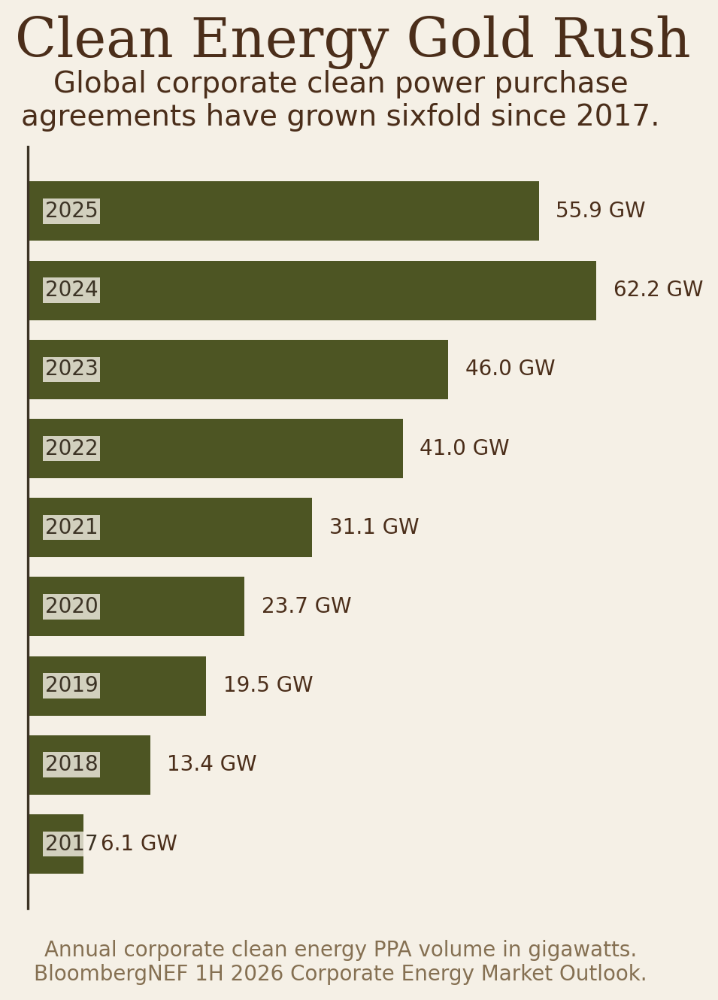

In [ ]:
# --- CHART 1: Corporate Clean Energy Buying Over Time (Bar Chart) ---

data_ppa = {
    'Year': ['2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024', '2025'],
    'GW': [6.1, 13.4, 19.5, 23.7, 31.1, 41.0, 46.0, 62.2, 55.9]
}
df_ppa = pd.DataFrame(data_ppa)

fig1, ax1 = eSingleBarChartNewInstagram(
    dfChart=df_ppa,
    colDim="Year",
    colMeasure="GW",
    txtSuptitle="Clean Energy Gold Rush",
    txtTitle="Global corporate clean power purchase\nagreements have grown sixfold since 2017.",
    txtLabel="Annual corporate clean energy PPA volume in gigawatts.\nBloombergNEF 1H 2026 Corporate Energy Market Outlook.",
    numFormat="{:.1f} GW",
    barColor=color_green,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    aspectRatio=None,
    suptitle_size=26,
    title_size=14,
    label_size=10,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    suptitle_y_custom=0.98,
    title_pad_custom=37,
)
save_chart(fig1, "bigtech_energy_chart1.png", dpi=200)

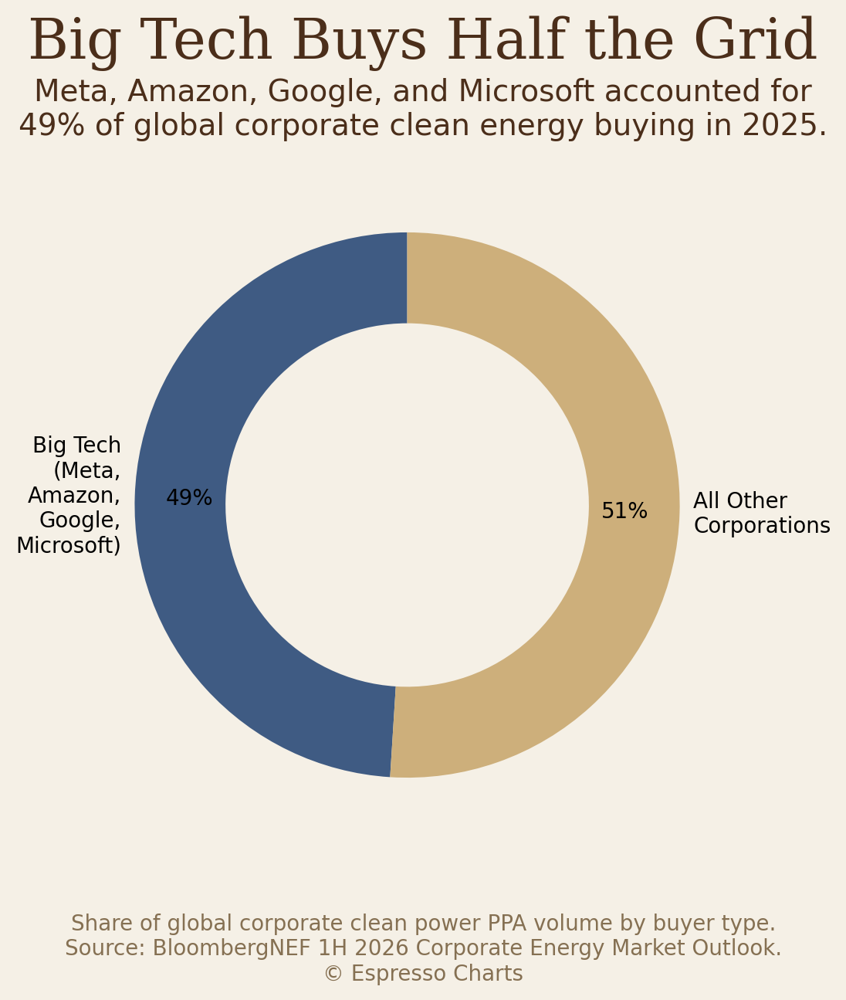

In [ ]:
# --- CHART 2: Who Is Buying All That Clean Power? (Donut Chart) ---

data_buyers = {
    'Buyer': ['Big Tech\n(Meta,\nAmazon,\nGoogle,\nMicrosoft)', 'All Other\nCorporations'],
    'Share': [49, 51]
}
df_buyers = pd.DataFrame(data_buyers)

fig2, ax2 = eDonutChartInstagram(
    dfChart=df_buyers,
    colValue="Share",
    colLabel="Buyer",
    txtTitle="Big Tech Buys Half the Grid",
    txtSup="Meta, Amazon, Google, and Microsoft accounted for\n49% of global corporate clean energy buying in 2025.",
    txtLabel="Share of global corporate clean power PPA volume by buyer type.\nSource: BloombergNEF 1H 2026 Corporate Energy Market Outlook.\n© Espresso Charts",
    numFormat="{:.0f}%",
    faceColor='#F5F0E6',
    title_size=26,
    subtitle_size=14,
    label_size=10,
    instagram=True,
    instagram_format='4x5',
    px=1080,
    dpi=200,
    colors=[color_blue, color_sand],
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
)
save_chart(fig2, "bigtech_energy_chart2.png", dpi=200)


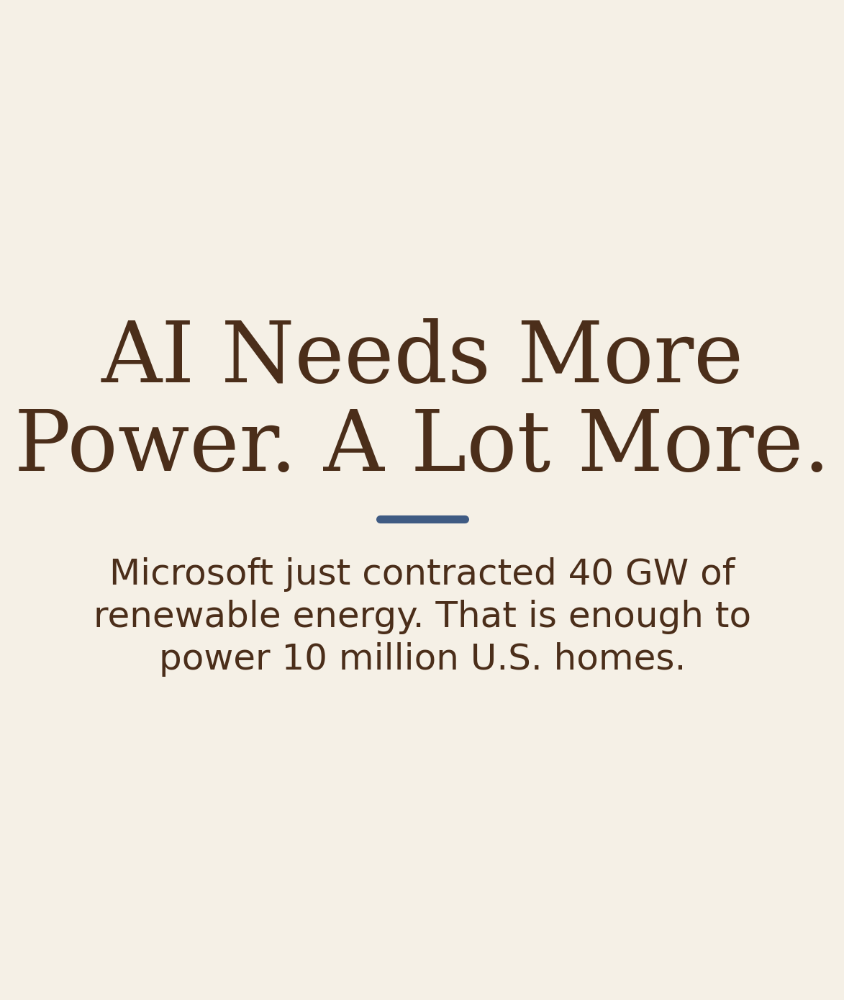

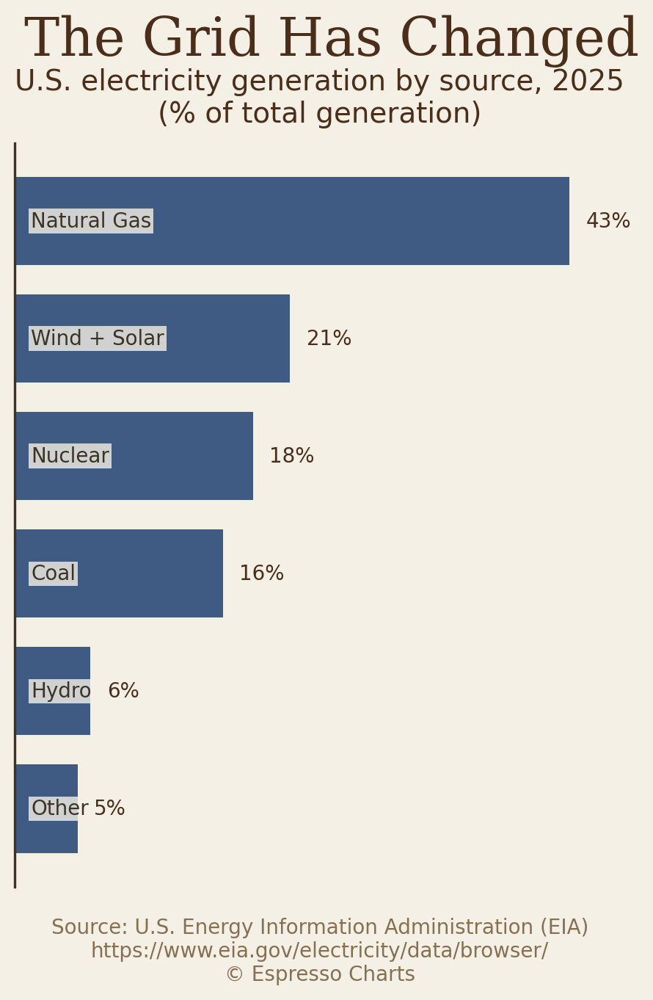

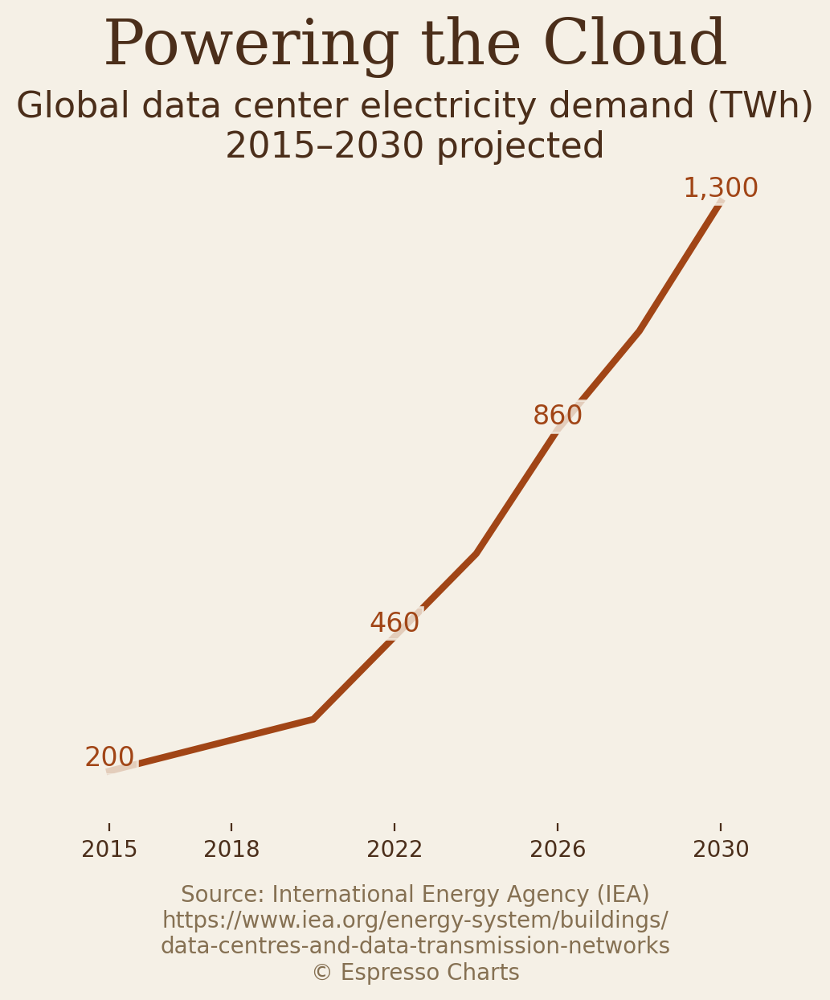

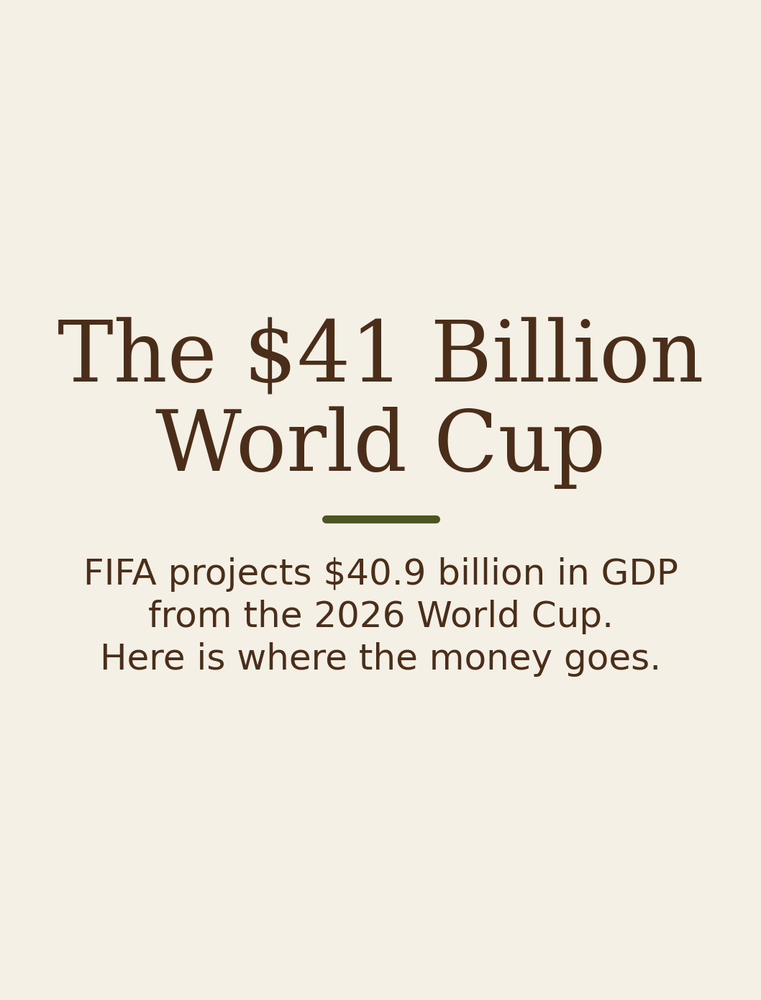

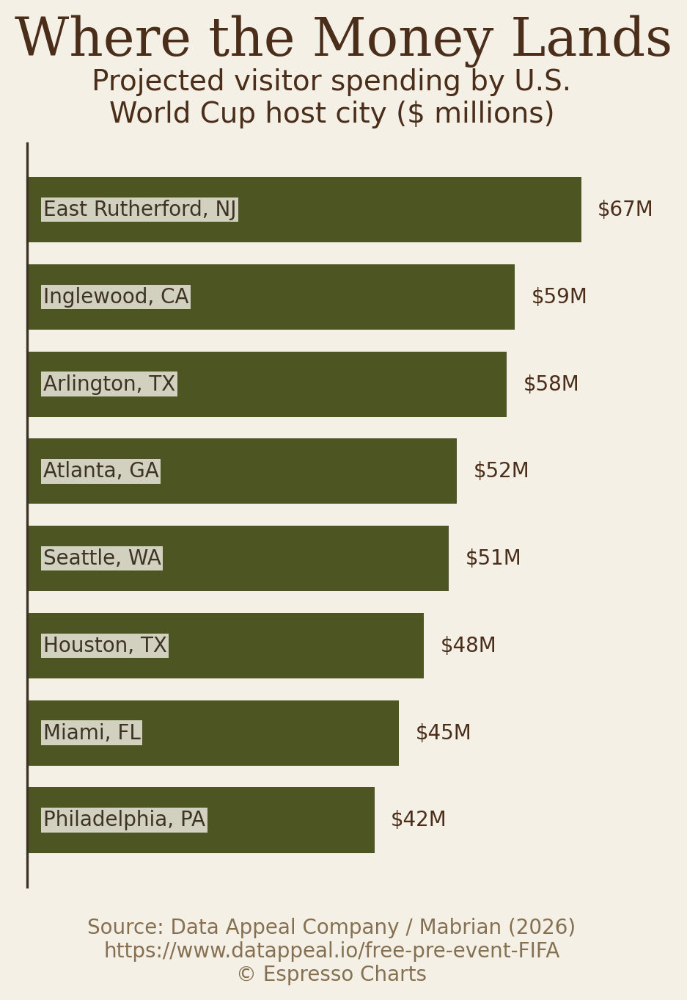

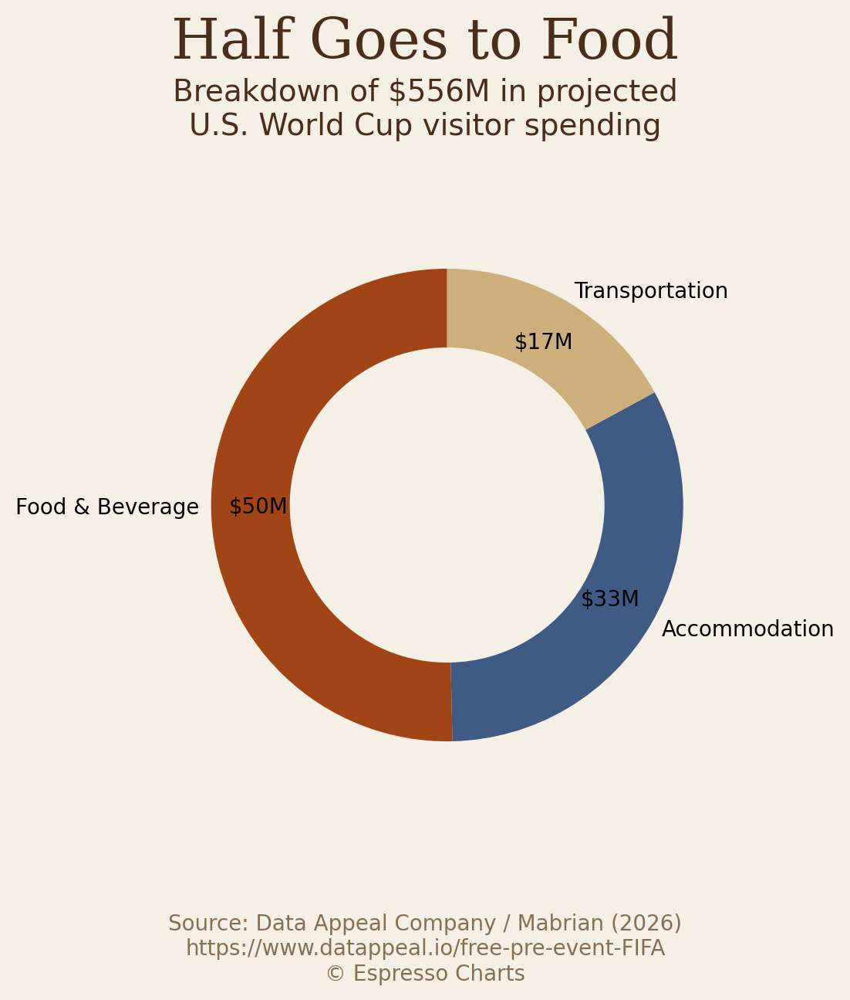

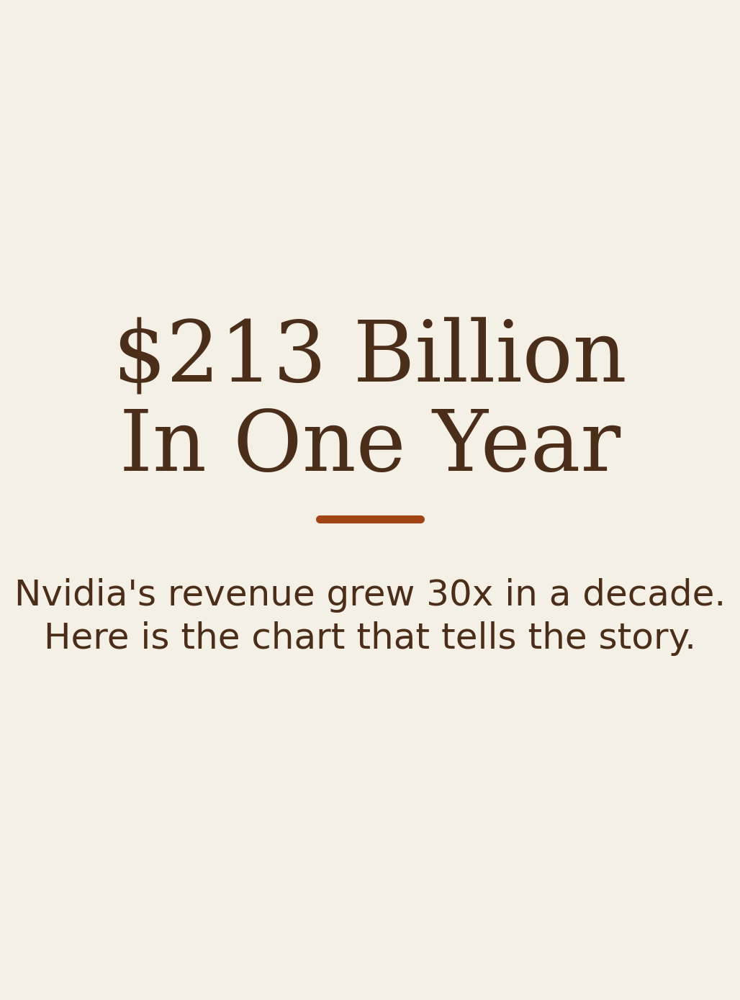

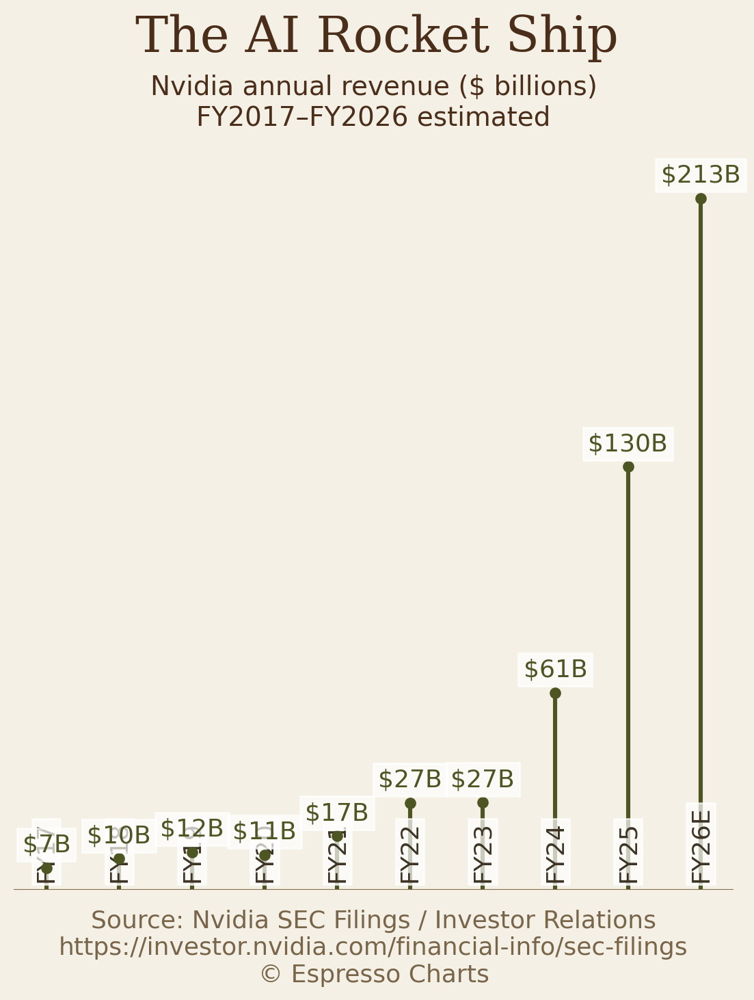

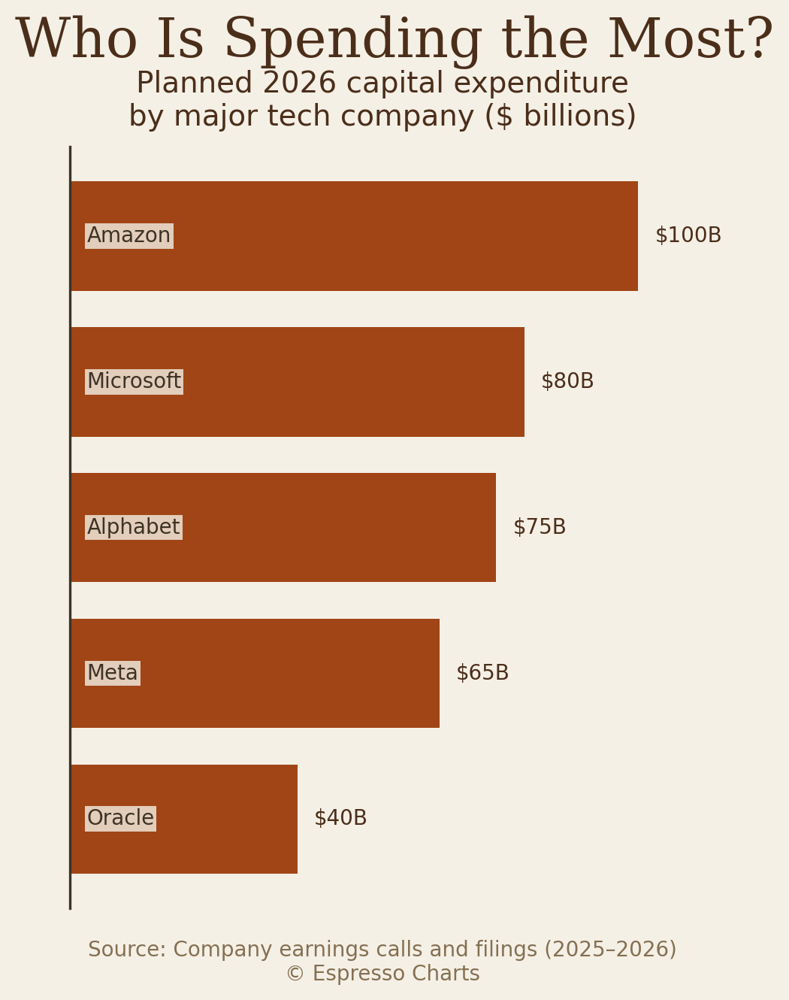

In [ ]:
# ============================================================================
# STORY 1: AI's Power-Hungry Appetite
# ============================================================================

# --- COVER ---
fig_cover1, ax_cover1 = eCoverTileInstagram(
    txtTitle="AI Needs More\nPower. A Lot More.",
    txtSup="Microsoft just contracted 40 GW of\nrenewable energy. That is enough to\npower 10 million U.S. homes.",
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    title_size=42,
    subtitle_size=18,
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    accent_line_color=color_blue,
)
save_chart(fig_cover1, "story1_cover.png", dpi=200)

# --- CHART 1: U.S. Electricity Generation Mix ---
df_grid = pd.DataFrame({
    'Source': ['Other', 'Hydro', 'Coal', 'Nuclear', 'Wind + Solar', 'Natural Gas'],
    'Share': [4.9, 5.9, 16.2, 18.5, 21.4, 43.1]
})

fig1, ax1 = eSingleBarChartNewInstagram(
    dfChart=df_grid,
    colDim='Source',
    colMeasure='Share',
    txtSuptitle="The Grid Has Changed",
    txtTitle="U.S. electricity generation by source, 2025\n(% of total generation)",
    txtLabel="Source: U.S. Energy Information Administration (EIA)\nhttps://www.eia.gov/electricity/data/browser/\n© Espresso Charts",
    numFormat="{:.0f}%",
    barColor=color_blue,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    aspectRatio=None,
    suptitle_size=26,
    title_size=14,
    label_size=10,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    suptitle_y_custom=0.98,
    title_pad_custom=37,
)
save_chart(fig1, "story1_chart1_grid.png", dpi=200)

# --- CHART 2: Global Data Center Electricity Demand ---
df_dc = pd.DataFrame({
    'Year': [2015, 2018, 2020, 2022, 2024, 2026, 2028, 2030],
    'TWh': [200, 260, 300, 460, 620, 860, 1050, 1300]
})

fig2, ax2 = eMultiLineChartInstagram(
    dfChart=df_dc,
    colDim='Year',
    colMeasureList=['TWh'],
    txtTitle="Powering the Cloud",
    txtSup="Global data center electricity demand (TWh)\n2015–2030 projected",
    txtLabel="Source: International Energy Agency (IEA)\nhttps://www.iea.org/energy-system/buildings/\ndata-centres-and-data-transmission-networks\n© Espresso Charts",
    posText=[0, 3, 5, 7],
    posLabel=None,
    numFormat="{:,.0f}",
    lineColors=[color_orange],
    lineWidths=[3],
    xTicks=[2015, 2018, 2022, 2026, 2030],
    xTicklabels=['2015', '2018', '2022', '2026', '2030'],
    faceColor='#F5F0E6',
    px=1080,
    py=1350,
    dpi=200,
    title_size=28,
    subtitle_size=16,
    titleFontFamily='DejaVu Serif',
    subTitleFontFamily='DejaVu Sans',
    yTicks=[200, 600, 1000, 1400],
    yNumFormat="{:,.0f}",
    yLimits=(100, 1400),
    title_y=1.2,
    subtitle_y=1.09,
)
save_chart(fig2, "story1_chart2_demand.png", dpi=200)


# ============================================================================
# STORY 2: The $41 Billion World Cup
# ============================================================================

# --- COVER ---
fig_cover2, ax_cover2 = eCoverTileInstagram(
    txtTitle="The $41 Billion\nWorld Cup",
    txtSup="FIFA projects $40.9 billion in GDP\nfrom the 2026 World Cup.\nHere is where the money goes.",
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    title_size=42,
    subtitle_size=18,
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    accent_line_color=color_green,
)
save_chart(fig_cover2, "story2_cover.png", dpi=200)

# --- CHART 1: Visitor Spending by Host City ---
df_wc = pd.DataFrame({
    'City': ['Philadelphia, PA', 'Miami, FL', 'Houston, TX',
             'Seattle, WA', 'Atlanta, GA', 'Arlington, TX',
             'Inglewood, CA', 'East Rutherford, NJ'],
    'Spending_M': [42, 45, 48, 51, 52, 58, 59, 67]
})

fig1, ax1 = eSingleBarChartNewInstagram(
    dfChart=df_wc,
    colDim='City',
    colMeasure='Spending_M',
    txtSuptitle="Where the Money Lands",
    txtTitle="Projected visitor spending by U.S.\nWorld Cup host city ($ millions)",
    txtLabel="Source: Data Appeal Company / Mabrian (2026)\nhttps://www.datappeal.io/free-pre-event-FIFA\n© Espresso Charts",
    numFormat="${:,.0f}M",
    barColor=color_green,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    aspectRatio=None,
    suptitle_size=26,
    title_size=14,
    label_size=10,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    suptitle_y_custom=0.98,
    title_pad_custom=37,
)
save_chart(fig1, "story2_chart1_cities.png", dpi=200)

# --- CHART 2: Spending Category Breakdown ---
df_spend = pd.DataFrame({
    'Category': ['Food & Beverage', 'Accommodation', 'Transportation'],
    'Amount_M': [280, 181, 95]
})

fig2, ax2 = eDonutChartInstagram(
    dfChart=df_spend,
    colValue='Amount_M',
    colLabel='Category',
    txtTitle="Half Goes to Food",
    txtSup="Breakdown of $556M in projected\nU.S. World Cup visitor spending",
    txtLabel="Source: Data Appeal Company / Mabrian (2026)\nhttps://www.datappeal.io/free-pre-event-FIFA\n© Espresso Charts",
    numFormat="${:,.0f}M",
    faceColor='#F5F0E6',
    title_size=26,
    subtitle_size=14,
    label_size=10,
    instagram=True,
    instagram_format='4x5',
    px=1080,
    dpi=200,
    colors=[color_orange, color_blue, color_sand],
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
)
save_chart(fig2, "story2_chart2_spending.png", dpi=200)


# ============================================================================
# STORY 3: Nvidia's $213 Billion Year
# ============================================================================

# --- COVER ---
fig_cover3, ax_cover3 = eCoverTileInstagram(
    txtTitle="$213 Billion\nIn One Year",
    txtSup="Nvidia's revenue grew 30x in a decade.\nHere is the chart that tells the story.",
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    title_size=42,
    subtitle_size=18,
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    accent_line_color=color_orange,
)
save_chart(fig_cover3, "story3_cover.png", dpi=200)

# --- CHART 1: Nvidia Annual Revenue ---
df_nvda = pd.DataFrame({
    'Fiscal Year': ['FY26E', 'FY25', 'FY24', 'FY23', 'FY22',
                    'FY21', 'FY20', 'FY19', 'FY18', 'FY17'],
    'Revenue_B': [213.3, 130.5, 60.9, 27.0, 26.9, 16.7, 10.9, 11.7, 9.7, 6.9]
})

# --- CHART 1: Nvidia Annual Revenue (Stem) ---
df_nvda = pd.DataFrame({
    'Fiscal Year': ['FY17', 'FY18', 'FY19', 'FY20', 'FY21',
                    'FY22', 'FY23', 'FY24', 'FY25', 'FY26E'],
    'Revenue_B': [6.9, 9.7, 11.7, 10.9, 16.7, 26.9, 27.0, 60.9, 130.5, 213.3]
})

fig1, ax1 = eStemChartNewInstagram(
    dfChart=df_nvda,
    colDim='Fiscal Year',
    colMeasureA='Revenue_B',
    txtTitle="The AI Rocket Ship",
    txtSup="Nvidia annual revenue ($ billions)\nFY2017–FY2026 estimated",
    txtLabel="Source: Nvidia SEC Filings / Investor Relations\nhttps://investor.nvidia.com/financial-info/sec-filings\n© Espresso Charts",
    numFormat="${:.0f}B",
    colorA=color_green,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    rotateLabels=True,
    yMin=0,
    yMax=230,
    suptitle_y=1.06,
    title_pad=10,
    labelpad=10,
    title_size=26,
    subtitle_size=14,
    label_size=13,
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    offset=0,
    xTickLabelYOffset=0.02,
    markerSize=5,
    lineWidth=2.2,
    lineFormatA="-"
)
save_chart(fig1, "story3_chart1_nvidia.png", dpi=200)

# --- CHART 2: Hyperscaler Capex Plans ---
df_capex = pd.DataFrame({
    'Company': ['Oracle', 'Meta', 'Alphabet', 'Microsoft', 'Amazon'],
    'Capex_B': [40, 65, 75, 80, 100]
})

fig2, ax2 = eSingleBarChartNewInstagram(
    dfChart=df_capex,
    colDim='Company',
    colMeasure='Capex_B',
    txtSuptitle="Who Is Spending the Most?",
    txtTitle="Planned 2026 capital expenditure\nby major tech company ($ billions)",
    txtLabel="Source: Company earnings calls and filings (2025–2026)\n© Espresso Charts",
    numFormat="${:,.0f}B",
    barColor=color_orange,
    faceColor='#F5F0E6',
    instagram=True,
    px_width=1080,
    px_height=1350,
    dpi=200,
    aspectRatio=None,
    suptitle_size=26,
    title_size=14,
    label_size=10,
    suptitleFont='DejaVu Serif',
    titleFont='DejaVu Sans',
    suptitle_y_custom=0.98,
    title_pad_custom=37,
)
save_chart(fig2, "story3_chart2_capex.png", dpi=200)

# Next


✅ Saved animated bar chart → valentines_bar_animated.mp4


(<Figure size 1080x1350 with 1 Axes>,
 <Axes: title={'center': "Jewelry drives Valentine's spending."}, xlabel='Source: NRF. © Espresso Charts'>)

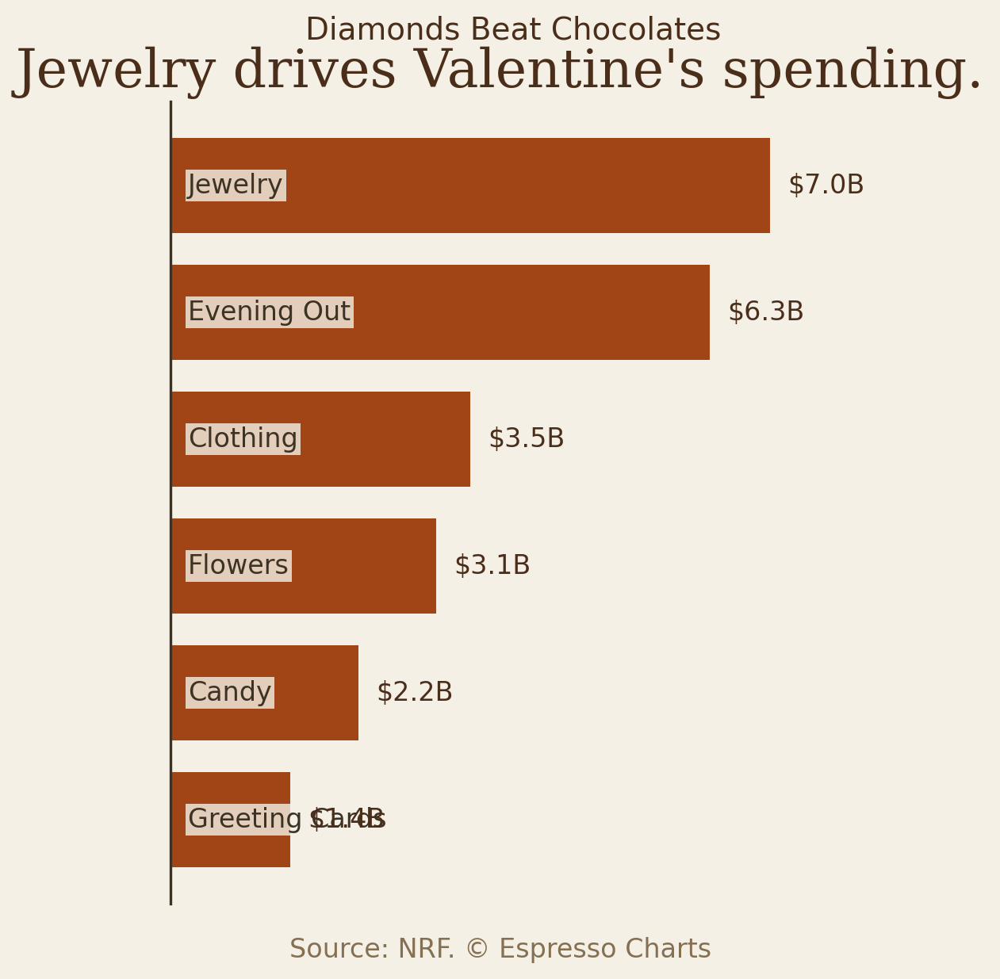

In [ ]:

eSingleBarChartAnimateInstagram(
    df_categories,
    colDim="Category",
    colMeasure="Spending",
    txtSuptitle="Diamonds Beat Chocolates",
    txtTitle="Jewelry drives Valentine's spending.",
    txtLabel="Source: NRF. © Espresso Charts",
    numFormat="${:.1f}B",
    barColor=color_orange,
    faceColor='#F5F0E6',
    title_size=24,
    titleFont='DejaVu Serif',
    output_file="valentines_bar_animated.mp4"
)

✅ Saved animated bar chart → valentines_bar_animated.mp4
✅ Saved animated line chart → valentines_line_animated.mp4


NameError: name 'df_stem' is not defined

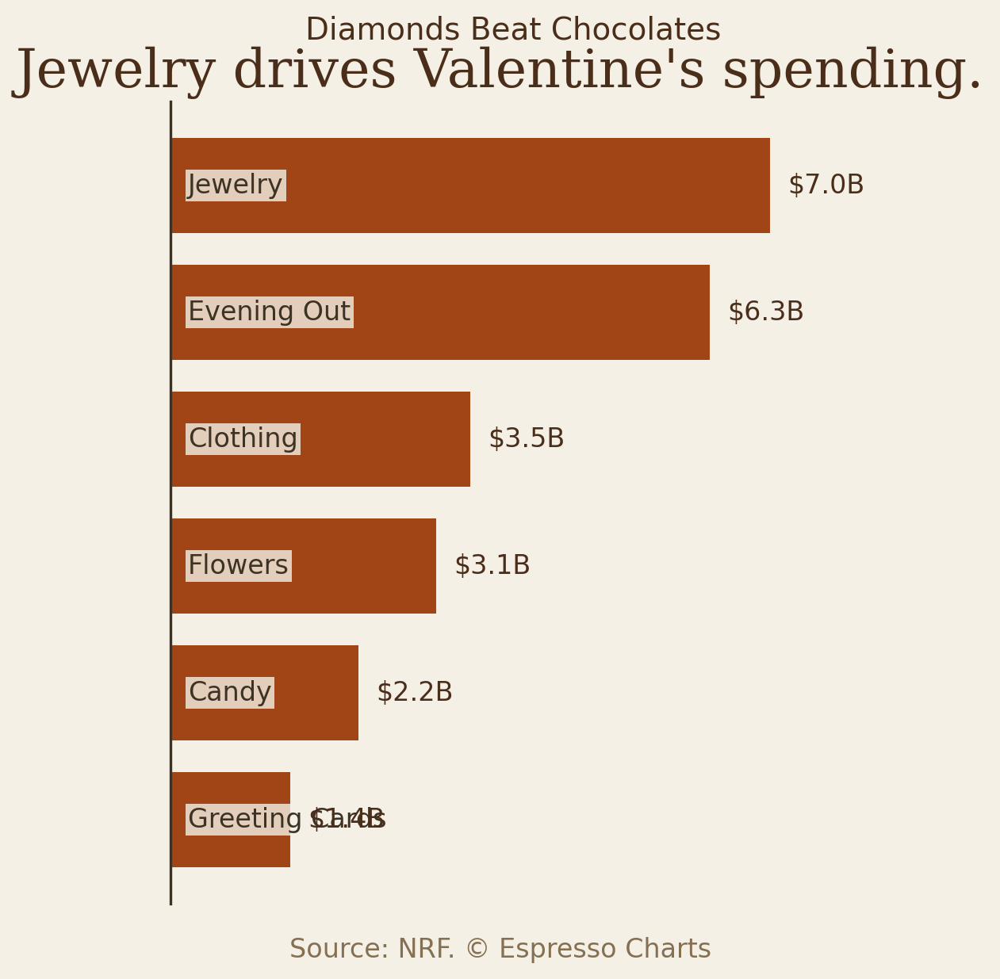

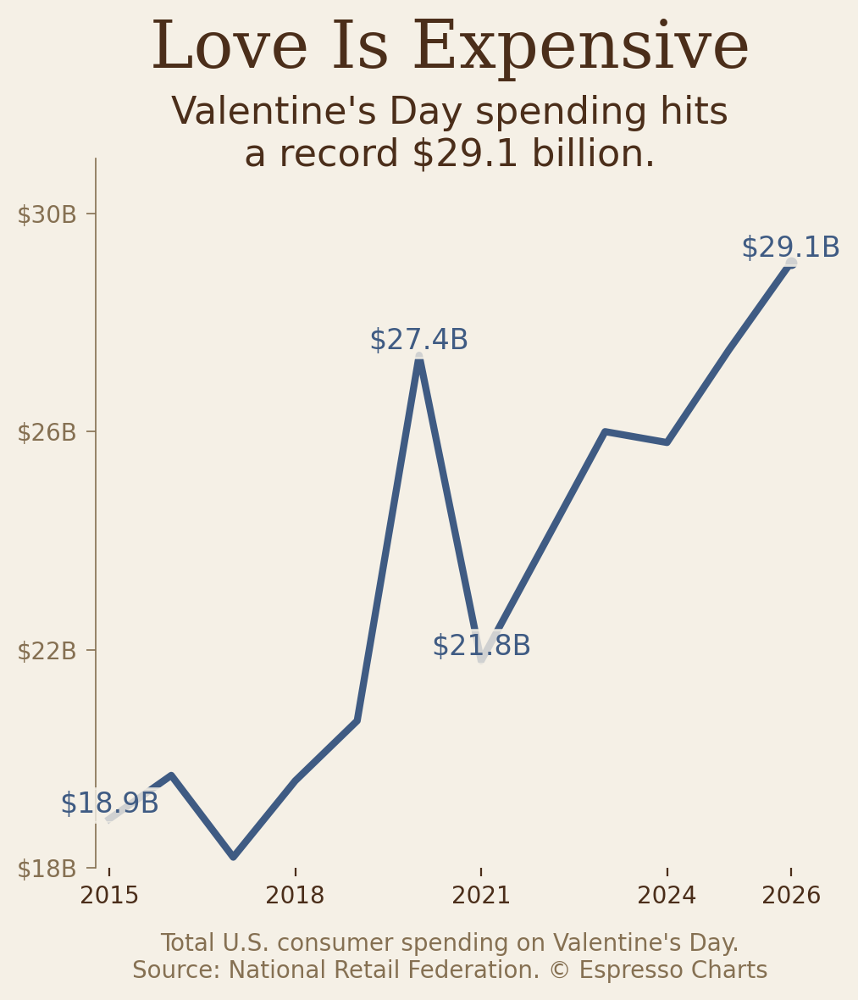

In [ ]:
# --- ANIMATED BAR CHART ---
eSingleBarChartAnimateInstagram(
    df_categories,
    colDim="Category",
    colMeasure="Spending",
    txtSuptitle="Diamonds Beat Chocolates",
    txtTitle="Jewelry drives Valentine's spending.",
    txtLabel="Source: NRF. © Espresso Charts",
    numFormat="${:.1f}B",
    barColor=color_orange,
    faceColor='#F5F0E6',
    title_size=24,
    titleFont='DejaVu Serif',
    output_file="valentines_bar_animated.mp4"
)


# --- ANIMATED MULTI-LINE CHART ---
eMultiLineChartAnimateInstagram(
    dfChart=df_vday,
    colDim="Year",
    colMeasureList=["Spending"],
    txtTitle="Love Is Expensive",
    txtSup="Valentine's Day spending hits\na record $29.1 billion.",
    txtLabel="Total U.S. consumer spending on Valentine's Day.\nSource: National Retail Federation. © Espresso Charts",
    posText=[0, 5, 6, 11],
    posLabel=None,
    numFormat="${:.1f}B",
    lineColors=[color_blue],
    lineWidths=[3],
    xTicks=[2015, 2018, 2021, 2024, 2026],
    xTicklabels=['2015', '2018', '2021', '2024', '2026'],
    faceColor='#F5F0E6',
    px=1080,
    py=1350,
    dpi=200,
    title_size=28,
    subtitle_size=16,
    titleFontFamily='DejaVu Serif',
    subTitleFontFamily='DejaVu Sans',
    yTicks=[18, 22, 26, 30],
    yNumFormat="${:.0f}B",
    yLimits=(18, 31),
    showYAxis=True,
    title_y=1.2,
    subtitle_y=1.09,
    output_file="valentines_line_animated.mp4"
)


# --- ANIMATED STEM CHART ---
eStemChartAnimateInstagram(
    dfChart=df_stem,
    colDim="Country",
    colMeasureA="Change_2023",
    colMeasureB="Change_2024",
    txtTitle="Inflation Shifts",
    txtSup="Year-over-year change in consumer prices\nacross major economies.",
    txtLabel="Percentage point change in CPI.\nSource: OECD. © Espresso Charts",
    numFormat="{:+.1f}",
    colorA=color_sand,
    colorB=color_blue,
    yearLabelA="2023",
    yearLabelB="2024",
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    title_size=26,
    subtitle_size=14,
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    output_file="inflation_stem_animated.mp4"
)


# --- ANIMATED DONUT CHART ---
eDonutChartAnimateInstagram(
    dfChart=df_buyers,
    colValue="Share",
    colLabel="Buyer",
    txtTitle="Half of All Clean Energy\nDeals Go to Big Tech",
    txtSup="Meta, Amazon, Google, and Microsoft accounted for\n49% of global corporate clean energy buying in 2025.",
    txtLabel="Share of global corporate clean power PPA volume by buyer type.\nSource: BloombergNEF. © Espresso Charts",
    numFormat="{:.0f}%",
    faceColor='#F5F0E6',
    title_size=26,
    instagram=True,
    px=1080,
    dpi=200,
    colors=[color_blue, color_sand],
    titleFont="DejaVu Serif",
    output_file="clean_energy_donut_animated.mp4"
)

✅ Saved animated stem chart → inflation_stem_animated.mp4


(<Figure size 1080x1350 with 1 Axes>,
 <Axes: title={'center': 'Year-over-year change in consumer prices\nacross major economies.'}, xlabel='Percentage point change in CPI.\nSource: OECD. © Espresso Charts'>)

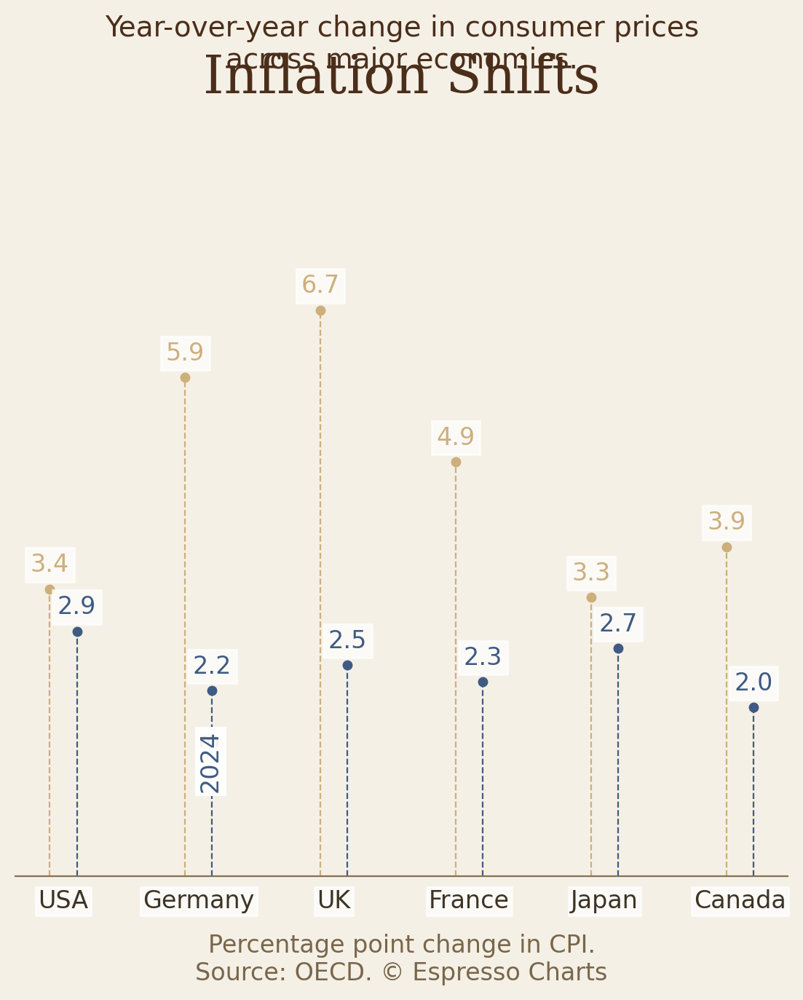

In [ ]:
# --- ANIMATED STEM CHART ---
df_stem = pd.DataFrame({
    'Country': ['USA', 'Germany', 'UK', 'France', 'Japan', 'Canada'],
    'Change_2023': [3.4, 5.9, 6.7, 4.9, 3.3, 3.9],
    'Change_2024': [2.9, 2.2, 2.5, 2.3, 2.7, 2.0]
})

eStemChartAnimateInstagram(
    dfChart=df_stem,
    colDim="Country",
    colMeasureA="Change_2023",
    colMeasureB="Change_2024",
    txtTitle="Inflation Shifts",
    txtSup="Year-over-year change in consumer prices\nacross major economies.",
    txtLabel="Percentage point change in CPI.\nSource: OECD. © Espresso Charts",
    numFormat="{:.1f}",
    colorA=color_sand,
    colorB=color_blue,
    yearLabelA="2023",
    yearLabelB="2024",
    faceColor='#F5F0E6',
    px_width=1080,
    px_height=1350,
    dpi=200,
    title_size=26,
    subtitle_size=14,
    titleFont='DejaVu Serif',
    subTitleFont='DejaVu Sans',
    output_file="inflation_stem_animated.mp4"
)